<div style="direction:rtl">
 فراخوانی کتاب خانه های مورد نیاز . تک تک این کتابخونه ها باید نصب شوند. برای نصب پای اسپارک باید حتما هدوپ رو اول نصب کرده باشید. در غیر این صورت ممکن نتونید اجراش کنید
</div>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn
from numpy import array
from math import sqrt
import findspark
findspark.init('/home/raminm/spark-2.1.1-bin-hadoop2.7')
import pyspark
from pyspark.mllib.clustering import KMeans, KMeansModel

<div style="direction:rtl">
ایجاد یک جلسه از پای اسپارک و نام گذاری برای برنامه آن
</div>

In [2]:
from pyspark.sql import SparkSession

In [3]:
spark = SparkSession.builder.appName('clustering').getOrCreate()

<div style="direction:rtl">
خواندن فایل های مربوط به بیماری ها که مرتبط با هر یک از ایالت ها می باشند
</div>

In [4]:
ass = spark.read.csv("./cleaned data/AS.csv", header=True, inferSchema=True)
mp = spark.read.csv("./cleaned data/MP.csv", header=True, inferSchema=True)
up = spark.read.csv("./cleaned data/UP.csv", header=True, inferSchema=True)
jh = spark.read.csv("./cleaned data/JH.csv", header=True, inferSchema=True)
rj = spark.read.csv("./cleaned data/RJ.csv", header=True, inferSchema=True)
bh = spark.read.csv("./cleaned data/BH.csv", header=True, inferSchema=True)
cg = spark.read.csv("./cleaned data/CG.csv", header=True, inferSchema=True)
od = spark.read.csv("./cleaned data/OD.csv", header=True, inferSchema=True)
ut = spark.read.csv("./cleaned data/UT.csv", header=True, inferSchema=True)
#ass_d = spark.read.csv("./cleaned data/AS_d.csv", header=True, inferSchema=True)
#mp_d = spark.read.csv("./cleaned data/MP_d.csv", header=True, inferSchema=True)
#up_d = spark.read.csv("./cleaned data/UP_d.csv", header=True, inferSchema=True)
#jh_d = spark.read.csv("./cleaned data/JH_d.csv", header=True, inferSchema=True)
#rj_d = spark.read.csv("./cleaned data/RJ_d.csv", header=True, inferSchema=True)
#bh_d = spark.read.csv("./cleaned data/BH_d.csv", header=True, inferSchema=True)
#cg_d = spark.read.csv("./cleaned data/CG_d.csv", header=True, inferSchema=True)
#od_d = spark.read.csv("./cleaned data/OD_d.csv", header=True, inferSchema=True)
#ut_d = spark.read.csv("./cleaned data/UT_d.csv", header=True, inferSchema=True)


<div style="direction:rtl">
ترکیب این فایل ها و رسیدن به یک فایل مجتمع از کل آن ها
</div>

In [5]:
df_concat = ass.union(mp.union(up.union(jh.union(rj.union(bh.union(cg.union(od.union(ut))))))))

In [6]:
df_concat.show(5)

+----------+------------------+---+---+-----------------+----------------+-----------------+--------------------+---------------------+-------------------------------+-----------+--------------+----------------------+-----------+-----------------------+------------+
|state_code|record_code_iodine|sex|age|     weight_in_kg|length_height_cm|haemoglobin_level|first_breast_feeding|is_cur_breast_feeding|day_or_month_for_breast_feeding|water_month|ani_milk_month|semisolid_month_or_day|solid_month|vegetables_month_or_day|illness_type|
+----------+------------------+---+---+-----------------+----------------+-----------------+--------------------+---------------------+-------------------------------+-----------+--------------+----------------------+-----------+-----------------------+------------+
|      18.0|                 3|  1|5.0|              5.0|       59.200001|              9.0|                 1.0|                  1.0|                            5.0|        0.0|           0.0|     

<div style="direction:rtl">
به دلیل زیاد بودن ابعاد ورودی قبل از اجرای k means برروی آن. داده ها را به صورت یک برداد استاندارد تبدیل می کنند.  این بردار نمایش ویژگی های مربوط به هریک از فیلدهای موجود در دیتاست است.
</div>

In [7]:
from pyspark.ml.feature import StandardScaler
from pyspark.ml.linalg import Vectors
from pyspark.ml.feature import VectorAssembler

<div style="direction:rtl">
نمایش اطلاعات آماری دیتاست 
</div>

In [8]:
df_concat.describe().toPandas().transpose()

,0,1,2,3,4
summary,count,mean,stddev,min,max
state_code,120969,14.012912399044383,6.165466506318247,5.0,23.0
record_code_iodine,120969,2.754019624862568,0.5220060451137156,1,3
sex,120969,1.4745678644942093,0.4993548515825768,1,2
age,120969,28.333192801461532,16.354565523504537,0.0,324.0
weight_in_kg,120969,10.723201875016104,4.8222989542472,1.0,609.2000099999999
length_height_cm,120969,83.56522880541996,14.880242824921023,16.799999,205.3
haemoglobin_level,120969,9.048010155063364,1.769596549631636,3.0,18.0
first_breast_feeding,120969,1.4180492522877761,0.6241575981662638,1.0,5.0
is_cur_breast_feeding,120969,1.6636080318098025,0.4732808775158675,1.0,11.0


In [9]:
df_concat.count()

120969

<div style="direction:rtl">
حذف نمونه های که مقداری برابر null دارند که به آن ها داده های از دست رفته یا missing value نیز گفته می شوند.
</div>

In [10]:
Before=df_concat.count()
df_councat=df_concat.na.drop()
after=df_concat.count()
Before-after

0

<div style="direction:rtl">
نمایش تمامی ستون ها داده ها
</div>

In [11]:
df_concat.columns

['state_code',
 'record_code_iodine',
 'sex',
 'age',
 'weight_in_kg',
 'length_height_cm',
 'haemoglobin_level',
 'first_breast_feeding',
 'is_cur_breast_feeding',
 'day_or_month_for_breast_feeding',
 'water_month',
 'ani_milk_month',
 'semisolid_month_or_day',
 'solid_month',
 'vegetables_month_or_day',
 'illness_type']

<div style="direction:rtl">
هدف از این کد تبدیل ویژگی های متنی به عددی می باشد.
</div>

In [12]:
cols = ['state_code', 'record_code_iodine', 'sex', 'age', 'weight_in_kg',
       'length_height_cm', 'haemoglobin_level', 'first_breast_feeding',
       'is_cur_breast_feeding', 'day_or_month_for_breast_feeding',
       'water_month', 'ani_milk_month', 'semisolid_month_or_day',
       'solid_month', 'vegetables_month_or_day']
assembler = VectorAssembler(inputCols=cols, outputCol='features')
assembled_data = assembler.transform(df_concat)

<div style="direction:rtl">
 برای نرمال سازی داده ها از کد زیر استفاده می کنند. به دلیل این که مقیاس اندازه گیری داده ها متفاوت است. باید تمامی آن ها در یک بازه مساوی قرار گیرند برای این منظور می توان مقیاس آن ها را بر حسب انحراف معیار و میانگین تغییر داد
</div>

X-mean/std

In [13]:
# Feature scaling
scaler = StandardScaler(inputCol='features', outputCol='scaledFeatures',withStd=True,withMean=True)
scaler_model = scaler.fit(assembled_data)
scaled_data = scaler_model.transform(assembled_data)

<div style="direction:rtl">
نمایش شمای کلی از دیتاست پس از تغییر مقیاس
</div>

In [14]:
scaled_data.printSchema()



root
 |-- state_code: double (nullable = true)
 |-- record_code_iodine: integer (nullable = true)
 |-- sex: integer (nullable = true)
 |-- age: double (nullable = true)
 |-- weight_in_kg: double (nullable = true)
 |-- length_height_cm: double (nullable = true)
 |-- haemoglobin_level: double (nullable = true)
 |-- first_breast_feeding: double (nullable = true)
 |-- is_cur_breast_feeding: double (nullable = true)
 |-- day_or_month_for_breast_feeding: double (nullable = true)
 |-- water_month: double (nullable = true)
 |-- ani_milk_month: double (nullable = true)
 |-- semisolid_month_or_day: double (nullable = true)
 |-- solid_month: double (nullable = true)
 |-- vegetables_month_or_day: double (nullable = true)
 |-- illness_type: double (nullable = true)
 |-- features: vector (nullable = true)
 |-- scaledFeatures: vector (nullable = true)



<div style="direction:rtl">
انتخاب ستونی از داده ها که می خواهیم روی آن خوشه بندی انجام بدهیم
</div>

In [17]:
cluster_data = scaled_data.select('scaledFeatures')

In [18]:
cluster_data.printSchema()

root
 |-- scaledFeatures: vector (nullable = true)



<div style="direction:rtl">
فراخوانی k means جهت خوشه بندی
</div>

In [19]:
from pyspark.ml.clustering import KMeans

<div style="direction:rtl">
اجرای k means بر روی داده ها با تعداد خوشه های ۲ تا ۳۰
</div>

In [20]:
from datetime import datetime
start_time = datetime.now()


cost={}
for i in range(2,31):
    k_means= KMeans(featuresCol='scaledFeatures', k=i)
    model_k = k_means.fit(cluster_data)
    wssse= model_k.computeCost(cluster_data)
    print("K = "+str(i)+": Within Set Sum of Squared Errors = " + str(wssse))
    cost[i]=wssse
    
end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))    


K = 2: Within Set Sum of Squared Errors = 1514334.7025093844
K = 3: Within Set Sum of Squared Errors = 1344993.5612240196
K = 4: Within Set Sum of Squared Errors = 1254505.8232111996
K = 5: Within Set Sum of Squared Errors = 1209880.3367428025
K = 6: Within Set Sum of Squared Errors = 1151373.1970647606
K = 7: Within Set Sum of Squared Errors = 1106801.007842016
K = 8: Within Set Sum of Squared Errors = 1061695.5193764002
K = 9: Within Set Sum of Squared Errors = 1010702.2119365612
K = 10: Within Set Sum of Squared Errors = 981579.1252794057
K = 11: Within Set Sum of Squared Errors = 959390.6581971287
K = 12: Within Set Sum of Squared Errors = 971652.1936998287
K = 13: Within Set Sum of Squared Errors = 919294.9821683653
K = 14: Within Set Sum of Squared Errors = 919132.8413129875
K = 15: Within Set Sum of Squared Errors = 884975.1769316621
K = 16: Within Set Sum of Squared Errors = 878168.6177328981
K = 17: Within Set Sum of Squared Errors = 829566.6441270642
K = 18: Within Set Sum of

<div style="direction:rtl">
نحوه اجرای مدل خوشه بندی و پیش بینی برای یک نمونه

</div>

In [21]:
prediction = model_k.transform(cluster_data).select('prediction').collect()
labels = [p.prediction for p in prediction ]

In [22]:
cost

{2: 1514334.7025093844,
 3: 1344993.5612240196,
 4: 1254505.8232111996,
 5: 1209880.3367428025,
 6: 1151373.1970647606,
 7: 1106801.007842016,
 8: 1061695.5193764002,
 9: 1010702.2119365612,
 10: 981579.1252794057,
 11: 959390.6581971287,
 12: 971652.1936998287,
 13: 919294.9821683653,
 14: 919132.8413129875,
 15: 884975.1769316621,
 16: 878168.6177328981,
 17: 829566.6441270642,
 18: 816701.9071979292,
 19: 830431.2028738445,
 20: 816376.0386599106,
 21: 809484.1327394908,
 22: 787118.3648360132,
 23: 768861.9301308598,
 24: 751884.1978629333,
 25: 742243.5860558018,
 26: 771232.6666998414,
 27: 720700.1295779317,
 28: 714894.1554235868,
 29: 734615.7138896637,
 30: 736036.8826637677}

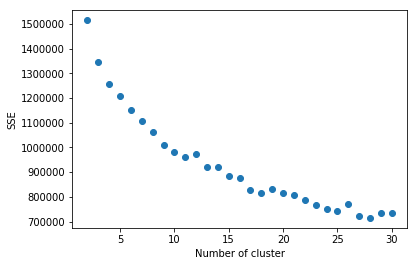

In [23]:
plt.figure()
plt.plot(list(cost.keys()), list(cost.values()),'o')
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

<div style="direction:rtl">
اجرای k means برای خوشه های ۲تایی و ۳ تایی و ۵ تایی. و همچنین اجرای یک نمونه پیش بینی براساس آن ها
</div>

In [22]:
k_means_2 = KMeans(featuresCol='scaledFeatures', k=2)
k_means_3 = KMeans(featuresCol='scaledFeatures', k=3)
k_means_5 = KMeans(featuresCol='scaledFeatures', k=5)

In [23]:
model_k2 = k_means_2.fit(cluster_data)
model_k3 = k_means_3.fit(cluster_data)
model_k5 = k_means_5.fit(cluster_data)

In [24]:
# Evaluate both clustering models by computing Within Set Sum of Squared Errors.
wssse_2 = model_k2.computeCost(cluster_data)
print("K = 2: Within Set Sum of Squared Errors = " + str(wssse_2))

wssse_3 = model_k3.computeCost(cluster_data)
print("K = 3: Within Set Sum of Squared Errors = " + str(wssse_3))
wssse_5 = model_k5.computeCost(cluster_data)
print("K = 5: Within Set Sum of Squared Errors = " + str(wssse_5))

K = 2: Within Set Sum of Squared Errors = 1514413.9234882845
K = 3: Within Set Sum of Squared Errors = 1345094.6769858801
K = 5: Within Set Sum of Squared Errors = 1210340.7216152872


In [21]:
model_k.transform(cluster_data).groupBy('prediction').count().show()

+----------+-----+
|prediction|count|
+----------+-----+
|        28| 3558|
|        26| 4040|
|        27| 4728|
|        12| 3796|
|        22| 8198|
|         1| 1545|
|        13| 4898|
|         6| 3234|
|        16| 4582|
|         3|  162|
|        20| 2635|
|         5| 5558|
|        19|  596|
|        15| 7791|
|         9| 2322|
|        17|    2|
|         4| 3399|
|         8| 1855|
|        23| 4658|
|         7| 3772|
+----------+-----+
only showing top 20 rows



In [26]:
model_k2.transform(cluster_data).groupBy('prediction').count().show()

+----------+-----+
|prediction|count|
+----------+-----+
|         1|29128|
|         0|91841|
+----------+-----+



In [27]:
model_k5.transform(cluster_data).groupBy('prediction').count().show()

+----------+-----+
|prediction|count|
+----------+-----+
|         1|25631|
|         3|48245|
|         4|13227|
|         2|18185|
|         0|15681|
+----------+-----+



<div style="direction:rtl">
تبدیل دیتا به دیتافریم های پانداس جهت اجرای GMM
</div>

In [24]:
df=pd.DataFrame(df_concat.toPandas())

In [25]:
df.head()

,state_code,record_code_iodine,sex,age,weight_in_kg,length_height_cm,haemoglobin_level,first_breast_feeding,is_cur_breast_feeding,day_or_month_for_breast_feeding,water_month,ani_milk_month,semisolid_month_or_day,solid_month,vegetables_month_or_day,illness_type
0,18.0,3,1,5.0,5.0,59.200001,9.000000,1.0,1.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0
1,18.0,3,2,1.0,3.2,62.099998,10.000000,5.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,18.0,3,1,6.0,5.9,62.099998,9.216667,1.0,1.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0
3,18.0,3,2,6.0,5.9,62.200001,10.500000,1.0,1.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0
4,18.0,3,2,8.0,7.6,62.400002,9.666667,1.0,2.0,6.0,7.0,7.0,7.0,7.0,7.0,0.0


In [26]:
from pyspark.mllib.clustering import GaussianMixture
from sklearn.mixture import GMM
import numpy as np

In [27]:
i=[w for w in range(10)]
i

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

<div style="direction:rtl">
اجرای GMM بر روی مجموعه داده ها و نحوه محاسبه خروجی نمودارهای BIC و AIC برای مشخص کردن overfitting
</div>

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:58: DeprecationWarning: Class GMM is deprecated; The class GMM is deprecated in 0.18 and will be  removed in 0.20. Use class GaussianMixture instead.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function distribute_covar_matrix_to_match_covariance_type is deprecated; The function distribute_covar_matrix_to_match_covariance_typeis deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecatio

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:58: DeprecationWarning: Class GMM is deprecated; The class GMM is deprecated in 0.18 and will be  removed in 0.20. Use class GaussianMixture instead.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function distribute_covar_matrix_to_match_covariance_type is deprecated; The function distribute_covar_matrix_to_match_covariance_typeis deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecatio

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:58: DeprecationWarning: Class GMM is deprecated; The class GMM is deprecated in 0.18 and will be  removed in 0.20. Use class GaussianMixture instead.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Func

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:58: DeprecationWarning: Class GMM is deprecated; The class GMM is deprecated in 0.18 and will be  removed in 0.20. Use class GaussianMixture instead.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Func

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:58: DeprecationWarning: Class GMM is deprecated; The class GMM is deprecated in 0.18 and will be  removed in 0.20. Use class GaussianMixture instead.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Func

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:58: DeprecationWarning: Class GMM is deprecated; The class GMM is deprecated in 0.18 and will be  removed in 0.20. Use class GaussianMixture instead.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function distribute_covar_matrix_to_match_covariance_type is deprecated; The function distribute_covar_matrix_to_match_covariance_typeis deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecatio

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:58: DeprecationWarning: Class GMM is deprecated; The class GMM is deprecated in 0.18 and will be  removed in 0.20. Use class GaussianMixture instead.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function distribute_covar_matrix_to_match_covariance_type is deprecated; The function distribute_covar_matrix_to_match_covariance_typeis deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecatio

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/home/raminm/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:77

Duration: 1:08:33.424854


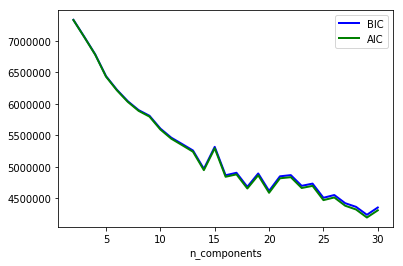

In [28]:
from datetime import datetime
start_time = datetime.now()

n_components=np.arange(2,31)
models=[GMM(n, covariance_type='full',random_state=0).fit(df)
       for n in n_components]
plt.plot(n_components,[m.bic(df) for m in models],'b-',label='BIC',linewidth=2)
plt.plot(n_components,[m.aic(df) for m in models],'g-',label='AIC',linewidth=2)
plt.legend(loc='best')
plt.xlabel('n_components')
end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))    


# New

# jaccard similarity

In [29]:
def jaccard(a, b):
    c = a.intersection(b)
    return float(len(c)) / (len(a) + len(b) - len(c))

# Query for calculate simiarity

In [30]:
query={
 'state_code':18.0,
 'record_code_iodine':3,
 'sex':1,
 'age':5.0,
 'weight_in_kg':5.0,
 'length_height_cm':59.200001,
 'haemoglobin_level':9.0,
 'first_breast_feeding':1.0,
 'is_cur_breast_feeding':1.0,
 'day_or_month_for_breast_feeding':5.0,
 'water_month':0.0,
 'ani_milk_month':0.0,
 'semisolid_month_or_day':0.0,
 'solid_month':0.0,
 'vegetables_month_or_day':0.0}
print(query.values())

dict_values([18.0, 3, 1, 5.0, 5.0, 59.200001, 9.0, 1.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0])


In [46]:
[query['state_code'],query['water_month']]


[18.0, 0.0]

# calculate jaccard similarity between Query and dataset

In [32]:
from datetime import datetime
start_time = datetime.now()

counter=0
list_j_dist,items_j=[],[]
for row in df_concat.rdd.collect():
    l=[row['state_code'],row["record_code_iodine"],row["sex"],row["age"],row["weight_in_kg"],row["length_height_cm"],row["haemoglobin_level"]
       ,row["first_breast_feeding"],row["is_cur_breast_feeding"]
       ,row["day_or_month_for_breast_feeding"],row["water_month"]
       ,row["ani_milk_month"],row["semisolid_month_or_day"]
        ,row["solid_month"],row["vegetables_month_or_day"]]
    sim=jaccard(set(l), set(query.values()))
    counter+=1
    #print(sim)
    list_j_dist.append(sim)
    items_j.append(counter)
    
print("Done!")
end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))    


Done!
Duration: 0:00:17.283550


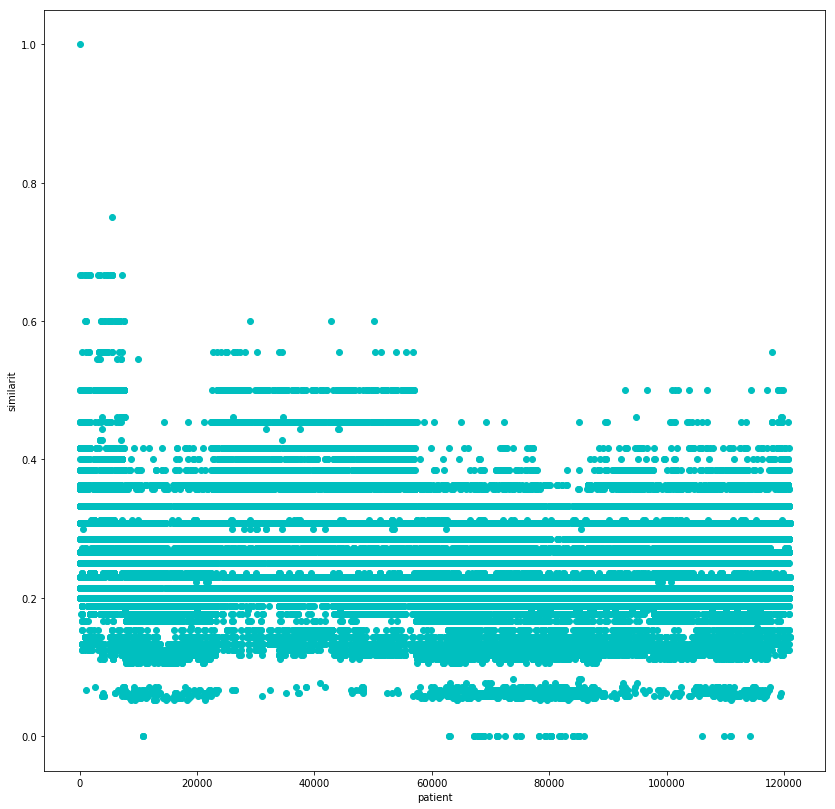

In [33]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
plt.plot(items_j,list_j_dist,'oc')
plt.xlabel("patient")
plt.ylabel("similarit")
plt.show()

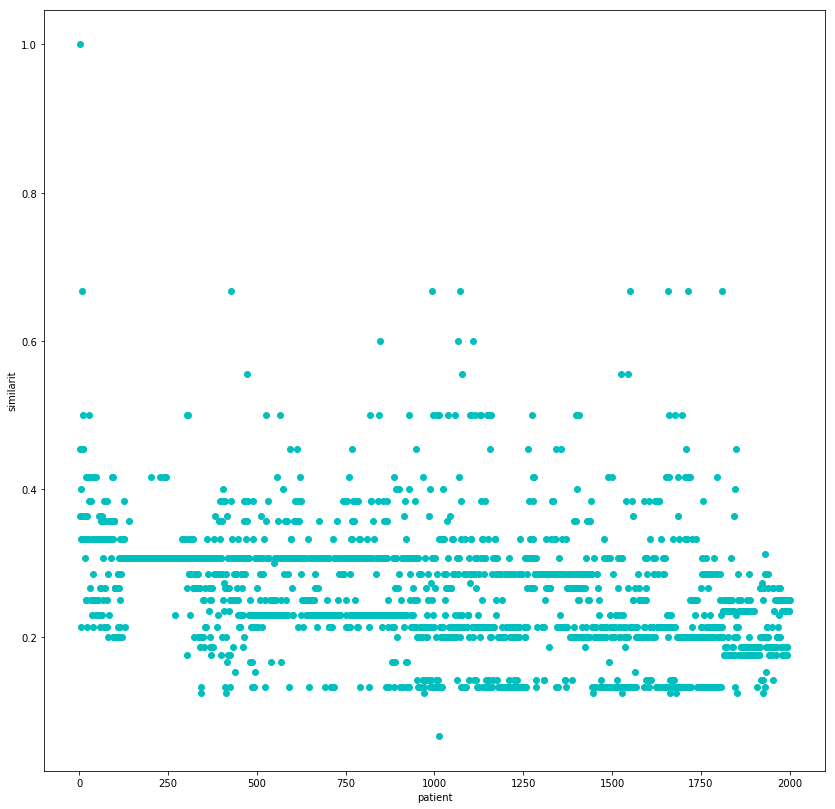

In [34]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
plt.plot(items_j[0:2000],list_j_dist[0:2000],'oc')
plt.xlabel("patient")
plt.ylabel("similarit")
plt.show()

# cosine similarity

In [35]:
import math
def cosine_similarity(v1,v2):
    sumxx, sumxy, sumyy = 0, 0, 0
    for i in range(len(v1)):
        x = v1[i]; y = v2[i]
        sumxx += x*x
        sumyy += y*y
        sumxy += x*y
    return sumxy/math.sqrt(sumxx*sumyy)

#print(v1, v2, cosine_similarity(v1,v2))

    

# Query for calculate similarity

In [36]:
query={
 'state_code':18.0,
 'record_code_iodine':3,
 'sex':1,
 'age':5.0,
 'weight_in_kg':5.0,
 'length_height_cm':59.200001,
 'haemoglobin_level':9.0,
 'first_breast_feeding':1.0,
 'is_cur_breast_feeding':1.0,
 'day_or_month_for_breast_feeding':5.0,
 'water_month':0.0,
 'ani_milk_month':0.0,
 'semisolid_month_or_day':0.0,
 'solid_month':0.0,
 'vegetables_month_or_day':0.0}
print(query.values())

dict_values([18.0, 3, 1, 5.0, 5.0, 59.200001, 9.0, 1.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0])


# calculate cosine similarity between Query and dataset

In [37]:
from datetime import datetime
start_time = datetime.now()
counter=0
list_C_dist,items_C=[],[]
for row in df_concat.rdd.collect():
    l=[row['state_code'],row["record_code_iodine"],row["sex"],row["age"],row["weight_in_kg"],row["length_height_cm"],row["haemoglobin_level"]
       ,row["first_breast_feeding"],row["is_cur_breast_feeding"]
       ,row["day_or_month_for_breast_feeding"],row["water_month"]
       ,row["ani_milk_month"],row["semisolid_month_or_day"]
        ,row["solid_month"],row["vegetables_month_or_day"]]
    sim=cosine_similarity(l,list(query.values()))
    counter+=1
    list_C_dist.append(sim)
    items_C.append(counter)
    print(sim)
#print("Done!")
end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))    



1.0
0.9922111605764552
0.9997249634071712
0.9995049353181534
0.9720133197271947
0.9941434040822239
0.9995787902443037
0.9958045166413401
0.9997960994425382
0.9993955280429387
0.9982832625590102
0.9989187192864263
0.9961766745765642
0.9957964375733359
0.9786180063353056
0.9933350292158367
0.9934233909696912
0.9806335574294991
0.9919544814226601
0.9961380580964133
0.9991563875153014
0.9941468175376533
0.9722992383105244
0.9937990233599423
0.9936603155975898
0.9906404033242943
0.9754401020127665
0.9934625417959362
0.9683209388211116
0.9906159789852303
0.990496442785964
0.9799544752766453
0.9799544752766453
0.9691246654847598
0.993573677884107
0.9935876382897258
0.9800701892141167
0.9934356518549755
0.9680979201410436
0.9750382451307558
0.9907000212187663
0.9935021263155457
0.9917072363105108
0.9903330783835708
0.9799211985704647
0.979761639601855
0.9902318112435126
0.9802727414110186
0.991809506344067
0.980211930569294
0.9802502659415909
0.9801470794250119
0.9932122476546807
0.96973398580

0.9734317410192875
0.9733179574148078
0.9269086154669273
0.9940095842749672
0.9499531349793247
0.9733895358549711
0.9510053892890574
0.952376084447557
0.9274083430717858
0.924519297319969
0.9263783773795689
0.9509102630090791
0.9255403701548603
0.9275642481107484
0.927398031932608
0.9752856769305417
0.9254026443923972
0.9882544811527944
0.9505940239503456
0.9509378685142764
0.9734808477362905
0.9516025367279556
0.927430937370835
0.991627444621862
0.9505525059915315
0.9267949881733567
0.9941510014787083
0.9522476101560924
0.9254709381590572
0.9899859989491641
0.9473854625227303
0.9266536266406561
0.9508597774403604
0.9508793804772818
0.9714988464686471
0.9505748268207019
0.9268908661981939
0.9730694694838993
0.963343076930096
0.9179199383446265
0.9209625962715412
0.953264982794257
0.9271099940212544
0.9509392597064519
0.9735217457317007
0.9726903395283139
0.9265256166155158
0.9940714157548214
0.9896634161068792
0.9501913536456469
0.9265925787942751
0.9506687760399082
0.9284472232320462


0.9637815598244476
0.9392592108193654
0.960568029509116
0.9646444442243965
0.9394551787299462
0.9415022720270101
0.9372705430744172
0.9927661713458772
0.9460094968999911
0.9181485718722353
0.9446386723415128
0.9430301080642427
0.9191150956246321
0.9243962275809647
0.9462640084076214
0.9203351028400343
0.9496689619725731
0.9496689619725731
0.9192291439125208
0.9744285180777816
0.9957017144915242
0.9943381268812466
0.9485774799775489
0.9728786104059677
0.8771808578057572
0.8534829318856885
0.9238593406508149
0.9784262951464093
0.9238593406508149
0.9733058932479167
0.9780462926654463
0.9284013524648582
0.8731488928804783
0.9772747769233479
0.9409339668562494
0.9773749025662939
0.9360202508630777
0.8536711728169734
0.8904114897282769
0.9411341216512368
0.9755386462011865
0.9439772787091333
0.9372947244465749
0.8721744219081111
0.8709295719337582
0.8525348641031943
0.9631138417558612
0.926092697434874
0.9762426458169273
0.9254008145626847
0.9715117091773147
0.9987669146617565
0.973498694566

0.8776812936994295
0.9060310663823182
0.9398141139952855
0.9314443053671215
0.9298708858488853
0.9343929652105112
0.9527617250400231
0.9049473585232336
0.957943961311479
0.9637823047681953
0.9541199449257206
0.9505965524163263
0.9639231463155491
0.9444454990008979
0.9798491047801735
0.9652539911131081
0.9594921268266419
0.9412384149634128
0.9601802763210245
0.9500644655203794
0.9583659616681922
0.9654190045854792
0.9631615375406463
0.9169262893183403
0.9994707340303493
0.9509688239500436
0.9987539013857558
0.9524116390750663
0.9936937869526864
0.9904207987483991
0.9934077633934512
0.9625786298594683
0.9520398071303622
0.9569547458839821
0.9694789649518466
0.9501518991742712
0.961628478192974
0.9463385080898663
0.9180538631955095
0.9042415359769692
0.9160731017058583
0.921941385028813
0.9284409947727138
0.9351610767294881
0.9341200551708748
0.9395953370284384
0.915522181849629
0.947810347027061
0.9038224493704108
0.9188426240300098
0.9229687708134565
0.9256617562969385
0.946059748667715

0.95353963072617
0.95283608710561
0.9491122286942216
0.9802891343799724
0.9649616511857886
0.9635898979060076
0.920459392000779
0.9630339988836438
0.9359294349940049
0.9523562168257877
0.9477379703819104
0.9750212922114022
0.9778985099665781
0.946491616456954
0.9923823642955141
0.9678699820250669
0.9652461009672296
0.9709105436757128
0.9683700735234556
0.9769188511999859
0.9753067795480107
0.9564964685987504
0.9753533276191363
0.955253733833246
0.9598576601710177
0.9610460863135982
0.9645176251417235
0.9686251835157464
0.952988687997858
0.9576030473552493
0.9748440849317968
0.9645625936271425
0.9657754063825118
0.9522424749600576
0.9527622529777613
0.9295439501814998
0.9670363707989507
0.9468619872823669
0.9789681481162457
0.9702745622746751
0.9493811194192017
0.9648771872801211
0.9936455384268311
0.9651782819619259
0.9619176963487703
0.9553596052987289
0.9532011604604641
0.9722399357446895
0.9027563336316506
0.90828393454525
0.9212173434010519
0.906351010693649
0.915755844873721
0.922

0.9987929703145021
0.9405282686443565
0.9171394610882565
0.9187249902871572
0.9601420569081643
0.9406453599193729
0.9387645266660479
0.9787527717010441
0.9413095663871716
0.9716005288536859
0.9405928004483897
0.917890810437356
0.9550915274391371
0.9407748167846135
0.9405117497161504
0.9646917574920304
0.9987701358604555
0.9609977077791384
0.931279397036271
0.8881245554261614
0.9076804010625672
0.9192174382874343
0.9400373750023547
0.8957147339002631
0.9803220455601785
0.9085508365994274
0.9604665835589697
0.9365466737043802
0.8487714258834814
0.9739822412128605
0.9389471318944538
0.9919532596790936
0.9619535929225324
0.9606653000129342
0.9178075488453493
0.9620857723716513
0.9565591384472092
0.9404929928354526
0.9631371661061956
0.9735770392544754
0.9437172797526655
0.9187116897300853
0.9409701025277312
0.9641230384167202
0.9207256795097148
0.9189515469045546
0.9613539972363565
0.9413216920440856
0.999095560336048
0.9658590278156828
0.9650509199956788
0.9580936727656524
0.8951632975581

0.9801986926153335
0.9729315966520963
0.9812674266670947
0.9777213447328968
0.9986313380187608
0.9701511234723504
0.9933174380411485
0.979631634081768
0.9195131733887925
0.937048586489594
0.9208502486962423
0.9644990821613123
0.9387833261281567
0.9668227897582747
0.9616333812198045
0.9445974208597662
0.9302895891644599
0.9400805009878267
0.9656581576625892
0.943963679404713
0.955526914597542
0.9823878054414175
0.9993008411942851
0.9973634483394032
0.9886227887506769
0.9956375169998247
0.9994454556370851
0.9980771774736802
0.9971944683378154
0.9784089472625684
0.9830860040857465
0.9826867672071551
0.9798124667643061
0.9825268963566193
0.9953866773549278
0.9934652983681292
0.9157321381454631
0.9184242067779962
0.8961770106838801
0.9424257667041995
0.9657452674360779
0.9798292545928916
0.9642710606313903
0.9993128423250063
0.9962464443673893
0.9786392187015125
0.9714088159991711
0.9469508919012078
0.924436737700307
0.9171385513604865
0.9180135368867818
0.9277005136074097
0.945425329457665

0.9267997860790018
0.95260774420556
0.9308107679678462
0.9985185428832406
0.948863466826522
0.9569013429849438
0.9720415048956017
0.9604211467788424
0.9520342757749419
0.9433525259142064
0.9622078038745067
0.9991790959009337
0.9160503164815214
0.9421747082430298
0.9052463139707978
0.9217397452989681
0.9696677365915812
0.9955072935693534
0.9474836180446465
0.9238537891960222
0.965140259769006
0.9978683039986129
0.9412111061174668
0.948512078941861
0.9979593312585379
0.9492868725002258
0.9989144919920551
0.9679312648162408
0.9227986750990189
0.9552294150081942
0.9939637370659884
0.948401449991026
0.9382582042009138
0.9633466754794624
0.999502068097696
0.9985820862416426
0.9989912694680647
0.9238664208333044
0.9464235882421933
0.955269207368657
0.9369562094084644
0.9953959804544988
0.9529847734257851
0.9419333237663129
0.9609193408885959
0.9303400121263622
0.997325177076216
0.998524621871958
0.9679494043134558
0.9230355903629052
0.9613333250241609
0.9219229485779994
0.9390360926386306
0.9

0.9731778523574941
0.9975070548657563
0.9734559547173037
0.9177589284916196
0.9369234553827234
0.9374135121769628
0.9371217248995845
0.9342293179884799
0.9342239002364506
0.9282226671312847
0.933678029674517
0.9257781791193522
0.9296774574154287
0.9400663511923864
0.9501196962832532
0.9600536665603996
0.9559571171800776
0.9531748246397471
0.9619591424590609
0.9654930845916275
0.9504619720345554
0.966105174922277
0.9467015506208357
0.9897909105614917
0.9721351725338615
0.9697892042655845
0.9518407677530164
0.9702530741513598
0.9986616879203695
0.9976303240735677
0.9996308128476695
0.9644207105247101
0.8989426827811442
0.9136618042165485
0.9096026700468108
0.912172838892429
0.9159822243895269
0.9157750310452405
0.9421938786627272
0.908510479918
0.9381600504074036
0.9179540221531742
0.9361492144638591
0.9029605492164853
0.9503338102300037
0.9537304549205692
0.9539602579981656
0.9468788964608632
0.9524919074851717
0.9553791437991777
0.9333228661357167
0.9546108503103206
0.9594132837834509


0.9300734802199999
0.9261260885396054
0.9310837277187778
0.9204450123225941
0.9329459551623139
0.9243859701596601
0.9159669565718322
0.9240866414349
0.9117813544028993
0.9419506116345813
0.9282119460442357
0.942129295944836
0.9294710662703202
0.9377370143033722
0.9527331080537516
0.9589435188157807
0.9427854596897878
0.9976673265346345
0.9465928666643232
0.9556210776122491
0.9659122490920606
0.9506914187237704
0.7374488722537333
0.9653847260319123
0.9509320488914398
0.9610408948729383
0.9938765612516514
0.9719413084459386
0.9164818898297267
0.9163967175311161
0.9426417120672532
0.9287885251527103
0.9271653745887823
0.9366598758946073
0.9029042901799423
0.9362867324915956
0.9317020712657046
0.9267640287126009
0.9379394010978513
0.9556438243289846
0.9389913993053985
0.9366659060842264
0.9697364645634095
0.9759280941909774
0.9699151131619467
0.9940903339828899
0.9673602897592838
0.9566357156775858
0.9531302075924989
0.9738868024769795
0.945786815029023
0.9697122263912543
0.928708869930856

0.9224081196927388
0.9454219103258933
0.9261775980543244
0.9355650646257779
0.9162182855309522
0.960840245824515
0.9754466050091357
0.9638132623514812
0.9895530302427759
0.9994135054422485
0.9752955295946022
0.9189022987762425
0.9638452888639596
0.9996652049125881
0.9594556639205253
0.9385520716711314
0.9190776922952293
0.9164226516029768
0.9160644582690864
0.9392265209758128
0.9265343466649488
0.9293142376706884
0.9249402289323125
0.9143229851084895
0.9600495356083835
0.9435081672755262
0.9347051825098582
0.9667516029908
0.9358158189321757
0.9330807823745988
0.9619763317578293
0.9439730889233626
0.9325891620122391
0.9457909828245913
0.9048072219887733
0.9166130209839598
0.9179872048463066
0.9775321186923773
0.9396639653424981
0.953697370253269
0.9071669258148941
0.9073737696838651
0.9349204149112972
0.9579986976234366
0.9285722983681187
0.9568985065060345
0.9078410814839063
0.9653090426358701
0.8997215057492245
0.9674903013165714
0.9111248437318318
0.9539072860109867
0.96102424406514


0.9302557673066103
0.930880305164576
0.9331628605661995
0.9555361050186802
0.9504658400451026
0.9474658409689348
0.9518416245379823
0.9299792229547221
0.9239833572361605
0.9499873139177006
0.9614048441227399
0.9382081476216129
0.9334764073488702
0.9280552566865053
0.9224614454551655
0.9518491918212937
0.9507415785370692
0.9090197133547858
0.9066299639324553
0.9497118531566081
0.9224909511940825
0.87840785335165
0.9226847426218359
0.9319276166078592
0.9269111750365905
0.9234135823984598
0.9476997777430196
0.9563344091625569
0.9589771771195378
0.8901033614972003
0.9281741535478538
0.9998080518049302
0.9220417697053959
0.931252694109606
0.9497807119338544
0.9244505607208701
0.9475437615017342
0.9315991706910481
0.9432742985215322
0.949761811438322
0.9138501486369214
0.9546904445346744
0.9333970776519565
0.9256427366807968
0.9306830640811569
0.9314062451839697
0.936579120167899
0.9329582806644132
0.9033218924636469
0.929001582215037
0.9233172821002427
0.9967510023601367
0.9178942201607178


0.9374524299142418
0.9647248488321705
0.9428989852866341
0.9221442198061351
0.9592162639957508
0.8996521576464478
0.9354934969224231
0.9475944462676005
0.9549371927699664
0.9428722058681019
0.9450628670882734
0.9965018712859847
0.9896828911861896
0.9955314907949073
0.9854400022444513
0.9817733974237727
0.9807067752354552
0.9768985206497016
0.9738019224554693
0.9954943538091832
0.9624229328302376
0.9961347548330677
0.9808147419263608
0.9983697389016803
0.9721603747968306
0.9956396194529681
0.9806179530024263
0.9167414464034416
0.9696203568270034
0.9842371492823158
0.9941368358379603
0.9255337480239081
0.9954304361755705
0.9760920666770969
0.9873178455722658
0.9627230423128561
0.9581657910559896
0.9762717700693382
0.9740073137488322
0.9808710776236825
0.9889504257509594
0.9646194450671552
0.9768595907127353
0.9987929703145021
0.9379943319455503
0.9362817381677088
0.921819224056129
0.9265810270307319
0.9516021863527867
0.953006466912508
0.9200176870241314
0.9482948892252864
0.946888216408

0.947837569675748
0.9611162875744503
0.9541615038129247
0.9530689191665559
0.9611670366374562
0.9635462927858321
0.9538340642663267
0.9345422853827329
0.9583157098478472
0.9658319676773712
0.9660038155015761
0.9933174380411485
0.9731332452065397
0.9984812002138942
0.997239098815175
0.9803973456454329
0.9949763758947798
0.9484826016803222
0.9780191290264127
0.957211363961299
0.9766885060692592
0.9731078748697858
0.9648051202995997
0.9712249131900228
0.9955335907371273
0.9748586527416341
0.9959597694882941
0.9564333380483294
0.9679715616970388
0.9732767564528542
0.9951372252997768
0.9985302466832344
0.9662335721006861
0.9739148123507733
0.9582817705209222
0.9687018363943884
0.9314835940362856
0.9384000759189273
0.9247934917084152
0.9195514789398266
0.9489469399172503
0.9431224645660353
0.9532237277867048
0.942099254946563
0.9212252334919087
0.919280057346267
0.9200940680378691
0.9236730162755342
0.9111276433125048
0.9499810566897647
0.9207878634963622
0.9510574212117094
0.952372892873278

0.961878403795513
0.9616932671062053
0.9515645498239697
0.9594561758504853
0.9619159524441757
0.9267752611447551
0.9313222308621002
0.9658521022759886
0.965841143372182
0.9598562885851323
0.959471491451117
0.9610280778719993
0.960640016654294
0.9638549111166387
0.9601599562778413
0.9588271537506923
0.9673561985904868
0.9634648909072909
0.9531012828391795
0.961650020886188
0.9635122045682061
0.954028203325371
0.9606377561418278
0.9606110444155016
0.9658019245275448
0.9600677972707361
0.9556978357040835
0.9550321484609181
0.9510662654677635
0.954056518636567
0.9579698587048444
0.9634135494503814
0.9659082993258387
0.9587627733801128
0.9650200872573692
0.9656966113043112
0.9634191257613519
0.9546318182979953
0.9604251452637694
0.941701488680685
0.9368405878845776
0.9664990503635738
0.9642670342915375
0.9662813173854308
0.9597571856874375
0.9619769095787976
0.965507924488362
0.9677460987513292
0.958523800452183
0.9600385866366793
0.9587892153926381
0.9561930173348657
0.9525499933888406
0.9

0.9544855227960234
0.941195239845467
0.9308556242184666
0.9157771615312148
0.9652226339817749
0.9842772108297975
0.9610236753614056
0.9245545521207507
0.9563845417384007
0.8865738857667711
0.9166025063140344
0.8987382540171679
0.928149207120092
0.9406157929625346
0.9626596627736527
0.9608977393769501
0.940668274454946
0.9651530055871846
0.9940574166222581
0.9652472655902464
0.9366726473732453
0.940668274454946
0.9659699415864982
0.9403858773935386
0.9383996646034267
0.9406780894464554
0.9890689802178337
0.9600713273808308
0.9163798224184004
0.9602667859012035
0.9675942542581114
0.9165515465813439
0.9647048811491143
0.9724322349280207
0.9013087528422041
0.9941408128601933
0.9726622014248995
0.9896596870832276
0.9710787829933684
0.8816547975815155
0.9639998132515419
0.9403859543512326
0.9161385095320342
0.965669267762199
0.9608785049622137
0.9363737263762276
0.9641123145335015
0.9276255488887942
0.9406423332608784
0.9528399777218053
0.951159763876258
0.9928712380529249
0.9396234367194887

0.9158595901916712
0.9631165209529758
0.9276039395360746
0.9147983028922112
0.9458554350695001
0.9150918818457525
0.9597466968738444
0.9890876678003981
0.966557488688329
0.9573315342157028
0.9923701243805133
0.9925227392945055
0.948632700788645
0.9569168417810893
0.9744746969921062
0.9947319525703958
0.9942842941681833
0.9700973282163838
0.9938383525731759
0.9956833289015198
0.9955107228411438
0.9958166351166682
0.9797241312321385
0.9811451616305521
0.995973614011196
0.9961401266806847
0.9839465441914209
0.9640923970605492
0.9782678680673617
0.9756514944862721
0.9676100891094631
0.9601524027271655
0.9455178585686714
0.972658687235421
0.9454847418373402
0.9454847418373402
0.9732221334617813
0.9353442047670627
0.9586243458388377
0.9359481337889174
0.960368266625524
0.9607025444320468
0.9236911026938129
0.9356325439695226
0.9365460728245072
0.9747626032817366
0.933933549684385
0.9150857742009997
0.9455022612390545
0.9760461000290599
0.9659699415864982
0.9181310735842586
0.9432171843070369

0.9924559968575222
0.9243165508268372
0.899383059288959
0.9524130599901873
0.9401328097532391
0.9501463508274178
0.8993625120492211
0.8978005643887643
0.9632916055248375
0.9113616430770545
0.9640829119172684
0.972976544992882
0.9182466355757198
0.9489599103840455
0.9551548149216633
0.9456331418819084
0.8971673482186655
0.9219699380855716
0.8990364753359935
0.9315716186221715
0.9547216884483023
0.899383059288959
0.9502885433196615
0.8994711856967604
0.9152168885605264
0.9277949579684084
0.899383059288959
0.99324575121466
0.9899120419358248
0.9590539960954972
0.9233274093476556
0.9661732911859824
0.9638631037894955
0.899383059288959
0.9728741842384853
0.9862798375317681
0.9234854414023974
0.9438648251574816
0.9580172755822923
0.9180172761138066
0.9243077340348258
0.9447443727886299
0.948882098926359
0.9792340711331843
0.9429841499616545
0.8866504034529256
0.8945465184192276
0.9128231080874073
0.9063194256226224
0.9498164320175637
0.9386218815423526
0.936761711848501
0.9380816306133546
0.

0.9938244679841365
0.9432460544255431
0.9472363672337323
0.905852377886517
0.993718618892734
0.9386106805746862
0.9350982846315357
0.936914310227577
0.905169211710522
0.873184729095667
0.9182466355757198
0.9747327669487041
0.9415211205069806
0.9433700623167361
0.9530604843772952
0.9342506529296798
0.9937950713824951
0.9170714209632419
0.9339427046030975
0.93756504874608
0.9226035102068205
0.9447597416683844
0.931946270802588
0.9707998056848991
0.9489763140031754
0.903208943733559
0.958945923142635
0.9676939731946242
0.9393045305886308
0.9957946090587237
0.8681928775540584
0.9270038822767309
0.9144779202740858
0.9386744140336658
0.9485529857317482
0.9640373645528483
0.9636150062182574
0.9965924229868174
0.9199553369442441
0.9724211451645786
0.9528174786483798
0.9313954667302204
0.9600131395485074
0.9492741517669951
0.9286544918102476
0.9350638711779506
0.9650227790079411
0.9564120070017246
0.9267112189923531
0.9257773866116095
0.8760189400418528
0.9470437052852606
0.958970149376264
0.92

0.9069809375392892
0.9394219245346966
0.947755329858914
0.9571512578911588
0.912973148464305
0.9565752482406752
0.9052292900312523
0.9483511065930383
0.9157822262102662
0.9093652031765191
0.9426147428628369
0.9175365696577241
0.9417124849941455
0.9537696564823952
0.8895067667010886
0.9444097957977331
0.9324778749797189
0.9504378197723867
0.9515581646364208
0.9180005246171727
0.9884090719248593
0.9007263116231822
0.9440108538093581
0.9441827869414465
0.9231207291191857
0.9687639007554346
0.9484769845333743
0.9607210490597801
0.9731652755914363
0.9926491621264072
0.947741122296436
0.9659052130583773
0.9894353848198013
0.9085327611130399
0.95729412985161
0.9894353848198013
0.9140154116460295
0.8989784824392312
0.944061172132961
0.8731475828578477
0.9186796530481119
0.9203706106104734
0.9401383548191196
0.921394020005687
0.927829940466215
0.938023188496446
0.9370328201941951
0.9548696049303506
0.9161817148462458
0.9293066970779873
0.9926869436853765
0.9258914286882407
0.9218992239416053
0.

0.909611839461304
0.936082538191389
0.9255145619047561
0.9969843904066372
0.9208857771551701
0.9541099053195489
0.9982780898403627
0.9601962245894469
0.9255291910971191
0.9477318823616555
0.9849799851528077
0.9287332080946042
0.9884062138673013
0.8989802884798624
0.9756430207442798
0.9448896024599529
0.948078149616054
0.9019371351518165
0.9040513013901998
0.9230789602901224
0.9300166614100291
0.9257344056161163
0.9350799936419456
0.9321760956128066
0.9298000674991211
0.8953065526757183
0.9950657378654665
0.9335853519347351
0.9541720193654927
0.9388925572570206
0.9219611503170815
0.8979859105821485
0.9214098346869459
0.9195277644295131
0.9568716673988553
0.9194952733962112
0.9549832783225944
0.9239323288806739
0.9241644853993823
0.9650829411909884
0.9219221596212537
0.9568055866774986
0.9937440623225808
0.8762609322663353
0.9458412083705494
0.9951598804961379
0.9506103696622656
0.9877088534276448
0.998452251625378
0.9233596602544493
0.9881851806246648
0.9066100357967608
0.91920841724356

0.9194952733962112
0.9213243397286462
0.917760651863698
0.9481113679171981
0.9754461052322216
0.9648541808282552
0.8598022240779029
0.954984823794989
0.9778583032535499
0.9778468924948941
0.8950810173628824
0.9232608593502177
0.9564464930491818
0.9626433475966046
0.9507351339698692
0.8975186473555192
0.9761403208958636
0.9778159575242562
0.9648541808282552
0.9194194246576357
0.999087157833835
0.9860844954480371
0.9908999733342522
0.9911588953308276
0.9212247658734732
0.9674422686666633
0.9274693260953942
0.9585391486065643
0.9200915781249868
0.9940283625810924
0.9269304299737934
0.9922045646392089
0.8924295809152004
0.9863777631324184
0.9688407632051158
0.9588346211332707
0.8886225926763024
0.9258149824112057
0.8918699938390449
0.9989488676769149
0.9949231177981057
0.9950057434760927
0.9939994870438063
0.8827294797419993
0.9779492664941807
0.9722182633907315
0.8926496241201555
0.9690783267667373
0.9694870528055559
0.9410158877317267
0.9694870528055559
0.9694870528055559
0.9722182633907

0.9935091650915517
0.9315245451406687
0.9519693580632765
0.9274855014549531
0.9212266680913137
0.9252579813183661
0.9961327282744767
0.9885671026340862
0.9873081218247785
0.997401591049124
0.9915036666386652
0.9964888802020716
0.9418130412602223
0.995631678197391
0.9920822968122225
0.9942006496429205
0.9892759786358376
0.944718827454834
0.9275242495581549
0.9026419310211157
0.992462190412296
0.8890088187089086
0.9596665296021786
0.8910087049136455
0.9233183937061509
0.9011326590393228
0.8898131248813909
0.9510453387716634
0.8906801272737039
0.9902049575291341
0.9893213154419643
0.915738365649012
0.9227968918101667
0.9661689458666245
0.957104273785168
0.9194952733962112
0.9419317639259005
0.9230306925780457
0.9194952733962112
0.8953065526757183
0.9194952733962112
0.8953065526757183
0.8953065526757183
0.941950158610436
0.8953065526757183
0.941034630501128
0.9194952733962112
0.9668740642279621
0.9253363229866154
0.9434169555106086
0.9368321123989081
0.9222008440700047
0.9316517997826957
0

0.934339137618346
0.9628981989675165
0.9743715228110541
0.9691752430542795
0.9541632436248595
0.9694220690361268
0.9438295470380671
0.9504319107434013
0.9518834261550332
0.9719197248015586
0.9579022334658785
0.9489371121485081
0.9585368966771838
0.9256280388412408
0.9625590279775577
0.9623841355866215
0.929310318673369
0.9692543249487096
0.9267082452512369
0.9746609562961349
0.9387429270150672
0.9295370753347034
0.9553299561444966
0.9210586795071475
0.9745554835272159
0.9426400431808521
0.9760481560339226
0.8931233728807684
0.8993761701486626
0.9680012309270776
0.9881580318545402
0.9256593116299411
0.9960359699502828
0.9915065294496411
0.9530578880563241
0.9938472363594625
0.9274242756010127
0.9941966267605852
0.9032262149080317
0.9379014224355967
0.9604462031583987
0.991905918688216
0.9606826441935582
0.9002440190010659
0.9931279147287189
0.9921819582810245
0.9921994504405237
0.9711554349022333
0.9900189588597745
0.9872008463780431
0.9002838928783456
0.9606856695598631
0.9914522806420

0.9570650486294392
0.9079594543930685
0.9642949008177721
0.9252662497349596
0.9598536958643161
0.9460889995492482
0.9583619851494057
0.9256280388412408
0.9661799007766574
0.948055307787899
0.9256280388412408
0.9196241859240364
0.9755741552026361
0.959387139410567
0.9506072214750422
0.9246903342265587
0.9612812255967047
0.9913613202677131
0.9020413640052171
0.9162012902404247
0.9317411071863699
0.9016138438120389
0.9523313982759535
0.9104547205700595
0.9477161965910729
0.8902909547005492
0.9650829411909884
0.9315087737432525
0.9566404615719859
0.9578422550192972
0.954935247818776
0.9256280388412408
0.9489536736862885
0.926557835589848
0.9012397451061268
0.9626835805995397
0.9256280388412408
0.9256593116299411
0.9480043622106902
0.9191189393975704
0.9019000387337923
0.9642992963219957
0.9248620613974762
0.9050617532901313
0.9256280388412408
0.9256280388412408
0.9002838928783456
0.9256280388412408
0.9002838928783456
0.9289199007730865
0.9652043497339207
0.9256593116299411
0.92562803884124

0.8943035371315885
0.9629596687199463
0.8951219075732365
0.9413459763745798
0.9021621796679286
0.9589809387926548
0.9270718593594673
0.9674174229951151
0.9971815347843235
0.964473949460293
0.9809588327946136
0.9450902572667947
0.9381846636241294
0.9597275948723184
0.9366379431913916
0.8954716674430484
0.9331350478098737
0.9559923150579681
0.9954746588002459
0.9950372335638145
0.9376933888075127
0.9947903630279012
0.989281383063174
0.9569326911525815
0.9688017908150256
0.9612296358111376
0.996512757922183
0.9931160657260245
0.9914246897434953
0.9331054580071645
0.9626483913423013
0.9964396137973961
0.996512757922183
0.9253349771383936
0.9992024459065271
0.9455872983909843
0.9935340516672105
0.9304439166905127
0.9667130301066902
0.9691004402929836
0.9476511031366575
0.9888941615929964
0.9973907379529148
0.9449331514147611
0.9720568107116767
0.9992531801502641
0.9666718326257908
0.9989667046778177
0.9383738722664815
0.9713654037178366
0.9972415159475829
0.9275757736067413
0.99943191639538

0.9708652932337192
0.9277138570596712
0.9274295259892255
0.9984999169351912
0.8937927187684479
0.996516687622124
0.9987810956757703
0.9984332951228836
0.8946965573362787
0.9625624759354127
0.9949998167134951
0.9534378935034048
0.9946276607100382
0.9476317208328032
0.9437147510035756
0.9956145760123818
0.9534378935034048
0.9936652529360902
0.9466606805338262
0.9493085821744465
0.947128934827315
0.9670354979363801
0.9522779846675364
0.9479006183963605
0.9445829667613383
0.8946618236738876
0.9879899432514133
0.947575198476201
0.9960349303935067
0.94879160339785
0.953850607767435
0.896981495632325
0.996425609728126
0.9453043557183687
0.9955004878606215
0.9817244683579109
0.9865068707823088
0.9933811433910809
0.9692115863592635
0.9259149929795303
0.890825360208572
0.9991427645730722
0.9534311274362389
0.9283729737365922
0.9676676647212772
0.9933388052521479
0.9678376921486959
0.9349067553254141
0.9264132332891852
0.9440513118849938
0.983424432585398
0.9336262007014059
0.9304200011750228
0.8

0.9893282112883889
0.9340333322488776
0.9493461804275489
0.9410837921863264
0.9333686661216272
0.9242786934267824
0.9103442728732282
0.9283568381463055
0.900613269221428
0.9764499741134648
0.9430431418144176
0.9493750539354322
0.9883885792184569
0.9019355408818616
0.9587052611877849
0.9455022612390545
0.9251500117446272
0.9524905799503303
0.9165399511772644
0.9243431288931199
0.8962502927831729
0.9283568381463055
0.934623355307276
0.8993245078155003
0.9624514074894035
0.9696449414837991
0.9196522148129526
0.9682971744630275
0.9648139911046245
0.9709320808111426
0.8932193821538097
0.9762028971400135
0.9355659577491767
0.9597209781467066
0.9372852477972615
0.9769624855442993
0.90312869494163
0.971888689931585
0.9713771915505093
0.9730971321786295
0.9233044836556766
0.9688705454739277
0.9345025871680549
0.9978689345198142
0.9953081182633238
0.9985158547056322
0.9965436291415107
0.9949187620409012
0.9979078957960237
0.9973927265696576
0.9971081981851208
0.9970437279857313
0.997537415843299

0.9431975778947674
0.9229590711124498
0.9353304450631242
0.8925302087808664
0.9659748054222566
0.9448974562590623
0.9229908775838912
0.9454847418373402
0.9511227664611224
0.9630799542493989
0.9602907999396257
0.9481534889008432
0.9718893558553232
0.9573608393532957
0.9622110996321793
0.9417465591285309
0.9485777495271934
0.905589710752854
0.9487926229867605
0.9233892770937593
0.9241940085720624
0.9454847418373402
0.9364910688343147
0.9544181162214521
0.8985922714804018
0.9410668736249918
0.9374418178586598
0.9917882380229528
0.91640135207662
0.9271585425769006
0.9489872480516031
0.9463816727658222
0.9229590711124498
0.906427534503595
0.9719701764852233
0.9455022612390545
0.9455022612390545
0.954214158564933
0.9510808259564623
0.9430474102339016
0.9433595358068919
0.9435607812682125
0.9299020088074313
0.9519129059489873
0.9809207681569321
0.9820128465712652
0.936761711848501
0.8869126966028033
0.9260800264481561
0.9495008249817969
0.9014994747811483
0.9514125211469961
0.9189803207117613

0.941381994239354
0.9738060845277099
0.9525177411351284
0.9098645184551868
0.9166047889542567
0.9135512646670522
0.9090153232221718
0.8721381387476903
0.9297893335604083
0.9247135126187837
0.9254564565634849
0.9243988847466692
0.9514799446372075
0.9513058435049353
0.9292817522731439
0.8962959155307746
0.9473461991602027
0.9557709122292529
0.9755037359698664
0.9366198018841868
0.921067779904419
0.9424908005956246
0.917849236194476
0.9409632573415906
0.9952123859591786
0.9201240582279351
0.9920037318815011
0.994671537216683
0.9164375142630817
0.9002254964022696
0.9179336208196628
0.9179336208196628
0.9416120966792884
0.9279501547962093
0.9179324341652693
0.8971164090033976
0.9214031583281906
0.9229065050041295
0.8951626183133979
0.9566181280174613
0.9951182129472328
0.9001170785970581
0.9848535199742366
0.9544146988194631
0.9638824139131603
0.9322837017507797
0.962545761760565
0.9063433644547805
0.9692096373347362
0.9699079806462608
0.9984443814501303
0.9421583875559175
0.895032392883426

0.9237491492370552
0.9544743946543437
0.91841845285868
0.9566759504539061
0.943894393790809
0.9284575555588758
0.9647190804633848
0.9451016128577222
0.89992890968452
0.9317061399774434
0.950655989215013
0.8735640706047271
0.9915403957833615
0.9322325143801521
0.8951106930045689
0.9938947798415275
0.9881504469754319
0.8735269981371582
0.887133739705486
0.9894093087151536
0.8854887863441372
0.964102448461723
0.9229908775838912
0.9195434910963067
0.922580083782453
0.9366812944599365
0.9608228496235787
0.9468035020255852
0.951368767047112
0.9436697850563814
0.9219847836352044
0.9289562964533501
0.9184125982449812
0.9092647030839709
0.9562285369210839
0.9377721180567394
0.8855218429065225
0.9111468939138369
0.940919272626111
0.9142038221841965
0.92238975989015
0.9473632034837274
0.9538216135643419
0.9479257426329694
0.9928671157767519
0.9466671972430669
0.9473632034837274
0.9917819455698734
0.9171388320036095
0.9473461991602027
0.9863260601957996
0.9450847582531334
0.9926583429950517
0.9510

0.9570692381340241
0.8719993336352728
0.9400582139370112
0.9291571428943243
0.9659748054222566
0.9229590711124498
0.895854250761307
0.9527252217798008
0.9454847418373402
0.8980973328530961
0.9234557586198484
0.8952162584960899
0.9659699415864982
0.894329670631856
0.8495650631851623
0.9454597245371832
0.9050578180285713
0.9148062118001403
0.9439315627181728
0.950568834445246
0.9468163575640273
0.9384352268757712
0.9220272352450966
0.9425532087939162
0.9229590711124498
0.9445620165397401
0.8647595661965851
0.7655879463418263
0.7972118797772909
0.8736887782325063
0.8738324133304886
0.9494745397440005
0.9579256953677755
0.9629978605887399
0.9027275834752558
0.8387424301860211
0.8745983146636273
0.8794273949978159
0.8985742924192475
0.9229908775838912
0.9532964658271927
0.8739031973694965
0.8628581847092576
0.9193413961787134
0.9229908775838912
0.8440656053253179
0.9341601206289953
0.9398995292656079
0.9229908775838912
0.9288523154773953
0.9452389842974165
0.9448310129484649
0.9246666552292

0.8981375266336054
0.916539474065937
0.9256767856606556
0.9229908775838912
0.848697833464765
0.9162887717922655
0.9454929599255939
0.7916052372398441
0.9026898589900472
0.8980973328530961
0.9194433104640595
0.9229908775838912
0.9455022612390545
0.7916052372398441
0.9591911744722079
0.9027068850487908
0.9470673977191845
0.9340167220252663
0.9454847418373402
0.9470222879882073
0.7916052372398441
0.9470673977191845
0.9671960348639558
0.916470704262483
0.9027068850487908
0.848697833464765
0.9027068850487908
0.7916372730350714
0.7916052372398441
0.8212937937184918
0.8980973328530961
0.9074438978651131
0.9455022612390545
0.9026898589900472
0.9054239779475203
0.8980973328530961
0.9475682132075852
0.9280899095811187
0.7673225600523133
0.9330143251091054
0.8838337072591752
0.7916372730350714
0.8945148959356096
0.9026898589900472
0.933436318646909
0.9682441830770481
0.9751073398999178
0.9659846141535189
0.9664949799269404
0.9444325090610433
0.9592527725730896
0.972043339611565
0.9603310529915005

0.9426226697809512
0.9935309524958058
0.8902483491364277
0.9244577725779193
0.947614010097472
0.8944071245390421
0.9465040845146082
0.8950323928834261
0.9242849602941208
0.9502247106847715
0.8950105868398401
0.9093799673689783
0.9366316880917658
0.9598968033710287
0.9252866087723696
0.906451346347842
0.9940594077125734
0.9042179661658946
0.9301241981793407
0.9867062428356457
0.9885131628977197
0.9989164591309735
0.9602482242012043
0.9197290663813746
0.920309860945658
0.9893107393818694
0.896342805336827
0.9214719250283933
0.9335013877571022
0.9884806233581688
0.9003106054706423
0.9182790045439606
0.9024398408282109
0.917622605017305
0.9523038756357919
0.9263272948058757
0.9587084154226729
0.9183265877405643
0.9015000242810932
0.9411929566998677
0.9231349076075217
0.9189877268011356
0.9150870305322419
0.9273970193776025
0.959898372875237
0.9539285147043963
0.9510223758309668
0.9352722306884257
0.8950105868398401
0.9438601527935684
0.9341554689945151
0.9374919711054996
0.9251483249183008

0.9685206933273849
0.9058155222957758
0.9281868116120088
0.957494473985807
0.9262276421914528
0.9293634255511556
0.9510586752908763
0.9337017811532639
0.9681142299594916
0.921660382422105
0.9236624177571912
0.9238809289468501
0.9644480545662302
0.9745758841293553
0.9520687817167963
0.9191811230864648
0.9660520585918501
0.9062632190904709
0.9195152615097922
0.9140810014714239
0.9688311227788214
0.9636564352113325
0.9057740743690446
0.9595381748863643
0.9411586919526819
0.9572898837744687
0.9264585086161139
0.9549501455028985
0.9539511279397842
0.9577273488123123
0.955378920723012
0.9627356408618
0.9572491978455977
0.9776097198766155
0.9627766470156075
0.9566365475681669
0.9567856063110894
0.957981512434123
0.9533990425625717
0.9568385436513067
0.9647006763434633
0.956799140970614
0.9643406300724664
0.9063340543446053
0.943026132183655
0.9630317447342488
0.9080825207029735
0.9337781069061375
0.9277311502536949
0.9590123331571772
0.9547893540078951
0.9545480313203395
0.9615497945445379
0.

0.9403448766106299
0.9945985187312472
0.9295335792554501
0.9024104682527812
0.9313912007830718
0.9308714859929679
0.907996283354956
0.949016005690698
0.9882322121347485
0.9120043739467893
0.9897361366372592
0.9185472964631112
0.9455930028215465
0.991468782544243
0.9502326423928819
0.9746785341032632
0.9489034971725465
0.9875419422387339
0.9882636882129612
0.9521744597112247
0.9277349043214465
0.9974391913678702
0.9487117766154006
0.9893793769538678
0.9456536756227992
0.9269117089285145
0.9881995378502589
0.8991441587080806
0.9505353090652582
0.9992965445089215
0.9500494103236221
0.9510453622539162
0.9444154554090898
0.9921674439511423
0.9885433789120955
0.9059125857780441
0.9284819464457708
0.9147394908521104
0.9602210990223227
0.8973705806830218
0.9773569163911049
0.9885433789120955
0.9507615331665487
0.9002310604460882
0.9496022778806432
0.9512720782967476
0.9324979319255624
0.9896883260892194
0.9891608313547258
0.951995311389167
0.9755452790588636
0.9021526719216685
0.97207833260740

0.993472255471487
0.994001277217121
0.9963067967097519
0.9793025052474124
0.96527784473358
0.9916388149381061
0.9965448843672822
0.9965548543017781
0.9964022342484105
0.9659748054222566
0.9330320622661182
0.9330671057670731
0.9182404472528944
0.9399202408753398
0.9848738535415335
0.9283568381463055
0.8882289599929104
0.9140931913580422
0.9115611600008596
0.9249699189427085
0.9659748054222566
0.9555211212093535
0.985025138719266
0.9425850727879075
0.9100507707811352
0.9780743557928433
0.8587176082601441
0.9574660036891952
0.9935688571755373
0.9020138485921917
0.9926869436853765
0.9914963623318624
0.9522265917716977
0.9213070673287767
0.9539518733714665
0.9939808358227498
0.9493880906874335
0.9577903285540645
0.9020138485921917
0.9280301351471101
0.9342203351742265
0.956799294738361
0.9777800860810026
0.9586367233152714
0.9861158960451502
0.9963774534728719
0.9824930739253512
0.8950105868398401
0.9645544118942062
0.906844863626643
0.885268265568851
0.9422426894800711
0.8980920951573933
0

0.9487309601802704
0.9403366193495204
0.9790240104337055
0.9732300325159815
0.9829344060959245
0.944319511957885
0.9900782860743949
0.9334102991768882
0.9683741405882155
0.9288633572698863
0.9640890184035775
0.9564897097393147
0.8978805107358777
0.9362774616513193
0.9485902896175056
0.9559216756275473
0.897324562246654
0.8961324681167547
0.9690453719790824
0.9533578482638999
0.956821459204419
0.9523517181764527
0.9522852261540313
0.9486950396500671
0.8943885070883254
0.9608082326415949
0.9261718736656503
0.9350798438401081
0.9649174215229219
0.9571417705926749
0.9513447705945417
0.9328974573278994
0.9770531061504749
0.9301882894036843
0.9261718736656503
0.9773810906667348
0.994344103412105
0.9830862811572574
0.9276078275862023
0.9828713548569022
0.9940898046292331
0.954080101165495
0.9312248923321931
0.9521488066426269
0.9249041003514735
0.9218917072484543
0.99562166999321
0.9941192010313663
0.9683597404295673
0.9732642517842913
0.9802018654829653
0.970123607319549
0.9955878467117719
0

0.9197223909716685
0.8921329401573923
0.9445581185763245
0.9809433402437692
0.8797963262904129
0.9423515072168146
0.9251203325497414
0.9220439706331925
0.9464699379478951
0.946042367282405
0.9222736316491655
0.8508071461240773
0.9588880044835415
0.9593274127055499
0.8998003640035438
0.8975600579342059
0.9305992623931929
0.9445581185763245
0.8969149739251999
0.9261209595409614
0.9546743888992277
0.9685719803666644
0.9222736316491655
0.9244162973635468
0.9406221990143853
0.9798391321567684
0.9368343059614466
0.9836212679478686
0.9445758931745799
0.945615631187007
0.9284068495605828
0.9795979272443355
0.9763456996956557
0.9653948556446336
0.9801754099035015
0.9816494863783652
0.9554673925619116
0.9757936984960253
0.9575859691783254
0.974515976813328
0.9856386882695847
0.9880689727110995
0.9982278825780038
0.9416527405197108
0.9972241233860462
0.955823044813835
0.9858203425881493
0.9712739180585436
0.9712739180585436
0.9269818083261447
0.9282835772902024
0.9823063403394849
0.97376239835051

0.9031695546611839
0.9685952227304688
0.9823920991842103
0.9001123494467093
0.981666842493122
0.9895045881430251
0.9486210769223873
0.9734954599729303
0.9114455661205807
0.9939281786892484
0.9543556033679731
0.9778315672762607
0.96631332652015
0.9719065631952948
0.9987062029787186
0.9698946911952663
0.9288089207456904
0.965743241737324
0.9623927446010885
0.9742346808237872
0.9711570172983671
0.9985142424564407
0.9845450267964363
0.9942757683874511
0.9764865273835208
0.9281576400357799
0.9679127582776407
0.9324127052896807
0.9254636324815524
0.9247829782920969
0.9642041476623632
0.9239292552562374
0.9597007079107608
0.8989696137046073
0.9298975441260907
0.929143034225069
0.9168539462157893
0.9608142033781917
0.9282329826955195
0.9385877240316817
0.9611904276314706
0.922061624565037
0.9379724016041963
0.8985943222810701
0.9252529753197735
0.8778809747100083
0.9245206172901345
0.9036037428911681
0.9578272588329284
0.9465334707874218
0.92748300648867
0.9115312220273972
0.9233362373431102
0

0.9356885463136962
0.9568521651023235
0.8684056995512383
0.9237309857002461
0.9936790034146054
0.8895957530364779
0.9401603919751588
0.8813231096511756
0.9311620404278494
0.9663668016658143
0.9780574215414854
0.9614880044381905
0.8994377804367683
0.9634782372104461
0.946496653495513
0.9537512093411509
0.9407105174027514
0.977370088765076
0.9089619090154674
0.9918829232434039
0.9518256797089247
0.9480971187817567
0.97289599762658
0.9501467234586447
0.9926491621264072
0.9656504337239997
0.9773969191869
0.9393686260342761
0.9907606123178851
0.9865282273788167
0.9988011964024891
0.998122717530887
0.9971965315876371
0.9626092025663887
0.991086163213022
0.9114572816181764
0.895998396073101
0.9589203691568227
0.9273023414728903
0.9938302968092693
0.9143410670318098
0.9178775549002349
0.9151528669800448
0.9263855775369498
0.9708707286910367
0.9431940013290679
0.9221247896453263
0.9883817325749695
0.9601018579696442
0.9232237650905499
0.9255878722150955
0.9745924761934635
0.9226857498044218
0.9

0.9496694728465223
0.9721280718522589
0.9494099967190759
0.9610103377457448
0.9581651786708031
0.9600308923251872
0.9723146354609389
0.9515539928123471
0.9498165634549219
0.9653485549471579
0.9748241381682757
0.9504704841222931
0.9659017194524732
0.9686041899032768
0.9580302171678278
0.9579056265742331
0.972126174981391
0.9902425639853085
0.962542437298743
0.9634514889477381
0.961917459512525
0.970510983819179
0.9623191820676259
0.944945163702152
0.9745626172342727
0.9753333156694075
0.9739805017011313
0.9762418993342749
0.9153404615244494
0.9212943889889265
0.929162495292801
0.9151012991293467
0.876791083330108
0.945550125932572
0.8934517101450984
0.9235155165035376
0.8769851020198774
0.9567306096033522
0.9134836500423452
0.9135324294400831
0.9740084775189101
0.969905241142419
0.9178772633699765
0.8921773442937453
0.9699188045959262
0.9616369741337522
0.9706427376940986
0.9248208960345433
0.9618780601144339
0.9581522030518712
0.9119791554997457
0.9766580475966257
0.9309747553092427
0.

0.9264152620112374
0.931692003647785
0.8816267488603144
0.9436983608385472
0.9615863777494691
0.977858002094138
0.9255212253419394
0.9553884037969141
0.9127691178352692
0.9419522686726529
0.9629084056944592
0.9779509553753378
0.9437163914429966
0.9782698213172701
0.9761784602765035
0.997082661425522
0.997082661425522
0.997082661425522
0.9437163914429966
0.8938039238141058
0.9638876423613407
0.9143715754773952
0.9436983608385472
0.9881967034098114
0.9915915348599592
0.979886492458288
0.987984413084528
0.974053325965852
0.9777874824039329
0.9792166490265151
0.9745582403883575
0.9709338826141776
0.9743089760544725
0.9725891318772077
0.9713092317759137
0.9604646567220337
0.9748230294803598
0.9740084775189101
0.9924559459332944
0.9737045176187697
0.9741296467433022
0.9871322406096117
0.9578768460383736
0.983962350433608
0.9726629707989586
0.9897616023024541
0.9510153323240692
0.9925832424244798
0.9907688515587074
0.9849054633126744
0.9965367676912972
0.9914253172315858
0.9786681503423194
0.

0.9571593032422523
0.9425557901320415
0.9993661470615106
0.9822542567622697
0.9458555990762407
0.9237043211055764
0.9589802749615879
0.9702938737116417
0.9454279398113888
0.943994176461611
0.9116245548788169
0.9770995333295017
0.9624556630254771
0.9133337686114212
0.9226168365633995
0.9295951922018768
0.918089284525424
0.9487535376031476
0.9278215799249755
0.9279421296050955
0.9718253126028518
0.9634643981302977
0.8949569551162774
0.9652871010272037
0.9261756445429438
0.9110449151765331
0.9899519946920514
0.9076971368426121
0.966599378888918
0.8875428196137969
0.9499104069100458
0.9668889611749869
0.9415429779288337
0.8970528539412176
0.9660039700446635
0.8970528539412176
0.9014874540706687
0.9462519372847387
0.9629005880745842
0.9893009939612297
0.9592139830692855
0.9231534111130352
0.8874269098735541
0.983353032741661
0.9368286443270325
0.9676701380619592
0.9675759356240664
0.9762746481986707
0.9446423058833165
0.9636232732748206
0.964705783577651
0.8842993012463196
0.928334976719883

0.9330608703724382
0.9039675405871401
0.9416985499218608
0.8916197019886534
0.919043320081363
0.8771595520401324
0.907122322096151
0.9380938630174374
0.9198399418541516
0.902638742090653
0.9308506016014219
0.9281931679576311
0.9479249465342731
0.9012236815517598
0.9471450306788296
0.9341911225044173
0.9485145098874738
0.9297816932512778
0.968320645836132
0.8872776527942283
0.940899792458826
0.9485145098874738
0.9134328237320198
0.9275830456228501
0.9565258395502747
0.934137529426745
0.9657170844385705
0.9036997236663353
0.9444050665472284
0.8976159790172673
0.8995257792185345
0.9871066732740276
0.9453312935671871
0.9468181712844862
0.9242847683730764
0.9614348714867896
0.9479637826976419
0.9859949308565011
0.9216496728661091
0.9277015010541211
0.9388541841216212
0.9245733325478027
0.8995257792185345
0.9050172375094003
0.9386304629373599
0.9281689137380064
0.9863212904202356
0.9717322175514396
0.9705737331515807
0.9267387015176198
0.9032362380414
0.9340331718699912
0.9273832191658677
0.

0.9055805807041747
0.9267138200392505
0.9141124594913997
0.9758892287046247
0.917435358080505
0.9073087641948869
0.9541482663731893
0.9253570003934796
0.9270662286662049
0.8740945386819584
0.9244452296296007
0.9194276502119647
0.9547167255350114
0.9202692044255539
0.9416176413416442
0.9747061859671455
0.9789668823937463
0.9411667874453323
0.9460610785182899
0.9314098951762093
0.9286873258852886
0.906027928891994
0.9217764689224881
0.9049544173907257
0.9512805325825335
0.8700296839995608
0.9353218419677956
0.9081853321070901
0.9299774239379502
0.9344318758074739
0.9256215443108926
0.9627958492886405
0.9319295089557142
0.8640689405128216
0.9905832403432723
0.874703067427397
0.9401211908178607
0.8965207396884101
0.8534221675752643
0.9423194505549791
0.875877938808781
0.9116900076393596
0.9339166554495059
0.893201375948502
0.9129319883549876
0.9388205745801107
0.8919072849370141
0.9419621743237242
0.8959008074200638
0.9648447868476561
0.8848767284502536
0.8777964588918136
0.918508857076778

0.9712023157897466
0.9401537150808726
0.97111461481873
0.874703067427397
0.9712023157897466
0.874703067427397
0.8533838590018747
0.8995347245999277
0.8995257792185345
0.9605155132244072
0.9605155132244072
0.97111461481873
0.9309671738745144
0.9479657814224672
0.8920434569127078
0.9878635568456386
0.9429452576747133
0.9506812498944243
0.8998547760527208
0.9646937513459842
0.9872060841782864
0.9250854367530279
0.9510866800554065
0.9875309213930004
0.9475378462568882
0.9268770985161698
0.9489242023001342
0.9096232284262584
0.9096232284262584
0.9601682947735373
0.9287940455381037
0.9656806431255534
0.9870386573573591
0.9233214037586922
0.9295005573334368
0.9868303477064658
0.9643280724047532
0.9260437180833605
0.9886808776046092
0.874703067427397
0.9639063006052175
0.9255608129177557
0.9647000548742476
0.9457783592875794
0.9880880252756928
0.9725495729748008
0.9510287569888421
0.874703067427397
0.9455785885212906
0.9210852818135079
0.9751247758837551
0.8995347245999277
0.8995347245999277
0

0.9382694111917457
0.9566035348150297
0.947029577477447
0.9082278340452118
0.9139850288097416
0.9392525805192403
0.9446175272272989
0.9213710152548915
0.9474987137459194
0.8913633407935849
0.9163956855441322
0.9287575854044129
0.9451348744953243
0.9554651866420543
0.8841954991514318
0.9253492274061004
0.8884733028775801
0.8904959572164374
0.9502968527540537
0.9108847328475775
0.9422015179205061
0.8905524429539019
0.9161240195761443
0.922380470932053
0.9176154854008671
0.9803892175134566
0.9580734065240358
0.8895563020544878
0.9551395885545284
0.989828211612988
0.891996200211896
0.918387428083605
0.989501211223199
0.9499540901461941
0.9489522439904055
0.9574896127038717
0.918345934319386
0.9577650252898778
0.9372291099548107
0.8937200515729418
0.9046728327889144
0.9699288904475625
0.9177077545130439
0.9528751407287193
0.988089530223143
0.900345206400834
0.9482872662898992
0.9447370507570252
0.9644684540151068
0.8957528258648213
0.9046024256440088
0.9642179679791648
0.926060252407897
0.9

0.9216177301256538
0.9724610643542183
0.9293983401757309
0.9125747223883701
0.901953469627421
0.9089631466115539
0.9454547005824598
0.9510287569888421
0.9039252440404444
0.9709916182036171
0.9729883916609748
0.9484080242458893
0.8942316139284063
0.9332538468068868
0.9635210598189871
0.9410675160926562
0.8963432905380385
0.958225124929088
0.9655504811596819
0.9740427983597968
0.902611323387814
0.9070234968889805
0.920661685404839
0.9708165517387284
0.9265352183844903
0.8987179432379623
0.9363924470223632
0.9197061046851912
0.9682042169833026
0.894939151378009
0.9092808671072375
0.929071558342803
0.9187496505840153
0.9010499512401997
0.8948064128950116
0.965904806594281
0.9488409132741085
0.9252975131655928
0.9642146696724498
0.923402895523937
0.9460518410550894
0.9311889651182939
0.884165719726533
0.9662822474637489
0.972898886353255
0.9081299448952511
0.9409220275665686
0.9027237212663478
0.9215116415922876
0.9185626238027895
0.8913975243671748
0.9637916970793157
0.9368640480676332
0.9

0.8992909662342224
0.9536748569346721
0.9692382394571454
0.9732954105917045
0.9725507839864055
0.9639719362531082
0.8742007968888441
0.9725507839864055
0.9007919260191054
0.880763424949215
0.9724510698587603
0.9035359438362693
0.9201628946385263
0.8995257792185345
0.8746809157747402
0.8995347245999277
0.949174780029156
0.9857033272937604
0.9883270856238662
0.9726726891594305
0.9552237438287647
0.9887194934992717
0.9254449527684631
0.9542692112287507
0.9395055901505082
0.986879367933212
0.9733840865354634
0.9466470501930409
0.9872181446654058
0.948532381348621
0.8988805658262906
0.9188088021694453
0.8919108328985773
0.9511964996978319
0.9389724756312852
0.9867694002044038
0.9379147490173381
0.9594934289388977
0.8961606601082367
0.8880463960412948
0.9480735382720777
0.9490771629061073
0.9729771720663892
0.9588288882986764
0.9408171494733523
0.8690891752654278
0.9188114734682435
0.9212822987928376
0.9212822987928376
0.9202714956445083
0.9476457673175133
0.8962523032711771
0.98401484137504

0.9832878107477718
0.8965340142775465
0.8943471643444956
0.9604358695663903
0.9507409623573435
0.8809980484093124
0.9265146473469849
0.9716000250211172
0.932709329432721
0.9473529438255855
0.9042687029776413
0.9478597650181256
0.9722654224768491
0.874703067427397
0.9401537150808726
0.988931598033595
0.9194585798082325
0.9213465865882542
0.9834897717895654
0.8963897454214182
0.8851705542241901
0.9278966045892225
0.8999867487946314
0.9305195774950212
0.874703067427397
0.8995347245999277
0.8995347245999277
0.9736217896811594
0.9244832588568336
0.9751758889703156
0.9011649245125946
0.9456938026066327
0.8961428650334557
0.9207713790719102
0.9403492198818262
0.943741555262947
0.8961729006173502
0.8947625743782455
0.9246216110312848
0.9250132004371865
0.9481688897731542
0.9014985672602531
0.9646625001601321
0.9712023157897466
0.9492590561659294
0.9646625001601321
0.9878413291484285
0.9712023157897466
0.9011649245125946
0.9246216110312848
0.9428744252233362
0.9307460345112941
0.977981521034960

0.9375328660367305
0.9636319393933674
0.9401863161359079
0.8896941920893222
0.9156933258822563
0.9749499723619364
0.9741370201383263
0.9060980452256552
0.9628793509847258
0.9030218715759724
0.9248882005661417
0.9302371985128611
0.9234234471566221
0.9604373565614331
0.9246708834325024
0.9040034585199126
0.9482552524040163
0.925428300696375
0.9004313820730737
0.965331802907187
0.9462136912671476
0.9454766890169971
0.9646473145128721
0.8746809157747402
0.925339086278963
0.8995347245999277
0.9261681671616312
0.9401863161359079
0.964944533168595
0.8746809157747402
0.9633224974952054
0.922009927166425
0.9382815136257058
0.9206161145549008
0.9736091086565504
0.9118012055270196
0.8992116552672423
0.9550988512195462
0.8807272538813561
0.9873232804635655
0.9481006668373323
0.98797736143067
0.98797736143067
0.8936038092677658
0.9884492061746317
0.9453236416576561
0.9453236416576561
0.9876534116270165
0.9165069480834624
0.9399013485482445
0.9485946731205761
0.9399339313948181
0.9401863161359079
0.

0.9753961577904418
0.9639329049825245
0.9003112098211213
0.9259814752345705
0.9722613051277286
0.9143237257257733
0.9263123454793717
0.9727057168587702
0.9734815045721783
0.926329970692436
0.972837609403103
0.9873655647188654
0.93782169141305
0.9734815045721783
0.9677340728356401
0.916122351598143
0.9250158906739958
0.9729230777760692
0.9734815045721783
0.9734754805629264
0.9734815045721783
0.9734815045721783
0.9115234225088013
0.9467869647101936
0.9724257814332743
0.9258774167229546
0.975131086493733
0.9091969881184957
0.909440362145594
0.9091969881184957
0.906906972513809
0.901640227837937
0.9712474200895236
0.8973844931579568
0.9258490532353231
0.9182213626057975
0.9512596456563976
0.9856002237024722
0.9043555175361394
0.9258314644096529
0.8944277448422997
0.9733639570156517
0.9244258008846741
0.918275010006212
0.9484128878332942
0.874703067427397
0.9025223558761484
0.8996659438447727
0.9480337297431776
0.8748326852521876
0.8930834988103965
0.8534221675752643
0.9244832588568336
0.89

0.9705626967945805
0.9633784817651111
0.9648732424528745
0.947875986924464
0.9731453851793329
0.9023511131188423
0.8971747464404165
0.9258857217788401
0.9635622637787662
0.9196825729104557
0.8992819961485112
0.8992819961485112
0.96160842938236
0.9886403311102476
0.9886403311102476
0.9876283215166408
0.9649371493743428
0.9874431461359114
0.9739252724537739
0.9264741353609074
0.8958318058095905
0.9243774575083894
0.9809945128836159
0.9540608957054905
0.9009248440127509
0.9507942207631116
0.8942076557872863
0.964516970564204
0.9086878352482315
0.9731313905821108
0.9246856988411194
0.9264686190158912
0.9270761472677626
0.944608703800869
0.9137284864220432
0.8961241059525314
0.9466658840924504
0.9871717100608722
0.9861550158096707
0.9235822701465434
0.9642508788803259
0.8869760621339529
0.9001965871384281
0.9510008721893394
0.9862904500642322
0.9304123927765979
0.9307095579202826
0.9663097701119561
0.9506770223396394
0.8950294532625199
0.9418335232176858
0.93086635590102
0.9736782761743568


0.9522580904843787
0.9349152989127799
0.9159480529982289
0.9159480529982289
0.9350906961678689
0.9299862961338623
0.9866433244596887
0.9349060434585104
0.9132020959177873
0.9367853189827918
0.9300596412405071
0.8776389692876223
0.9025414292037887
0.9152556201372937
0.9152556201372937
0.9131222248886184
0.9159480529982289
0.9359559472071208
0.9269052193596772
0.9468952074108533
0.9386159413201997
0.9075459754071543
0.9135618315630137
0.936399434956905
0.9148351787472863
0.9024862600709234
0.9016038974648046
0.9025414292037887
0.9389675210007655
0.9132292821353009
0.9312973063548747
0.9480955693494802
0.984737759955453
0.984473041390443
0.9152224914281113
0.8918943872010842
0.9361452058020275
0.9166632050533302
0.9393310723770457
0.9334756651187037
0.9386320343344989
0.9157650791710122
0.9734815045721783
0.909791740706434
0.9193302291484026
0.9190687708551856
0.943960557288123
0.9332152926256952
0.9051378059883045
0.9194398451346569
0.9111722617072735
0.8866240631087314
0.933953856487821

0.8962253719990404
0.8995257792185345
0.8995347245999277
0.985140930088936
0.9024851223131618
0.9495450763750943
0.9260381309029522
0.9003806362100232
0.901079453789608
0.9496632257733468
0.9646788329170184
0.901422137641965
0.9646162381467673
0.9307657230087999
0.9883162548475537
0.8995347245999277
0.9877468841859635
0.9089631466115539
0.9445404564596643
0.9863381603922918
0.9489356227834365
0.963276232111592
0.96469976705991
0.8856757792063291
0.906210302656639
0.9060194700764237
0.9790090247907859
0.9333871785489494
0.9051972440737044
0.9356707018124937
0.9461670457044339
0.8800389953755438
0.9367237834364561
0.9092808671072375
0.9238113639484765
0.9762199753099997
0.9251007774731747
0.9797934951026619
0.9140020757367844
0.9251386529343913
0.9669148066925574
0.924855653553875
0.9241708597488804
0.9502337797941958
0.8849433690061067
0.9280363635929941
0.9434620898075086
0.9001442640218346
0.9882608794204595
0.9547040202320971
0.9390615929714609
0.9318734940691014
0.928201351510987
0.

0.9372641128783747
0.9610320020997792
0.9487489318076853
0.9371127992574877
0.9828141884070553
0.9633504918248814
0.9241896422248936
0.9590290506132438
0.9467312497141783
0.9120801355717069
0.9462580193199484
0.8829265895972184
0.9848704220393676
0.8735131094695231
0.9618557770054954
0.9554465933250804
0.9691478550100351
0.9329439415047094
0.9016668961797627
0.9440046372257908
0.9354702089603536
0.9296925062351002
0.9023282059985591
0.9298096795678978
0.9485819536387502
0.8951457930310627
0.9703377852463035
0.9002493322439005
0.8924381510546925
0.9661567785456712
0.9066367715604561
0.9540649159099537
0.9283019488371703
0.8727348538870069
0.9484466386348183
0.8907524268219852
0.96626120234392
0.9490213203708814
0.9482984471487709
0.9215569189496912
0.9258523432408644
0.9131781916157012
0.9547972127859474
0.8920952189916356
0.9438136784574179
0.9438136784574179
0.9062270250482765
0.9543615663642715
0.9631340421779927
0.917013437546627
0.9604177285024991
0.9532607112596987
0.9245574617730

0.934586709879166
0.9196043006895492
0.985476646718435
0.9137757271360933
0.9693636857227405
0.9461858515034632
0.9104834356375141
0.9250116690443818
0.9089417666540678
0.9584606722342959
0.9189133003119394
0.9658183471790996
0.9661503379465228
0.9553778578375369
0.9472871158189059
0.9199047450025547
0.9586735818710082
0.9576145002735635
0.9119350933082042
0.9324708012559654
0.9326127378921588
0.9696332219158423
0.9585292164572796
0.9308226753702934
0.9365879850229883
0.9206470803576611
0.9681420998419104
0.9368259659504046
0.9700509347964436
0.9631097871130296
0.930580858605607
0.9274000912952568
0.931030885664574
0.9611975065959216
0.9198494234726646
0.9774395231268487
0.9104834356375141
0.9850521379903281
0.9473448954240133
0.974300178022108
0.9677856139831059
0.9273353522145741
0.9254814636924461
0.967715211842557
0.9682176018259094
0.9694753906654329
0.9510901984478047
0.9349502227350014
0.9733282179604031
0.9487378079704785
0.9102657167883915
0.9160916355441094
0.9684576315443771

0.9611529587237028
0.9620699734195491
0.927769783968551
0.9468902953504778
0.9604483158627032
0.9028914166912418
0.954211584932418
0.9535168883236549
0.942152792556233
0.9311813776296313
0.9605605455113232
0.9234835130948472
0.9686998938056781
0.9245019693292332
0.9345332600038128
0.9638617274798522
0.9130486751081311
0.9266183070257348
0.9569714493738752
0.8943896795240309
0.9359462946859265
0.9579363499178479
0.9362693949847873
0.9650566613070223
0.9300603839847021
0.9342637164855354
0.8937979308050324
0.9566352698464317
0.9659991244417778
0.8952467347366306
0.8955611465024499
0.9123879912212439
0.8830971440937162
0.9216842265892843
0.9096551286475629
0.9534982795171396
0.951917783098538
0.7483293356860516
0.8965212643027521
0.9091440900055819
0.9542542263828142
0.9637423587345078
0.9550592004118279
0.8982975031148797
0.9442568315428935
0.9268715443703482
0.9053465001642278
0.920863755012586
0.9599702615693836
0.927479823558964
0.9013993532714236
0.9602835917687151
0.9520933218390913

0.9178380631548501
0.9780870058427349
0.9272142815734957
0.9747910493558097
0.9388205745801107
0.9272793343023157
0.9592785825387627
0.9336141556534179
0.932956000106454
0.9589568391959865
0.9109754109924253
0.9201729388182531
0.9226785378375475
0.9487774254725615
0.9478734589411141
0.9199115089414326
0.9520550633768964
0.9604358695663903
0.9528601221628163
0.931434201139572
0.9652840239057338
0.937262359846319
0.902261508291248
0.8989027990126235
0.9425319789630888
0.9425415955422487
0.9449061637350684
0.9883268251287212
0.9880880252756928
0.9217799794560609
0.8966976478852496
0.9423941360753045
0.9205039492913566
0.8995257792185345
0.9247554961789302
0.9389404346944368
0.902718701149061
0.9371363540270298
0.8995257792185345
0.88439039547218
0.9711551546472832
0.8746809157747402
0.9473972179993038
0.9090106170081333
0.922997452178159
0.969381782673876
0.9028468403308536
0.9750902454749465
0.9521004161918951
0.9259508730481114
0.9648905774925917
0.8788712882086136
0.9734798241066962
0.

0.955831353587123
0.9395130437813826
0.9400667834984938
0.9517172164456379
0.8949350594806174
0.9530171231620029
0.9699158255258974
0.9060831152193948
0.9214358686670755
0.9414713350262529
0.9034843642389633
0.9439493146555762
0.9190519066070496
0.9409587255939735
0.927334612679966
0.9543043076014295
0.956973201458945
0.9702924635312818
0.926453346901216
0.9407291651747958
0.9565825202861975
0.9237632738187376
0.9790437422289154
0.949762405201264
0.9552727952972466
0.8932575928260719
0.944588784835098
0.9759124903574039
0.9847965774303941
0.9217070683329796
0.927380381940927
0.8918605343504094
0.9227523287950946
0.961290742261201
0.9142090857554284
0.9749307976118258
0.9050044572472249
0.9026047536397451
0.9456215617290921
0.9602719061913652
0.9855575973123899
0.9844571847739154
0.8956346029433732
0.9860956825202798
0.9591741642996104
0.9517125423707194
0.9593055717891262
0.9571550132424137
0.9879485544097489
0.95593713662275
0.9437821655792752
0.9452487143740262
0.9911083167012222
0.9

0.9660015442915296
0.9547586220965769
0.9664033094870453
0.9555708743474288
0.9784527056454048
0.7251305383072842
0.9619304246940225
0.9826207365235081
0.9579064278117067
0.9834497994528938
0.9495365178723685
0.9379609055791549
0.9816941673985844
0.9526877253636274
0.9808422330031388
0.9575918088248611
0.9253778816530785
0.9695309215901862
0.9006820616535188
0.9680754917783178
0.9517403788366539
0.9524731576069086
0.9582794868181769
0.9143598882656457
0.8998061381058308
0.9525594029012988
0.9653004077904985
0.902303206885834
0.9109569931081392
0.9571654860113123
0.9174580017104332
0.9667121574708784
0.9507483969309202
0.9082828603858812
0.9253355731310744
0.9506070397977283
0.9625822399926881
0.9302936327381374
0.9245918456858401
0.8811509781461343
0.9213625347532713
0.9643302658970192
0.9305403819807232
0.9313122621378427
0.9442129430583742
0.8989117313343152
0.9306362448911926
0.9740601299995244
0.9729416241764984
0.9488299648050144
0.9652215349441956
0.9360573817922704
0.92919396589

0.8870774357648763
0.874703067427397
0.9671587222710787
0.900465426669361
0.9695971733064612
0.9743120422417585
0.9686296481459286
0.8746809157747402
0.9091969881184957
0.9539357022832698
0.8863933181205784
0.9331351050873863
0.8975364807766557
0.9184189215365249
0.8965182394148822
0.9462098082205848
0.989159262427915
0.9196265705793798
0.9435357979265286
0.9877401011436113
0.8980724386450455
0.9704212856050586
0.8747918350413445
0.8909227871793376
0.9207674779841198
0.9130554898433453
0.9213655174571421
0.9028682475375694
0.9544105231646995
0.8843215426525485
0.9396069895311111
0.9798087799668814
0.9522498958590558
0.9586551090851378
0.9251977348874816
0.9562155035227301
0.9307297777001016
0.9744112116980335
0.927939474898985
0.9503151202543657
0.9879655876485364
0.8652977431037123
0.9309880803850948
0.8997775570093202
0.9710699528268416
0.9268464278175285
0.9282202925830796
0.9887791590871694
0.8968871168061541
0.9173866686810096
0.9891201626060296
0.886777718444446
0.942530718022429

0.9581665128677262
0.901021608860081
0.9212956050469333
0.9504119268207435
0.9190147376502936
0.9243190933538932
0.8929664173758131
0.9205036490116623
0.9385328260938886
0.9468210114051101
0.9082919886179481
0.9858868352138529
0.9211737723062383
0.9834809751829754
0.9410621212141873
0.906291909624653
0.9256442369572614
0.960466363371482
0.9509523012189722
0.9427564865764437
0.9831207459827267
0.9535361091354342
0.9694781728365751
0.9475325246336422
0.8958796090510482
0.9184287983597325
0.9419882025109695
0.9049060403967161
0.9880780902571923
0.9452297747066237
0.9436845458816957
0.9783666726452555
0.9773627680710794
0.9591605379001271
0.9496470546068073
0.922374822015824
0.9528396734066388
0.9455857747721574
0.9481162104550589
0.9179195995491501
0.9721295272975663
0.9845972003283091
0.913788301192139
0.9823306681607464
0.9327263079795983
0.8875854324433322
0.9506869697477374
0.936940834301648
0.9754622212501488
0.9383570856652187
0.9202175025798365
0.9374654480893233
0.9204225510615213

0.9182714584811188
0.9854068042715789
0.9142940395401462
0.9130821552026308
0.9184778743577561
0.9174403604303774
0.9874175257816976
0.9511626063905283
0.8620843643189792
0.9794407712728991
0.8734425154823998
0.9243834888090343
0.9475350211094745
0.8691672739354172
0.8632180925134981
0.9630974011326318
0.9125978918642064
0.926050868023271
0.946180441830955
0.8683678471592027
0.9382608907020907
0.8880014157062567
0.9514523706239801
0.949162389391684
0.9215690357244681
0.8964174418654689
0.9785106618298846
0.8584965673399912
0.9328383929420954
0.898896662806862
0.9571763243246308
0.9174740455398714
0.9529858875808438
0.9139841078623311
0.8724214354385026
0.9411514356205626
0.9149952850974566
0.9363328852492225
0.9440291880289642
0.9817397714657388
0.944522105036437
0.8689518804978253
0.9785144971579105
0.8702262423485799
0.9205395641659823
0.9646610389258289
0.9257169611308563
0.9771705669236397
0.9391503435588419
0.91885565879272
0.8752788310672623
0.8908393880795641
0.9751749705125811


0.9344581787258057
0.988911324938255
0.9648243061258461
0.948984539385115
0.9319864970064062
0.961259470358872
0.9756067232997184
0.9502813439617059
0.9425052931096736
0.904318510712305
0.8731488821914574
0.9050480607846012
0.970613906335532
0.9417669505963278
0.8631398298995046
0.914578119106341
0.983669947044342
0.9187697321484228
0.9485064797037358
0.9625525247508622
0.9631756462684887
0.926509321757274
0.9668114699699024
0.9224692133483509
0.9026932580613407
0.9620816719124543
0.9654281079482744
0.9297139670382478
0.9016497047154113
0.960168052135672
0.9297477351736624
0.9703692606743024
0.8995699325802781
0.9463468758855764
0.9833597388902634
0.9650981622402053
0.9306542566616017
0.9648994625337562
0.9672190920174114
0.9854703187194593
0.9685407258904021
0.9235328073668666
0.9595959919614085
0.8974458072017419
0.9641011378280725
0.9683000464944128
0.9776854226906209
0.9287620990609451
0.8987891094177369
0.9557797320700288
0.9761696708103691
0.9383555157721306
0.9723849658683132
0.

0.9667919379571411
0.9107783025306567
0.946795688995343
0.9590452056959031
0.939990425890715
0.9664094834107094
0.96709291995947
0.8866439029102272
0.964425630154199
0.9827387799905178
0.9817747764235567
0.9187490649642607
0.8936895914998122
0.7660126894667146
0.9829874311843435
0.9080572624079639
0.9441148291709758
0.8665073268800874
0.9869635777685237
0.9843428640136137
0.9672840197544125
0.9546741237627281
0.9687127892335156
0.9906595453425142
0.9498616879966377
0.8448401368423001
0.9443884366844711
0.9876590455156331
0.8463499121166734
0.9484651384255003
0.9146433793144622
0.8756397261418462
0.9484182896208472
0.9806247810816558
0.9314715178825613
0.9615779751266216
0.9827857395715333
0.9597436792048466
0.9193819955668989
0.9386701141013402
0.9318594939384683
0.9184060901643365
0.9911110628520365
0.8683509396941183
0.9662629004022735
0.9319150267762892
0.9407016428893651
0.9374502657136998
0.9638963625834555
0.9637648151228335
0.9277292946937928
0.9391530519508623
0.988083662141719

0.883943383442803
0.8789801006964674
0.945342098199769
0.9459256596141901
0.9739296317416066
0.9025873346326302
0.8995347245999277
0.9445285711840969
0.8989117313343152
0.8989117313343152
0.8989027990126235
0.9395226891529379
0.970575679201849
0.8528043504949786
0.8989117313343152
0.87407123990654
0.970575679201849
0.8989117313343152
0.8533838590018747
0.87407123990654
0.9703521994128486
0.8989117313343152
0.87407123990654
0.8989027990126235
0.8534221675752643
0.975184527792684
0.8989027990126235
0.8740934385722212
0.87407123990654
0.8989027990126235
0.8740934385722212
0.87407123990654
0.8740934385722212
0.874703067427397
0.87407123990654
0.8989117313343152
0.8528427084876203
0.8528043504949786
0.8995347245999277
0.8989117313343152
0.87407123990654
0.8746809157747402
0.8528043504949786
0.8989027990126235
0.8989027990126235
0.9706505794506965
0.87407123990654
0.8989117313343152
0.8995257792185345
0.8995347245999277
0.9395226891529379
0.87407123990654
0.8795195771538454
0.880690846466287

0.9321881493654937
0.971473331395187
0.9049181870185556
0.9139440730806331
0.9311162068862345
0.9113412167207485
0.9328508126258267
0.9873302400458469
0.9597289909370116
0.932425622419777
0.9353108907994645
0.9498943695644709
0.8950525243020162
0.9247998038099766
0.9405880321989263
0.9857572115190776
0.9558608327783966
0.9881815617849368
0.9372038612940671
0.8982501888668625
0.9581655785085139
0.9088461093096551
0.9336484660188795
0.9503750052681885
0.9305023075099337
0.922609760498562
0.9818512915930927
0.9179865727693329
0.9426008585226683
0.9248286903047097
0.9242155565706788
0.9595809506553602
0.9071320812815535
0.9164843294038812
0.9314190921971335
0.952104297344182
0.9866729389588609
0.9094850321720683
0.933028401473127
0.9585696352303711
0.9868824423352308
0.9689593542347256
0.943409085680599
0.9087398345215633
0.9605612723853449
0.9884077417903133
0.932954506039525
0.9314463346110506
0.9311943501961503
0.9350347017115254
0.9313307278230489
0.6898001235670222
0.9423908468634593


0.9081107313039539
0.9484831040161961
0.8954222390931582
0.902745753317016
0.9644141286907597
0.9466434128388859
0.8971562994855873
0.9278305640443734
0.9291712019430669
0.9604767183403164
0.9287795876522695
0.9256148291001374
0.9131891124517416
0.986596952598523
0.9352357224469637
0.9149522369810137
0.9560391042103012
0.9473838242083022
0.9054060073674205
0.9429196531494632
0.9499306581305681
0.934114576150642
0.9068867702222352
0.985464860820185
0.9445947564793212
0.9137712216178941
0.9069658993250057
0.9851565679835139
0.978887817609477
0.8965570493225397
0.9334430810832431
0.9104486142675495
0.9870879828530965
0.9481878375566267
0.9528488519577669
0.9164585541803031
0.9881794511367518
0.9352057880897053
0.9253366022492504
0.9375150005409396
0.9192966553165716
0.912574103713768
0.9175061877518508
0.9535424115972354
0.9876947006560672
0.9896221539466157
0.9088562009730958
0.9552498850132659
0.958559924175105
0.9453620267625018
0.9321461437731949
0.8761866827041961
0.9060683808803139


0.9752385840963843
0.9585848454203577
0.8983092438819769
0.9607129612462907
0.9377072446017337
0.9632067576255372
0.9426162017198955
0.9727835047303558
0.9486163756515
0.9338625957948953
0.9660461125100722
0.9449223505812231
0.9475231127377687
0.9155896318942137
0.9057407360368998
0.9083634619376755
0.9012987059074166
0.9658067681550347
0.9014974187183397
0.9167728125714797
0.9647013304779501
0.9481283465031121
0.9727346018790916
0.9868324613204942
0.9152602218094632
0.9859841305096455
0.9289684437877298
0.9035105257909063
0.954178198194254
0.9216059504341791
0.9519433394298176
0.9553258400059259
0.9414826804693623
0.9720921377352086
0.9590635736372193
0.9600505589586151
0.9665463598121194
0.9258229826311397
0.9587272572609302
0.9754162996908535
0.956708323392409
0.9490848695766912
0.985328620907154
0.963607675318408
0.9054730542234224
0.9764870139969483
0.9462462797577842
0.9576174276018165
0.9468322308329276
0.8994547225769743
0.928883408804423
0.9588484412508793
0.959323495309928
0.

0.9747587334850838
0.9665485391617098
0.9669155027001305
0.9198835897337148
0.9600844073314195
0.9812466415812205
0.9592734516857427
0.8091934674099218
0.8325010323896391
0.96511019031723
0.9753317340612135
0.9669354907904348
0.970694296027981
0.94128689394786
0.9674312139844422
0.969561286447736
0.9766440458936395
0.9692783557148289
0.9524700365881561
0.9615725315357022
0.978442925383867
0.9649127157764236
0.9706629258086596
0.9725349341829396
0.9608786943534248
0.9676297890905742
0.9683051836783395
0.9502414782715676
0.919943679220265
0.9849473878431931
0.966127526000523
0.9365967062892552
0.9678474172604807
0.9051600056648829
0.9768725304017545
0.9428385577353487
0.9847650714584264
0.9819550066360649
0.9805115648961856
0.9736871005408221
0.7399169171908068
0.963467314314963
0.9485018701240407
0.9567953309326472
0.9663195337077402
0.9818469952261611
0.9877481504955954
0.9520418522942007
0.9681122309618359
0.9148075330328672
0.9844235483893764
0.9363281273404085
0.9628340212720026
0.9

0.9882734869816763
0.9299821958076572
0.9357223811939829
0.9534195843266843
0.9064151954580039
0.9438871095299698
0.9410212129474788
0.9773967953095578
0.9003408142430304
0.9501702633728143
0.9196241398688915
0.9136482265518618
0.9131090927793767
0.9355755445813185
0.990126589195071
0.9408620878105443
0.9563410670432629
0.9143746133078574
0.9436859393773093
0.9841319387426705
0.960910310992456
0.9359238514301293
0.9357742041078582
0.9334287732631686
0.9066475781307924
0.9555321741875664
0.987065747097348
0.9765900245968915
0.9360427744507858
0.960229706713905
0.9423371285234683
0.8815117977293923
0.9584369203061736
0.9070116030725742
0.9364226819309089
0.9093900829218278
0.9459460766676262
0.9340311566678714
0.9779969251708392
0.9352863825856609
0.9776628112497598
0.9416165709042472
0.9448708983607826
0.9346677025101131
0.912694836136664
0.9331409999778288
0.9583630684627357
0.9282852303320699
0.8865694006953547
0.9852410340213434
0.9345996572955245
0.9345205092872473
0.933151369762663

0.9562244698597738
0.9436692648519034
0.9274773326363873
0.899645871236841
0.9545365510222649
0.9703812902256191
0.9644946878394827
0.9371008974381162
0.9279180224248743
0.9654066536117756
0.954452075539424
0.9068191722589878
0.9405706935131734
0.9537106265645706
0.9442790830923163
0.9610148873524654
0.9408601530589412
0.9128248912923072
0.8959172606463535
0.9675659934687255
0.9629957211015533
0.9631359929431261
0.9658320316509712
0.9539047123050102
0.8946358344784986
0.965843561556627
0.9510637592318681
0.9281205127083221
0.9578322464153766
0.8997656216827709
0.88903956130017
0.9566479835238574
0.9465364546269729
0.949330251742011
0.9458241301042338
0.9151501716681927
0.9196614628353684
0.8786356932675091
0.9490208411419473
0.9452107784178208
0.9286659279733622
0.9592296820928317
0.959696704113232
0.964586900453536
0.9648537166774742
0.9413466818551613
0.9475342567526567
0.8981998306805598
0.9298220487842964
0.9149148301624502
0.9452120489253227
0.9585607197322552
0.9110779598057014
0

0.9424726846880233
0.9075435515669534
0.9429900034447652
0.947260230386921
0.9856897276305536
0.9329553066580591
0.9658787577464831
0.9836230930334102
0.9574122025289318
0.9605694698331472
0.9637569475612227
0.9837335185337465
0.9620763737670092
0.9090483222637725
0.9591871496359348
0.9026103148096625
0.9384189098924135
0.9191765487476996
0.9264256930418753
0.9591866219544929
0.9545848999747001
0.9652195667301454
0.96615910417148
0.9233093392869731
0.8732761414010997
0.9366409673878063
0.9401079337390219
0.9767601909477235
0.9535819413182136
0.96377806270733
0.9405978531098564
0.9559828518566192
0.8840976242240758
0.9006967096478011
0.9417786161795227
0.9607024866296754
0.8773448194767812
0.9436361957846202
0.957877662494737
0.935306280530169
0.9633745617007454
0.8783806659961427
0.8772299515107228
0.8736349847023055
0.9632011102405302
0.87988271802852
0.9623606561285445
0.8839848483449253
0.9674238629619641
0.9556574531958626
0.899011718822879
0.8815658447743135
0.8732761414010997
0.8

0.9333387649644777
0.8913204736840615
0.9098365090465996
0.9510602482141913
0.9478145597740579
0.9608403733959311
0.902663972816777
0.9694739043515685
0.9342610354771295
0.9386606936133272
0.9649895892807471
0.9394502590847306
0.9682460424153193
0.9266327975150233
0.9481794424136503
0.9860638436473701
0.985658499674138
0.953281688599261
0.948406957289048
0.7915013804654235
0.9242372749044634
0.9641740589802799
0.9467777391749062
0.911771648808539
0.9639320206918928
0.9338183321344302
0.9482425886484975
0.9619043310002432
0.9658566480921319
0.8898892740504469
0.9660300845304223
0.9209482107830917
0.9026035499975847
0.9873093437738305
0.9498087169175433
0.9034222937365143
0.9415728515446635
0.9585353506334803
0.901975365085756
0.9022070227967991
0.9265749348109861
0.9109477644102306
0.9435375738098325
0.9001478482476679
0.9418207702763544
0.9601391760454159
0.9661010161295838
0.9425149254315349
0.9592019417368134
0.9433023481717716
0.9664947295797482
0.950251919003528
0.9484077555464872


0.92917930606062
0.9473849004942162
0.9279540174531382
0.931155238291817
0.9507962081624945
0.9633517506102958
0.945623513605181
0.969553424531073
0.9497698591581527
0.9415640499323716
0.9634835822667974
0.9287660149433308
0.9582768671138451
0.8832324720209387
0.9633644212428585
0.9628261436425163
0.9464269976309481
0.9200199419258079
0.9623139133368223
0.957640645671211
0.91621795897868
0.9060536831710353
0.9444000955170421
0.9783030114772917
0.9581684972641279
0.9077443959488959
0.9294417796570699
0.9282819211031579
0.9619394488564587
0.9614764481257374
0.8677506452083548
0.8976749283664759
0.9489805620940848
0.987644426648112
0.8797228648306218
0.8749773505433797
0.9606409511171894
0.9290435284233811
0.9281935054780904
0.9264571975965875
0.9856667808487729
0.9344878083129924
0.9290315838565737
0.8708168012095568
0.9627427176012447
0.9120687750937729
0.8946861914010996
0.9592828604915918
0.9292553633560211
0.9806728012755185
0.946792645823228
0.9659743729835175
0.8738891456535991
0.8

0.9592539335380555
0.939124107870627
0.9494261647860199
0.9009393322642427
0.9434171294738541
0.9616990979404251
0.9551791052946934
0.9463559394529178
0.9460193551958196
0.9684294215140342
0.9273882604071734
0.9654040107047994
0.952786186696306
0.960124342826219
0.9764855981467607
0.9521592957551962
0.9339330327357857
0.9255868545396654
0.9533109879683516
0.9195478412098987
0.952714719292015
0.9818301537209467
0.9579779092532428
0.9297539795929807
0.9474630638953216
0.9503162122243317
0.9576119372928121
0.9484627170604335
0.9515759183479503
0.9812432225216886
0.9601163058196096
0.9607954567458932
0.9373448532795811
0.9314044652527853
0.9586177146322998
0.947377398645613
0.8981317066999961
0.9649434101033706
0.920796634899588
0.9194284272543057
0.9711056705469483
0.9301478110111673
0.8717439416849017
0.9551414373506925
0.9434074523383148
0.92573620543153
0.9870322392308436
0.8803898994579432
0.9248998576411925
0.9082154437232388
0.9301707858133831
0.9280424870730214
0.9305131389843457
0

0.8747481824557167
0.9257415368512582
0.9786740411354452
0.9597456317866815
0.9245239564848725
0.8960295079769367
0.9241309979288003
0.9159038917122869
0.8955380513258229
0.9022215416410015
0.945928297308
0.9555939612460593
0.9000843648603337
0.9688651128897123
0.9202923840196525
0.9482509099036286
0.87779425469563
0.9759471366709327
0.9395085043971763
0.9041881306892604
0.895270050094839
0.945189767557761
0.9384222039421891
0.9706367681653612
0.9466868313674497
0.685420920730046
0.9237639179869104
0.9605989351948148
0.9423047632327846
0.9754603979811411
0.9330849014933843
0.8998053992675048
0.7812668516355507
0.8988614757791109
0.9879016681097706
0.953473875238432
0.9053319059206778
0.952094445479246
0.9261243529082593
0.9568757758958274
0.9506422836937536
0.9173051818177494
0.9200409119426911
0.9231945454618785
0.9268435007123118
0.9455381015352065
0.9583243116871126
0.883464294666626
0.902257919787615
0.9415795787923228
0.9662905001860869
0.9514823963110735
0.9543035392968529
0.9442

0.9305069780907015
0.985982900873533
0.9070142680012047
0.9251376487935394
0.9800383936093259
0.9785123574595065
0.9740742040552743
0.8849639887574176
0.9741505291457305
0.9282197706996507
0.9851161312929099
0.9413038776156384
0.9186546412215392
0.902347471696383
0.9837957962493723
0.911112967162403
0.9683462418688817
0.9311140859114843
0.9257805296707207
0.9683385814780597
0.8937975766982099
0.9042741942791926
0.9494032779544167
0.9304509365144052
0.959475974530565
0.9546650328381864
0.9037002019154378
0.9019438725130404
0.9383920292554178
0.9574719653033744
0.9543808911873277
0.902514902643213
0.8956499039633973
0.9257971853657913
0.9472902177881211
0.9726963476643864
0.9146432437688653
0.9389396170009844
0.9667959519628971
0.9522794856891422
0.950205424622209
0.9563397942053404
0.927660736657841
0.9513546914567667
0.8994356517126698
0.9094422860456401
0.9285982759850558
0.9709616667015502
0.9867437396062858
0.9476898111306954
0.9672216957491285
0.9575972286602457
0.9697193057868495


0.9048091462812828
0.9668733527167435
0.9266004895770011
0.8979591671567337
0.9247909275957567
0.9695934872327466
0.9584639119903409
0.9512982708624732
0.9326724560793471
0.9519271357002137
0.9164818191913525
0.9663558765376864
0.9103090850338074
0.9512014513481164
0.9708270575858338
0.8880927757080184
0.9663949615075036
0.9761900170943811
0.9174903845880161
0.9487560599812978
0.9722837166838608
0.9710404828544983
0.9714306040517829
0.9074430328627471
0.9683970369030878
0.9136935299210648
0.9707620722707044
0.9340099375690131
0.984016927687161
0.9760726046620282
0.9563221319962517
0.9693143234556003
0.9331566678321622
0.9743778779374686
0.9320149548330144
0.9633897305567031
0.9367239095341291
0.961320776495413
0.9358649567214989
0.9724281618321298
0.9386413628962822
0.9358614862754655
0.9137664025021237
0.9046778821609022
0.960384376338273
0.9494492121736112
0.8660986224228159
0.9719724419275512
0.9865624913584131
0.903723190041778
0.909724569629597
0.9698731777527276
0.921501468476866

0.9529106535372178
0.9566927552031409
0.9475776976153772
0.902301363128287
0.9477808517645195
0.9617933484569829
0.9419971888308861
0.9417814910791009
0.9845587591647048
0.9275857567009889
0.9400976025517302
0.9492189337989477
0.96024971248138
0.9488197149054016
0.9457817561326164
0.9158951225509933
0.9452004716125162
0.9645318674826645
0.963089066121433
0.9570144701235074
0.9466218236350342
0.9391417272447601
0.9496935650553446
0.9271716331512878
0.8951094694735702
0.95728169823427
0.9023763851904445
0.9503017707821445
0.9409809864638495
0.9631199148920498
0.9856976877497223
0.9329854494661813
0.9117210182794604
0.9609909251149036
0.9227976388647642
0.9669019677646887
0.9676318490232877
0.9259535769066385
0.9177930875276763
0.9221749374288317
0.9052884329260813
0.9183859497223076
0.916189172824726
0.9294940838215423
0.9394902135499449
0.9403914348325865
0.9692345483688805
0.9692353382013558
0.9328463723967191
0.957394426232645
0.9468215596273882
0.968885341599933
0.9261805911541164
0.

0.9157474937905716
0.9039141557427115
0.9491288224263467
0.9022652467571556
0.9725127685633148
0.95001790856926
0.9724694414693179
0.9728343217451871
0.9724688818047537
0.9318131490607234
0.9728322027139015
0.9678472383344224
0.9112490293678664
0.9361417286906647
0.9092515827120179
0.9459059698447614
0.9523082073365765
0.9684746801514523
0.9269518289211164
0.9550029011034648
0.9538496742736244
0.9710527482367403
0.9528629973252116
0.8591661628085514
0.9603655234062186
0.9687205950460357
0.9647121869588953
0.929578813505312
0.9418988034974004
0.9724239065179927
0.9835395870291965
0.9698548756161149
0.9449317335783453
0.9326298677880122
0.9582456181314049
0.9400667424110531
0.9584051741828707
0.9384046163691455
0.94512000137804
0.9049468453248042
0.9037596610889623
0.9754938757640107
0.9537285234113372
0.9566024300019942
0.8806707959546044
0.937082464777881
0.875898483716862
0.9319446336092023
0.9219709059263841
0.9605918496493033
0.9175546802494383
0.9129340312548127
0.9488470493817533


0.9048427318104374
0.9701647895153979
0.9589431266170422
0.9710527072539495
0.9555716162314771
0.9729227300621812
0.9675290084401182
0.9417382092400464
0.9334049491019107
0.8894136328909379
0.9317997340131331
0.9315948139335445
0.9215591507899438
0.9060689014353117
0.9502164082348991
0.9529612174141096
0.9621848116427215
0.9516094971484659
0.9541759049069687
0.9849020702861344
0.9144509281582435
0.932823497931652
0.9632387921083162
0.9338912272377671
0.963235151658842
0.9082313885500014
0.9549872909419221
0.9565523267350718
0.9692546115523251
0.9663026524360208
0.9393951822422556
0.7785367623719018
0.9705504128323248
0.9616933885820372
0.9697685232424957
0.9594143183286281
0.9480845152321198
0.9001513639791726
0.9373986427473756
0.9579146111715691
0.9705833463992894
0.9782502226294575
0.9308651598048943
0.9895083285607407
0.9621493742218504
0.9791196602131408
0.9171589435014823
0.9036832186383107
0.909641564404557
0.9538101025936032
0.9605657503370275
0.9144027704254387
0.9855080080001

0.9530351503225868
0.9550826787787301
0.9172634466810796
0.971354136254697
0.9565775141994507
0.966530291864175
0.9463306709852941
0.9347314559901903
0.9529261385331038
0.9359819725459599
0.9285895649779763
0.93782829269325
0.9621752092848392
0.8863347191417994
0.9516745000359881
0.9054509649985111
0.9310925059499939
0.969206557344263
0.9549357177561812
0.9398631224371911
0.972115182256299
0.9565999832466155
0.9029289322639128
0.9805673795430101
0.9269955197802856
0.8953514345184133
0.974007693913502
0.9079033071338106
0.9091170023081551
0.9534549862806018
0.9230944410688465
0.9873545128937126
0.9358729239427015
0.9702819630806211
0.9696656521700415
0.9545531706485085
0.9340187926361634
0.9683550139914513
0.9296688376388142
0.9678855479284688
0.933526040318751
0.9668255862550096
0.9062251370416169
0.9269036623339381
0.9663079810447798
0.9694621105768523
0.8937832282504785
0.9053265594567577
0.9802524416919131
0.9440624495501649
0.9883078695466976
0.9715746480798664
0.921410980791855
0.

0.8751927149022743
0.8812487725713428
0.9819379927779592
0.9796242953088807
0.8964767871131732
0.9225526244160241
0.8916029557546342
0.9502737148148594
0.9531449040515564
0.8548104010569272
0.944206053683273
0.9644134406605499
0.9030705505406831
0.9481240733948602
0.9260609499501292
0.9680013896056969
0.8779734799967045
0.9311588554794592
0.9823192258874214
0.9140240348853305
0.8788556875427068
0.9602578725926609
0.9633378844398852
0.9080698638607207
0.8773355568641736
0.832171944213069
0.9674554224503925
0.8775852052658029
0.904951386613724
0.9326937543605134
0.9863126289388972
0.9241145273617893
0.9428684796063095
0.9876672196909457
0.8999566738313358
0.9522769314226215
0.9600386659030331
0.8723812585537769
0.9256369690467898
0.9446985985477517
0.953777271605786
0.9514303960654724
0.8833781494809751
0.9254161451723832
0.9336601284632244
0.9368834432418827
0.940155590837757
0.924513992949761
0.9760951504569538
0.98883423388231
0.9880510675661154
0.9332633339899402
0.9123582688623548
0

0.9861419334644642
0.8868659984833682
0.9506161276345276
0.9074818526522055
0.916863201744689
0.9322314938622339
0.9249335471705689
0.9461611334312388
0.9450311173463376
0.9060805263188028
0.9197385985640032
0.9449845504593449
0.9421091678353128
0.9418733496716682
0.8913854591136608
0.9196462085557475
0.9857888202787138
0.9071638446165073
0.9070641908935111
0.9358470458257178
0.8589805986954782
0.9286309502897332
0.9900370540307787
0.9073406161757048
0.9465579803884778
0.9097575991512018
0.9483338171137063
0.9670608911613918
0.9902525210590192
0.9683090310228343
0.9362622079746145
0.936607168537462
0.941128205063388
0.8875285703531006
0.989608986213706
0.9255232684450764
0.9074090303715588
0.9072308535628584
0.9249392793425559
0.9470038778373971
0.9084081215476325
0.9055022735595978
0.9061417356649942
0.9083236783661633
0.9096788321887002
0.9035248402555723
0.8697110705901532
0.9273151314210935
0.9311243826541052
0.9269235640297399
0.9101471549943674
0.8937226583711988
0.94729747062561

0.9329676357713655
0.9858149367575996
0.9013277368635406
0.9381714989052815
0.9334250522539956
0.9318658029930591
0.9326818603143202
0.8956811522240611
0.9325439198546935
0.9457841858727006
0.9193845028911958
0.9385596268752886
0.983721128198046
0.9342897302159076
0.9457034695900853
0.9286147827826199
0.9868496829033282
0.9866560348418675
0.9460075746405163
0.9236339849137083
0.9734815045721783
0.962132622555721
0.942142641568734
0.9183135038357437
0.9637311845859671
0.9135227594856211
0.9268124968986985
0.910204301076058
0.9419327513079241
0.9850703665799831
0.9877472361923253
0.9377973539583052
0.8707643954449309
0.9338734811113841
0.9348366796517864
0.9358463753428866
0.9370765867250668
0.9373355766299021
0.9472996783494401
0.9126081750224934
0.9567810213794404
0.9195689893417053
0.9341779818947369
0.9888011567302755
0.9046409687264463
0.9451416111158835
0.8944249552245236
0.9858664096048312
0.9332092434096864
0.9582947621966847
0.9491719613194392
0.9840332999598415
0.90526805924374

0.9409668998142187
0.9364615261860412
0.9146765889937577
0.9539961648895191
0.8847267295906078
0.9354424123325585
0.9231492156508629
0.954997759346133
0.8968330768300128
0.940159482619574
0.9790700629179001
0.9435110256163751
0.9039291397288431
0.9382240498354693
0.9094264811328652
0.9310861827920524
0.9386658226950251
0.8874414983297209
0.949831731705569
0.9408627554404276
0.9200164690122893
0.9459310099305017
0.9174720730889993
0.9889443407727312
0.9277696185677646
0.9197717045426145
0.937579120258989
0.8934997558085921
0.9197717045426145
0.9492032020350744
0.952613173716283
0.9602769629383864
0.9846994963030525
0.941876750229471
0.92385066891708
0.9880872049407775
0.9479336635964853
0.9571863601842635
0.9863714366348174
0.9217849788222885
0.9242438783597489
0.9378173375552061
0.9589479144138361
0.8549579589983813
0.881383386806919
0.9220923712741248
0.9611778338037088
0.890012484114388
0.9044975850531929
0.9857850631012063
0.9435797295640749
0.9200164690122893
0.8984123313101121
0.9

0.9185435325378521
0.8974238563112193
0.9769060594538075
0.9883239991389354
0.9195180123224156
0.9389005929022557
0.9499536825806139
0.9254846771614045
0.9599881355319267
0.9602882198917518
0.9354858406785618
0.9313946930749232
0.9292276821521029
0.9528351956968407
0.9374380647534878
0.9324163538987238
0.9194407305100997
0.9437912299359545
0.9894504122519843
0.9075834262427994
0.9463258810965025
0.9329664050643819
0.8945819332217801
0.9743840386875501
0.9423527270987047
0.926176138969704
0.9591095774308814
0.9480141248741131
0.9595266623889079
0.9248502480258817
0.9374380647534878
0.911229675594886
0.9375164052415353
0.9494063334457897
0.9459305729765617
0.8851219113506781
0.9357853364877073
0.9357357811650883
0.8740710711213178
0.8950018405938156
0.9336105767965858
0.9277951073995472
0.9244895286892096
0.9301689058294759
0.9017232501722664
0.9005928507329596
0.9374380647534878
0.9730465702308109
0.9466170232896363
0.9361569552106378
0.99070812543454
0.9084132445318812
0.98544973482227

0.9343518802813334
0.8779698666300632
0.9451369691535665
0.8824311386179495
0.9015924173253508
0.9748266772652007
0.9129055246688311
0.9741353087083666
0.9567715564334531
0.9128494196549705
0.9474354064996124
0.9501044932838763
0.9504683151995506
0.9459256545425953
0.9512379939887433
0.9073981114972556
0.9517631136752945
0.9337490824551655
0.9069644234051925
0.9115974264697545
0.9514203172295472
0.86279096980133
0.9126143522286935
0.9134530609573139
0.9520199296312513
0.9302669231505184
0.828246625989309
0.9109144103307953
0.9337353558679033
0.9527269999273291
0.9529112240734278
0.9365248016818124
0.9378155007852375
0.9130577551106717
0.9319079200378481
0.9894931043862094
0.9352221337734801
0.9842625670770261
0.9070759857323436
0.9119978080920697
0.9380859396818817
0.9379312373922224
0.9834394698813654
0.9124374454327107
0.9820868846834458
0.9362890795576917
0.914586435975026
0.9365953352169527
0.96227545586103
0.9311213061469438
0.9613616875199303
0.9125496400099705
0.9814306032739629

0.9336637830426665
0.9896582715432642
0.9323054886298104
0.8942347748836874
0.936040580745179
0.9724675639903898
0.9381138851144447
0.9062227084664837
0.955578007792713
0.9366047744720181
0.9527172813202948
0.9074284550818065
0.9337490824551655
0.9359931953742722
0.9396917331363478
0.9337353558679033
0.9359931953742722
0.9445198100145252
0.9372709423215853
0.934342154284635
0.9327840047470717
0.9337353558679033
0.9073981114972556
0.9235826969767855
0.9337353558679033
0.9073981114972556
0.9337490824551655
0.9119567750655535
0.9799819380785626
0.9074284550818065
0.8895538419446974
0.937515937213243
0.9376406953763764
0.9540028085604868
0.9815281109369506
0.980724807441183
0.9318638493312605
0.9865108518306747
0.9303321645040742
0.9384010448031272
0.9452569948135032
0.8926474370036134
0.9199669208291931
0.93247195703045
0.9346309864945971
0.9474947993137212
0.9074284550818065
0.9346671804746564
0.9483678517237473
0.9073981114972556
0.9425278689188656
0.9074284550818065
0.9293612411114782


0.906970553120347
0.9367190228059483
0.9457916349502631
0.959182591889732
0.9392655951872079
0.9554090585541335
0.9139378728235916
0.9491296061533462
0.9313777668541813
0.924183297011296
0.9147436987942537
0.9339993948037044
0.9520088671710075
0.9876781776960356
0.9337490824551655
0.9396595253202747
0.847088134558177
0.9146362071604265
0.9310169084110795
0.9897038428495434
0.9392054566735284
0.9104312931411296
0.9761333984931503
0.9368093008743018
0.931736375655627
0.936223655132065
0.8937865540448006
0.9063744817335262
0.9370046457277214
0.9638015573305884
0.9385534023464387
0.947306866794675
0.9334916242774
0.9500100941019598
0.9384609505255186
0.9573026499866067
0.9475479426426557
0.9576822422136965
0.9508072193017424
0.9500045117030809
0.9874397280908186
0.9417775002310099
0.9652390744077568
0.9147260668423167
0.9363215651683037
0.940916333474316
0.9813191062282731
0.913448258463668
0.9829220900649148
0.9456160589873924
0.9514031128589125
0.9798605676776344
0.9790820838067467
0.933

0.8983522777322303
0.9121801989581686
0.9401747458055398
0.977042675960897
0.9897055644052654
0.9272420591376226
0.8878238879522887
0.9538921753244552
0.9354293862690891
0.9697764561701976
0.90410231466531
0.9871485256139019
0.900703947312134
0.8975053391585336
0.9050404610960493
0.9238342886745822
0.9529441632412881
0.9067521585845667
0.9512092443372663
0.9371863554983787
0.9082038003027055
0.9025623754758738
0.9274970680293947
0.9482363141245239
0.9603579857712918
0.9041469363315154
0.8954889892923846
0.9595462977655446
0.8997218480940485
0.9300942024249087
0.9599188992369254
0.8861726067892485
0.9055820799983292
0.9538044045366851
0.8923895900325823
0.8886702216657523
0.903444690469945
0.8980392212572833
0.9433575277748442
0.9258409450933361
0.8902575113139984
0.8836698221535246
0.9405269826453665
0.8807924546268748
0.912784080217392
0.9263319805805293
0.9209259720206245
0.9880523457948136
0.9088774836145881
0.9583989905791228
0.889156972781111
0.9407866481741046
0.8878374245235034


0.8885953509487676
0.9575418162666816
0.8844081402563843
0.9453823038608598
0.8743114811945184
0.9212173208158831
0.9883556134406377
0.9834064868801369
0.9528336858818521
0.9229089775985475
0.9330446024448992
0.8714455362261193
0.8952707308156113
0.9531732044820359
0.9000164996397182
0.912345726775569
0.9398533935562949
0.9547415796209312
0.8788561089851117
0.9563649245143129
0.9385247328184708
0.9683483555600493
0.9618176205455027
0.9734704039468509
0.966259659209246
0.9582530298251305
0.9501318876596742
0.9466545888544236
0.9000730956269842
0.9500664880335172
0.9514568107509748
0.8959038452434718
0.9093616348670305
0.9497969724386228
0.8965821911712062
0.9501550285741241
0.9636286145212051
0.9244333333772201
0.9020576469630351
0.8779335443982522
0.8766463778758914
0.9216404050924111
0.9145261074974584
0.9488635318652177
0.8847531471833663
0.9231329833472949
0.939412606280119
0.9202088414657502
0.9504719260693932
0.9623561422355119
0.9562627589378119
0.9406269669761036
0.9655968725897

0.8754499726941563
0.9559606438967356
0.9408597100524587
0.8837506376230101
0.963085835023799
0.9192221443746914
0.9899256202886038
0.9650917500243762
0.9230913050696743
0.8725770030019843
0.953624402684282
0.9382917349992697
0.9276533781207363
0.9883675968028289
0.9894092920691259
0.9600214007790207
0.9143315930646214
0.9234223459888279
0.8783332164291949
0.9413836335719319
0.869091129726322
0.9373588364745664
0.9856677449613382
0.9260900067831191
0.8868711964031325
0.9406606197636915
0.9073635745816231
0.9887828667414079
0.9203687600409476
0.8978930704262725
0.9451084895090927
0.8807293224744863
0.9287425646159738
0.8975242078236271
0.903693564784526
0.9590222439390934
0.8889200762415019
0.8833483489278259
0.9460766078032796
0.9100637356777505
0.9496622221333071
0.8772318714536027
0.953441980451293
0.9130765088996138
0.9426482588551752
0.8873623239218049
0.8990020572284481
0.8856690955797457
0.945810439689035
0.8537856483763148
0.9383886373265167
0.898648828427803
0.9475928699221179


0.9898930386857674
0.9687083042306366
0.8871761265356084
0.9139823255344006
0.9303412501546433
0.9274306909721312
0.899647752638281
0.9079558039880059
0.8743840968536262
0.94837501517209
0.9733495784124416
0.8982782273499074
0.9067359499343698
0.9538947810436741
0.9284594899330533
0.9626029429564945
0.9272886840464951
0.9350899914389782
0.9084111646118647
0.9340718103821959
0.970688064720745
0.8929241482582372
0.9423837988088
0.9774591435421759
0.9184721075716007
0.9161278474110116
0.9241773017835397
0.944336291262801
0.937465640340905
0.9173663055805407
0.9359706203899694
0.9823395439147325
0.9240791232545453
0.9092832608455048
0.9681782227335499
0.9241453474938911
0.9338518407451931
0.8925560026676967
0.9204838425023646
0.9138083860025784
0.9424999180814438
0.9260063628759981
0.9321174932071694
0.9580475747425526
0.9266344183666257
0.9422164726362773
0.915555419685658
0.9771580121205594
0.9266269753138442
0.9889255703677328
0.9816168004784017
0.9164644825836108
0.9594874417838878
0.8

0.9522851372230392
0.9521101243139635
0.9607699608596076
0.9591949924335123
0.9890518196785242
0.9464708176332427
0.9391905186066718
0.9436452284808324
0.912777306659059
0.9483833562112386
0.9896821875456737
0.9176394870490217
0.988542617211729
0.8967404031875366
0.9888277905957366
0.9436490723812665
0.9833167071222901
0.9385461408899347
0.924916522441635
0.952768042575095
0.9480947072250899
0.904951386613724
0.925480583591295
0.9436452284808324
0.9578739651928225
0.8669920118923041
0.904951386613724
0.9305526331189831
0.9196195759131245
0.9522005727421174
0.9800512121545693
0.9346048840854797
0.9305526331189831
0.9128950542927866
0.9185029850556674
0.9477809510151296
0.9847546033448745
0.8997173028886127
0.8990185928553899
0.918489402543651
0.9303253358248581
0.8982837679663027
0.9225595194135621
0.9147151667401712
0.8895167580038879
0.8981414756354875
0.9436490723812665
0.930486066125836
0.9039819749239377
0.9583256420380875
0.9815342324808759
0.9299300936608705
0.904951386613724
0.9

0.9129875228325859
0.9442130235050069
0.9856075912492112
0.9226879705336023
0.9223163110723777
0.9451131645214134
0.9384262985173706
0.9287980297781863
0.936311044656967
0.8846278400127956
0.9208217333953319
0.9369934625361422
0.9293385808248273
0.9461357396673772
0.9005277945477425
0.9078191506000941
0.914172385748662
0.9232708443256513
0.9520511175120429
0.9012866681643508
0.9904343050741558
0.9007099490832089
0.9038131872847844
0.9416788806248358
0.8942509015912061
0.9166887725441357
0.9554544866555099
0.902651025342007
0.9166699664233807
0.9189616713899706
0.8917439412789182
0.911199165897447
0.9233626374541525
0.960054400126289
0.9396146934030559
0.8954944150311891
0.981665870656303
0.9359267531607354
0.9034549811118364
0.9200042631070193
0.9641378581352658
0.9067919572236783
0.9281273878843296
0.9615448110144142
0.9166887725441357
0.9842418334199133
0.9836619060089441
0.9166887725441357
0.9182537077023907
0.9175994517558856
0.9011696469868747
0.9588297719809836
0.9166887725441357

0.9583745231367875
0.901252488135796
0.8983117543697057
0.9790971811235775
0.9597054554683813
0.9246828686935721
0.9391160822074204
0.9557819881329183
0.93929247469053
0.9570515586934796
0.9135934536987508
0.9427248794890954
0.9595179051308598
0.9346399806249378
0.8724288351647417
0.9231720788604131
0.9438925466231173
0.8871987902777062
0.9425551616589606
0.9067330926422819
0.9709640073971271
0.9420674829460047
0.9669423041752464
0.9480901582912615
0.9496955047341734
0.9288648528633991
0.951683301142254
0.9616467183427988
0.9218818032462522
0.9506555180742395
0.8717401055743554
0.919301432813331
0.9865682838767119
0.9031829270342647
0.9558182659087557
0.8916307409016467
0.9042232922948805
0.9493625485597715
0.9438947565329041
0.954546512159061
0.9501981639467515
0.948070701426359
0.9255273104177845
0.944319329392539
0.9243525860784578
0.924721122873428
0.9043123566236239
0.9215838476373869
0.9416449473422728
0.9263294425241536
0.9480316239572023
0.9737932194079952
0.9790260639760989
0.

0.9339782756771946
0.9091080032493218
0.9182101133050004
0.8987804884350031
0.9287287427367488
0.9375875715701343
0.937246914328459
0.9534371696802876
0.9476011479332056
0.9647445806414913
0.9521641820148736
0.9320791277485939
0.9475500137227749
0.9382838498279785
0.9192315931346472
0.9550833684752659
0.9519302061080219
0.947958170899565
0.9464573564505108
0.9192356350863279
0.9621011685196895
0.8946829961882535
0.9612774680174173
0.9182095213708804
0.9442665512554314
0.8975209298337171
0.9467151277495351
0.925171141734887
0.9201020577057877
0.9414678612267222
0.9888709817275882
0.9340223588657148
0.9622511669859309
0.8897968479671964
0.9888251039328997
0.9101568496332796
0.9217695778791836
0.9346928114454096
0.9333276094215975
0.8960794003817242
0.9201840392778088
0.8847970401259285
0.8740239279955605
0.9417096082588298
0.9566900059070345
0.9378952347718199
0.9925469658565549
0.9210454397723418
0.8735069559643244
0.9263628610528464
0.935229494012066
0.9391323264200482
0.98854016934050

0.9304426133411764
0.9171219809857847
0.8960972096785145
0.914942392862314
0.8958509706979187
0.9068010229613365
0.9475831427309491
0.9082262647522136
0.8880456941993622
0.98879244868848
0.8957198339247059
0.9047298991983967
0.9021431492936285
0.9280114648636346
0.939396538598375
0.9919867534926161
0.9351886519984938
0.9209413423765712
0.927370972786915
0.9018990431806905
0.9464121149904893
0.9237051433196032
0.8960972096785145
0.9441520630713542
0.9360614731671111
0.9389285809880985
0.8961299897320205
0.9186168668382393
0.9436490723812665
0.9473519838459614
0.9029151270700401
0.9222835265379408
0.9346694369898347
0.8961299897320205
0.9420517890818609
0.9316666789668315
0.8971873493507911
0.9132095507903396
0.8820181193098139
0.9068702949214824
0.9359202522168939
0.919696053826006
0.9545643333180317
0.9193569910210596
0.9873798618213603
0.9249394357989537
0.9226526556652928
0.9439176374833954
0.9182446234860254
0.922818266823115
0.9347109249718595
0.9189451609050794
0.8821350858499615


0.9237788736045405
0.9235217922061137
0.8899215497191327
0.9451710293017076
0.9430038102797909
0.9528626377376488
0.927050154654177
0.929066099877318
0.97940879172863
0.8977210567885957
0.8968990387105888
0.987640792643119
0.9660528100294925
0.903673726729712
0.965484570207486
0.921958372325829
0.9495912961677767
0.9199986303525118
0.9212469797539288
0.9388962622855009
0.9785650060402031
0.8958524012448265
0.8662059853871674
0.9219874466892162
0.9538629129392217
0.920056803073295
0.9871910018293228
0.9027716273270421
0.9185012254383828
0.9121676152253231
0.9208154724727576
0.8231949322986147
0.9474839374882646
0.879754024133176
0.8968330768300128
0.9263683722834437
0.9164722275497256
0.9212528537846113
0.8846625308009837
0.9798253698557572
0.8985535695376344
0.9524196523973387
0.9254412061368633
0.9610967310278515
0.9535739333399185
0.8849657814328629
0.942515868317148
0.8762595175581036
0.8938149867576396
0.9492939825485356
0.8979795232130421
0.9249035606072793
0.9464351881148638
0.91

0.9084046088496006
0.9573671211034369
0.9408850365051152
0.9400999026573668
0.8699251884336447
0.9308125495086906
0.9534715248356639
0.8675358163907742
0.9192979503057062
0.9136062280257061
0.948509210091203
0.9598025281691731
0.8860775593676766
0.9574263789981846
0.9204131665037087
0.9267001774990095
0.9431759907525915
0.9491398875598436
0.9113818359481031
0.9209520372544145
0.9475950089294143
0.8903942502210305
0.9165159046750714
0.8956221216115194
0.8822270672305167
0.9907670165495481
0.9026857823369627
0.9436513225832784
0.9505962066530781
0.9517768685261576
0.9384727182470031
0.8804743181555599
0.9026786080349426
0.942464252774087
0.8783067923675109
0.9871367738677393
0.8815393379314211
0.9397347936023533
0.8968004452933979
0.9450006311925127
0.931295284646417
0.9360718462519595
0.9231198017294778
0.9458391912025628
0.9103251841052453
0.9875651843190192
0.8782979314869078
0.9800730879208176
0.9260343570510069
0.941791639678056
0.9402826747659946
0.9317125427240988
0.92358750094867

0.9563423544220788
0.9838355043511644
0.9220079388236955
0.8485569897273857
0.9475670181470414
0.9837001725936405
0.9271031608772377
0.9035837719006129
0.811176201052934
0.9160569784003032
0.9447417029538324
0.9036149497643905
0.9548976994351095
0.9314630656978559
0.9405563666715469
0.93841502831016
0.9789011067988176
0.834970123695292
0.9043688796371893
0.9361489309855914
0.8971877316274242
0.9764615863249456
0.9886525398298663
0.9504758424077653
0.9875108297949656
0.9367227891025421
0.9584137990129611
0.9417685727084504
0.9540701467316071
0.9875416011089978
0.938447130150496
0.9083204862991021
0.9030458088176059
0.8917336668727397
0.8798494174443424
0.9352512888997918
0.972164163700301
0.8924599537411262
0.8813634065278892
0.9029935412296609
0.9085410113410229
0.945150264272429
0.9309581050094824
0.9295858603457662
0.9428815052032697
0.9461767394690722
0.9016928087549979
0.9789437749218185
0.9291591550791323
0.9284395610917393
0.9094304062372419
0.9475798643795162
0.8995553793083021


0.9137680968419395
0.9355798804246106
0.8813949724234045
0.9631092611876149
0.9098615476859018
0.9024464957967924
0.9592893504407783
0.8835476257885255
0.9208158901675755
0.9726202462434667
0.9306534631100126
0.9316342862796447
0.9310797948742062
0.908985471355598
0.9833039983128014
0.9597487771317668
0.9006078552128739
0.89825988205107
0.8747724494318652
0.9290425482224091
0.9191595871173859
0.9415927853051789
0.9897113202232788
0.9334387983232371
0.9739110210738933
0.9291221280319891
0.9162405666630739
0.9404205713516608
0.947804410771815
0.9896719178223619
0.9022784257870996
0.9379136961229878
0.9897993625656962
0.8945992059346254
0.9538155263654424
0.9314575574549913
0.8793098492598409
0.9515813989883872
0.916996105681846
0.983580476971294
0.9419630721695079
0.9158159631449073
0.9031170795158983
0.9447228904141977
0.942213757380958
0.9108066623988039
0.9457453339795937
0.8945704228724914
0.9266044426467314
0.9194522452160035
0.9085225732520815
0.932311918131882
0.9083293954435597
0

0.9069971459893973
0.9203253747100086
0.940894992755695
0.9478689765382691
0.9472492275485276
0.9666117419902083
0.8970111571072633
0.8965488611226753
0.9199658955837593
0.9582899587655329
0.9218682705314996
0.933805061312009
0.9436490723812665
0.9780695226235543
0.9292484131032024
0.964210150796742
0.9298638025519104
0.9865618760825556
0.9755096540523752
0.9298561980269626
0.9436490723812665
0.988787130184695
0.9604875152857515
0.9356966632258237
0.931297951904645
0.9289506809291641
0.9359889239595568
0.9567638345044182
0.9536945190799003
0.9339670969060223
0.9456916448965023
0.9896618195134682
0.9230204632235016
0.9313763966733984
0.9660360579911165
0.9334236913587356
0.9430628820295859
0.923664563296354
0.8584709634545212
0.9734754805629264
0.9877622318936077
0.8953397774661173
0.9518124421847022
0.9880860029743361
0.9004879252037556
0.962616533565009
0.9751247758837551
0.9626074177534893
0.9882996097517438
0.961186758665043
0.926221460218907
0.9578739651928225
0.9624881706168563
0.

0.9782945642835471
0.9444020759106148
0.9734815045721783
0.9304327510107612
0.9082906099113929
0.9891316810637135
0.9285704069374031
0.9519364992092025
0.974996284916392
0.9614193647294819
0.9225986105110014
0.9450684658218971
0.9451939219989519
0.9779665066531151
0.937563307602459
0.9734694932776726
0.9402632905675277
0.9734754805629264
0.9333829290801271
0.9315375248184389
0.9467082248422802
0.9286141352108748
0.9440840857457712
0.9734815045721783
0.9533094608928648
0.9489874384504916
0.9404550127212995
0.9526355221462398
0.9208496065331222
0.9209817612197689
0.9158608918344632
0.9749053832438702
0.9748927648155234
0.9358194145724091
0.9898900440264791
0.8879568411431176
0.9391043814901743
0.9408296320371229
0.9309888017430974
0.9751247758837551
0.8936589743676203
0.9250363931311733
0.9751247758837551
0.9378845433164653
0.92611357178313
0.9310123485489676
0.9288952411982283
0.9168838744420162
0.9840163897644545
0.9339486023707599
0.9170318360467544
0.9096695849537867
0.94098104890358

0.9530937350984244
0.9543826070948255
0.963543781603044
0.9663765389423759
0.9043324877485339
0.9860092597816565
0.9055270346704357
0.9520897985262629
0.9563601278625371
0.9247908021106697
0.9286390612870323
0.9482417813648706
0.9888446946495345
0.9185249505659943
0.9493727017746798
0.92653541052748
0.9869937183431684
0.9323116911474219
0.9267565649616668
0.9616515899272107
0.9500961802696467
0.9544569679443378
0.9289471413667731
0.9511576445946486
0.9732867598093498
0.9897283111773355
0.9007390991077371
0.9253936497311062
0.9013811836055501
0.9329221770493014
0.9646136459398665
0.9656615802028923
0.9306214938536371
0.9411140531470111
0.9493552060048831
0.9340022764799306
0.9060991558466889
0.8999840645140427
0.9030157866466616
0.9310473385084117
0.9647801827443975
0.9269087224516814
0.9326830642794972
0.9755913606775167
0.9578739651928225
0.8921182954000371
0.9372759544519563
0.9063527833306365
0.8949341557058493
0.9257918806643342
0.929814361464722
0.9857839520772074
0.93041154292903

0.9032732028903524
0.9900127271652293
0.908419146511913
0.9465363370507331
0.91014650454904
0.9780501809547888
0.9323384314967174
0.9416413444564179
0.9340377365005718
0.9314843425505459
0.9639467256209775
0.9036177616376293
0.9735996269899452
0.979179850502541
0.9443778726805743
0.9478743609409254
0.9005075694818787
0.9436523100934112
0.9593563170009012
0.9511195335643751
0.9399679589722384
0.9452253937715057
0.9593481721579752
0.932063727568003
0.9125895398458141
0.9506441158472037
0.8951666843913165
0.9119368651245798
0.9541567849692634
0.9569129345650219
0.9121364443004542
0.9436806321826864
0.9546129206264431
0.9759953582992683
0.9492722092166773
0.9315989992888116
0.9595193390173596
0.9713658185179308
0.9334830268488409
0.9688131545187371
0.9250157102464189
0.9363032924527486
0.9884883107153871
0.9493706638095861
0.9244827978080224
0.9734815045721783
0.9734754805629264
0.9050210815976839
0.9468228607252123
0.9199683410559526
0.9057709327916356
0.9558309369377119
0.920560800464994

0.8931417774272464
0.9462727662136456
0.9846789534641868
0.8936756259186122
0.9399096693005063
0.8919525488814806
0.9456340571175621
0.9647107664887958
0.9513964412028456
0.9258769756555568
0.9503929664679717
0.9646200396117594
0.9398965148282615
0.9752157391498144
0.9727241762283348
0.9452984500950264
0.8955049763471861
0.9217540315677795
0.965507891308851
0.9630886932144174
0.8901090184914812
0.9647923140932757
0.8962667067040767
0.9452007960020683
0.8959248369414058
0.9876283215166408
0.9086878352482315
0.9878370242414681
0.9630030016273002
0.9448799864869754
0.986604098176476
0.9253590425949086
0.957595576435993
0.9276903272331485
0.9880779486247896
0.9190346443118166
0.9846789534641868
0.8982633870264591
0.9292767144733158
0.9873219000791122
0.9633860382204747
0.97086179053228
0.9489415068031666
0.984504221916364
0.9205375597975849
0.9455359414087889
0.9876414593067775
0.8857508721512197
0.9748837211013579
0.8638998170058043
0.9003451710197948
0.9412645974839619
0.9007248851278756

0.9508251110583477
0.9455714837112839
0.9877119580582882
0.9401537150808726
0.9736031872908578
0.9414118913245666
0.8921970897428665
0.9736773562660211
0.9749818282370935
0.9266176269726064
0.9523629139443615
0.948557513419998
0.9476099271268503
0.975131086493733
0.969381782673876
0.9440698876059554
0.9582163006149319
0.9305593603042395
0.9872684948188297
0.8939318071401025
0.9666749027880381
0.8948966540447167
0.9469137265951794
0.9905496736624116
0.9647755069914907
0.9262479329352964
0.9627870333707875
0.9095503507930056
0.9725120087705462
0.9466717702553071
0.9458033122176487
0.9653835976495133
0.964021102823066
0.9611629782024216
0.9091003489303419
0.9448309782717248
0.9195986257070052
0.941201350651535
0.9444228450365199
0.8746809157747402
0.9479119435164348
0.9725950889294224
0.9144915700900661
0.8959162847015665
0.8902028447589527
0.9091969881184957
0.8965407686920858
0.9645673558579168
0.9007919260191054
0.9381500392062087
0.9444666865328896
0.8913722515730083
0.959024024722555

0.9258464018512126
0.9497606890426771
0.9636709502127419
0.9628484585200795
0.9878413291484285
0.9081851354874612
0.9459872630297621
0.9733415481618343
0.8966413689950314
0.9512603498794815
0.9209073996467306
0.9516055028308457
0.8951149247615635
0.9639963638628741
0.9121734765855883
0.9641079723311229
0.973322230591052
0.9306733476104965
0.9637313629935256
0.9473079712347993
0.9473079712347993
0.9325335632579286
0.9734694932776726
0.8942472377789188
0.9184077407626604
0.9361924304858764
0.9901176461545954
0.9628293408254465
0.9862627124273255
0.9509727892543055
0.9483655327488002
0.9594846942710609
0.8871658158998902
0.9203175188961912
0.908339956726753
0.9211623384411776
0.9812684482317987
0.9150318619945464
0.9204171344907203
0.9641105394090473
0.8948632065977995
0.9624563700512718
0.9401211908178607
0.9308454849553485
0.9766817984263981
0.8995347245999277
0.9908339335590471
0.9209900833997043
0.9419503784218044
0.9457720755453138
0.9721205944322472
0.9310226896926441
0.913010692090

0.8744459555250462
0.9482820996865112
0.9249141115770206
0.900546349323339
0.9721871928374443
0.9261945539270089
0.9961299179757039
0.9941934288459878
0.9546068982630251
0.9680055841792689
0.9673536942257585
0.9642235211423192
0.9188460403251322
0.9698473681779661
0.9679344646518931
0.9767186611838521
0.9664754634156861
0.9644404734234711
0.978612739142253
0.9770236735539239
0.9757905362835736
0.9600685635667296
0.9287109042148753
0.9537821591957542
0.9549175369366634
0.975031896909054
0.9363924903346069
0.9681210022048476
0.9537267061808219
0.9169338531346677
0.9681505702623282
0.955926939862414
0.9724715424971304
0.9517622911628033
0.9446715385261614
0.877454483347917
0.9279944814935158
0.8952415742214973
0.9299208838284178
0.9023020444930419
0.929115279235563
0.9303305421119866
0.9313180054789794
0.9366423443602288
0.9196427114646408
0.9330666766776875
0.9320138299268633
0.9181888896985182
0.7212487897810007
0.9526134299739917
0.968463681312894
0.9356704953365298
0.9622553686674283


0.9464048048147566
0.9447419643803515
0.9443008975008871
0.9563308543476493
0.9468096190465536
0.9336014644909806
0.9614537661253453
0.9611390401108688
0.9594693834329342
0.9532314273919738
0.9595143739119134
0.9589989370758175
0.9464878474606052
0.9604905225773801
0.9598759750805244
0.9470388188750422
0.9469890717896863
0.9596290945498624
0.9656253823004151
0.9176898195675746
0.9418660951842386
0.9453481951817846
0.9424539028579944
0.9368145981917732
0.9404460573418013
0.9523162543709572
0.931409213504685
0.9296806657206679
0.9344648594833391
0.9170749301382574
0.9285830936884348
0.9371933871905435
0.9569010423230735
0.9555103362672198
0.953961597761793
0.8916046710802805
0.9332251855163349
0.9546830573199546
0.9534119895999195
0.9473398836071913
0.9556151783515927
0.9638297793203089
0.9638333851953286
0.9571425756047706
0.9509199718097844
0.969016685022159
0.9571785539786221
0.9555552235003704
0.9534724343305451
0.971306960774524
0.968832545982064
0.953080014842839
0.9335010284223803

0.9495350271184244
0.968179994041996
0.9990414668912626
0.984009143088871
0.9466085228417078
0.9584542265574213
0.8839194524508294
0.875384497296008
0.9598395481751171
0.9253705256534179
0.8830644631257084
0.8720119685877136
0.9663668347081819
0.9398152924182869
0.9467093525348438
0.9222701464498638
0.9646281389018173
0.9587985792149256
0.9440517738172799
0.9359333573567546
0.9379119646994304
0.9508495574097763
0.9631433242928267
0.9672377146558425
0.9383161612837317
0.8763624187152969
0.9619158510351312
0.9509911069897024
0.9603994547323178
0.9672234338077433
0.9321781733422423
0.9704329920889909
0.9562615352308634
0.9458464639730111
0.9616203848740439
0.9536231305506985
0.9607066139356998
0.9770364006655675
0.984453015102551
0.9214783215026574
0.9514682949191507
0.96816265382809
0.96838348962362
0.9737652321885095
0.9676987419830969
0.9724213837678262
0.9576073864041353
0.9565166454812285
0.9951199483174743
0.9956444987790631
0.9879933184858399
0.9844833240553612
0.9968715187663998
0

0.936529881801606
0.9469944052347569
0.905726166861514
0.9456454341796474
0.9289906638406522
0.9556262486606288
0.9523532666133985
0.9569398471382762
0.9561711092758609
0.9493966312572657
0.9231360375669999
0.9983359355151322
0.998049692459532
0.9984642126109392
0.9803200488012895
0.9614977746962836
0.9816187250953771
0.9955664686198838
0.9800024913680414
0.9483038105348897
0.9961662738127335
0.9717531351888001
0.9957825847297215
0.9963417619509845
0.996026147031496
0.9543063979308015
0.9363143025052507
0.9899055604431699
0.9890099075454701
0.9903795425494347
0.9960914928046577
0.9950207292593966
0.9441074938596283
0.9878180162550823
0.6376792966845917
0.9938600275764364
0.9676609187190158
0.9114514247522568
0.9197613790476886
0.9169773719402777
0.942537483943361
0.9168983340060907
0.9243714288190332
0.9496986319218117
0.9560111012622717
0.9630995178140035
0.9598407181659621
0.9032798793146488
0.982568008125238
0.9832939826661393
0.969622639374308
0.9992707598785595
0.9665680482534258


0.9198068838228985
0.9057534868606648
0.9069860772707428
0.9427824400740256
0.9511764243312771
0.9404327800517186
0.9684023563120864
0.960220603776645
0.9441816658921184
0.9728165431328362
0.9648688381398776
0.9741339765786587
0.9562642593816691
0.9724391015403864
0.936649960526214
0.9459680051568482
0.9444347551479525
0.9347549413010008
0.9121201240065395
0.9112466370175368
0.9082295359476226
0.9168005601657262
0.9371853268637473
0.9359565964970484
0.9384384903205352
0.9095942852589012
0.9079097822198133
0.9331611624719574
0.9272773236293754
0.9433793283301719
0.943945402276709
0.9018186116129531
0.9337591717362084
0.9322698681057571
0.9578622581914809
0.9537049190170312
0.9661684897072211
0.9431117668625892
0.9497413207690748
0.9606435532441706
0.9607523622187926
0.9644634580988718
0.9493506127134883
0.9587001165265153
0.9536648534832376
0.9673414552672375
0.930132922707168
0.9389465452343255
0.9608531982653706
0.9312160198861466
0.9423372393155619
0.9633224239035769
0.96250656565886

0.898271737197595
0.9883950258121977
0.9687395491798214
0.9865401880514636
0.9989861022801658
0.9925827929101901
0.9493119222707295
0.9499813437222052
0.9491040885614351
0.9228484707008663
0.9232610733962476
0.921414088665757
0.9096058743981578
0.9164732325665756
0.9565051428514872
0.9519203374071756
0.9487557829709069
0.955280898981698
0.9364854991387029
0.9955456475363419
0.9579514940192984
0.9724042818523865
0.9652629135386378
0.9994225832977288
0.9735283358486796
0.9654027419778624
0.9758640939483355
0.9745251048601128
0.9700760872733959
0.9763826399435236
0.9391414411575589
0.9553233112483669
0.9651892724582875
0.9521112658733004
0.949776882789127
0.9481684022322819
0.947361509174311
0.952914999858903
0.9655952576585191
0.9496074005684065
0.946968364167374
0.9611149022847056
0.9462602644618964
0.960908878709247
0.9610002953795
0.9654024372455181
0.9649132283145778
0.9566487096504687
0.9684419400497887
0.9602525818184782
0.9270745174326039
0.9916762553268027
0.9605927208595774
0.95

0.9368023815862502
0.9789015049031606
0.9762846215416303
0.9650785837490476
0.9976006406764908
0.9534649325311019
0.9763430924685081
0.9542397829822068
0.9528155445282754
0.9982989617331894
0.9989420029355545
0.9757908287377999
0.934880457553113
0.9868803077699994
0.9592873561507067
0.9807993301808764
0.9719454775681919
0.9610994648399154
0.9797705967530949
0.9690292327095462
0.9808034346489326
0.9756501148879548
0.9744478827376364
0.9731111351067028
0.9776754838594645
0.9618435950902825
0.9197368543889743
0.9333916736749266
0.9211296296480883
0.956891483934477
0.9428535779004998
0.9542664631867214
0.944515289303744
0.9549755286568568
0.9486519962988587
0.9508924168097352
0.9581542345106487
0.9405754192585127
0.9572796337427543
0.9571786942481622
0.9637896723126871
0.9410747755237211
0.9716812127526167
0.9540307979823995
0.9465158405651312
0.9330273756572655
0.9481322968277925
0.938260449032306
0.9474889266950576
0.7059245032505992
0.9650624328531416
0.9637591171846986
0.96257884378175

0.932089630491914
0.9387406763441848
0.957527512892465
0.9203611685001142
0.8053393623121949
0.9374453971040139
0.9315379721537979
0.9380833204368004
0.971663449914837
0.9335045157525691
0.9501235124333551
0.9540734776304436
0.9475973558987436
0.9486583905960112
0.9578772568153975
0.9947555941604929
0.9557691655567229
0.9962510608128529
0.9678490532807513
0.9433965986496939
0.9692235421345275
0.9679614110265672
0.9528629629160125
0.9551585003498821
0.9754951395281511
0.9994649905762039
0.9692293223982653
0.9585256755359407
0.9934422823611435
0.9698175415675826
0.953566683225515
0.9323714500444037
0.9676890148118225
0.9719478349170745
0.9670034817641096
0.9656759031202365
0.9633762113338249
0.999607258012372
0.9599952321691092
0.9964201640333082
0.9598496012952475
0.9880863369553676
0.9506674506965584
0.9501972855475717
0.9640899275606749
0.9681404442404159
0.9401034102491185
0.9450350436527891
0.9079651470569746
0.9513230758463617
0.9707134368359791
0.9526682362740282
0.954321655210412

0.9625376850877811
0.9383724535945581
0.9668314141789092
0.9454006321344762
0.9277767302137226
0.9486621477527963
0.9828181867362796
0.9743092637419324
0.9761640996488846
0.9763870850325973
0.9540792411132175
0.9784531730612044
0.9765766748012162
0.9727212658020196
0.9723598840905269
0.9610207192807081
0.959963693135744
0.9890756925737212
0.9751734347759906
0.946423359751285
0.9808784502910238
0.9765426265143076
0.9769118939711207
0.9620771647704002
0.9847512139443313
0.974655747184415
0.9221303102189522
0.9033790357835065
0.9039651876143414
0.9084999305978247
0.9162627553166073
0.9172849078895949
0.9114139785533839
0.9112221546364693
0.9197811674135878
0.9725593617312277
0.9483317990198596
0.8337844461282746
0.9641542267645341
0.9408355030255982
0.91037704405077
0.9434907285383035
0.9418359811747287
0.9447506714216765
0.9404692927412138
0.9470783965640398
0.9372696798075683
0.9509335487812213
0.9603183668077094
0.9653462285713048
0.9620223152147622
0.968643015414179
0.9661563860974798

0.9758395226614105
0.9704244483510824
0.9396152080931964
0.9994232335880969
0.9666778120756413
0.95115640756124
0.9441215901939922
0.9996935358928908
0.9654163885686008
0.9778208046088129
0.965660632405326
0.9649724918888738
0.9471158128792174
0.999713392937908
0.9714377213999288
0.9769372820103718
0.9781160513186622
0.9606812273872082
0.9945303603708876
0.9619732230802732
0.9757637922581437
0.9965325800206015
0.9407151757689256
0.9393299217056327
0.9354774841434927
0.9100045122083245
0.9400942724990078
0.9436772723936224
0.9513054114605
0.939258336379975
0.9377953964335668
0.9660114522027156
0.9619746137232487
0.9633979853928994
0.9645168475403454
0.9584982081470731
0.9738978799614123
0.9644918067745468
0.9624279143380566
0.9542491558891645
0.944019580782771
0.9773730616252287
0.9773453879688361
0.9554771398166608
0.979642009877961
0.9539248051766249
0.9721874203420446
0.9523015017314336
0.9839618861833301
0.9154679168929302
0.9706258667178864
0.9614130747612569
0.9943815825339487
0.9

0.9739299885820002
0.9178168949325317
0.9611918575579742
0.917251449036991
0.953721603043044
0.9610672429400312
0.9614829629556157
0.9575409738375875
0.9614903354779057
0.9255344821947489
0.9062572138564836
0.9200094239194586
0.91728470282132
0.9436104704195611
0.9389521280312944
0.91728470282132
0.8813315797215064
0.8849070482373279
0.9480183633153971
0.9444952040917214
0.9403799998621629
0.8715286442837233
0.885805834645063
0.9556470736445287
0.962303464968437
0.7646051536271589
0.9630175880377644
0.9736782286468901
0.9627831457351148
0.9365350801049986
0.8711545326245371
0.9591211565762143
0.9593720099131271
0.97346627732666
0.9467801392025217
0.9676102401328402
0.9714593654391176
0.9583277604462209
0.9607484548813251
0.9698108182849959
0.9723333581395412
0.9560248545769612
0.9587771382840802
0.9577299698338847
0.9618012014001283
0.9734860114420242
0.925541312957219
0.9724791652533163
0.9555190716774099
0.9734713036054741
0.9668628506352352
0.964577409648441
0.9672240645654395
0.964

0.972620625408167
0.9788100884314217
0.9430287447630453
0.9607033543279637
0.9499349835380677
0.9462563276980618
0.9816362463276787
0.9523911224719187
0.9731677818086855
0.949962678513223
0.9267087286418781
0.9505461767107507
0.9496417225727068
0.9764915357063217
0.9713388658804784
0.9257593615258566
0.925177271274472
0.930286794510506
0.9959248324368014
0.9502115651760962
0.9482227795036591
0.9162992730716376
0.9609153107533954
0.9604343095456086
0.9551730906176314
0.9253801436321175
0.9234872867667568
0.9794655506758659
0.9293205218278686
0.9558539984023678
0.945028551349025
0.9379131129570926
0.9670176711670019
0.9269727345171395
0.9272214726664398
0.9530203224585594
0.9282794471420213
0.9710929672491728
0.9964669338764057
0.9729840022672704
0.9787420186972741
0.9513547024925773
0.9886105369492919
0.9462660952627758
0.978182736698704
0.9672591499926723
0.9593924570221759
0.9263038399949829
0.9544989754178108
0.9813133854753255
0.9206585534479453
0.9489746446813522
0.9280420909004867

0.9992698682111655
0.884703152975888
0.9595991523667661
0.9586252449025876
0.8967224121096259
0.9721713929748872
0.9425671073244388
0.939046198887317
0.9130528133442813
0.9527962215131501
0.9408231803021099
0.9276869938143053
0.9394631156903506
0.9541351079010896
0.9380458369698237
0.9384251854763994
0.9747627888613807
0.975655251229895
0.8957656405848111
0.9525329327503994
0.9300322818102792
0.8979926292807802
0.8869049446047742
0.8837739136359506
0.9245243377918111
0.9692122887219212
0.912071075592251
0.8907164220722047
0.9361559301239519
0.9373524673023312
0.8966042021027677
0.8925694534901185
0.8933198481106375
0.9770509097941253
0.8853702467384021
0.7242208715109825
0.9559669781788517
0.9682650476265107
0.9224628615098446
0.9669327697539497
0.9661335354247459
0.9814214342434511
0.8995200440106296
0.9705695634197352
0.9293473322300563
0.919351051194946
0.9389710008113247
0.9675400728669468
0.9260478554074716
0.9858481992427703
0.9118695178914041
0.9885640995862552
0.902087977680902

0.9735682153817082
0.9590501680385621
0.9446104676503025
0.9224051827684212
0.924281644779012
0.9510945994996652
0.9129590040312708
0.8889272073089286
0.8984851039000569
0.8891533850392435
0.9865647797811126
0.9262513549849196
0.9770841587286292
0.8965334030222916
0.9713787190269677
0.9992904470419977
0.9992270576795874
0.9159532468796584
0.9625726349335323
0.9076004040334738
0.9591864194276677
0.8949914677171213
0.9026092812178197
0.9601255501621044
0.8916896071454247
0.9171564301365285
0.9183566012191815
0.8832673536001168
0.9539768039755077
0.900986728982694
0.9059209144373973
0.9162497353970677
0.8906894193174282
0.945210748044062
0.8995378868806942
0.9522865794852835
0.8913048389051129
0.9353943236810635
0.8977304219070661
0.9764124500433622
0.9865468162432844
0.9823900315147467
0.961076778572162
0.8768273592770417
0.9029819351300197
0.9174982596809463
0.9326384545067896
0.7890316165027644
0.9123140590595158
0.9216600134903431
0.9094259562720172
0.9243508298279888
0.99830329131332

0.9205825396042596
0.9258916522538846
0.9237851118354148
0.9814107728512116
0.9110225105355173
0.9240225778623384
0.9946437712365103
0.8815340225051027
0.9621777745342339
0.9282195534615414
0.9638193086100443
0.9471123141018718
0.9673189798313045
0.8958885029650036
0.9044634151759717
0.9427984285494163
0.9979080120817175
0.8963680677929913
0.9667824152741321
0.9504683170933013
0.9193490864472538
0.9589438965833958
0.9917635405277344
0.9105399875775292
0.9985967219976313
0.8975649755065527
0.9186478215325108
0.9991154834439592
0.9879990146931613
0.9805438445009439
0.8986377494940643
0.9225600120375987
0.9970143692502668
0.9707378889693633
0.8986775960382706
0.961007216588568
0.8986377494940643
0.9109452261784039
0.9530934001886683
0.9178181788409143
0.9208051802016313
0.962799510699554
0.9683851333598772
0.8984010401560695
0.9107990173590611
0.9516716850680862
0.9331034994451965
0.9114746366588923
0.9159268852490919
0.9565681546062066
0.999645939773343
0.9733040861760395
0.9207760245890

0.9257123795997865
0.9245299953509686
0.9931659792375815
0.9565343186817774
0.8998994260430873
0.9783869947676613
0.9666242756366357
0.9871885509654117
0.9530107288311802
0.9983921535084701
0.9258916522538846
0.972210730175474
0.9158437323023982
0.9617962904777034
0.927340214952483
0.918846031309541
0.9513421781362424
0.9638930357079125
0.9962062457824534
0.9691494379461398
0.926882611100419
0.9684847032391065
0.9682818037175441
0.9975655637123768
0.9209554799991533
0.9436618350242236
0.9602332717167238
0.9421943187301584
0.96684570893522
0.8986377494940643
0.9646722747605128
0.9421943187301584
0.9185125914547003
0.9200147874853185
0.9975961116258264
0.9144462792628231
0.9206771183847376
0.9043151409591756
0.9249601535922246
0.99669066187239
0.9199298014780429
0.9298800886754331
0.9616335718437165
0.8974595389610545
0.8777569537732859
0.9844249051882886
0.9088859961532555
0.9879804231297892
0.873005506876677
0.908113478043454
0.9812144293263692
0.893311747171476
0.9688365315360874
0.99

0.8993172272013674
0.9516339406369095
0.9223673141471841
0.9604772870172568
0.979462643714778
0.9518428226329928
0.9304954971312709
0.8798553070298455
0.95613616129269
0.9944144212503413
0.9471502945445422
0.9082573720895948
0.935624150777496
0.9453367215503534
0.9913036641049842
0.9028430017909617
0.936963917142421
0.916388681689518
0.9712633741646091
0.9931909873101376
0.9646774281259358
0.8923696916502516
0.9309644739328465
0.9498159399702252
0.9248115427708568
0.9337202165541324
0.9311304958877661
0.9112253789216747
0.9531788438376495
0.899302079522141
0.9525110708660649
0.8946740996545253
0.9563524922704446
0.9725155574750927
0.9522935162687788
0.9543422500728524
0.9195894446422245
0.9074666001236759
0.9337662746510407
0.9501600901807387
0.9768048917200011
0.9797953910413462
0.9071993991745233
0.9545803749565434
0.9241948636269953
0.9308592272706863
0.9244044527603652
0.9573574567427358
0.9584472923730716
0.9374336555791968
0.9612644186754573
0.9478381573955408
0.8914454966765075


0.9465722601440952
0.9865270963260461
0.8827696902035002
0.889291348113781
0.972919699537909
0.9231480953111121
0.8988950967598314
0.9927227928164731
0.9740994756087376
0.9709850472672783
0.982274614676668
0.997182250264922
0.9638154483100272
0.9822817183392777
0.9606167322345179
0.9210331324556011
0.8918165737556346
0.9764739350513187
0.9067284498409132
0.9783574659717762
0.94968762833519
0.989051108459065
0.9752991253529903
0.9153496675520242
0.996163121547305
0.9182577980729331
0.9227463642757717
0.9913481314859567
0.9568782296905831
0.9309983988560729
0.9509336394946316
0.9438089512614731
0.9113789846565974
0.9175212716045464
0.9719930218523297
0.9898036546312379
0.9497898651900096
0.9941861722707305
0.9903358848565881
0.9553288079000584
0.9749397854679163
0.9592980006409277
0.9440507476534206
0.9923948222012666
0.9781285222377719
0.9549475530127516
0.9642738111821896
0.9731112252477836
0.922864743797464
0.9702487195658661
0.9912536301788347
0.9704097357966929
0.9865702354513669
0.

0.9435980234766745
0.9412842299175319
0.9405503824004827
0.9418355921054918
0.8982800858302937
0.9509327843604237
0.9111838612947595
0.9352376717025429
0.8913865445567078
0.9491422076869941
0.8868461788817011
0.9530421114483635
0.9265276630526199
0.8907432258038698
0.8777867028249868
0.8893663698462351
0.943183525642852
0.9396546174731193
0.8860173905406046
0.9296555364455441
0.9414966719123026
0.9228595871392951
0.9365581071011815
0.9262485610555171
0.8929910515843383
0.9235635078483813
0.9463453056690465
0.9458209805623881
0.9398997712458785
0.9004228210933231
0.9333610350937341
0.8839046234952792
0.9193069182239251
0.9005227655506408
0.896848271795678
0.9242446988250967
0.9186225053294953
0.8770358707717204
0.9150340180926985
0.8911341525689395
0.8572854637648953
0.9411744431909109
0.9089558508442709
0.8892208257408798
0.9141865365842579
0.9165891877859978
0.9141314552577505
0.9301493698730091
0.9858868214424881
0.9105912864318184
0.9444361898639906
0.8859835244494815
0.907573418496

0.9842855776117214
0.936811005132748
0.9328648702927534
0.866469422982019
0.8657969714483494
0.8414403098364474
0.8978418831403097
0.8909768332715486
0.914854010853144
0.9156387674107058
0.915217956355825
0.9575194563158853
0.9861685832951941
0.9625239141483529
0.9332481383544233
0.9284432477240118
0.937363995334179
0.9679722816473881
0.9277627533786775
0.9054750687458789
0.9616344090969013
0.9844913013885099
0.9247450468574738
0.9645890617550783
0.922983726345248
0.9148716987970619
0.9377661922495203
0.9142895989633034
0.9495084018555568
0.9045686351606392
0.9057181359150411
0.8992825140857524
0.9334732300783624
0.9657511146779231
0.9364808412879747
0.9247074265953668
0.9401527228658997
0.9368301732763457
0.9351584374474216
0.9228083353106892
0.9043997512807177
0.8981908621010322
0.9760045385275308
0.9821153035272766
0.934926921205127
0.9480245696389148
0.957395727008135
0.9444877780398235
0.9581641326920716
0.9841596705049096
0.9354329743192602
0.9830961046066699
0.909978433773014
0.

0.8790432979744595
0.9460843414699734
0.9722547258429755
0.9731131618826974
0.9252719206835089
0.9735417768347342
0.8789703924801158
0.9141846286373851
0.9830908499444685
0.9799512021585041
0.9772306007413871
0.9627445077939077
0.9380194611921857
0.9321701809232412
0.957007182901514
0.95558966100505
0.966039849677172
0.9419767213840758
0.9598760749238712
0.9549510584113983
0.9846212412913649
0.9356686307434537
0.9737750216681341
0.9357238718732936
0.9320782010649032
0.9424623093205003
0.9037047786067194
0.9400457178893641
0.9106509905111478
0.9375325035176278
0.9308630173495118
0.9026343354397153
0.9836268973268194
0.9358367717260999
0.9079378482520073
0.9365302575155126
0.9603274420980337
0.9862477920548348
0.9377633275750792
0.9330658511247752
0.9455832530798914
0.9230043749973381
0.9395250007304692
0.9569149788533693
0.9052675360489915
0.9329892170169435
0.8802410793056094
0.9518651200830444
0.8995728315473265
0.967622667234735
0.9148330779708396
0.9068228467566524
0.946158314136531

0.8465679935939805
0.9579640273304325
0.9528717635009548
0.8663989485905458
0.917073204545726
0.9064211888885199
0.9541190863471413
0.9173924138210215
0.9149463102351644
0.9131874099871069
0.8909594301834423
0.9028335596245096
0.9252617175395459
0.8739057527172215
0.8748098917475797
0.8962726615271919
0.9013281048348253
0.9114960758945259
0.933021432069201
0.9226977608126361
0.9560409464146408
0.9076974979441848
0.8963924317498153
0.8548426675135062
0.8928624064883578
0.9151819780547836
0.9825722412420097
0.8599505168527825
0.891301529792704
0.9422887091648653
0.8842651731953066
0.8692135875419866
0.9089827444197495
0.8817338295273555
0.8962605587590289
0.8741043731526849
0.7125282733980347
0.8702298354632059
0.9299099192644804
0.9081996762401473
0.920727968043007
0.8617201485439312
0.9045439670764077
0.9418021296734079
0.8344323395325878
0.8852584964563618
0.8847619082597421
0.942241675553658
0.9049660286146527
0.888296646394761
0.8855938408416894
0.9587382867055642
0.8858990257284909

0.9869598364029606
0.8619561294133411
0.9078047258761665
0.8926757123489834
0.851860005767424
0.9111031333296312
0.9032289572455034
0.9798842539920539
0.9096780516559174
0.873610375835392
0.8979460798020594
0.9032605685290075
0.9841678020717893
0.8969860759749994
0.9662199895343531
0.9283104620362509
0.7884062867742755
0.8604501292749076
0.9325889213811859
0.886770599805043
0.9183113514990758
0.7929969875607602
0.8627664693558383
0.9177475252543699
0.8876219018707517
0.9184839238212096
0.9069507744348935
0.917073204545726
0.913590011659374
0.9700756937038059
0.8964617124227193
0.891450578393176
0.893601768635658
0.9034087993789641
0.8990489978496066
0.9655596843658886
0.9266060790969208
0.895230266918465
0.8875440148553374
0.8745315578239858
0.8904491917304683
0.9178421712712296
0.8631496940204155
0.9224200776043378
0.9744207033521992
0.8966411560475827
0.9284696646314723
0.8847585014669572
0.9144255602404647
0.9417906946878101
0.8693639386763274
0.9184599979983195
0.8728554977825753
0

0.9716177915912944
0.9712156120502604
0.8947794926177466
0.9130985344080329
0.9096342579427189
0.8643337939178605
0.9258919928374978
0.9076181276716518
0.9222631758075504
0.9804074219895604
0.862924298427095
0.9198413522171539
0.8862589255657822
0.8720299443669279
0.8951787656822471
0.9077827796474784
0.9046313073117754
0.9262106519097788
0.9750028388720628
0.9031952515990843
0.9245022424715842
0.963624698808174
0.9106703306479278
0.9267386998524996
0.928660629155136
0.9261634536855905
0.9346513369742233
0.984678590386381
0.9268506322157773
0.9455883059570772
0.9168280219247005
0.8875004794726996
0.9718421711254082
0.8904732194342823
0.9298694994713125
0.9105127904846629
0.9766804942669658
0.9262503716326286
0.9209473802377007
0.900756774063759
0.9229548336316108
0.9050930520144249
0.9424092321975742
0.8718227406979199
0.8798642508675092
0.9559603030711008
0.9355082412065421
0.9382211677957915
0.9100726033350351
0.9467624517837498
0.9315119530281326
0.8712351994328343
0.925292049858085

0.8745239845275823
0.9485212210405373
0.8825253571062236
0.9544511236185301
0.9194883430393576
0.9350904754474109
0.8812363728246732
0.8792232097589245
0.8744784792209331
0.9746501627075596
0.9431090382507293
0.9390096922909765
0.8751252350318168
0.9661385051971343
0.8842791939918766
0.8967591528536409
0.9592768759064134
0.8715624368448532
0.9762976035588703
0.9064708014914389
0.9494380820294376
0.8618570683895698
0.9585690887734651
0.9641410669093555
0.9423379060173108
0.9803354862481118
0.8926532415953676
0.8864408470683146
0.8726162466413054
0.9375922956600602
0.8823922530860996
0.8856346347649579
0.8954604890607659
0.927501899714023
0.9106912205593719
0.9469048887910767
0.923281195879973
0.8741813070784066
0.9311117753911
0.8789370968032617
0.9331197060345239
0.9385946630961094
0.9075427500674682
0.8464662451434138
0.870815139943258
0.9184784625326733
0.971961606568025
0.9308283184251872
0.9560571571677982
0.9596925644946883
0.9428821300870802
0.9293402010277887
0.9804667516461457


0.953642173650151
0.9181816113901906
0.9661953644576339
0.9555087892102404
0.955069783955285
0.9556659050900695
0.8859408053446478
0.9426454614237962
0.9258508105209798
0.9027276799218263
0.9001284083290162
0.8909324588895514
0.9517047078877838
0.927792064988925
0.9815149260915405
0.9015771230771659
0.9823775014324291
0.932901127665363
0.9806112348115368
0.9366048673753332
0.9125747462715644
0.9271199895332131
0.8982424755856329
0.9135588251839345
0.9591074717264211
0.9512162342176682
0.953499140006687
0.8920226831240183
0.9517466060913198
0.9792309333414544
0.9277727883749118
0.9258241214568822
0.9711894442821526
0.9315041540205005
0.9546569062399877
0.9286950232217258
0.9142980932405638
0.9041621494402787
0.9511742666663341
0.9452729740276271
0.9459359183677568
0.9292740081397396
0.8884442061078557
0.9536386788060602
0.9275897552170981
0.9074489452227883
0.9071962071825674
0.9486991152156583
0.9060251878085306
0.941419641128795
0.9872451410458566
0.9459396629239466
0.898759906469467


0.919704305416503
0.9100145338840967
0.9533565234865887
0.9401535049007416
0.9163874633735036
0.9461106620067904
0.94364274847207
0.9426684765578567
0.9410536404027355
0.8984658942062526
0.9205250112086331
0.9408781398151177
0.9202995524825925
0.8967036113272795
0.9467640310301002
0.9269621260993045
0.9748370304786382
0.9076519821511789
0.9513407167794178
0.9481162872416302
0.9364847552916561
0.9508476623492035
0.9754831192755176
0.9846435621942186
0.8918276392070839
0.9190404928731953
0.9314161473746292
0.9212633297773867
0.9501906638449732
0.9462446007380714
0.9450167230671298
0.9179121126760932
0.9249792791144466
0.9057450030380416
0.9229720165289697
0.9004104081405683
0.9252771038232149
0.9281879698271331
0.9296532490541495
0.9513802012225651
0.9278303954717154
0.9204497287034968
0.9438894586383032
0.9164351396937053
0.9326638127284894
0.9716341921438886
0.9534587900770037
0.9526974943665524
0.9450123909726945
0.9300080888002737
0.919528123094452
0.9866298320397592
0.93722585938722

0.9170517839174432
0.8473572526275053
0.9046795826598915
0.9553612741427214
0.9263174361523326
0.9397302485121232
0.9258075377050852
0.8812669358888003
0.9401743945848334
0.9243045750974315
0.9605468565702914
0.9463225896822919
0.8901301536841616
0.9394804912806696
0.8937761695902567
0.8702726615402236
0.8877291044789531
0.9174243319575631
0.8942172935794782
0.9164923128711819
0.925695532018106
0.9860143613449812
0.9719617046384814
0.8812853869808241
0.9128781065199516
0.9170517839174432
0.9279809268069192
0.9135189904824461
0.8703148545728319
0.9175777746819
0.9876123088209531
0.8947794926177466
0.8592988285632395
0.8946563916282079
0.9054940952059138
0.8847040594012925
0.938160977385053
0.8925512788947875
0.9420167983274373
0.858942444486154
0.9231803906883573
0.9336257540365512
0.8745402201297785
0.9464637188299635
0.874733382451482
0.8946629180853937
0.9319114802156954
0.9710022279905483
0.895527151781587
0.9016919723801655
0.8675691339474364
0.9114157006038396
0.9555450123847867
0

0.9833449496880318
0.8791728501351211
0.8664156956583301
0.9405738152930652
0.9146485565732082
0.9191943405564996
0.9801457933691043
0.9183453751928358
0.9336774338360623
0.9802678995150563
0.8506737920742605
0.9198448048122624
0.953518885360438
0.9389176737585463
0.9121679205887706
0.9826797277350883
0.8950798092576829
0.8618336564162622
0.8684145272658946
0.8937338302243524
0.9142042591710823
0.9289336435078112
0.8945340933879136
0.9823022506832337
0.9272706662955658
0.9716182396784617
0.8703148545728319
0.9283670101849935
0.9248755775217924
0.8844338967019441
0.9835576269540961
0.9738166688184903
0.961344963326025
0.9224577172667147
0.8844338967019441
0.9835576269540961
0.9801569357299361
0.8737462938475149
0.8703148545728319
0.8702726615402236
0.9485660818807031
0.9585823780399388
0.8954016436758274
0.9456496257585422
0.8699111940040168
0.9671627182424875
0.9781686145995577
0.886344160078423
0.8904218790949076
0.9602138199074952
0.9785782122815477
0.8702726615402236
0.9062737137814

0.983118009881893
0.8740979249342822
0.9816255930225906
0.936699015830853
0.9216491999568724
0.9724919603401678
0.9335776717440422
0.9560605664231574
0.982071543885324
0.9110442233535675
0.9350908726320474
0.9536973208232735
0.9384397686760471
0.9495141239431514
0.9584982715590054
0.9389846911415566
0.9505782667698868
0.9461437195304023
0.9755420341470337
0.9441275640822774
0.9537133296249957
0.931023408660448
0.8925467934717283
0.9147897999612243
0.9044612715201447
0.930590966644139
0.929454930675092
0.9367464260644883
0.9373776929032069
0.9541803490200708
0.9279871596588436
0.9376464782533996
0.9110910282310435
0.9428709800954456
0.9229421388389116
0.9201639582838735
0.9492633957901202
0.940302391805764
0.9196494070306735
0.9611209885195251
0.9357945360998859
0.9244770833368371
0.9299189210492246
0.948810332330805
0.9588826483739583
0.9398407166440287
0.9267950184085861
0.898969994321781
0.9335043900273254
0.9445912676265962
0.9292868455471784
0.9028975847598044
0.9164430924516229
0.

0.9354531833684248
0.9068174446356287
0.9822566274127137
0.9266887285408224
0.9367603152970695
0.9314390836340202
0.9457398742679826
0.9217556477503941
0.9011343646230783
0.9253949100818109
0.9849962970469357
0.9823102709262491
0.9005492847498551
0.9269327426319316
0.964048365141459
0.986938040400568
0.9081756015587049
0.9398453696735475
0.9398927711374641
0.9272603755546012
0.9243770585032588
0.9025839653794108
0.9272790679114891
0.9866482460787273
0.9746501627075596
0.9260977070185443
0.9282665591557091
0.9271771186912449
0.9864692405624401
0.9301249279005193
0.9321955361925893
0.9408298043413726
0.90043024914846
0.9861053303105413
0.9335826133339069
0.9049621701523093
0.9439001875387925
0.9308291114543513
0.9001500170970628
0.9321847292974865
0.9227735585955025
0.8874838000420956
0.9186929340951275
0.9840409909263674
0.9526829752203511
0.8912903210879348
0.9384778080292013
0.9427390372635954
0.894547098875191
0.927017583728453
0.93967557790379
0.9674817212099444
0.9062090223452206
0

0.9558444135939101
0.9470170779348764
0.9819028536327442
0.9177919852542319
0.8987509123063055
0.9356617987756848
0.934850094386893
0.9086813791871604
0.9572089940294158
0.9259288273415963
0.9459183731659248
0.9266377811922769
0.9053501527055959
0.9855113179135028
0.9299500202653175
0.9431332402316135
0.9225624717714169
0.9441019362974129
0.935127971660967
0.9479982952167612
0.9205591515884234
0.9259230183997826
0.9704584339704214
0.9696096628180284
0.9273020842841134
0.9696156886261184
0.9222873956606411
0.9572834474973747
0.9862154094592492
0.9873183469930115
0.9400307468867691
0.9207979712737224
0.9041851291694883
0.9565605220535488
0.9841656107336425
0.9452681341646593
0.976935017155201
0.9768923103406238
0.9370430057122698
0.9403992082506837
0.9330220155765372
0.88948521920318
0.950189645214541
0.9166425929114396
0.9166401037235807
0.9736959361883807
0.9298838706390415
0.9851877376178723
0.9008963357652352
0.9752321105821135
0.9252086060551195
0.9384037167625155
0.9119847777609454

0.9359821104925463
0.9339337456846498
0.9617744724142475
0.9474943929937796
0.9578986613540132
0.9425075332523469
0.9353066711960358
0.939346847103767
0.9475574468166342
0.8689293036615485
0.9279428390707503
0.9663979772429979
0.8774161212377094
0.9268032329826548
0.9074855812100581
0.9169714810494877
0.9037848336310271
0.9866966126344024
0.9419627294148584
0.9683927872453519
0.9431713072772868
0.9846623502408097
0.9200915696390256
0.9852103134257675
0.947449574274607
0.9395742902106783
0.9166744132937183
0.9738455180071043
0.8994808352690201
0.9078688607588757
0.983060677881121
0.9375675665803554
0.9850308634465309
0.9310909145092718
0.9498754275087838
0.9381922531632825
0.9321696822612925
0.9379604139820652
0.9502000782740659
0.9393490113069948
0.9237239698402266
0.9431566354326272
0.9827070368728624
0.9119370191640093
0.9315520312483957
0.9445861700856087
0.8762876838598823
0.9213423207683892
0.9445591263284844
0.9696350483593617
0.9025389394215274
0.9518910820897519
0.8661220674955

0.9129366495038561
0.9000706887558109
0.9559027066992373
0.9354470649031063
0.9618700805271928
0.9529893682501852
0.8975373712494272
0.9681400220406654
0.9063877081617803
0.9477512515226032
0.9010676892563828
0.9344756699754259
0.9470354744038395
0.929852566769041
0.987771061803063
0.9167852540559354
0.9333692115260411
0.9520573287104825
0.9095031551754484
0.8828137310421618
0.9561274815807028
0.9746937215219567
0.8815728147912683
0.9429110608185965
0.9352975900232136
0.9325422497569321
0.939576186645237
0.9097226355599433
0.9280445749103985
0.9326061976105202
0.9628038970726805
0.9640159543583102
0.9379609604880563
0.9498309827947244
0.9859557867844644
0.9425551121792404
0.91963581080953
0.935872649687954
0.9447097668293636
0.9471081226924364
0.9814063563997246
0.9204953075036139
0.9532350770391633
0.9825750573672657
0.9371829760396047
0.9661440527785832
0.9191102212008829
0.954236297576128
0.9435220446020045
0.9538664648769788
0.968553672310554
0.9686263894413728
0.9230475001242279
0

0.926016438247075
0.9596056276623363
0.9395263093798332
0.9445293340302712
0.8633516209236045
0.9073379873512523
0.9434390641288982
0.9712169698405712
0.9337037641406312
0.9628253470295111
0.962127775281396
0.9105981667461148
0.9452653210541664
0.9224958914857975
0.9344174401349526
0.9098733787522532
0.9599121809137616
0.9226530269192373
0.9401693760108679
0.9330568038470357
0.9420859427086958
0.9619039344700636
0.9633038414988987
0.9422484408672477
0.9111682030169833
0.952015060477029
0.8865846988107748
0.9118198730826139
0.9319108529062085
0.9332933472371219
0.9698733726690726
0.9267578866460494
0.9716267196222124
0.8940208289937168
0.9368505997725822
0.9852771219158035
0.9599036318969255
0.9256223268313503
0.9568348219490543
0.9579948002587483
0.8841552702780181
0.9745609214488229
0.9259728084373432
0.9264401549889983
0.9395948514050928
0.9825393157157006
0.9018902391941894
0.9729062177768587
0.9243694531655527
0.971979297157776
0.9388540432738451
0.9416372129382147
0.91869751704385

0.9240143716286321
0.8977314901177527
0.921498411104798
0.8993487155999156
0.9290332512945795
0.9587504985164438
0.9230039365527691
0.9091984268818785
0.9446619852089233
0.9017348419313647
0.982874530676932
0.9281211259400223
0.9304347628683598
0.9439258435898826
0.9315523471554863
0.9852247948764151
0.9279798126397759
0.9514348351776346
0.9052862475075228
0.8762229518110507
0.9848082332987862
0.8998445124906133
0.9273824143060975
0.9274009473352816
0.951499589039352
0.9279798126397759
0.9211863409108999
0.9177429140041783
0.9396403320752662
0.9396412363766444
0.9661236657249773
0.8918831608382383
0.9089625151559464
0.9854404460701811
0.8980485611396759
0.9005154372433047
0.9251747926651804
0.891272929371065
0.9031335557139454
0.9350255954345694
0.9174724144060092
0.9861687772302937
0.9279644645581123
0.9421656347056091
0.9396403320752662
0.9396412363766444
0.9469734102269587
0.9392901240654574
0.9031335557139454
0.9156554753759303
0.9826378924372452
0.8770318117846243
0.93911426120104

0.9473774077019576
0.9058837538697756
0.9603562727493336
0.9011799901612733
0.9266831212031862
0.8890307283476463
0.8286397381523939
0.9200587102537846
0.9431164890794725
0.9438800773262367
0.8826388350901617
0.8808432103957827
0.9291800597599007
0.89744981387463
0.9390009698013676
0.9514667526561807
0.9082306891764217
0.919041487398468
0.9530041977401723
0.9127005202550189
0.9527082020516825
0.9098416217791889
0.9373532431560729
0.9273627313144132
0.9567085636701208
0.9321376285390408
0.9405072369807941
0.9602055093032481
0.8891375326483498
0.9219626598302011
0.9581615211022714
0.9291982093777479
0.9234799569202539
0.9560025942710941
0.9104071954324354
0.9255421624224218
0.9489545425404264
0.9372568108346369
0.9861751420755975
0.9365816990359684
0.9291800597599007
0.9291982093777479
0.9248757512247149
0.923821076312364
0.9263870614322716
0.9359521833984114
0.9142112277496802
0.927551268997022
0.9151288354883055
0.8985101743113616
0.9217056253921397
0.922073018903058
0.9199298189533476

0.9389126707585584
0.9173610455327925
0.9716624653559546
0.862366262213094
0.9242582418478262
0.9739073571994978
0.9525704923788716
0.8983929413480438
0.9640958826201584
0.9614098102004847
0.9008746062877068
0.9516188952964971
0.8697822543573382
0.9169202942821018
0.9801810233704639
0.8801447358523079
0.9306632990053365
0.8952434921985413
0.9729062177768587
0.9095750941789122
0.9105376379030233
0.9567845850266363
0.9179278402571861
0.9296077281484932
0.8936169689220865
0.9068875681521315
0.8626026796780546
0.9186952844350647
0.8703936947079928
0.8433034239044179
0.8669682547800298
0.899476756224763
0.8808247459749214
0.9360474685248951
0.8808355409931913
0.8908294015406898
0.8980422579435711
0.8833894811895715
0.8645638932875828
0.90760933767428
0.8668290130420125
0.9526258955053086
0.9319145129067851
0.8879612807390483
0.9069681538821296
0.9298283873732709
0.9350375036688555
0.9729246141830841
0.8725409747675338
0.8644927776357321
0.8979355452380136
0.8913752431100994
0.93570467657386

0.9518773662805813
0.9226953491627575
0.9105934104787431
0.9016704853740399
0.9436810257787398
0.8858794522743534
0.9105076924917369
0.9214278641981887
0.9496413035844664
0.9274291928124404
0.9549677938524301
0.9336042436378164
0.9265957144392571
0.9005188472685326
0.9321351707342883
0.9250370794413282
0.9270255163433646
0.9601485786972994
0.926192230939918
0.9717369881255322
0.9040885618808495
0.9496670204046883
0.8865435075217245
0.9000038732501888
0.9398138023119625
0.9369079535843866
0.9232521582780469
0.9778250308595234
0.96575894400272
0.935084328953492
0.9603924039718736
0.9022568079737167
0.9044639871969911
0.9345854111428821
0.9850970015195233
0.9214596601780448
0.983341393307983
0.9858216187442201
0.9302058257266347
0.9510774246071458
0.9357532711958051
0.8637551607131457
0.9479276546585699
0.8820483162699452
0.9288074191584461
0.8990213998504883
0.8949018065161037
0.9172793452399689
0.8881252581852733
0.9093423689085315
0.8812875868705435
0.9284128537580812
0.930191386017849

0.9280813806462705
0.9534020756961911
0.921251386079286
0.9442163091424552
0.9544621174822085
0.958628606805352
0.93900134983645
0.9416828262245649
0.9471354399627876
0.9285539270109987
0.8686048007482848
0.8803961154010663
0.9042019633103134
0.9461095794342409
0.87198526928839
0.8889522450501068
0.9857744414463682
0.8760334155402885
0.9857763350588374
0.932341418027121
0.9879578146432005
0.9123279457787791
0.9494883354595911
0.873431910867406
0.9527024564757728
0.9404744147976024
0.8876887673076124
0.9127084971400906
0.9864252213949112
0.9849869310231238
0.9433881536456238
0.8890966366892753
0.8827311282703182
0.9693377442638373
0.9099734241620155
0.9034859903249469
0.9828680458752026
0.9332933472371219
0.9506884029928836
0.958460825946551
0.9664799784435248
0.952307865002286
0.9572363324317966
0.9352079326395757
0.9317518630526032
0.9663711316442853
0.9384477280836842
0.9299466559352656
0.9362716122571461
0.9461365492784853
0.9131143848660181
0.932981960629432
0.9580900364925634
0.94

0.9416939742375576
0.9299297455145722
0.9447379918248978
0.9338251044956029
0.9861098939273857
0.9692501154709793
0.976601356039046
0.8915484396960198
0.9307145592072327
0.8984285927207009
0.9271270250646949
0.929811006122073
0.9038535744321877
0.9207259173977965
0.9843798536854028
0.9739596033249419
0.9186540899671
0.9335725965833537
0.9031010280965902
0.9737134952446947
0.9376384072820813
0.9845596780878063
0.9448270673742422
0.9843040200499212
0.9025715103584155
0.9441850532875524
0.9390109592994568
0.941523791529066
0.984348952840177
0.9436624541177989
0.9385827928650483
0.9220209786343319
0.936543677059957
0.9566490869570532
0.9428086588243761
0.9372739903724493
0.8743676928077293
0.9397781487416087
0.9843565372867958
0.9837413992783718
0.9361858944490481
0.8685113202421472
0.9031335557139454
0.9279613180379801
0.9054409105529684
0.9517808144568711
0.8867313193116962
0.9258354723314578
0.9788955485676383
0.9211519588649844
0.9271887936668334
0.9031335557139454
0.9183164693372085
0

0.8974805731368665
0.9409883753928279
0.9052835617033411
0.9594918412171342
0.9421171271993207
0.938950488354106
0.8825661063433567
0.9415790979197709
0.8699173094758852
0.9214600122261057
0.9415790979197709
0.8724196599503197
0.941579077301879
0.9214803026000893
0.9231732845671394
0.9541508437177803
0.9415790979197709
0.9438998126773156
0.9241497829890685
0.9776577655380659
0.9282208936481768
0.9542249536087267
0.941579077301879
0.9549417070376063
0.8963618143429654
0.9450556571322702
0.952349078651883
0.9757927949748909
0.8585479819952214
0.9446396421404819
0.9541068600583456
0.9415790979197709
0.9860931092895198
0.941579077301879
0.8964214672618949
0.9729415545892965
0.8996778062983268
0.9436046076242709
0.9550461076723947
0.8912085055907792
0.9849481915651596
0.9853266191470358
0.898009155628882
0.9214600122261057
0.9601407745270348
0.9729062177768587
0.9312208311079249
0.9576239842046149
0.9208799376667642
0.9214600122261057
0.957292021080131
0.9555224799164092
0.9277686533545032


0.9586788246393403
0.9370961574693093
0.8750960468192591
0.9386361661894543
0.936578527755225
0.9526102971893832
0.9365112228747389
0.8765751972202478
0.9522031103007776
0.9031462299785188
0.937191211450142
0.9387454891189806
0.9030257581149121
0.9232688102600909
0.9267572913516847
0.9370905544022181
0.9539540749181519
0.9321888649998643
0.8759479986586559
0.9547633114703645
0.8754647532166069
0.9210460615603318
0.9408379734925449
0.9623656853537818
0.9637980493330547
0.940862193117874
0.9595819824281822
0.9233662169806592
0.9778020260564356
0.9790720172278313
0.9831680387169817
0.9937212677181109
0.9638631293001665
0.9397649451606562
0.9768323907409768
0.9468336338833873
0.9397634406083486
0.9890943900563477
0.9534784293294722
0.9526225137876563
0.9114171945287193
0.9214033807786448
0.9552973841226944
0.9337046674211981
0.9284103105662455
0.962881790955613
0.9236772553012812
0.8712250929032401
0.903007148988009
0.9136639464930059
0.9279971325646116
0.9161403347054393
0.949210896906823

0.9848748126759644
0.9924904312667648
0.9847756485072486
0.9926041814607526
0.9835013415044687
0.9888351122011654
0.9888033122613322
0.9909118999643669
0.9923650485860788
0.9913425675396987
0.9942027378782664
0.9903863921302664
0.9844488696282095
0.9930253280455053
0.9941136844275237
0.9904983906253617
0.9450168401078702
0.9657911767110506
0.9616992896217914
0.9527258904124354
0.9625396212812746
0.9691270530908629
0.9521940109752924
0.9537118031598452
0.9468991520848922
0.9561747911542113
0.9542810380145641
0.9791986114358721
0.9549108658566022
0.9756066934158253
0.9521619726616871
0.9571203094083091
0.941584228741607
0.9500800370667999
0.9383427205661083
0.9555789840688957
0.9549682666997421
0.9531333701112752
0.9595831420727783
0.9535515375328903
0.9547904887774445
0.9890101068326914
0.9513054237722133
0.9884910059025251
0.9579448363241938
0.9525885683129911
0.954059543919263
0.9547063162692552
0.9631355800649252
0.9572904329773902
0.9484547368527213
0.9560194762851767
0.953144028029

0.9587546787697911
0.9518820354800899
0.9752916077813687
0.9647239327513043
0.9509856338744814
0.955116740568793
0.9492118908088929
0.9475023241810148
0.9521692650484058
0.95183753792132
0.9499704463761762
0.9352095471815957
0.9658541337597978
0.9526168028701422
0.9625405887212789
0.9826716659733368
0.9625819692603947
0.9855721151703408
0.9483078720664952
0.9474079485016839
0.9494310414756707
0.9304307418397015
0.9430866974478809
0.9149235207307295
0.9253159036142217
0.9317405773494163
0.935654117844887
0.9259509157079275
0.9123436857989026
0.9329686521013274
0.9288421658764606
0.9327770566332981
0.9299152960217876
0.9320408807363298
0.9286844848253412
0.9133900307153022
0.9377655299151182
0.9245638847257016
0.93531326255329
0.9435032599628599
0.9276406604958622
0.9362430973274476
0.9295647147699551
0.9234737841458195
0.9174600249093041
0.922604310737017
0.9317548985457867
0.9424094603151777
0.9370637812041511
0.9517370271922126
0.9080653247317784
0.9224947432231608
0.924894843214489
0

0.8956021983011189
0.8980819871722739
0.8970759008006305
0.89745346974635
0.8979608713159415
0.9233648932226614
0.9230878354733203
0.9176835041394401
0.926017924521903
0.9405528899121464
0.9257269162319253
0.8733906193819725
0.9528931004055443
0.9239441278893555
0.9333421933346818
0.894849855765068
0.895178900341045
0.9253487681597582
0.9239343755847016
0.9250195949274297
0.9327753705968134
0.9253269354497802
0.9240424453715823
0.9655480218672202
0.9579776438416914
0.9366493893947547
0.9249101254163388
0.9241576494524034
0.9410852735384329
0.9498418244010738
0.9488223261099535
0.9506984325785517
0.9501048904204548
0.9848781129536327
0.9555016690493202
0.9602213258499667
0.9303866844348289
0.9361299761864885
0.925134762343329
0.9416007639560303
0.9388987055508313
0.9490438827442271
0.9556757373416684
0.9360735175783093
0.9597802946896515
0.9522359224652305
0.9393953630027994
0.9226395723866263
0.9389625512528947
0.9418963370776597
0.9588114699444997
0.9593630676196582
0.950892115972459


0.941408604470877
0.9413352512048658
0.9383688111945849
0.9424481409802556
0.9486759933972321
0.9399052784637562
0.9372774305774193
0.9361031208658843
0.9358716533869134
0.9412175150733445
0.9420430798892766
0.9342760362510626
0.9422691001120831
0.9363561206407889
0.932010970314978
0.9342170044446582
0.9393781397446613
0.9417565800810731
0.9384218828093227
0.937802615545861
0.9347980203938867
0.9411048292478693
0.94450715827779
0.9366552040067007
0.9410786447518538
0.9443568681460408
0.9415633019789423
0.9524529865037534
0.9468266262554642
0.9422382646281214
0.9348245000431041
0.9348916599676946
0.9335500248954783
0.9388027286861034
0.928020984202612
0.9614145175080528
0.9378904700882886
0.9327993618806785
0.9412550104361174
0.9402677489855421
0.9387869866355849
0.9390953344576892
0.933967746539445
0.9337800236715632
0.9320971185356316
0.9217411776898924
0.8964650127569005
0.921778672155789
0.9252995895978543
0.9384488130009347
0.9241312320069994
0.9243229320792623
0.8998637758161825
0

0.8743020607073921
0.894467667247805
0.8744765397059988
0.8714262038653315
0.876243598055336
0.8748260101654974
0.8727232835776183
0.9012685525563454
0.875340130056913
0.8750204776038811
0.8760463337148573
0.8731442071706829
0.8992449130294684
0.8992816638134509
0.8764554161953663
0.8743020607073921
0.8965316309756376
0.8766689365149999
0.8711717242100184
0.8774239939526736
0.8762998932465382
0.871817869708133
0.9015619100256125
0.8728645899996919
0.8721486029576621
0.8726035541343699
0.874286818027197
0.8766697137366105
0.8767868499393557
0.8735466674778389
0.8754976332426793
0.8778557409972226
0.9874404501697751
0.9883049017780026
0.9930418634134516
0.99057108759862
0.9846682932242395
0.9909061482768633
0.9909089107260899
0.9719912351208287
0.9902448905765764
0.9209401579921643
0.9908192976630859
0.9902448905765764
0.9297249189564404
0.9894578704443617
0.9760119191803257
0.9882143040459629
0.9846040972906546
0.9815024498386358
0.9717451032262401
0.9701345423521239
0.9473439671310823


0.9231218711222892
0.9247786252686326
0.9248786573309216
0.9257379002837863
0.9003841998687306
0.9010537412475595
0.8993064810535697
0.925505991687027
0.922843761419089
0.9009096534799529
0.9216085079226898
0.9001862698928774
0.9221875474565117
0.8944675479722453
0.9164468772536585
0.919833980467062
0.9209907707613665
0.9011157214339138
0.921391771481916
0.9024741960454191
0.9227850351823716
0.9026571806411866
0.898894039344153
0.8944300112961643
0.9233452572367618
0.8995685904615042
0.8993786355455908
0.8983479428721558
0.925186954357663
0.9002931483464558
0.8739232807237288
0.9006528963380428
0.8722576559453896
0.9020749976657464
0.8751132929177904
0.8979747203365013
0.8988287184612446
0.873866410039255
0.9015631765160408
0.900578598517949
0.8943409824511022
0.9017324125425136
0.8711826858725474
0.9899046689003287
0.9775642998256819
0.9721354853091042
0.9936542035147735
0.9880232142016501
0.9925012500855732
0.9874394038285478
0.9768279371109836
0.990876662738981
0.993195985578246
0.9

0.9524477979402572
0.9417607661513504
0.9414324249351731
0.9533518645462913
0.9514628587811541
0.939605455171789
0.9584520612418319
0.9512116962769015
0.9446371591611162
0.9434346857676204
0.952436733146458
0.9521448853726953
0.9436269498847105
0.9477457909345863
0.9480366807472974
0.940844726138131
0.9401729700747372
0.9363851146742392
0.9380278928735921
0.9353018152307042
0.936152898096968
0.938672690488161
0.9403608247199403
0.9379857038080417
0.951610804416935
0.9379360597390037
0.9420456684441074
0.9380691258508184
0.964713379156414
0.9657703694208616
0.9221599396863248
0.9654435933032893
0.9645683990100752
0.9206290257006892
0.9648175447376854
0.963877550278472
0.9225317004177979
0.9216551266297135
0.9221787864009791
0.9304956226935357
0.9650483829667705
0.964140784672367
0.9213330310625275
0.9278636805522755
0.9233155530124547
0.9288435847801466
0.922290094181978
0.91978942171921
0.9209613825459231
0.9267702662671746
0.9291292563179258
0.9212494112668773
0.9274662780669485
0.922

0.902912930513072
0.9032655748617856
0.9056157055221302
0.9051616985156525
0.904871414749005
0.9063031955128926
0.9239547832865692
0.9046066203247795
0.9022661919274781
0.9030314993524661
0.903195386987203
0.902776454829904
0.90464636935413
0.9045735485562623
0.9061876606483017
0.9046440926230201
0.90555729868115
0.9024600784706639
0.9021590393647607
0.9031621301358499
0.9846772841829705
0.9780565592426343
0.974988616879057
0.9777967895010194
0.9732036983499042
0.9438736551937781
0.949885228293308
0.979837467746413
0.9320694696828951
0.956164650497072
0.9526443473322512
0.9551237896362568
0.9545627269867295
0.9528476546344201
0.9695026939220254
0.965205257574651
0.9349744827557462
0.9334199444309201
0.9434332415884704
0.9234776008304737
0.9291260183055311
0.9258758429361369
0.9249293638854662
0.9224959566783043
0.9425512116179006
0.9229061175721244
0.9240178466145565
0.9216061137670455
0.9252419338311436
0.9238871242251018
0.9210608300719423
0.9032028481067567
0.9017209609120902
0.9058

0.8954946774830828
0.8979755760787876
0.8976590602010255
0.9853050005749818
0.9204773429477489
0.919318333479482
0.8999549876266153
0.9021568293845444
0.9235756289344759
0.9501653324415922
0.9481952750347534
0.9348906638411189
0.9429766305536554
0.9341244854304928
0.9523823462234727
0.940281357807655
0.9206983031644219
0.9240736691933845
0.9238489659098486
0.923703858850657
0.8994723299245141
0.9245098287820147
0.9010775655566656
0.9224047232326102
0.8992002134092606
0.8987762969441039
0.8984590135229845
0.9810947286736413
0.9409380958122197
0.9007484360018931
0.9019768126519788
0.9433942423499875
0.9249275189000883
0.9249742059575412
0.924423574169091
0.9037555858939059
0.9013293353097082
0.9004207627882909
0.900584837092446
0.9478070773595181
0.9414717805164153
0.9209229042377388
0.9239411490184789
0.9347606647245729
0.9238163408422487
0.9009643242552264
0.9012996229108539
0.8985384866919214
0.9006854253953516
0.901538627537898
0.9005576009115772
0.9258076807206136
0.9002678571930534

0.9391854359436445
0.9339293162313207
0.9393688517408221
0.9379809639959543
0.9367696473813414
0.9395869549119985
0.9366151786417269
0.9346232570829823
0.9340656985600152
0.9383576100205906
0.9385953975325223
0.9402669622161557
0.9435796455314551
0.9350528748171365
0.935808856541916
0.9377408808295001
0.9406723869351361
0.9427278566390668
0.9418072643630798
0.9405939663236927
0.937482594617927
0.9415049271860164
0.936679843250062
0.9544855290078993
0.941277027034632
0.9339583032714329
0.9268910884434682
0.9548945364383723
0.9306472734183837
0.9309609637344167
0.926744271518127
0.9616482740970378
0.978678747390012
0.9606162804374522
0.9792050641309161
0.9623174310009411
0.9799562725914661
0.9563836397941717
0.9357747991296889
0.9378569935599961
0.9348822228070083
0.9557640207109704
0.9424258732572487
0.9429056075293554
0.9402163480002932
0.9378528391512018
0.9422461514536072
0.9398049600630045
0.9514318131080994
0.9322847310087781
0.9341576768548046
0.9388743814679463
0.9551300466970783

0.8964197161641163
0.8940568083360514
0.8950838776463752
0.895232901241731
0.8962039560218011
0.8974558599336235
0.8953485303232126
0.8982153500364503
0.9004081787434469
0.8996268120006736
0.9001026731071996
0.9013125766800529
0.8992348168404314
0.9015080451537936
0.902281527170571
0.9007444721953535
0.900475301860586
0.9018866906399967
0.8949493202436847
0.8987787170346421
0.8966372234843902
0.8972797305668037
0.898725370920409
0.8955977881030486
0.9287295358507506
0.9011368540527513
0.9015918370609702
0.9029491795150791
0.9014080553645478
0.9016098464255322
0.9014044140411527
0.8984744761921005
0.897928548496817
0.8999887542053077
0.9007842031818419
0.8979734773021542
0.9275943267713825
0.894808253687873
0.8959019262662598
0.8956190991818649
0.9008839203474077
0.9003739047600237
0.9289898016186403
0.9002212304970888
0.8996323438255925
0.9283306751108742
0.8981998317772926
0.8998863518543846
0.9007671892848177
0.9004063919657321
0.8991804076413136
0.8956782460435997
0.8947333401663115

0.9227697835760539
0.948829115183289
0.9240211946452326
0.8980446143370621
0.9227627388051912
0.94796879272747
0.9230274937675472
0.8739313119309051
0.8962164707099409
0.9229484080472694
0.9312986286713143
0.9227917597789753
0.9239783734824424
0.9302670692118467
0.9235224223492486
0.9396220259076735
0.9339788073770372
0.9197728469641636
0.9194722346080857
0.9526997775747719
0.9194518864965104
0.9511063519186282
0.9606308426219201
0.918182146984481
0.9001840820557078
0.919780929123117
0.9209147664115441
0.9173330981613167
0.9671258784596701
0.9208647751295046
0.9515762139176015
0.95050353493751
0.9002311816994583
0.9235570523999397
0.8964868705274422
0.9253506366934865
0.8948323193297755
0.9238498113213641
0.9349867142580347
0.9717406073770369
0.922650882567256
0.9504889444733022
0.9222081255196195
0.9923549673670238
0.9208080277365465
0.9898112940284172
0.9207229419553924
0.9204312041744268
0.9847909219060978
0.9201940747099921
0.9879496646953646
0.9331538949975143
0.8990551140825057
0

0.9305906050421864
0.9353180049295177
0.9013905690699324
0.9888575882807521
0.9908477741723252
0.9028417048583235
0.949244074169856
0.9304723838299821
0.9422583531135735
0.9905943163190629
0.9741082230962684
0.9245065683392898
0.938802610197579
0.9351615801500922
0.9278829072921806
0.905267853077813
0.9296621836543713
0.9905711163185017
0.9041119552652498
0.9495635499111054
0.9456989246885584
0.9909104462806096
0.9313019656465865
0.9471277169416862
0.9904064763002323
0.9028036073203003
0.9895402700731742
0.9456242035844731
0.9385307277241766
0.9441819944469362
0.9745270471659118
0.9909445598807999
0.930286190702208
0.9337350668165038
0.9363802270599785
0.921277301614154
0.9019422466705317
0.9032073245566627
0.9283691549489759
0.932742641759318
0.9374453469052505
0.937206811388011
0.9450366208181455
0.9719501094083914
0.9272067426569427
0.9446796229187734
0.9277923272160788
0.9044993969672636
0.9915611069734235
0.9480449071439022
0.935630102991952
0.9044649753119838
0.9289638583284904
0

0.9390280358321283
0.9226462076956868
0.9013392137121976
0.9013350649151757
0.9601626821028818
0.9271898210142923
0.9207221679172095
0.9231732717341653
0.9206197830476895
0.8940271601369285
0.8951329980011548
0.91588071316237
0.8958390894995507
0.8987279973037587
0.9254714041422613
0.9805206792936648
0.9199629022549287
0.8997186975434251
0.9349805006038845
0.9820708728160471
0.9848602226558104
0.8968585028256616
0.9343361553436793
0.8982834375741845
0.962896797871935
0.9221650983306678
0.9748374397055461
0.9210427191311543
0.9239357046654556
0.9885646759622818
0.9396947927367749
0.9366022849098751
0.9432870467249123
0.9403651601421891
0.9478078949044006
0.9538148793400735
0.9296752308520275
0.9143652318265533
0.99338941572522
0.9903813887802883
0.9666613351623596
0.9845259399042448
0.9106884482322106
0.9319583991026725
0.9376284822067501
0.9185738461384733
0.9368191711498194
0.9341716744984877
0.9927620563585505
0.9487084990909204
0.9519493122920697
0.9189234542716465
0.919318489387379

0.9518374886293162
0.9551730771305699
0.9422921417046257
0.9431154310156886
0.9447396578516538
0.9543065349039106
0.9377941699874919
0.9505287194299051
0.9472983006520046
0.9543803671153348
0.9549077213097498
0.9482927580565628
0.956624824102197
0.9472276456522313
0.9334283209134122
0.9594472002101203
0.9609089527210518
0.95206924188997
0.9693030277396661
0.9539401818218619
0.9462600297025129
0.9563610143153808
0.9484654465683843
0.9486828144579985
0.959955163864424
0.9417392552022172
0.9562789185992794
0.959840060985153
0.9384935251547942
0.9450708339678212
0.954751818694919
0.9537532153341081
0.9540168428920317
0.9552376459822665
0.9555124998018215
0.9434637420317613
0.9582751551184681
0.9541316369182034
0.9540264036345767
0.9538353591289395
0.9551730771305699
0.9538234406650739
0.9535183293255064
0.9500750008913331
0.9443152140053835
0.9546894375431171
0.9544453726768847
0.9552597667853722
0.954286558212078
0.9546755121164567
0.9399965317659513
0.9489980077212762
0.9391974495028191


0.9562359490530697
0.9548619997609744
0.9023547023973308
0.9353479805679953
0.9062995299989106
0.9189748624810175
0.9386409023486101
0.9271947854132017
0.9433481106593935
0.9572929755289371
0.9410510124195306
0.9332329924743822
0.9253111427510938
0.9358769011291084
0.9511461450334429
0.9490493239803703
0.9246582396881853
0.9023857050464117
0.9053965297987706
0.9514506865750302
0.9516542151270521
0.9469846013116968
0.9381409252320274
0.9250901419277273
0.9375573055140708
0.9602730017139668
0.9550645115868329
0.9348928741935402
0.9260196566759473
0.9456601090588556
0.9412612674602675
0.9532610384794848
0.9469111725118278
0.9271574945384711
0.951721255797258
0.9318654514722502
0.957452479003491
0.9426859200093929
0.9805544668901218
0.9426530435897967
0.9298626053873985
0.9304290290430675
0.9096677378135256
0.9308266115157596
0.9292494650238151
0.9325788849570096
0.9599383444043391
0.9571396800829642
0.9245796315746112
0.9327891883715855
0.937096511559769
0.9561471661960752
0.9543461880720

0.9025906517392557
0.92627197289747
0.9249627955881504
0.8982121102259233
0.9404081877202403
0.936710875007515
0.9326260578405313
0.8963328875422821
0.9265443389616279
0.8960081033093152
0.9232671939336357
0.9237595319649904
0.919749578817886
0.9717987906573048
0.8950613061826515
0.9181464487724391
0.928772508866988
0.8943904808947616
0.9225084412737192
0.8927024421303091
0.929119851929182
0.9854575382250044
0.920799651722165
0.9230364330941425
0.9174186124614596
0.9219909814458703
0.8963187581492965
0.8953222526920479
0.8953222526920479
0.9295433922635847
0.9219414106831337
0.9557616449008711
0.9355714821026023
0.9231902857910215
0.9219909814458703
0.9196733041731775
0.9518805215409434
0.9297066376540414
0.9211896534289562
0.9186820948575255
0.9228617981188437
0.8947712010519335
0.8965732918726131
0.922721864941741
0.922718425083164
0.9617396093162168
0.9565404070431827
0.9229307887235275
0.9621149573361935
0.8979009660614593
0.9236886820534236
0.8942161102740314
0.8943987239023683
0.

0.9267958360342616
0.9448269500758294
0.9273998537283817
0.9266381645256252
0.9355399766954294
0.8980244983810106
0.9305147684553583
0.9539556375255586
0.9611552702723828
0.9206936641308501
0.9442312205000113
0.8713186065085637
0.9420034501457546
0.9683591859519763
0.9367750362034037
0.9273974975675732
0.9418247716279443
0.9288997227649094
0.900480031510303
0.8967814148602182
0.9727254085714836
0.8957081797318007
0.8981248235733315
0.9539094415651279
0.9572389228706797
0.9364169770555619
0.9435794989811949
0.9216798475098787
0.8742726203190869
0.9473663048662346
0.8443862052448251
0.9054495414248109
0.8942961770788286
0.9392027464553512
0.961849312069497
0.9790339721140945
0.9595766106563565
0.9408565802603156
0.9588301430374909
0.9345806256248643
0.9307767255080711
0.9472407995330855
0.9499438239032055
0.9899609377382802
0.9248230750161249
0.9550240586864297
0.9284996640457692
0.8936388139443828
0.8731483394226641
0.9302295373132334
0.8990171107217095
0.8819560736947459
0.936442954574

0.8746170184715117
0.9256994234840359
0.9347187643290978
0.917065658838858
0.9178879306369113
0.8753165385655989
0.9420492436583663
0.8943104168383595
0.9253468373897646
0.8945778573855862
0.877945430408094
0.9354587220860612
0.8732608372226751
0.9172694451612946
0.93019639961751
0.935104431404597
0.9175838389083916
0.8723066451623737
0.8962284819636225
0.8719786965447581
0.9187988552388342
0.8922837303531489
0.8977346408216721
0.9515120873487788
0.9161342846643565
0.9509267240025248
0.943332044347328
0.9481731279023249
0.894710092937372
0.9167001446012891
0.8713276219014328
0.9511713521362294
0.8951130921615246
0.8722167082473458
0.9300833618942372
0.916704277661468
0.8769307412808743
0.948076296321047
0.96332705310479
0.9278131892814769
0.894982491985143
0.9177198245039534
0.8955055601636
0.9474932936935564
0.8427627133013187
0.9342045593744576
0.8959997370036146
0.8988326451307344
0.9260796660348632
0.8416118506786531
0.9488512211738165
0.8931600641949533
0.929735141753572
0.8417455

0.8814575059237694
0.9067760921371908
0.9072677937294278
0.9446821186797847
0.8988844291785142
0.9742662074520835
0.9442324024972193
0.9499087444706105
0.9498763147663376
0.894951779812033
0.9503998387728605
0.897078296963749
0.9666142956255857
0.9940046026157309
0.9622023975318306
0.9054044709961838
0.9210408242605084
0.9927353889880896
0.9253523276714372
0.9407140466100161
0.9274235643448201
0.9469098942500347
0.9036524206140966
0.9325007548863856
0.9765748994810391
0.8955947799374664
0.9466793017221259
0.9201086976488878
0.9391904165720426
0.923686552244534
0.9214496488049579
0.8966865573637276
0.9335485914874198
0.884697588860818
0.884482266612278
0.8980211811214492
0.9621802612120014
0.9188845606565159
0.9841863389561847
0.8820773427886428
0.9329347597298753
0.9468290094436648
0.9120526521404775
0.9080736073530202
0.9584709365082545
0.9291089642912983
0.9923940759853891
0.8962549546646994
0.9184511516711312
0.8854368295111085
0.9923370366307234
0.9421291692946455
0.927047351050378

0.9507505393275729
0.9183918187819572
0.89544878862647
0.9006585251056893
0.9012105138834015
0.8999386737269568
0.9003724344465575
0.9577205831891292
0.9603301533622867
0.9467127284230442
0.9370765677861037
0.9212170795172588
0.9202244296491812
0.9197080796586795
0.9377294107332717
0.92721119135386
0.8999226121481109
0.9007730500419358
0.9221647187703198
0.9014920725177284
0.9920384422682976
0.9903863965853217
0.991955932989418
0.9777329313980924
0.951451508436661
0.9397854989420341
0.9423655032200594
0.9368116450184882
0.9333238347070411
0.9200928069117694
0.9215998626524362
0.921495191645682
0.920221268805518
0.9206608073867811
0.9203112071866268
0.9009134578426025
0.9020818954873909
0.9015717295380627
0.9023425222835894
0.8735136494559406
0.8739137333791531
0.9590379905170784
0.9499509115553295
0.9374941568736572
0.9373480546648993
0.9216944795193603
0.9209082268029849
0.9902797075021877
0.9011415182460154
0.9193181802527556
0.9550833161380711
0.9606526909837917
0.950047319981382
0.

0.9222065819617533
0.9218513523563683
0.9432959931809499
0.8959043827435362
0.895238941559611
0.8955330780054229
0.8954614419348813
0.9502222177549232
0.920598092599242
0.9209217638089031
0.9471349290449786
0.9206608291171426
0.9215665837393575
0.8964424456662328
0.8943916484246226
0.900802666854653
0.9381144568800732
0.9366846889774084
0.9191432982746071
0.9189496540073983
0.9206407383531416
0.9223445684775141
0.923787357680157
0.903337986330114
0.9029641464858628
0.9031165881381645
0.9482756812354889
0.9329682821961568
0.9357744186180704
0.9250690431232166
0.9247160558439709
0.9378872150201842
0.9008803407494553
0.9001203590301722
0.8999761478671245
0.9391383537680118
0.9389509119415805
0.9188870789475979
0.917950397075117
0.9427826775338268
0.940213870665814
0.9209665555526051
0.918658500603322
0.9020658407636976
0.9012192502717766
0.9007650140887761
0.925505991687027
0.9022306400449168
0.9030003819851823
0.9026580124729539
0.9474931539257246
0.9018644485138997
0.9898714711358605
0.

0.9289146554491532
0.9183692738359801
0.9405583402231298
0.9404431267513925
0.9445633593718767
0.9397551800493962
0.8688130621077511
0.9427992898195857
0.9352628638890201
0.8993714557831308
0.8549711884073914
0.8786566506468508
0.9423696138419179
0.966779069521688
0.8760093965429699
0.9133155882056695
0.9668039596290442
0.905848241104865
0.9523769422669761
0.8943780616301974
0.8634963170720057
0.9763956055998082
0.8868449889654653
0.9443268420736672
0.9394465082633041
0.9192386391880447
0.993319290223407
0.8977421511350709
0.944227466103915
0.9140425517735246
0.9807762514458523
0.977985331991111
0.9214632342939162
0.8947690647358343
0.9356811042834758
0.9714690260206408
0.9050090406958281
0.8822666718773645
0.9853132310516554
0.9258831406521698
0.947036501648073
0.9293144498265579
0.8958333262285358
0.9756554915226814
0.9193649669832097
0.9752209798682864
0.9216684572515704
0.9892447565907204
0.881795384601124
0.949203662551192
0.8731998080347606
0.9466793017221259
0.947378686646644
0.

0.8763535493313225
0.90948991423173
0.9731544593770424
0.8978844210134576
0.9089905988661607
0.8763535493313225
0.901484737871892
0.9089905988661607
0.8967905002582247
0.8745210283430694
0.8970682873601944
0.9017369687714749
0.8772981998205981
0.9169416785862504
0.912972313454934
0.9714538661192798
0.9429121941614013
0.9432995846801645
0.9043898586453828
0.8764749632197463
0.9623361854160666
0.9629673204329333
0.8968204082391018
0.892508105059448
0.8950007502533545
0.8998889306015283
0.9213362646553487
0.9327485289050486
0.8866200479877515
0.9008784504901183
0.9324770508235769
0.8916638306149619
0.9279774997736698
0.8949121545946372
0.9188765563424636
0.919069092441973
0.9280380697535601
0.8970543933131644
0.8918279233174969
0.9235314786778204
0.8831987692336942
0.9291089642912983
0.9291270306326519
0.8969386603424117
0.8568547811249182
0.9036524206140966
0.8767305684127694
0.9074315608563631
0.9298531575199214
0.943914764023541
0.9426244165211027
0.876375495101193
0.901493902912068
0.

0.895063941334359
0.8855406391135957
0.8895429093015745
0.9361055798066545
0.8815944038516144
0.9770219068855694
0.8547930096492007
0.8768424215187591
0.8686290741300084
0.8763082020272713
0.9107525447641365
0.8723422120128215
0.8752311406565143
0.8648172475979635
0.9064502195210233
0.9145883183010437
0.9900875954644072
0.9447600042625098
0.975484825858622
0.9301553503621303
0.9117265193320372
0.9200874766165428
0.9896693753011939
0.9409055327235771
0.9351382159880315
0.9495476898893128
0.9261408766346547
0.9059683516651
0.8516251665144098
0.8936082116501557
0.9615599826968115
0.958817813884454
0.9036524206140966
0.8970682873601944
0.9424277286728777
0.926750306180684
0.9397808662740296
0.9619015952539961
0.9347140475656073
0.9437366724881975
0.9086238876220318
0.8814160965068609
0.9297624448685625
0.9064750755552268
0.9743887962563954
0.9489250956296587
0.9042716485779639
0.9039688205971298
0.9651810413631713
0.9633561344642805
0.9046640250087133
0.9471639204187983
0.8824274984465931


0.9498093777643112
0.926604287673717
0.9158763187035829
0.9202809757841226
0.9809583363382155
0.9845288589040045
0.9885139585228464
0.9068328966096982
0.9192386391880447
0.9548726475862187
0.9508070572765502
0.9405370208264421
0.8998144491816126
0.9007078907946927
0.8786485187019941
0.9227779292362009
0.9612319834349043
0.9014629317319315
0.9888089624965537
0.9229698033363573
0.9528118846330511
0.9282097981015222
0.9809463900865542
0.91963295401855
0.9720670062990405
0.927293552757087
0.9292101394458433
0.9306986537247472
0.974122562052816
0.9027017777538089
0.9155310670216279
0.8865880912447477
0.9424220461964206
0.871102073320239
0.9360944128617699
0.9254824901023552
0.9119694260712014
0.9398989259638427
0.9184947442521156
0.9190030874901646
0.9746798033473094
0.9617920799601414
0.9483656302861896
0.9406112961747235
0.9270396555687043
0.8806170529318614
0.8731322725909118
0.9302163321048131
0.8679269907803645
0.9313436857345693
0.9241940779023428
0.9256453766023509
0.9285800018496798

0.9052960738895403
0.9531950728241161
0.9490294738261686
0.9279890403896979
0.9259063299113813
0.9473492106793813
0.9473492106793813
0.9710344198420695
0.9374339869631272
0.911965074337759
0.942497293843827
0.8804981487065019
0.9349420399913536
0.8801165007159006
0.8734163200379805
0.876375495101193
0.895615111289946
0.9642993292294302
0.9599468869754222
0.9477945693419303
0.8513162751830836
0.8964385780131441
0.9038280272458717
0.8946289203573993
0.9278783401359274
0.9282483420061437
0.9291087926217565
0.9886409045154676
0.9162146684990523
0.8868449889654653
0.9276960394457339
0.8873603437763289
0.9159804346825785
0.9739447170547011
0.8684440624365274
0.9266158334658448
0.8734634489263358
0.8818612142378278
0.9375631646766656
0.8958284883545092
0.9736506129781043
0.9108308159450991
0.9606987126930467
0.8811050694741434
0.9013336332073644
0.9288846878145869
0.8833055627121658
0.881963004925706
0.9727501323522284
0.9580455924342853
0.9256689437920985
0.9584834994631861
0.944098997788166

0.9910151370245697
0.9275977505227146
0.9102545572623123
0.8876233623144625
0.9509294835237824
0.9126046008348184
0.9335902436933599
0.93702666405676
0.9411277438163492
0.9350057412142594
0.9274331083843833
0.9120053792525148
0.908623373871971
0.9111722484128204
0.9688823521912518
0.9548963069756247
0.9717033278805935
0.9406112961747235
0.974730363922123
0.9040079428548157
0.9410126135357716
0.964148436867218
0.9818153614241836
0.9054160772606792
0.9293634251471324
0.8802166281530062
0.941682262206055
0.9263711094139676
0.9577220676433609
0.9907235223072258
0.9644992627081356
0.9015472801750387
0.9159881750577565
0.9031766172078857
0.9327773680812496
0.9713912614560527
0.9900561027042851
0.975246924085463
0.981356352167949
0.9163148956069704
0.939147550640587
0.9570537719896111
0.9506508089898026
0.9305359484761223
0.9307760521994987
0.937381272849181
0.9319090082823269
0.9426832533298894
0.9598097318501384
0.9305506022200869
0.9048956997031069
0.9900561027042851
0.939932417474698
0.91

0.9761701211698433
0.9021667610201577
0.9311934914344648
0.9854331124586938
0.9533348295391454
0.9616559083497457
0.9358731063744502
0.9004884930860628
0.9928312953594881
0.9023710929166869
0.9644327645900894
0.9089503686156891
0.943975702520511
0.9869210030257788
0.9380347306740981
0.9501385413707746
0.9293044829207766
0.8724641516185776
0.901815814049426
0.9728908746829149
0.9892574874696184
0.9886998183190132
0.9843008357713785
0.9192163973412023
0.91604184150995
0.9387545246744297
0.9327896940905892
0.9117463080082193
0.9267090162683358
0.9464580713358491
0.9041353397107569
0.9594862858338161
0.9389342395349252
0.9732007486540314
0.9293044829207766
0.980651166179859
0.9352544697550583
0.9652895360102736
0.9925563575332447
0.960870533229208
0.9094726434889481
0.9206254686896463
0.9382470631827051
0.9931328058374705
0.9930768182002715
0.9346027887860975
0.936213578421268
0.9804125696311905
0.951599092446266
0.9929090133839266
0.9448755997985114
0.9350202968353634
0.9573080319236202
0

0.9490614535865173
0.8766101296433009
0.8826804152396253
0.8889094202938868
0.9524115743464104
0.9073932486553643
0.9739185081488072
0.9087691568859746
0.9905469210060008
0.9904430746907107
0.8537087889697337
0.9440150950557831
0.8888669393439859
0.9284802973629549
0.9743123120494355
0.8765237147581803
0.950575740061353
0.9494613268272334
0.988943463771254
0.9739812458423172
0.9733052966849848
0.9611835652828413
0.9103907157873449
0.9233148967684034
0.9305034292342399
0.9427375951626031
0.9767619294718849
0.8952555940087217
0.9050162143611149
0.9050210189750548
0.8799188610046077
0.9503956759880406
0.9444884678884368
0.9444884678884368
0.9904430746907107
0.9905469210060008
0.9429738482508148
0.9518036459672767
0.9905009618287951
0.9642613662150362
0.9723224993767715
0.8524235440685946
0.9405285126502243
0.9484019584758276
0.9205303986485023
0.9159804346825785
0.8815949968076532
0.9535062662396917
0.927559507343709
0.9752177605954298
0.914503232436591
0.9502342848832299
0.92857314725726

0.9767425571115581
0.9280438479388143
0.9278138756697879
0.9689149768229192
0.8892903146294456
0.9377801614277707
0.8615173405334243
0.944506061459761
0.9563792351046588
0.8857078186953419
0.9288846878145869
0.9263839782087062
0.8846673400501428
0.8853801204068295
0.9262401581611234
0.9663588208160133
0.9222713930360125
0.9221859013635308
0.9145157314134521
0.9387061039878957
0.9075663220237336
0.9313130152353721
0.9145157314134521
0.9036043655933816
0.9267641352845996
0.9231463304292661
0.9028029442883341
0.950417718124828
0.9164801073423059
0.9131100673072836
0.9743194679251646
0.9038184339042005
0.9288846878145869
0.9549232532921774
0.9715895916187754
0.8995096191083817
0.9900104037225878
0.9251846844888714
0.9489122375235381
0.989951643525397
0.9347058656757193
0.9489149443108826
0.9434973435875544
0.9115234180001981
0.9389471974523143
0.9774062961956941
0.92178511356995
0.9886050984639523
0.986725063103283
0.9885324238972079
0.9887719489186167
0.9887719489186167
0.9365989718456418

0.8845738726326425
0.9730985693552178
0.9394688229067747
0.9541945329000265
0.9670550607442376
0.9895606600078575
0.9223007829518804
0.8963889067655014
0.9323317522873642
0.9272552757096805
0.9499087444706105
0.9274586764266202
0.9863546918850336
0.9274902043991323
0.9895606600078575
0.9508101933131259
0.9687215662238918
0.9376776006388825
0.9312407695601742
0.8873330873900408
0.9535909262199201
0.8826884059553946
0.9344349436358275
0.8996094499062687
0.9062987439322474
0.9671515148380191
0.9359531643229655
0.981611377522074
0.9789123333627493
0.9589232348767326
0.9388413237416656
0.8966139850476682
0.8902390030881376
0.945681519829815
0.9830166159727225
0.9894438773547694
0.9404719182149871
0.9544902533806887
0.9884517166611578
0.9222944060857927
0.9911280974787862
0.9085445452146957
0.9077149342958282
0.9371631156731484
0.9309156486581754
0.9513925282012514
0.899656869511761
0.9009042550387575
0.9479340404252529
0.9355499520316775
0.9324908050599623
0.8905827708920903
0.9195988167354

0.9890624078014536
0.9890527501576027
0.9888851276766987
0.9888851276766987
0.9888851276766987
0.9890527501576027
0.9888851276766987
0.9888851276766987
0.9888851276766987
0.9888851276766987
0.9890527501576027
0.9888851276766987
0.8852163513364304
0.9456874256530466
0.9110636288534822
0.9505280335158544
0.9754055494924279
0.9507730041070802
0.9288846878145869
0.988801246059828
0.9906089208703863
0.9771074135102411
0.9361975514471369
0.9889242656075108
0.9890527501576027
0.9706121963579821
0.978027314064423
0.8849764514720783
0.9888808770562943
0.9304236716085872
0.9650836216411128
0.9819614243663867
0.9744439547189205
0.9737545917904934
0.936878395422794
0.977759812160881
0.9105461915158024
0.937038595303043
0.9122729351459277
0.9105935450212999
0.9234742753121549
0.9907310299475655
0.9106004090622997
0.988801246059828
0.9091940859745566
0.9367434336269161
0.9429636356589838
0.9910900659532407
0.9343338410178555
0.9888808770562943
0.9316273453542364
0.9738824677789777
0.9747686357028441

0.9252920233484462
0.8975331210425972
0.9431818635596696
0.9510480710805697
0.9276761788661502
0.9776419225438644
0.9433169979186347
0.9757046555039992
0.9451691962290586
0.8821187124280206
0.9589262189911775
0.9653470072071726
0.9299409689717346
0.9001462575555867
0.9545575472161911
0.9470545503234329
0.990929311608559
0.9470545503234329
0.9507790246223679
0.9507730041070802
0.9036524206140966
0.9665691717220436
0.9510480710805697
0.9774619992764622
0.8976376365393814
0.9023965852388375
0.9029376850745954
0.988403759814436
0.9507730041070802
0.9741314222522985
0.856013295891007
0.8982240479964719
0.9506957027991602
0.9863716885236793
0.9227763829025659
0.9737144896913167
0.9901581740541393
0.8992932100362903
0.9888848477409853
0.9768769424158025
0.855562661611935
0.9911301146882029
0.9654133639987508
0.9478819748086001
0.9459230893712443
0.9754210459878956
0.9758844914027414
0.896528285971849
0.988751711073705
0.9887721402376201
0.9225676942514112
0.9252574737546964
0.8815562991361823

0.9167714045637643
0.9068562944929363
0.9699258295082535
0.9425145497956633
0.908244863810814
0.915631332478861
0.9159804346825785
0.9816896339650872
0.9204303194004538
0.8839446316018437
0.9190958078956477
0.9001174044237096
0.9023945035520952
0.9371765162644431
0.9013225670175325
0.9308304459902019
0.9293157584629422
0.9685049939508528
0.8724400747955753
0.932777579366292
0.9665605401236098
0.9271779129284645
0.9260961711037873
0.9767279510512302
0.8820492126317763
0.8850350876545474
0.8917271087090015
0.9738958935603507
0.9449875552928977
0.8896752731444015
0.9282833444361438
0.9012596376605183
0.9505362011562929
0.9159804346825785
0.9322863837897541
0.902392585847086
0.9491593948935667
0.8841059513644487
0.8914658974996437
0.95002357835358
0.9465424543477515
0.8841469052805881
0.9327645631065771
0.9540977338732404
0.9719408096580241
0.9079373782205477
0.9427684689555242
0.94976435942226
0.932892112928217
0.9562958648625971
0.910739778481974
0.9056658617334983
0.9677601095008342
0.8

0.9905202360697659
0.9504425797930155
0.9203262576374565
0.9294102069213782
0.9509655315288963
0.9768640455359593
0.9462856785248938
0.9767053699502174
0.9768130396713768
0.9437746805806975
0.9057720415810738
0.9343438362852345
0.9477581296555044
0.9507730041070802
0.974728179517299
0.9431724412830247
0.9077185948460317
0.9489502340877516
0.9514862380796858
0.9572735013569379
0.8689242798871775
0.9433612944951871
0.8934233591036489
0.9555162461206365
0.943009090262398
0.9284159342295293
0.8969745466503722
0.8545763332020567
0.9680026376272546
0.9493411382028856
0.9397523499622339
0.9453813121830067
0.9063932861240699
0.9563691711777134
0.9277663067656674
0.9277453431180013
0.8552003590869371
0.9549714998327425
0.9716702345361183
0.9575872582041918
0.9114241321315194
0.9754876101282697
0.9750648214637208
0.9098551002689359
0.9172430901634636
0.9325327280119056
0.8860264733462627
0.9344031005201209
0.9148202136508868
0.9283716296729961
0.9270809593717313
0.9090598245642548
0.905801778215

0.9239309621266175
0.9985726010651541
0.9851512413283605
0.9411738330067736
0.9594672119273869
0.966293512827819
0.9274836756115638
0.9880614874294996
0.9324841073752039
0.9920880825841958
0.9330727876119924
0.9609160572753078
0.995041131437481
0.925432706524192
0.9903242520760156
0.928822761098594
0.9946264550194998
0.9331239255158745
0.9772320402125063
0.9363252356526545
0.9938303692550541
0.9956180307977622
0.9605111492989145
0.9633041422556062
0.9316583785648271
0.9937663761492848
0.9274527126652554
0.9460562556858099
0.9211271851502192
0.9956989180139888
0.9503219695139595
0.9874563598977357
0.9541505248993672
0.9256880671380256
0.9959937726583281
0.9673843406317579
0.957722507440247
0.9869019537301089
0.9303343676527126
0.9931886125167066
0.9946613177123619
0.9929002236638286
0.9979612448495544
0.9986745823778508
0.9909804688153115
0.9861725438218097
0.9659325530109104
0.9920774043853028
0.963385355983677
0.9925857887414676
0.9257187863901291
0.9888582897977477
0.9261673162019769

0.997433128405219
0.9818542329283287
0.9351305675302384
0.9925950178744756
0.9936433019656307
0.9559469853381745
0.9939135304066775
0.9631529938620529
0.9988850235481552
0.9542196643230756
0.9979682143520402
0.957854783100949
0.9781312330471893
0.9273331707539906
0.9608291014433364
0.9883426193645956
0.9516884774772361
0.9859925233552008
0.9338724781378195
0.9605406732779516
0.9698373656276762
0.9909796009428635
0.9584456116552396
0.9899071705931798
0.9842098850255765
0.9715695610660021
0.9552209070532132
0.9755483007063663
0.9941082345532013
0.9290937515730701
0.9967029747114727
0.9968169674885938
0.9557745206984797
0.9773956461592354
0.9339830078779632
0.9358873523790512
0.9211709535166447
0.991868971444392
0.9610432422652879
0.8837706065098787
0.9263234250011082
0.9555477677626404
0.9578750118135814
0.9432321488342221
0.9574469462504716
0.9599101300496747
0.9609303785639642
0.9626523544514042
0.9597142257576148
0.9597022176198607
0.9602065646116182
0.9490760801097816
0.9579235439408

0.9694211270591928
0.9345358047308485
0.9726148194140829
0.960918580883545
0.9333241542417311
0.9720711395931653
0.9553750770579521
0.9344831875464101
0.9559821980085591
0.93466378015998
0.9756424058660803
0.9619340537144543
0.9629790657841192
0.966629023111431
0.9629296071924993
0.9861143096082
0.9270504244594442
0.9494469202267871
0.971745657542371
0.9698883163673533
0.9320750773227661
0.9703582474870028
0.9273860763444302
0.9287200362231258
0.9969980476958681
0.959456058846731
0.9307037212240076
0.9618756563663011
0.9735736418447866
0.9634162221040355
0.9420375322916842
0.96527671483418
0.9680375125158404
0.9686270625953198
0.9563245417089203
0.9306778649316934
0.9629512500616545
0.9585426894237711
0.9418409390347863
0.9419933062485906
0.9943588127321521
0.9946829845948375
0.9621473179710409
0.9608925785706616
0.9327646137526465
0.9968461665113769
0.9973366069644719
0.9928816351743575
0.9631720739141575
0.9578589096792323
0.9504935480931396
0.9555563636497677
0.9635334244724145
0.97

0.9932326996846551
0.92578513014924
0.9917907910100708
0.9276946081692475
0.9445995780738214
0.9310409826437908
0.9928945344664243
0.9535530041109255
0.9903085743690829
0.9602472462579361
0.9908219090296155
0.9900646045691467
0.9485108139961186
0.9945164868044865
0.9931890028141592
0.9961984431782418
0.9958529302305513
0.9522381737544526
0.9967623584604364
0.973355808241481
0.9950288266080968
0.9567134783592376
0.992772569629653
0.9931564349852349
0.9905730433841973
0.9905532993239855
0.9751406743058422
0.8478427718618197
0.9290189459324452
0.992587702998752
0.9175261650289132
0.9963060621215126
0.9529729450270648
0.9958438051744162
0.9883340191639203
0.9737763130559564
0.9531660762775916
0.9904570636653648
0.9606963048165797
0.9598114824132314
0.9928171853369113
0.959784902683594
0.9931059433763292
0.9950681682302398
0.953502595744131
0.9545649093001255
0.993054632239783
0.9267355921594896
0.9897936880891682
0.9576330597780562
0.9929686482965844
0.9175762014334253
0.9884454028411583
0

0.9240707724435049
0.9245445499956123
0.9260343289224489
0.9279789902072408
0.9278315007555027
0.9286625440429813
0.9324477181827584
0.9338452784461866
0.9389440173940061
0.9430085517685342
0.9195398720768458
0.9625535972121012
0.9785842768118045
0.9649694754930744
0.9994541872666709
0.9744224128527942
0.9421653004752422
0.9218155756998023
0.9459924464712257
0.9423534434254044
0.9238674635446853
0.9753813877629913
0.936614997149189
0.9477600319783853
0.9626676119368999
0.9728137750551441
0.9451425509277983
0.9622423942073535
0.9897603946200071
0.9922749806591373
0.9931167890195044
0.9732434388105687
0.9278765705200968
0.9735952749620747
0.9451659073596516
0.9744495529345641
0.9448432075392295
0.9462700456242418
0.9958950884004156
0.9892699309736722
0.9721305135079784
0.970078602321812
0.9217817883389166
0.9475358729404952
0.9448401572918597
0.97579092551154
0.9688883774662943
0.9681201764741209
0.9708620876699193
0.9125130712182085
0.936036343847522
0.9403627120400523
0.897655660310139

0.9956610061316874
0.9582000725408507
0.9800046255505116
0.9547781705982635
0.9995441657935459
0.93081548396327
0.9736854620759546
0.9742454239496869
0.994370378020108
0.9991522673786967
0.9750324072553895
0.9762808507318704
0.9729913195465403
0.9307426341593549
0.9958482839398635
0.9326712178569277
0.9566495678857654
0.9560954513395157
0.9526986467184027
0.9421113973358433
0.9747150585650198
0.9327029466196123
0.9648365693264268
0.9343233937035015
0.9694449350452242
0.9604929074813608
0.9459821563902774
0.9329645110176761
0.9327029466196123
0.9331035915783328
0.9727438703874767
0.9689124525017
0.9357260060541919
0.9382026300219668
0.9727470375944539
0.9668796856538103
0.9723165147045648
0.9219408661237717
0.9671619490854062
0.9942906016617244
0.958551911345299
0.9751750921735873
0.948295563225827
0.9585719645641481
0.9207009204550057
0.9387515674927225
0.9412153760836105
0.9351459720709404
0.9599842641521106
0.9307847868459516
0.923447202999725
0.9410272031443189
0.9499219452676374
0.

0.9627476887297972
0.9811689529773306
0.9615026209551838
0.9723342273990612
0.9935644968511856
0.9848861066408844
0.9326282072581505
0.9575580249376547
0.9898952709959492
0.9374448993061895
0.9698709375893078
0.9559232013998523
0.9879905646038329
0.9590593644331711
0.9931906770702345
0.9810915749170779
0.9672644616696638
0.9361588073144976
0.9601754706866945
0.9582823969363233
0.9582693030383965
0.9533485114221264
0.9564596966712278
0.9656731470062135
0.9708947187907229
0.9955817922262736
0.9240681634333152
0.9559059365690303
0.99646087434405
0.9388560307686523
0.9947701310617465
0.9361471600435305
0.9929518197488203
0.9354154656578589
0.998035012203667
0.9792592949474219
0.986727604095734
0.9983855240944121
0.9679336671332854
0.9362186863284411
0.9889722133074095
0.9841926453110134
0.96852379756481
0.9740921987368774
0.9738690378452526
0.9953771445405403
0.9654704304973513
0.9611627124611949
0.9829685940658992
0.9365502025445497
0.9420835505088152
0.9635489834761509
0.9726498093053367

0.9156231043968306
0.8345521374030541
0.9510790631895517
0.9094827627014005
0.9499075376476743
0.9204012016630205
0.9453986922152081
0.9083234797715533
0.9257061512281745
0.90818292367836
0.920188181269135
0.9599642834779594
0.9327735640918984
0.9502305085131006
0.8916669278579622
0.9214119813269996
0.9695422291977409
0.9231501107956539
0.967999803565576
0.9196848165912066
0.9178441511873862
0.9673636325742491
0.919430932402391
0.9878231785848365
0.961570085198472
0.9148798578468916
0.9182004937385511
0.9449341898814715
0.9621892658472552
0.9587663254818833
0.9192069148272605
0.9803940137642343
0.9961221638144291
0.9180565002663235
0.9857921157588473
0.9399799555328897
0.9918655774602688
0.8987118082575785
0.9110527134652784
0.9655828621640009
0.9483748681503755
0.9689916979896971
0.941968673838141
0.9412375693570071
0.9649749346248301
0.9192259307045051
0.9445863336663224
0.99705097324535
0.9181784980841148
0.9181784980841148
0.9086962410702045
0.9075092085048012
0.9376967485708559
0.

0.9861903056658827
0.969253718283743
0.9735387893532225
0.9572724941342944
0.981145565428939
0.9566677223827549
0.9733731166991539
0.9624684934463774
0.9777199791189188
0.962258605760652
0.9862377285455948
0.9798601560123226
0.924737068620619
0.9632893176046211
0.9925630161463666
0.9189764416412884
0.9095844819166703
0.9837294775421028
0.9629555393355032
0.9853317316659161
0.9546286379818413
0.979066587722035
0.9952012729205802
0.9367411874116973
0.9789542728409901
0.9157618582313064
0.97411847119849
0.9797661765642559
0.9347702949005466
0.9549912484982023
0.9374593001122001
0.9391165971015779
0.9340837826326597
0.9305337213490512
0.9471149367168936
0.9125868834990932
0.9501967346185946
0.9691415378708748
0.9188483196582536
0.9600843608323348
0.999403711286806
0.9261976514147275
0.8892959103991439
0.9256023241755902
0.9259678672644334
0.9766401230242302
0.9435643245159488
0.8999392909944852
0.9725636710332061
0.9431064776141646
0.9768598375630653
0.9724969274831538
0.9566405368272979
0

0.9455715510686452
0.9368333608493579
0.948664140286634
0.9750568950842584
0.9875566910652901
0.9985358484825114
0.9793440167319994
0.9979257478965737
0.967847013648498
0.9439742732111654
0.9520166930403384
0.9905574240179492
0.9364912846835852
0.9550289809233997
0.9673457884086742
0.990309900297896
0.9885155215802764
0.9600122313224544
0.9383356013483739
0.9566618079468892
0.9568915337165523
0.9377250140946882
0.990010486060307
0.9617185201441684
0.9939823891993315
0.9518015246089286
0.9609643481368745
0.9233021741864773
0.9882764254803129
0.9387129204634698
0.9946313264348965
0.9382594354489131
0.9171894655756976
0.9617914263790729
0.9970366446461006
0.9607823128159081
0.9604580190119661
0.9350287881903747
0.9612858135917411
0.9722535887719161
0.9379146620399276
0.9380714897655928
0.9561163123214046
0.9423094074998247
0.9954578504409068
0.9564226115562072
0.9520814925521736
0.9645844918344886
0.9552155760705985
0.9898469395388717
0.9791361647194152
0.9301095791249351
0.92337098727202

0.9191448780683313
0.9182099054672196
0.9378056526710146
0.956739389968452
0.925623629011291
0.9621947255321812
0.9184522871524644
0.9575048599743186
0.9587186969274215
0.9468279507408095
0.9791748438357937
0.9272826034212504
0.9542697108031346
0.9569833016898532
0.9642507687755079
0.9435799783074029
0.9700155158773721
0.9195910146885655
0.9382829683808696
0.9521179889714203
0.9640032434171361
0.9276049706759588
0.9218313938070078
0.9654267628009736
0.8777420405142979
0.9817860364427915
0.9428070413869493
0.9477093553635981
0.9668584679641817
0.9747029881729365
0.9678906405142081
0.9639824567223232
0.9366991131329968
0.9280199221060923
0.943972815994372
0.9883130759073427
0.9587186459181891
0.9553554020411009
0.9563402301190453
0.9571589248843702
0.9576001137352484
0.9945439186480105
0.9539162897527302
0.9500517826197433
0.9424742188970068
0.9376435319958704
0.983819347460688
0.9683237849020154
0.9621904820735369
0.9721028437359966
0.961575596306427
0.970651000635791
0.9624223062396788

0.9935742303004804
0.9956550197615388
0.7763408167270072
0.9399227922592238
0.9752608498201021
0.960373730647772
0.9975547761967035
0.7821198580098079
0.9828555811987522
0.9056843455940677
0.9500034674415797
0.9366574808887639
0.9985641375632872
0.9938394872733091
0.9594924013728388
0.9532377702316639
0.9490310545533559
0.9808019668012491
0.9581500054128294
0.9431650107789709
0.9680801081859527
0.9279601594557321
0.993756320581332
0.956205762891431
0.9961079638164473
0.9398824513352931
0.9975745950162723
0.9553396694781391
0.9515957408133697
0.9515917295375996
0.9758676095833874
0.9350225682687334
0.9611628054775686
0.9655912163135494
0.9338472540732612
0.9584864049587936
0.9714895890884099
0.9983015664546213
0.9412045710216462
0.9961722043964983
0.936622921241164
0.993814556854431
0.9717478903074639
0.9760350178385759
0.9285220187242147
0.9946979409851008
0.9766657360929013
0.8918457767818102
0.9776502996308729
0.9761917924481143
0.9345938897240517
0.9567035904407154
0.980372978386381

0.9873309379895822
0.966810926411414
0.9679431232506954
0.9887514934976632
0.9657493265236671
0.9270316707452643
0.8989446141472435
0.9499467341311649
0.9485339968203739
0.9510381549020096
0.9487212664980144
0.925391591562322
0.9076200400951403
0.9446982734098677
0.9204204655168077
0.9446825438630184
0.7252267511678215
0.9692397692265833
0.9431375005729113
0.9468724223293531
0.9636667263294945
0.9181535632018252
0.9975994026773732
0.965628218722692
0.9578163540455645
0.9749636369132585
0.9695189818901049
0.985886516684775
0.972946529884011
0.9450703891074186
0.9621611997846169
0.9793055493712307
0.9616579394779232
0.9789080976173452
0.9560572090964747
0.9534932384411607
0.8868173539794918
0.9289920413568716
0.9182387319404292
0.9242006639215055
0.9292010329978379
0.9284027293148992
0.9229934305532744
0.9280817353689274
0.9430875423631984
0.940771486297642
0.9757032275458738
0.9925512758235767
0.9766357128835065
0.9677096362237374
0.9861119499446359
0.973927120718252
0.9627802036792056


0.950814317371901
0.9236448209608458
0.9384452211032869
0.93841515530603
0.9473794044889681
0.949346414446292
0.9494597749216985
0.9433991793243686
0.9677688485209776
0.9646879634120585
0.9445336322314389
0.9625385316404732
0.9663377640845916
0.9422970554291992
0.9486091810456982
0.974830421950036
0.9961106836633341
0.9771004139294668
0.9795289192356296
0.9580959979703354
0.9612200712677313
0.9752356868640855
0.9971762246107481
0.9975383124080421
0.9667055407760561
0.9806958584993792
0.9985264056791116
0.9994332540952974
0.9676656743632125
0.9580891639888928
0.9723761157724908
0.9803869303821716
0.9774937587660312
0.9657067310057715
0.9658533425191549
0.9694300787922844
0.9682466733844702
0.980610116720692
0.9781256203103808
0.9841944717927297
0.9608985604506641
0.9571922918952462
0.9495256764760925
0.9613762374242201
0.9795391412135972
0.9887514934976632
0.9912167576051595
0.9699827786223855
0.9788991522008441
0.9831821648249554
0.995110993538906
0.9656048580101114
0.9666854051502558


0.9419033916223795
0.9637884282955108
0.9609880966256116
0.9971217492501939
0.9939149197927336
0.9572084134208532
0.8254943036982397
0.9755484419754258
0.9459090913876
0.9550521120460742
0.9577104215009092
0.9463494972010351
0.9923653900277244
0.9810167264553333
0.9583924939220382
0.9722136502240227
0.927915635469781
0.9977682767637557
0.9243335905248895
0.9567885257869674
0.9160331119483366
0.9235656062126254
0.9229563915558138
0.9238269955328345
0.9433475595658822
0.9426549400303448
0.9508262360323538
0.948429915783533
0.937102069911072
0.9549438763903328
0.9951196788243419
0.9776137509354167
0.9922734007320848
0.9664376917303548
0.978601125049951
0.8284988529105318
0.9817976151911442
0.9397900610320722
0.9422332028574458
0.9633259551924495
0.959249189082011
0.9633306288293139
0.9610930290422697
0.9865455805844876
0.9811654797482579
0.9954503412078156
0.9579159576298988
0.928749106228164
0.9300481408199827
0.926761359867483
0.9229989130207245
0.9284465612917289
0.9510849488275277
0.9

0.9539922243049822
0.9369405800687451
0.9729706445147838
0.9937179398786994
0.977878004108161
0.9960466206019813
0.979432412262571
0.9796478279245354
0.9599093481999571
0.9808613853028705
0.9646387164070505
0.9789286205358052
0.980246419212612
0.9787783204119581
0.9595767823449369
0.9773935569839486
0.9638839717201164
0.9756220623498724
0.9835698338335905
0.9830101886459283
0.9996858990675519
0.996409305450013
0.9584005441827997
0.9475566638836213
0.9764812021928716
0.9797718628653306
0.9797883435930012
0.9687266901738872
0.9827405748902815
0.9631450386473925
0.9555977903472432
0.987307343142281
0.9539624816023172
0.9262022833122565
0.9217935205235988
0.9156465288241069
0.9183940238364453
0.911970096010816
0.9034670405606013
0.9145479577036804
0.9243718623469633
0.9109175399528185
0.8925310390247712
0.936166348306353
0.9110253006338955
0.9113676427527185
0.9048635984801952
0.944668181443425
0.940638116475993
0.9404934214932271
0.9430072330044265
0.8982727710087236
0.9421127829470467
0.

0.9467556929305836
0.9308239089563418
0.9308156921653659
0.9447683908077078
0.9406562533082118
0.9982832708846453
0.95791656809192
0.9631535971374847
0.9929746986231581
0.9665699479400297
0.9497669289835571
0.9733816353047492
0.9547374814488695
0.9535449069130273
0.9540103714739502
0.9564564008341631
0.9994206727043009
0.9443911282752724
0.9997611339419828
0.9972542049941472
0.946862631865406
0.9556655961543924
0.9607254040216651
0.9553757092854457
0.9587916627446946
0.9493054267372592
0.9889832127570102
0.9614450670677347
0.9793563335557139
0.9825192871920874
0.9632819561126693
0.9986946155749309
0.9582485175223812
0.9712912364557266
0.9690939463980454
0.6703222280243458
0.9466498478277502
0.9929500896123575
0.9794145128922462
0.9202032348966626
0.9036846047839647
0.9219252147034591
0.9177629810326391
0.9106964399353543
0.9186413334659199
0.9154783675577116
0.9215466746014794
0.9126507465688077
0.915023580014382
0.9053994266044527
0.9165262065513168
0.9267080931507337
0.94484257990542

0.9459222756085428
0.9553646098211597
0.9501066877514738
0.9429292421357024
0.9528661950120756
0.9507271905655077
0.953382760181795
0.921336800978106
0.9428044404662936
0.9568922830072413
0.9590391861924799
0.9485393455225944
0.9651363782289597
0.9371836130202461
0.9549942741910151
0.9167142058613181
0.9632710861545506
0.9901795103451485
0.903840137734501
0.9488655180525323
0.9608514238737085
0.9720072476964553
0.9436241159068142
0.994253009273309
0.9722179193379152
0.9986836236884676
0.9594956074657445
0.9417607626535298
0.9634154636492918
0.9932889615486755
0.9911559770743803
0.993552613709346
0.9992170940583405
0.9998159223925194
0.9661764326402569
0.9777055435983789
0.9549682076326131
0.9997347055196408
0.723918722045627
0.9862874010086566
0.9928046859155197
0.9578334454699181
0.973037577101657
0.9855080474665273
0.9555003389323361
0.9874664446686829
0.9576790534691494
0.9932228926291935
0.9688159289820005
0.9625664052812883
0.9283822508132519
0.9185757712199106
0.9514418959091911


0.9384607388590875
0.9474608025149486
0.9541688990494577
0.9289938580547243
0.9540222573382022
0.9529620430695667
0.9601987987683588
0.9620253415827735
0.9631260523577844
0.9311897354292303
0.949842847808237
0.953922376903525
0.9537737213075219
0.9904381083754327
0.9984991105468106
0.9504215275140897
0.9725283181048698
0.9719627594158584
0.9938128872635309
0.9663699394430735
0.9675914053298535
0.9855841885506711
0.9579678402793214
0.9567801809245333
0.9538873567265316
0.9587984932843939
0.9995788728439008
0.9744808795261979
0.9984309477761493
0.9740499664970722
0.962692199918073
0.9513315575316347
0.9714224575984015
0.9938263906614954
0.990542329245519
0.9906460612427328
0.9743866348809165
0.999111011403661
0.9273606023029839
0.9231721253880527
0.9236320036854138
0.9526153244225367
0.9256882472381923
0.9453712769729107
0.9546326916987058
0.9493774658686992
0.9696428170509404
0.9742438565126402
0.9495919015263663
0.9700069790929443
0.9665026817241087
0.9659063429332184
0.935682857513722

0.9487454118553018
0.9606271239812669
0.9565295324272142
0.9564525369372948
0.9627005824142033
0.9549321742487898
0.9565078950908403
0.9603487982907586
0.992815087286322
0.9304446485853803
0.9269710951148898
0.9670323107338482
0.9703453670433914
0.9788775727043765
0.9574456177303299
0.991033843340407
0.9625909520273462
0.9563370951408586
0.9995788148182301
0.9726580721145044
0.9963063095760606
0.9568031133441187
0.9787394801290483
0.9547176911686859
0.9465527150141246
0.944887755528131
0.9747313095909579
0.9343565757549754
0.9514357255451464
0.955423364272254
0.9568803752603056
0.9547888296128992
0.9557070308342084
0.9534325939427852
0.9516007509008103
0.939119595786993
0.9611400042371274
0.9762468446605601
0.9316344323711039
0.9593332503135049
0.9478726621476612
0.9664687908976602
0.9637043312896449
0.980976007712927
0.9948902700891593
0.9302320910606444
0.9220886938100253
0.9934970240209477
0.9714314603041019
0.9802318665027382
0.9845225041187993
0.9801118205578065
0.9820696778640781

0.9285708652523481
0.9321144697059628
0.9815937854316702
0.9411692809921736
0.9967180839291814
0.9869959405503904
0.989131181320909
0.9882542070437303
0.9534181816339927
0.9837808750991454
0.989530313342708
0.9926479164778551
0.9792052155470315
0.96076952284209
0.9661991318708816
0.955559375499828
0.9507625645038701
0.918704988890733
0.9700324958345835
0.9412519779872269
0.955480834379367
0.9071360847623614
0.9683157819632233
0.9809807650538394
0.9788185927234954
0.9875060279856622
0.9748400241190855
0.9893793866305399
0.9733227202629486
0.9563990451802462
0.988059519991564
0.9313205338438262
0.9160765740316678
0.9351433362348037
0.982737504714885
0.9298839709629518
0.9320674642264286
0.9549615747908449
0.9526278731216344
0.9451292669514306
0.9486010296159966
0.9544494219479805
0.9501276571201318
0.9494072293554183
0.9503708979947896
0.9530766492563381
0.9337826707788899
0.9543860442031961
0.95542449644385
0.9455964468853963
0.9585251809550788
0.962692012434706
0.9959076246260685
0.954

0.9653824382825874
0.9241085523409928
0.9189947858073266
0.9147266972820043
0.9284956631988049
0.9176015735680749
0.9164659074504978
0.9136583334406182
0.9130279232804486
0.9079843831945377
0.947713649926645
0.9391501577973522
0.910708852891235
0.9194057107912214
0.9477030716763564
0.9701753669570229
0.9509576736467452
0.9393876127236261
0.9553015238749811
0.9544363060656441
0.9979051013775658
0.970755653302129
0.9852418067117006
0.9638537804200628
0.9888799762276279
0.994239255752142
0.9592599014397744
0.9686104360292059
0.9847111783924336
0.9949400926169323
0.987447609492932
0.9679486282960231
0.9615381851223233
0.9775097652672227
0.9693011151886552
0.9101472421045063
0.9072784496045989
0.9317375200101471
0.937541590594953
0.9434609127132406
0.9387138933489504
0.9318503041173161
0.9270434666102977
0.9352053305345609
0.9381130380140996
0.944432268817767
0.9112525292458656
0.94895551742232
0.9585352212097882
0.9561907607247851
0.9577257855914194
0.9603953511295933
0.9507770266159634
0.

0.961881568700899
0.953621017265125
0.9538046638322183
0.9527024021812107
0.9370651516881747
0.9533760120253089
0.9696633074776216
0.9643206691073745
0.9596270086417619
0.960589636130869
0.920354087143289
0.9708318291612166
0.9867489971034344
0.9924071350886549
0.931953604347573
0.9882132332968468
0.9935817185883052
0.9288858267300297
0.957608950544975
0.965865600011076
0.9264070243057726
0.9639679803736317
0.9688496171357676
0.9924439542784986
0.9651450066041041
0.9674513809944906
0.9716927127540718
0.9712070304501431
0.9725567931261495
0.9456657272074577
0.9601675370904476
0.933340165927778
0.9301419658478246
0.930547413930709
0.9326059148580397
0.9456701950542412
0.9249742022593935
0.946671112836872
0.9544257399488126
0.9345666501565683
0.9588429004567295
0.9485300078079959
0.6750030554208573
0.9554828478967852
0.9285120438978794
0.9213369492354843
0.9297359209011351
0.9568846066679807
0.9906002712773447
0.9698515248111382
0.9963661926657693
0.9961844685511199
0.9732252149696363
0.9

0.8942521374668155
0.9926419152041586
0.9626074607520748
0.9557915158891888
0.9641328205104147
0.921773848172976
0.9592460570894151
0.8865818538845602
0.9524742474617427
0.9585418859220517
0.9726521177381625
0.9670336388201914
0.9455202029519145
0.9766665354790601
0.9464030549807853
0.924561082598812
0.963048866446235
0.9809637588680366
0.9822590667618931
0.9671967826404039
0.9499173874504367
0.9027675778981896
0.9426362808039002
0.9691834364764035
0.9487885787849161
0.9344136642640536
0.9859069003297655
0.928358145821635
0.9479109419674092
0.925108011476501
0.9610095484693989
0.9463271628567806
0.9578220992321461
0.9621835521631411
0.9050069654539526
0.9687917712499925
0.9626212443312339
0.9515903124603563
0.9702592623023633
0.9988848569171019
0.9431025025545413
0.9533994230138296
0.9250757572754419
0.925108011476501
0.9738252459226758
0.9642019137276464
0.8959557516556271
0.9551075694626864
0.9754896232429182
0.9604159148403424
0.9825700808121245
0.9491509088815899
0.9633936874705817

0.9540544251111515
0.9596925414659243
0.9644961893976205
0.9316309850393268
0.9340792360399117
0.9674389542992757
0.9595516619229654
0.9400690464101774
0.9591502317542934
0.9556099069582754
0.9627868682046045
0.9373197075750431
0.9957531756198362
0.9593602671627152
0.9177166855640464
0.9580123222296254
0.9832338725151321
0.9537417517821531
0.9625281436814175
0.9478787733419652
0.9455379850716155
0.9545608382746305
0.9992822096164522
0.9314454413311527
0.9532881904844507
0.9554679525179839
0.9320377797392928
0.9413232738699361
0.9599721111946088
0.9371834119503076
0.9578316648571156
0.9453254723605555
0.9486109593037945
0.9291066171865153
0.9587534685237086
0.9304656437884263
0.9255465451304945
0.968966030511535
0.9817400285649197
0.9613576069313094
0.9290673616614404
0.9544877623048549
0.9734377387649332
0.9930206692842825
0.9926374406445917
0.9986039476436426
0.9956381593352606
0.9770998298049599
0.9619692952444503
0.9570187151325744
0.9200935978335095
0.9593600208538047
0.99860394764

0.9831595578658368
0.9249079183864383
0.9406236144835884
0.948367227408857
0.9966976562621644
0.9281881853034963
0.946621405751881
0.9810758625213204
0.9748903663552733
0.9772931946752991
0.9573801568879386
0.9580295172241989
0.955838535121349
0.9986606278125718
0.9549063462703364
0.9524313126743862
0.9506572269019052
0.9792978246159235
0.9740956731482789
0.9667031238887577
0.9859211192987731
0.9753136701468025
0.9786133309176159
0.9686570448231875
0.983188863692235
0.9515850453099957
0.9341954873337776
0.9740617115156696
0.9808899351578007
0.9537377571029579
0.9531322939278476
0.926989684929349
0.9702085334574679
0.9512664252923547
0.9821131618903491
0.9861560263899685
0.9635050387002446
0.9951683758762577
0.9563895061223641
0.9566670336858433
0.9515660697190976
0.9026083028115178
0.9715477652435777
0.9588551839235002
0.9461933665937995
0.9887378663212973
0.9512462121289966
0.9680990980869902
0.9157617797367127
0.9762731443612624
0.9251016447318169
0.9718871453920562
0.933684846763177

0.9690093612912404
0.947204457847449
0.9283762392570978
0.9184838028727763
0.9995838707660862
0.9776426596192032
0.9980160700098707
0.9234013322438033
0.9661514587380866
0.9980497147978487
0.969075502095604
0.9580350544582917
0.9646799789263467
0.9969691974604137
0.9787562393168052
0.9790965575515608
0.9619989228908294
0.9937401949872707
0.9906397552437026
0.975442411396051
0.993954141707
0.978005215128341
0.9960677378239932
0.938077305252507
0.9952740115870069
0.9127353031702765
0.9944016495731728
0.9779915640753889
0.9757257536185028
0.9187307298687529
0.9787875995577234
0.953321863470611
0.9960145591644722
0.9615143856222979
0.9657766661139201
0.9527382143584857
0.9324359480290287
0.9909188727084527
0.9582644102492319
0.9550566135717645
0.9253629114992931
0.9784769216927046
0.9006215677271818
0.9718398022661667
0.927277403742457
0.9126208260131843
0.9726998894326221
0.9540461299162528
0.9989054682329032
0.963373752330928
0.9572685801909601
0.9529126441014578
0.9861311278342849
0.978

0.9803035126740398
0.9570152543902944
0.9211943364007521
0.9617265177177755
0.961237274953042
0.9275183617459366
0.9786219835071336
0.987307343142281
0.9375490412416086
0.9933554369671983
0.917649786182373
0.9695754248579895
0.9257374243892441
0.9965701400925799
0.957821335174181
0.995847980588366
0.9987304939373002
0.9942729626308568
0.9532599294822605
0.9553432908012717
0.972661477267264
0.9485021490066271
0.9945184511654208
0.9516151007235308
0.9842746955230514
0.9573429364693251
0.9626055061172036
0.9571835788187397
0.9981155917544055
0.9482447508926594
0.9703911832087562
0.9584109315727192
0.9627809528850498
0.9935452353237741
0.9944120573477874
0.9544912149167961
0.9914449784180213
0.9195261249087857
0.8836817030053497
0.9462749013020012
0.9280184658383536
0.8916809502802431
0.923418097819847
0.9642341451623172
0.9982263756497562
0.9608648445606639
0.9601760384645119
0.9062411124204731
0.941027410978765
0.9735744297081296
0.9457600327071277
0.9959888291945515
0.948060338369601
0.

0.9516836232982395
0.9684046165756119
0.9355976296300366
0.8936762809492526
0.9274789563169478
0.9374412877384346
0.9196095804456843
0.8853509230813779
0.9669116623859024
0.9253532363466932
0.9660895068088821
0.8869146358636127
0.9376749743250794
0.995650858036549
0.9655642432287395
0.9203053526460232
0.8895429009493054
0.9648775074875156
0.9629581856564259
0.9047125254311512
0.964033722783561
0.8781196405916288
0.89137736605349
0.9618775958281486
0.9105165218788501
0.9309149218525805
0.934592470995089
0.9941211311283479
0.9667491277310444
0.9309149218525805
0.9169143096356769
0.9539135976861165
0.9389765703902722
0.9069867226415477
0.9323179446085416
0.9815246140533976
0.9936373380407311
0.939563356850295
0.9887514934976632
0.9384936502052784
0.939563356850295
0.9467743772968737
0.9936991538483025
0.9879361726285435
0.9527123518092733
0.9070195180900674
0.9980655695131507
0.9320013910337445
0.9888674869811118
0.9661937214637638
0.9605876233737256
0.946434013424655
0.9842400780275892
0

0.9882372553454607
0.9629955613839135
0.998270411060803
0.9923555800304814
0.9662388236413815
0.9581317015592168
0.9758725029755673
0.9691147150719883
0.994842083565758
0.9752238052979155
0.973998310269575
0.9738091975004797
0.9604335785503304
0.9617087160321496
0.9863438805194107
0.9592405867122747
0.973998310269575
0.9491463324289194
0.9454356120210113
0.9350855026510703
0.920112746167859
0.9131428328587006
0.9273021340043478
0.9482419741162337
0.9117042205287894
0.9473991225440063
0.961215053135212
0.9459449190652924
0.9630258477057579
0.9403930507676358
0.9445713683504086
0.949192471107064
0.9561514799696855
0.9979359767751255
0.99810690235773
0.9765159907325202
0.9670210862251241
0.9613370708472901
0.9705572144417732
0.957346727232594
0.9598556267568581
0.9750117885392117
0.9826535531822708
0.9722329498455551
0.9756723486306182
0.994382980125287
0.9916299311828015
0.9203388488859198
0.9491854909599187
0.9266370929020706
0.924653048628221
0.9313881322918449
0.9274405756312305
0.912

0.9497452187356732
0.9795669349706747
0.9201009558532811
0.921403144011515
0.9171998514847178
0.9286285351837599
0.9441132648617937
0.9558637173005557
0.97940713768183
0.9667070847859536
0.9196377998781252
0.9644582178788003
0.960394472509509
0.948802626982579
0.9488210469253383
0.9764117369077816
0.8975078630840639
0.999632891244591
0.9849417068342214
0.9707327745539965
0.9503379984948683
0.920034656652949
0.9820790914847523
0.9652277141687433
0.9641084695803557
0.9875164213600606
0.9885562191621674
0.9398429565708063
0.9845782217782406
0.9063642266850962
0.9240852401788613
0.9461215524451346
0.9629223003923741
0.9985888735656147
0.9515815236455629
0.9206275576604674
0.9693925123502655
0.9781851400824576
0.9954312053994833
0.9777507492361112
0.9820399443137954
0.9233707579792665
0.9670217147961748
0.9633077811004046
0.9995163003725891
0.9536165870018192
0.9377847090035738
0.9240852401788613
0.9456763678081544
0.9702415238410849
0.941862938573208
0.9688765360575184
0.9534664524166595
0

0.9194430737963584
0.9544948983271584
0.9635002361640286
0.9264427575517815
0.9935074308982023
0.9526576426126371
0.9645593394286576
0.9515850453099957
0.945438202089096
0.9510221636118215
0.987711052884307
0.9340949860657087
0.9354384540885461
0.9964321689426966
0.951760578030208
0.935227330878264
0.9804317194580032
0.9989474325960633
0.9989973107993614
0.9613982914879623
0.928714331535022
0.9560352455466556
0.9035202056619641
0.94256166419391
0.9502921476161015
0.9466329729208609
0.9450637387516886
0.9997662371980901
0.9468985523818967
0.9848276600065818
0.9465142136530069
0.9437595373986866
0.9651031391294678
0.9166877618825802
0.9922966209076306
0.95135652281863
0.9431843280648117
0.9438258231277608
0.9658183770759872
0.9448881772310486
0.9704183674235911
0.9668297238478782
0.9173685117127719
0.8900565012761448
0.9541531398993138
0.9515660697190976
0.9875623706951167
0.9590791027300989
0.9987583110881635
0.921289089574856
0.9527788419632754
0.9109005074264577
0.9847820468614944
0.8

0.9793525324647444
0.9856735157046858
0.9538657045043091
0.9270215659695097
0.9883046032652346
0.9857822713229324
0.9506930442901634
0.9892828694351963
0.9527490778304042
0.9509326736902389
0.960680653778905
0.9200710947441433
0.9507814854372135
0.9515660697190976
0.947428554576929
0.9517579153777262
0.9504073124333029
0.9743463658936337
0.9515850453099957
0.9515660697190976
0.927937733074653
0.9686028182069817
0.9732537772459521
0.9765914815094561
0.9706357723694496
0.9892248142469222
0.9576790533372942
0.9952363053783521
0.9578153754242023
0.9601104723515627
0.9681808075236668
0.9593935746394876
0.9582872157210899
0.961681774940894
0.9086227905521654
0.9960080032473057
0.9180531040656364
0.9964202287826482
0.9074368052449339
0.971695946502779
0.943691076955743
0.9181903239862148
0.9692220568412433
0.9439814375509286
0.9984445838966406
0.9159539322510879
0.9542774783833154
0.9897136584829126
0.90534864889826
0.9377286984920802
0.9900690740049475
0.9589101556865398
0.9339083587253696
0

0.9191760259388893
0.9964723999703973
0.9404701146901525
0.954121842561817
0.9700217048417716
0.9399803412562454
0.954888619938978
0.9145562379611937
0.95112632568305
0.9192301110888704
0.9575387803798381
0.9941895432886726
0.9953313496158371
0.9401184737243792
0.9622250697885473
0.9677634251811734
0.9309616361060893
0.9170553415641068
0.9404104065421737
0.9206225629031228
0.9580126344259948
0.9481325403763468
0.9027453247300573
0.9499053730596045
0.9813194175582418
0.9911625609166287
0.9385018014636441
0.9977430480496333
0.956998273949316
0.9688339161966681
0.9628803959662677
0.9984533517218008
0.9645291109656162
0.9654034229049712
0.9727608899620639
0.998426098400741
0.9195084096214424
0.9185821995543224
0.9421664064423179
0.9296638899709784
0.9116969407852009
0.9777021064679883
0.9075133299266874
0.9538446112479338
0.9381920126956415
0.9427772836018061
0.971278409765829
0.9416032127910178
0.9761463661863303
0.9947889816256251
0.9617573570558066
0.9195084096214424
0.9627450835938913


0.933748755416763
0.9378657376332126
0.9115408870036801
0.9287692327574332
0.8900435112802212
0.9448602396599729
0.9364220012863566
0.935421858601903
0.9346306851419621
0.9439790131138558
0.9338315939803787
0.9150096204620852
0.9111556665287807
0.9146823205317711
0.8826387994920296
0.9559467754230007
0.9486912764107321
0.9538228741160549
0.9387830328973648
0.9106286150699466
0.9428806910299963
0.9138275233915144
0.9371208348007083
0.9135234780419735
0.9341955451464881
0.9424492409499198
0.9544271965847114
0.9132511534563881
0.8805988582950328
0.9263382590692059
0.9145374102999412
0.9130688571241516
0.8811716704184266
0.8778330699174627
0.940280455767317
0.9176795979805635
0.8763411590044872
0.8417878075808776
0.9336795443755229
0.9364367420739945
0.9312498009127462
0.884060621026536
0.9362293462706965
0.9137863043430997
0.9394919242207991
0.9182441413715686
0.8828253927290867
0.9295505707973115
0.9414802362456605
0.8821412518563851
0.8909890388840301
0.8979059646779346
0.85442095510093

0.9389747508929098
0.9124351732359481
0.9436269579890894
0.9304902307681896
0.9293048555956779
0.9373658194785115
0.9402297067607979
0.9362711546452066
0.9399889532958946
0.9139752337048964
0.9204540317050697
0.9201946161909988
0.9416419582362981
0.9409556962783833
0.9377802723124236
0.9397164600268798
0.9451376122011215
0.9396702700999485
0.9016632268115252
0.9407712320428127
0.9148319020634582
0.9127334326728195
0.9007742526076089
0.9367415853433634
0.943155040094583
0.939939413524769
0.9432448607119048
0.9145382813136652
0.9473862923910943
0.9136276506702864
0.8912854182399838
0.8939374275594149
0.9215347051064202
0.8956681272103401
0.9168117811845669
0.8419490713903914
0.931284380816391
0.8941528321681735
0.8957200638683838
0.8915255157802715
0.8860071246187123
0.8940689095445075
0.8981024689977412
0.8896301534059075
0.8880983661797902
0.8816449046304328
0.8888769926867739
0.8978603892564442
0.8657250171875365
0.8980431759708537
0.9003493794057705
0.8801042123185391
0.8738396726281

0.9136088265668446
0.9370105935333303
0.9378467250678336
0.9171385188171427
0.8817501063729325
0.9411806100137773
0.9336214386307596
0.9152742734863072
0.9158733950984616
0.880698120180398
0.9394205842628494
0.9145632978139673
0.9219666940241991
0.9442740584738117
0.9390659330853838
0.9407355558726819
0.9378065678119922
0.9140322689493047
0.9150783592215702
0.9291102198799496
0.9141362008673244
0.9122556588254762
0.9375096805350633
0.9137183410456382
0.9114407160612532
0.9391574682810548
0.9407872317402723
0.9383550823894437
0.9325692907469084
0.9126225788127547
0.9373658311107078
0.9320704820760796
0.9448169624659879
0.9530591861200514
0.9128227155074046
0.9392105976272763
0.939497224656048
0.9392972758201961
0.9379240866773353
0.874317763248363
0.9349484772563975
0.9543288318924156
0.9271459260277154
0.911681125779653
0.911681125779653
0.9373035651321443
0.8729687674041978
0.9379021568494876
0.8706898548660325
0.9041391378906677
0.8309494216158231
0.9078344629453821
0.871482236401224

0.9613835425518176
0.970931064011611
0.9222808292607052
0.892809802777776
0.9521664215752551
0.9229716654261656
0.9335120190416933
0.9342814279583792
0.9502922326031784
0.9236929581536628
0.9463697165165946
0.8957417015320018
0.9394396780057739
0.9531298977716013
0.9431645419966163
0.9344108845572694
0.9129990943612802
0.889440989521555
0.9394074993490337
0.9371819918535947
0.8913697023912583
0.9364738331010406
0.8624165211969875
0.9338304206613695
0.977007299856265
0.9562243625552327
0.90052028441707
0.9194511597169474
0.958095438987386
0.975172712084635
0.9197662436965462
0.9713917290336199
0.9333494546885842
0.9775906697588143
0.9544065554144602
0.8964275544817638
0.8982355042564669
0.9371818758063725
0.9332114701496389
0.9793689084314001
0.9204922837743569
0.9199683345922551
0.9315276265964954
0.907830569861031
0.9251611028846793
0.9787196911645333
0.893052895222652
0.931397494121858
0.8991203506279518
0.9547064245237517
0.977593829516773
0.9234747526534575
0.9017605029045831
0.918

0.9717238682830256
0.922817981461749
0.8984813276113606
0.8845624312591376
0.9290671014298084
0.9255140248194464
0.9548433562101205
0.9291389829107582
0.9368542887392394
0.939470227598083
0.8943008352634205
0.9021974245679091
0.9662019511454575
0.8756811274803448
0.927126734768435
0.9452858297078529
0.9681848769662879
0.8748606764541142
0.8792857378767392
0.9360728495528676
0.8816416813891658
0.9339109208152979
0.9688215643021731
0.8892580668359907
0.8870532218955602
0.8795165480881493
0.9201727874869599
0.9682024520082599
0.9286599062984952
0.8501738654458868
0.9730246005140898
0.9225356155377089
0.8771555925576595
0.9747191804449846
0.8960428351473694
0.9320843281285446
0.9001135004063067
0.8894144847659607
0.9328078126050708
0.8828637765971226
0.9692662008473863
0.8515464903268412
0.9013497592903894
0.915659486058117
0.9343542691759472
0.9267553897999254
0.8871423052314946
0.9375553341199563
0.8912606303142834
0.8899391868272453
0.9325494746013283
0.9139936777657114
0.93043563954231

0.9415580881825509
0.9587080264050829
0.9431352650453098
0.94873531245289
0.9769079841892905
0.9723987627189814
0.962319384218346
0.9522789561604956
0.9428434266888347
0.9505034738963836
0.9458260553929867
0.9512784064774716
0.9539797595205657
0.9462841360922373
0.9411026707884053
0.9394757514778571
0.9729918115923033
0.9235251399347789
0.9480919319836367
0.935458719438485
0.9538590011702094
0.9518506321451241
0.8968444626139087
0.9399742019387468
0.9488038795319229
0.9511169513670452
0.9122040088424097
0.9421082699124121
0.9472784527149648
0.9384370521878495
0.9463970801368288
0.9526016812078593
0.9461893683623658
0.9428319654738917
0.9562978891022527
0.9483463164659027
0.9670561856753632
0.9565162083689897
0.9145920524657765
0.9468906708754478
0.9404376777112817
0.9353947880510153
0.9548021798814939
0.9319263192914781
0.951234886624551
0.9484307933242603
0.9572905337923371
0.9429736757172473
0.9420803321587718
0.9493013936245616
0.9488711956764934
0.9329498489404141
0.931339456339683

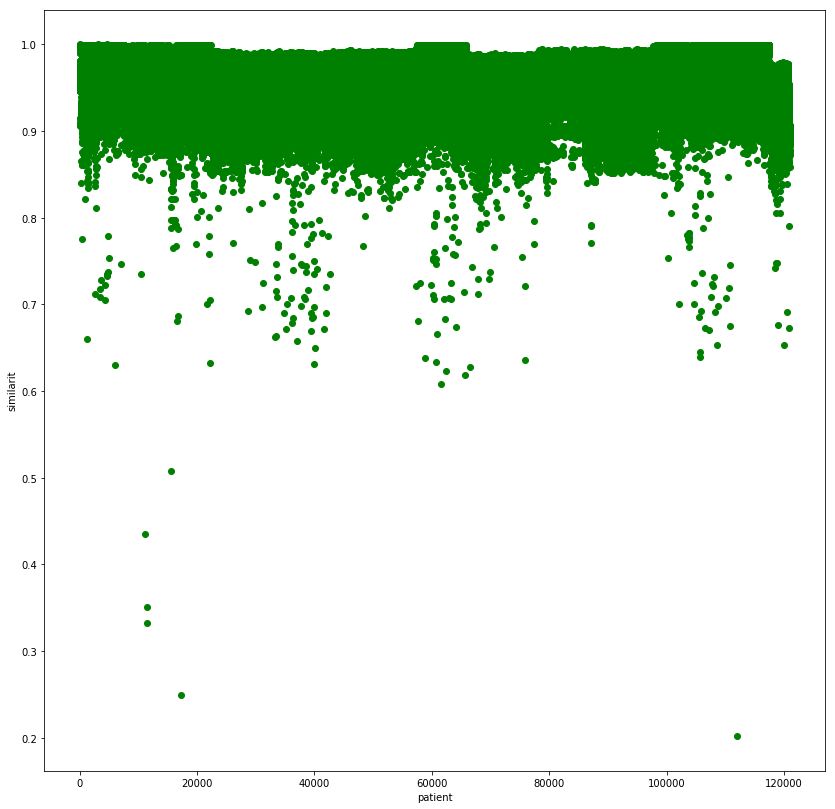

In [38]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
plt.plot(items_C,list_C_dist,'og')
plt.xlabel("patient")
plt.ylabel("similarit")
plt.show()

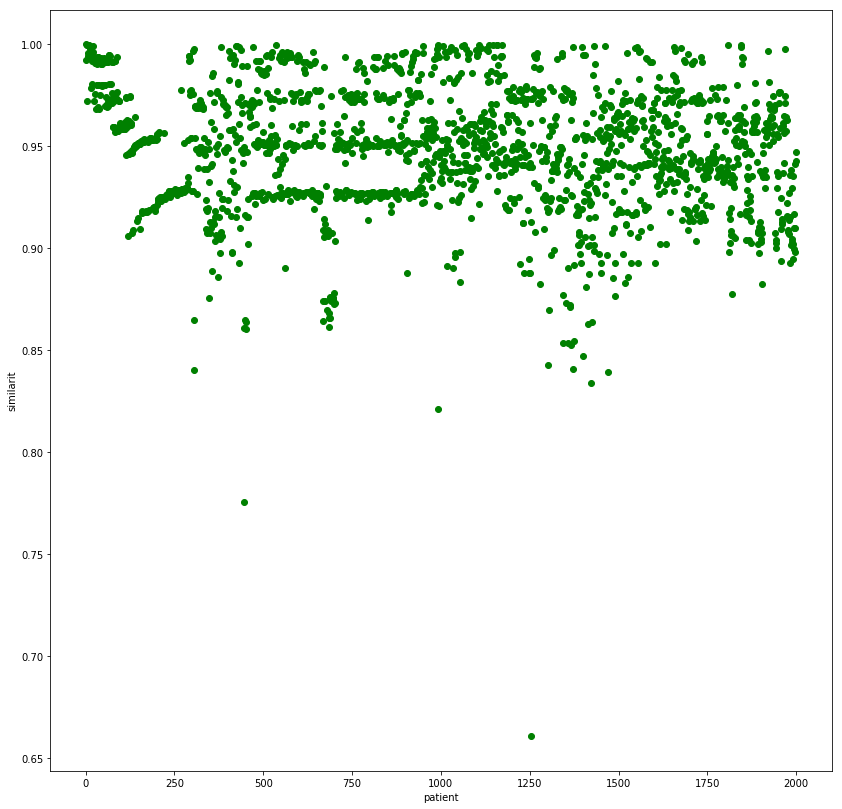

In [39]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
plt.plot(items_C[0:2000],list_C_dist[0:2000],'og')
plt.xlabel("patient")
plt.ylabel("similarit")
plt.show()

# Euclidean distance 

In [40]:
import numpy as np
def Euclidean_distance(x,y):   
    return np.sqrt(numpy.sum((x-y)**2))


# Query for calculate similarity

In [41]:
query={
 'state_code':18.0,
 'record_code_iodine':3,
 'sex':1,
 'age':5.0,
 'weight_in_kg':5.0,
 'length_height_cm':59.200001,
 'haemoglobin_level':9.0,
 'first_breast_feeding':1.0,
 'is_cur_breast_feeding':1.0,
 'day_or_month_for_breast_feeding':5.0,
 'water_month':0.0,
 'ani_milk_month':0.0,
 'semisolid_month_or_day':0.0,
 'solid_month':0.0,
 'vegetables_month_or_day':0.0}
print(query.values())

dict_values([18.0, 3, 1, 5.0, 5.0, 59.200001, 9.0, 1.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0])


# calculate Euclidean distance similarity between Query and dataset

In [42]:
import numpy 
from datetime import datetime
start_time = datetime.now()
counter=0
list_E_dist,items_E=[],[]
for row in df_concat.rdd.collect():
    l=[row['state_code'],row["record_code_iodine"],row["sex"],row["age"],row["weight_in_kg"],row["length_height_cm"],row["haemoglobin_level"]
       ,row["first_breast_feeding"],row["is_cur_breast_feeding"]
       ,row["day_or_month_for_breast_feeding"],row["water_month"]
       ,row["ani_milk_month"],row["semisolid_month_or_day"]
        ,row["solid_month"],row["vegetables_month_or_day"]]
    dist=Euclidean_distance(np.array(l),np.array(list(query.values())))
    counter+=1
    list_E_dist.append(dist)
    items_E.append(counter)
    print(dist)
print("Done!")
end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))    



0.0
8.464631273718247
3.3566243800253304
3.8807216055780156
16.566365030520288
7.725282674439881
4.1545127993555395
6.900000027536232
3.901278839048678
4.640042178687711
5.716641559517357
5.661273736537042
7.494664057848159
7.92579042383162
15.48626600457468
9.436631341744839
9.782353261074025
15.180395134661692
10.602686873079648
8.302225988767859
7.645257204307061
10.693834708958054
19.06041195260571
12.657586078097534
14.41177744287728
15.488683964850809
20.868156965098787
15.141001172974295
22.853648654056126
15.661713022624358
15.725751367837447
19.77243864481634
19.77243864481634
23.2260500835383
15.209844755388744
15.280684832919844
20.20765389655698
15.45021924385005
23.678455852589597
21.74417732550582
16.421304776510347
15.50126597420486
16.040550117843257
16.62104825102922
20.353359549790337
20.446252666027615
16.664010513770126
20.434023782971053
16.234202412284585
20.465320100184762
20.440873924639973
20.491445248274378
15.910666936462047
24.042654597257794
17.001448176053

25.3940782089652
61.99226832104463
47.95569459120076
36.28344110397401
25.267556717716687
8.86325995066476
46.96947590084438
26.256035258260653
62.164630863445126
61.82670402494697
62.05933718296058
61.93554174775897
25.511750674601487
42.668819047936445
60.570601223695164
62.05127985455573
25.09621625663925
9.27938277196126
60.568608336427125
47.29490709711283
16.992328580952094
63.041334949380634
62.012428846065966
36.87137641512098
61.943614130823796
19.978723369700738
27.764350957352512
61.5243962407466
36.07254355802401
23.83839884646271
26.231835850413542
25.762363759620865
61.532522561555965
26.143052845508333
60.56234583138191
8.731949288021287
61.51651268389971
47.18697976581101
13.871800048487433
47.18811968837625
11.89992288977118
46.91320323453219
61.93554174775897
36.01788581171236
9.519292538239144
47.66086689648577
25.969777001026145
25.527616654968817
25.36039012876234
48.172588636324356
61.93554174775897
20.02146887925662
61.47683574150831
25.24102240566022
61.47683574

49.14886630858394
35.50337676766693
53.45884796088033
20.855197515320764
18.79991582388626
24.15593956945226
55.83545843748862
64.67898674522039
46.78662676154927
63.222791212571394
43.854858515842025
17.690573609976614
47.97372792190032
49.32150706759737
31.83972764873368
54.161872413391684
48.75805821938086
20.758837424167723
55.350956815980325
31.572428806563742
34.85065638901994
65.32871748372528
55.64924454945025
21.20116151542272
18.745381604091886
74.20718006001371
48.596409943729974
18.784497875457273
19.583904912019626
57.07572526253625
31.69492484208688
48.621907967499595
58.835376765925425
22.087311501471305
58.56962697839557
45.669555821406085
72.31290049817736
44.71474433277614
45.79102773192076
20.99974593853522
47.795906077032605
19.050966654819025
20.269187808099293
19.050704218034213
21.304913256406994
21.29622805106638
62.272637130511775
48.45398268176228
47.56204702201669
72.31981456322534
47.1485783849791
75.21103578996903
72.32672796732408
46.451142372653464
35.296

61.74472914499178
58.677177858077
60.30042445446302
54.04986757915817
69.87232151137097
49.1386920808751
48.03955213909179
31.322964648090878
24.572534311361327
30.996425482070336
14.866380988089684
36.99998011086653
52.12569620949473
50.37210116447912
33.06795672409941
10.949428450837104
29.58679405994403
62.35335864721638
62.24388592454999
63.003185100345476
29.26376819662073
55.612419812380054
27.138500213267946
41.61404268662826
60.7336900639868
49.630214923215206
27.12449761277689
47.42752169995823
35.17638512334022
33.238955202375784
50.39839923771907
49.120649805601445
58.95872394131685
28.7267863469887
7.314324781074086
64.88498537403235
25.65790970101688
61.20793396601785
15.338163285186447
43.87389435877014
60.20873017585076
26.386706214788084
46.57036209569904
40.06879530263586
43.26012371046266
58.74351988763023
47.60357063708563
62.557584134846465
44.58607791592042
76.76386711981355
65.42345447715611
66.37189460701359
37.35154720256647
46.755836783491894
48.79150601712411


42.60467515806843
38.55204030917191
32.40586317936927
28.58564730914872
26.494893460495863
27.920883441868025
34.39517903755607
23.834835690707617
26.975915819115414
20.789884808796668
23.02172836430838
34.806462618312935
23.287105590928245
28.469443480388605
26.06722025609944
24.501632715392685
29.72302670431691
25.47272848518619
35.511803248293994
26.616723631581724
27.80970981006456
30.29221372012206
34.803016284224576
33.130471749517106
32.762450493599395
22.505763628080462
24.54994952907238
24.46936953254015
35.886763360325716
24.473235695409002
30.166372675547255
26.4546793501642
22.069209156197715
24.023320837886025
37.55995145630517
62.76503613159168
68.77281387437918
61.06635856508888
61.623531998742294
28.649779922366054
93.18513748339916
64.2361262561808
72.16626562459776
62.704864886227135
63.985075728641604
66.36882797057963
57.148316339153865
58.553651179068254
58.28876336756512
69.4917252426503
66.1486954489656
64.5832789164502
49.13308201202135
51.282551991101265
50.211

58.201360937047845
25.32149880527486
62.247873317888555
61.208999119315756
42.49491765312119
22.906317932025424
48.326375507837525
22.21844716633072
60.20142495978311
48.290353584588026
20.878444014893198
49.57064224643976
8.02482974795448
62.99318481699742
26.28261275015062
21.374501141852047
52.442431844113806
45.36748039845869
31.909376970814336
35.60699857816629
75.54068816511601
47.17836710744159
76.23286628220141
23.924243297605667
62.39584389034572
44.37475193986465
48.27723475084705
66.51226445392153
46.07817756513943
73.25974277172969
61.04310922117583
76.12749547081724
74.6844399447388
24.833228352412043
23.501050724659667
23.96871397891498
32.087819948783434
50.51691447153638
32.36492162736601
49.77357372868179
36.017336252484284
22.631159894336605
50.39207582932461
59.107034769039096
19.496137045143826
62.262441159887054
48.78399912598924
47.7613684574105
35.20082601226204
47.29335502360138
62.98524695028507
34.26468073316219
48.283759145165924
36.313883735364136
47.1904644

71.0313305675742
62.54198522752536
54.78888095397089
61.94658923944078
58.58643309162971
46.15896251650386
52.94808926108669
57.993348012720546
46.522788153764054
45.62674718188884
47.88120449612787
24.859996510117004
43.36369273482148
46.29611150409936
46.613392675770086
32.66328150079231
38.86836684760502
40.31191047817015
47.694964975351596
35.051106275266136
36.19405746914838
49.393523243437535
19.757261789099967
24.273852091911763
19.555481883226534
21.676236835831112
20.743674358223064
17.377181698135175
20.317480647954387
15.677594389719758
26.928610114151848
4.821634638014482
5.808613552303251
20.265646413820633
27.403283788626517
42.305535350879715
34.62281631356736
26.395817975638515
13.487702071980571
35.9057075919694
22.81949431523465
33.499999374328375
33.656053770458605
5.2009586251006645
33.71869090578702
21.004269218495235
7.835680728797922
23.93010454887335
4.762353243933193
7.762087348130012
23.509360527245335
21.267345388646913
1.8165903831103485
28.324018780533265
3

61.21635143496377
26.682190792418574
26.682190792418574
20.189476320151737
63.091203139582
59.92703832494979
54.41516257441487
51.44228028892706
48.1415730883304
39.38946491639612
10.145782166426963
21.095433250660527
33.75706294219073
35.10697697039743
21.590275204359973
7.307386159472834
17.27670056360474
50.96832497149582
62.51439766805724
67.69409058403843
85.34523921110069
91.26192068407032
18.652693347921947
35.10085260901805
4.868262679848843
45.96922688712536
19.35716931268632
8.312455628066862
11.098564261313667
19.362073889953418
4.324346924104151
21.49465204370623
29.747772395929093
4.907138221000204
21.292472800570383
29.725861400558536
20.370057864499096
16.473595084347146
4.574931925176706
25.055453158431998
58.99004408835381
63.404821024811625
60.52643984574015
63.77288866115752
62.66810738333327
65.40259862880067
48.567578980221114
62.07624262147316
48.15195800192405
47.63580722943618
51.438104375302544
58.00387838412188
37.47278801477159
34.77351770219576
37.1202165708

36.7600320103234
35.98471834654262
55.3391353944024
39.74581664024531
36.717570091170266
38.98689702894479
41.372310430353664
38.84006279947968
28.962895417465198
3.899998371795046
35.318974268797795
4.686148269101608
27.94021711609235
26.913564784323928
25.55874256224329
4.949747448102783
9.737911827931718
30.52687272551843
23.72024399705874
30.940092250719395
4.162930953066726
27.04773496838508
29.74104837425878
28.26126889867167
31.59129414253251
2.727635888457996
37.3885002560948
40.03298575425022
19.1158928986605
25.320878186295218
28.297172339299223
24.358723483652813
7.343700929369059
25.575366634381343
5.721014535901919
36.27739367378846
22.527680432081794
60.0560565505262
70.51305776371065
56.96612974742098
35.82638617555504
69.9002138766399
64.81897804038567
61.27062856214224
63.114971916337055
63.11672785552491
64.61060218261397
65.27152004655932
66.19818660960435
53.1026336823327
66.35872152776906
58.979414622293376
52.08003387479698
57.5021733189277
45.20763157255643
52.08

25.051345003412674
78.097438344673
36.750780066278985
36.063991231717225
24.857592162556877
8.949859595546792
31.77058134627078
38.62473441306754
22.19684596919123
5.129633911299179
31.51774321022289
63.5999974842768
55.70411738933239
24.021864517143566
13.626809770449428
24.289296029321413
3.8327536471837114
35.687110251181856
14.311535374655092
26.639819089475836
15.009997594270327
9.700515160546939
39.96623497904201
6.363961044821143
22.51310465306853
35.13772684167274
17.196512311512596
27.5417540658823
66.87944307632952
54.88059692095195
73.39244720533847
55.787350015254525
51.91539473745274
55.19989514233264
48.1368849843861
55.722781891471634
51.15406351938755
56.022226981797154
47.11314394014187
40.62939968724057
41.67431005962239
40.415567277294905
46.83512857335855
7.624304251536729
5.032890851190897
34.075330230909735
54.47383470735764
63.645435800129405
14.194873490963047
37.95429151947822
76.17584841667339
69.8161148876103
60.164940576053105
22.222045125573715
24.564953917

61.40921419126285
45.23569783837237
19.402767661162645
5.029910315303942
3.5898392120778158
41.90880710477863
62.05118666552646
2.580698316348506
17.00718613893708
26.61483283364798
59.46661595991921
40.964595847457645
4.566180780478259
58.100773765931905
76.88809973331375
65.49067413704428
78.23713858903585
40.382276365077985
59.55668235827545
38.48971609073697
59.76686719014573
73.94200354467006
54.770417049028566
40.82166528530574
64.06089605152678
76.45286052202364
64.64062109850121
40.51046932517006
61.41887665632219
67.30823422824669
35.3946064883556
76.52718394139433
24.403058248159006
32.24701342140089
46.430807031538976
49.37133347120086
2.1071306366715943
51.25396220512636
68.13700407112418
44.15257705276104
45.66835459751667
71.34262305943064
27.20421674231827
45.8055516037578
3.8026331403396014
67.65847995779983
42.07075491057344
5.028732866488734
51.9233882920263
42.3595140286753
47.255884498383075
5.934645362614687
51.290531657651215
42.483056909784686
3.4985695848452174


26.092303115392788
41.30205505782994
64.88859613522241
64.29797750629487
57.84159323877586
65.77142165408925
71.06335114811291
56.04364292584843
48.46823495445248
53.878194417779156
65.89575030303548
58.86161675829165
64.54029679045487
45.228624207735066
48.092930191453306
41.28365238687102
43.690387437055314
50.6589570303219
55.10979894174901
47.09490350770454
46.951570127100126
57.90448972575444
51.373127974890984
61.610045711717355
48.408986081098625
43.366806988755826
46.91779978217224
45.02676795640576
73.14623248389759
36.764790827638464
38.626912500542076
33.71616759241775
32.46256699254599
38.52907923114697
38.815590352331384
32.62744184578376
53.93922452538599
33.191715267518205
65.52694031770446
28.5043840543873
23.812811014241916
27.950847142797226
28.145158956381845
30.566974815967658
32.60076818726829
6.207254120784893
6.694027201916646
27.039415052844635
34.700575495515935
34.77916113709474
1.8110766742468525
27.608333604185606
15.42135355481162
18.370082084193744
23.7198

55.29086626197859
58.88539654617264
49.15536308481523
48.23495681991493
54.70813409832217
62.569161065176516
54.915752898417054
62.37250929375858
65.65668235297913
57.546415434847034
46.1278650969238
44.00386283498303
49.32068461000922
48.224589779686646
52.48160307883632
33.45426987613904
43.37510745116375
39.735248060129194
33.856017951318506
42.60716022454447
52.47904269706147
45.459211832146856
41.61598176662424
40.07842235318153
48.83686844997349
50.80747903999963
46.22228631298992
17.17201472345365
35.445732527343836
15.06811671651441
5.367494776895457
6.083430231581192
32.418665720229896
38.161365069924
35.00083214361533
33.39296249810731
37.10606201956776
33.69347055558393
31.657067016386865
8.542074306195918
31.63760664692497
25.63882647476342
18.55792052386261
34.23813394447799
17.03672362867978
12.903657583974143
30.1318759840804
24.16481834686472
22.643968820925068
33.78845753508155
3.4698703030516915
34.54475292139171
34.72247171328679
34.12623555096579
2.700000003703704
4

34.13470613416123
36.784644790999465
35.118938252743575
31.42880696876687
35.65709120309092
33.21234521379074
36.09471092370105
6.737795817895875
9.034380840987888
6.81159984758758
8.02482974795448
8.474079513434129
7.962279352274394
6.81159984758758
7.962279352274394
8.02482974795448
9.372835329824644
6.264183962815911
7.587492107409998
7.62955022265461
4.7968739799998925
5.575841586702495
6.917372110853156
9.01387542181547
34.7058808622623
34.893549852086075
35.55359687662468
40.08802884253604
38.07518669159757
34.83357808301559
34.6464740478096
31.115909869390222
32.529192606419535
31.62404097391731
38.16110722188239
37.877431863842205
34.59665093076982
46.98648658284636
38.21386975431838
38.490103647893065
36.80339334771879
42.61044395919856
33.401196960588116
31.05524691361412
34.79037029811567
35.12119251713336
35.89245396661443
35.63226545233317
40.41534503626072
38.19436927873019
32.469368768117576
35.55699475940014
40.635576265139896
34.14278775554218
37.81359874100237
37.7424

32.63770582623737
27.908779271046612
21.12108003433266
21.180419547701927
60.81442182965513
23.99291748989003
35.47745696072368
12.291867087631605
56.786440305058825
56.742664148945295
30.596241055397655
11.929794476016806
62.67766680724483
43.8978341251594
33.10604126983474
10.07739841427085
60.473878016214584
12.249729440316857
73.82885552194345
36.85498541310254
33.03831058513739
56.78688055105694
73.82770420865057
73.830413166391
32.74156309463556
26.23134701511924
34.35550839573426
22.88798643611991
7.456538110947734
11.786436655240088
34.67938649370856
43.58749641674788
45.97705993862593
44.425555095237705
11.195534829564867
42.36861989704174
57.385187943580085
42.48729165668248
16.12804891857492
57.42708243154974
44.85543554932896
9.754998548436642
58.57636102285632
26.89479510940135
60.48214548377067
48.3280450090835
22.133459648233966
44.45638373192315
35.66707100393865
25.005397734889346
44.16994394919733
10.556514405806542
42.59389678815501
12.278760256806587
44.145599423671

62.75491945975233
62.669688976410285
29.252007936550285
44.565232465230125
26.04707230534751
57.142888720119984
34.23068749528704
24.95395715472801
25.39960820990495
44.19162633938707
62.669688976410285
62.67766680724483
34.05451612635253
32.49463007220374
12.392092354398656
73.91576224676304
33.17378330730472
36.16655850146653
57.569383462003785
31.00197376619768
43.07214645220291
32.77422592709108
23.22334391571529
34.428184046214355
36.30895141421742
60.4742914180894
33.03906727678615
10.879061485254766
46.37779770968005
32.93964124030499
34.68861418217801
48.89396411910181
42.95742133927502
33.356856570126865
39.29674241200197
11.347596813604762
38.99646002466432
53.496729873142755
22.53464079145714
38.50121890012379
23.461885022663434
56.687386615719106
33.47088126894792
35.34543767843314
19.0234068557659
43.054266341211864
34.18449875777033
59.97849360629205
28.79671774368347
17.582504170279133
23.797059390115532
56.74803903572352
31.141290360548663
11.730306414070656
60.71490499

46.07656607647754
13.106576808694408
24.789316344277708
17.79269675391223
17.270206793686224
14.251668611663648
60.10199599347763
49.29999940567952
19.322886764661888
60.385926807493846
23.375630949274285
35.59345806952463
65.11953056458574
73.830413166391
59.19656287109947
59.558487448490645
76.83792851736666
72.64844989151487
40.649526978739054
37.00568830854748
78.0249312617448
18.087135010771693
30.170366271050927
11.713244169229426
46.03801974852587
11.736698392988854
57.55049782234737
33.43726978282419
41.502409055378955
41.287891171625624
60.85499094338936
44.006136644790814
41.89360441589191
51.34631147487859
59.890265528508344
59.744871780932094
52.26864166409308
38.50402411021497
56.51990147165561
49.336295648538524
59.970741223700166
11.40210301497636
60.15293465109073
45.48080852926027
60.16124622328225
46.03801974852587
44.912293556166084
55.926321872192
34.804166421517394
59.80730119435266
33.457587855323254
57.11829183690333
50.23816587169577
7.841556573793309
49.4893294

5.898361238420107
54.05423125158659
14.084265107991573
62.03112055186494
36.13715895511168
28.94131939632333
62.333056369794676
36.06791174086751
59.37487302839807
68.32583642371313
10.037627867178262
44.72203099905013
25.587806496473387
53.23000528040572
18.21828581675479
60.39023229297934
54.14332752980741
43.55778928652555
67.59329294798425
17.86461454658015
60.20473338866306
60.25122340401065
62.51778359276677
61.759641089889904
25.490019855020897
49.49030139451568
38.09581249598668
57.354162307368775
69.98421193326392
46.252026343501974
72.21121736254003
57.32058909397217
62.40675660176562
29.96481217027734
14.921801050029813
37.30388662592681
81.47257138693979
44.038162909912764
18.775880996842474
69.81761903273414
47.728920305408295
9.311821465213143
78.20185354836546
32.38601188024845
59.5275860433801
31.548217602267187
30.233259275175758
8.652167380489123
50.34752536274268
72.48963563048133
78.15740462937597
36.646556323889484
7.434424543896708
66.18836685400238
73.95390393562

50.75726691223636
18.798243346651986
47.889979414487165
25.917006396307826
55.88497055846054
15.35542612604484
49.25971709216381
10.921111129317097
10.280564789932555
9.428149786676121
7.5061733142950695
77.09409768847419
53.02386195667006
26.304751802668676
51.39007610813591
61.73726521639909
45.262565454468096
71.19913814394067
22.57830729704955
39.213900186031
47.441869790400965
17.836604298405092
61.96361768328251
11.299466957522066
48.09136961950667
12.046430944981001
12.338962512302281
54.00475360699295
64.20737632733452
35.03214154072467
46.26662957347725
69.40739961156848
51.14391395268846
63.407727348644194
39.45378335735826
41.52690642794421
49.673442628122395
11.380595478450719
39.328487958730385
72.81469569063653
49.27453796820427
67.26224721788591
44.63294566348953
75.98723510748368
12.482893837737924
51.42512718579556
61.7273838405614
49.098979588174835
44.16661694538083
10.889444270485113
54.96154014771936
37.816132685931926
46.06842672243107
17.89258094568481
53.8994426

40.22325254625738
65.15706608459298
60.240352554413235
36.41571062543246
44.235326499023806
60.992457914073285
30.232450431438064
65.77636283346777
74.88190639186479
64.52015137908468
65.95778883043306
46.185819703887475
52.76722394062437
81.76906446694863
69.21307606283658
61.71088965648798
21.864587730315748
20.828108084429346
21.382469918526223
19.98649586137297
27.77500944607153
26.58460291614978
28.326331317863236
27.066605196983232
64.17489617163356
61.59529134925819
56.02963462954227
7.402071842321834
47.164597553309605
46.14649783424153
61.02766214708206
61.76771129902746
19.81261903232422
61.04404595976902
33.74750742420851
74.05662091274897
61.04404595976902
34.2183321824283
41.49517861149673
33.53043366137696
61.04404595976902
34.23294111447347
74.0633721958068
61.06580217033406
28.339547920176866
61.04404595976902
74.0701228635042
61.319653635518854
16.143420985652455
61.607302229524834
42.148070675655
31.462585039170065
37.247683696036844
44.851309324032016
34.349588896331

27.54015529507179
61.0358546031625
34.276730552183764
21.31900380599469
47.18579513334133
37.98065323819485
47.18579513334133
37.833581961532744
47.164597553309605
27.703969247745277
33.19479262394944
16.94901509682555
61.04404595976902
42.35032333666425
17.714682094240615
77.10395514706104
48.409702151176866
61.57223335790249
8.273690367662644
36.454001938703634
61.04404595976902
48.409702151176866
74.26041953019119
63.4369759462098
34.69717938603955
62.88449664265431
31.510791442298004
61.0358546031625
74.0633721958068
37.11999807848874
61.95691796385627
41.96236450344524
35.76436819125988
61.12080002246679
46.20183741454463
61.0358546031625
74.3611451439527
42.44926234364985
47.83826148979139
35.012772774332056
61.21824298484903
23.940336498851973
61.02766214708206
73.76923417929727
74.0633721958068
28.740213722239716
9.64416924778905
62.74713754070394
25.737716320153172
62.90437316339782
31.43898699990214
45.98303809014815
75.27549339539397
68.729616206698
32.02139729743248
47.0457

7.2055570060887835
62.733483186572705
6.833930146280645
58.9947077892449
7.799359182651109
59.61358640712716
8.037657469682856
47.45190645899305
47.4567953864171
8.324817670330287
60.07070967385024
27.926707738818184
5.686885518356843
73.9478864127975
51.61201210106044
59.382658715487004
72.16127707933114
61.12086319678413
26.460746083384773
74.11625937808789
59.5633269846472
50.56372281982411
74.08414070852142
49.31622387287982
27.947272283355332
73.64298951753656
47.51908806022322
30.82695343703882
59.81078565041594
32.32259364778767
62.59563295591808
29.955134039426433
62.373551398008445
66.10294787919837
59.01165602775771
72.1795671206194
57.30383679929308
75.68388136849221
44.17895365895395
38.68488104053056
75.76998035449132
62.53359027754605
30.419566961414887
45.73117217391223
23.41248497912776
60.02707455806934
73.59082758741066
36.47656655881987
34.21350535497996
29.829178418454905
6.74611511671615
28.71027495375159
9.663740803857888
8.315202304468812
34.852258347487556
38.16

28.287450786523976
33.23010725832827
27.892471677497518
73.63382313312273
28.021599556056827
25.91312197941452
32.81981156862423
31.389807586539952
33.486864087280615
47.02488642623182
25.844728077501628
55.59658208379361
29.79026776314715
28.809219691087826
75.7344036934338
54.65436960024335
55.3243144008131
75.49847616819827
31.944483473676655
54.67622990294781
55.27512948333998
75.35980282352125
55.702245218662455
75.54170988533423
31.2705939201673
73.14854689602522
45.159828303482335
49.40601301942141
39.126076428898614
28.723856321531915
32.2318826218235
23.240698612061532
69.77385009099042
46.27633587877997
41.82224086870545
32.216366296449515
37.24720159253893
37.02369574306754
60.07807875705075
24.430515095197766
37.06049001187135
33.52453217193356
40.72112522978707
23.74889558695318
14.094684937119768
55.5540255149887
28.918871875115784
29.669510657238952
20.707006219554625
54.79334007340677
22.962143861074598
47.60398945172567
9.128532629983795
40.93409171680759
25.3262716418

59.5514529389367
59.53465836920871
38.47193595336756
45.22719604801582
62.18110577981065
53.70635278623944
61.36255592910075
45.216139401386954
55.21077848934935
61.699675186503214
59.75567046163907
21.537413155174278
62.687584630068635
59.53465836920871
53.99342604799219
6.534524582554115
11.83469476496965
38.49948192274805
42.84693819166084
28.15847864640446
73.14027542469336
45.16613724240762
41.52758068224058
69.89628142269089
76.50679643404239
47.95143493494229
47.76033744562541
72.14381410626972
73.10389790428417
31.731058009464547
30.274906594736194
47.54850093746386
34.031308605459195
30.47425087512408
54.434362089768406
20.47217479214187
45.91839786366308
29.790768078718884
29.64084970307027
45.91829512209713
30.77076648899088
28.735517611485633
66.82761355457788
60.87240882961676
36.53176622612174
61.16543269200345
32.86174458769662
38.934045153310436
18.237013335610325
29.079565741072592
59.61585484348945
44.77376587601275
45.23870148799592
30.693666271877046
45.929285454551

25.330219366927835
36.72194338824349
43.983859976132166
39.064832998610946
35.2156374954275
35.46307879922443
34.74348691193803
56.07263100640098
46.785829389626535
21.371329873164033
23.9720705951045
68.24551192921041
24.183879773105147
57.00652524119703
28.589682879960137
36.53903640231037
36.36057109300347
24.017913427620517
11.806520799962392
34.5001462083859
11.317154738013482
40.07057688890141
45.883699106275664
27.988212403081427
9.532609983571854
23.790337693624146
40.42796004499857
27.45706027630545
7.34074746549566
30.207946489624234
26.308553168123883
28.643324494199362
29.089347882286237
24.079660323185713
45.01299541243635
30.295211436793373
29.85047974839538
37.32988107026328
9.079649466141031
22.0737410603641
32.6925877933415
29.767263384463156
30.486883546863297
30.19436802617362
28.438003240734062
30.66349396138698
32.98135926974515
47.46967575621308
21.92492397893817
18.646778750288295
35.30723640175435
23.490664140169898
11.911586657576965
20.045977972807133
17.58250

37.84534174743319
37.88693510011091
27.572628964246697
58.18427558541914
39.42562454495818
59.24280350050974
59.27562473664884
40.6609131965824
66.63970394892225
39.44882598506588
66.53713035591493
39.95672433921499
19.213018826219656
72.18926449909294
42.62170619437951
53.61035179776392
59.44131493767614
17.27657090744619
47.709224080884
17.136775844727048
28.795312090281048
21.429883404256216
28.36694976975765
31.341505641880083
55.01899439284597
17.165928065572814
17.05752639020106
16.782999921123174
14.372077198936172
6.69552567376118
7.13731615676304
14.392588489642193
24.735399131608954
16.94963276062358
9.079653398010032
28.707662566639172
17.582504170279133
72.00458255958436
43.87459520018395
21.087672466159205
13.6567161682803
38.83556600861333
16.74950153589594
16.213548931446457
40.19233675310808
60.39586013527749
55.2377571170301
47.11209784885423
7.650268166030782
60.44517982171952
42.69437947177592
32.51430410450147
40.68795858088731
34.004999119541246
67.5512392884098
7.

46.13566150350137
26.107853017371724
74.24542478169687
42.248669084362895
26.995929157868858
62.018731362000885
74.23869005454371
43.30519368528463
29.275074622905386
47.460502129303876
28.601052482324388
44.322565816071716
62.08365261000677
23.218745625392298
25.136828865564446
23.69092709660569
46.237756308021744
24.941332307971816
28.827594349454035
76.34166557784812
41.31863934594169
67.93356855104857
74.81350085459175
74.24542478169687
77.44346260724659
62.6993594863617
41.13648101527407
39.133120667911975
46.47849804812301
47.460502129303876
30.56683018779277
74.73163499241768
40.82414522423433
40.04061494044983
50.839167941749
51.28909235509398
64.5266089760807
51.46755984112726
48.80984693368091
41.18118543315626
62.97952175429728
63.56398286608542
49.14031094610619
50.72051852938176
48.52103833605954
55.401543159097656
48.51186615344085
47.61156617051536
64.49987028011776
41.69054090809284
12.70994377502271
32.96497911420567
18.747775850815305
17.37044651245921
23.825409148568

47.287208235631766
43.423543238607756
44.031853372249024
44.89990043518314
49.75041688624563
46.14433812939569
61.277020734954284
78.08700210918589
6.603527603651016
62.67766680724483
48.27622674231318
50.23816587169577
50.23816587169577
68.57727940471258
56.95149767786649
38.009075232107605
60.16124622328225
60.16124622328225
65.80227889214781
35.193339973485934
45.25598048960214
52.44209326745103
52.45525792287399
60.15293465109073
54.19597891426298
51.11745030882554
53.017299533975084
53.021537289596026
60.16124622328225
47.806895552479226
51.21768457485522
43.869476965304244
62.286543141773556
77.70184847376507
56.03779006594777
68.78861279421193
16.870897752726574
16.870897752726574
36.26436240105752
50.22821229301335
36.26436240105752
50.23816587169577
36.2781474217639
69.21765129034658
50.22821229301335
51.21820133971163
58.415238109418006
56.946938501338614
80.4110060148485
46.03801974852587
21.877062098484927
60.15293465109073
61.212445067584234
44.709213606987646
53.480847099

54.39433619482133
29.44588548535557
45.20664784309228
17.778142402461825
43.555988219247624
33.360769105783135
41.13394047607595
17.86461454658015
36.26436240105752
58.48059568882657
60.794358866224044
73.83989374586072
73.83481501920352
12.356342291002038
46.02715787842715
25.17478858779158
13.56192873676044
60.28142462417427
46.03801974852587
56.7373768720409
58.7203833787895
46.48322081913009
44.091837186944296
43.60746270180569
45.83350239704578
62.708292245922316
33.34696191829188
58.31500482654536
37.0451620117288
15.840055887531355
31.99501710468928
67.93163793579504
40.476177072561676
23.4011464408817
72.21736130349784
59.332988296157986
36.26436240105752
50.23816587169577
45.24434781505155
70.26848297779037
27.40693303527414
31.384726525642364
31.937455426025405
48.5065349770032
65.02043754574363
58.48088083426939
47.66781867685333
81.6561687981992
50.22821229301335
53.137116964999386
39.8133627074535
55.86307625929687
60.15293465109073
63.34613852123914
23.335596320143306
36.

20.53533620900047
28.666373625022302
60.944400245797816
26.81512742444756
39.36255632564245
45.96498603632988
26.833767137495986
22.27038422606772
50.39963601209851
23.197940703818585
26.181294832316333
73.34427790233269
32.509910140555725
27.252175311511547
32.509910140555725
57.17630569842722
32.494526575209676
60.16124622328225
20.90799973450074
69.70442631741518
32.509910140555725
63.17380720203589
26.833767137495986
46.03801974852587
17.94732601342595
27.652143844724943
44.74253297866593
73.83447642341619
23.21948433746717
48.85826372682518
73.84341479373771
28.568882560040034
32.494526575209676
50.39963601209851
36.36624781243226
43.83195100289287
11.967880158017707
65.0127472011447
36.352496199782955
36.36624781243226
26.81512742444756
65.0127472011447
35.553495732337765
69.58529497352166
48.08046390384934
10.779448926183374
80.31573475129234
66.03774602812572
63.78670629900273
60.86411030089901
36.36624781243226
37.948004674677684
50.39963601209851
50.39963601209851
13.40452416

79.85223790477009
48.92340199092514
38.20856261817511
48.76713401494922
34.48202375818451
47.475678545124566
67.99396963996146
48.777385744133696
30.692036248664888
31.09664112230386
65.19815884210229
55.474624140008686
38.48767549761043
31.352848181454895
44.83493291184188
30.23145842015167
30.08323601425484
36.48142345560283
36.426087361670014
27.913159135036704
75.79531587321212
17.89258094568481
62.396919372180484
64.96868412089013
17.89258094568481
79.79279352422749
65.52014891252921
30.13454952723467
79.69498036840213
46.71466512434828
17.89258094568481
32.14982362952194
40.38692870664015
68.20599017857569
59.181837875483396
42.41803805363941
17.89258094568481
65.01915038202208
9.931122342563024
45.544922357162946
9.931122342563024
43.8746396780103
59.17845836721333
48.91318086534199
32.74217393332338
62.396919372180484
48.30925460897979
59.17381122185727
37.523338241811246
59.181837875483396
36.78171090837141
62.38890564145514
59.18226030256027
45.54184835599013
34.0822529020603

45.97340336189221
25.29051523984187
50.33103719527363
33.03186356164657
29.311450650033727
29.495780869293146
33.03186356164657
44.49981303367484
59.889145649274454
31.482216674179742
62.28718648347821
33.070076464985696
39.1083125112382
45.42840454517417
7.501377760044736
58.84083535670814
18.896920640877052
68.65236658440806
30.347999754338993
47.69245292915852
50.769872310258975
34.44328740698252
56.120672968167455
46.17141922098563
60.08993195935573
29.000018777396672
22.786182891758568
47.27938170492504
47.16545276364896
57.669487496248905
42.4486743891962
51.821802963286196
35.58090905372374
61.750950732762014
41.82032947502926
58.882422907010344
34.464037192412746
69.2778971984569
36.03789813488024
56.46255218815396
24.627221300422853
15.434053170181874
59.78770519496476
12.698031209601002
46.510859628693176
16.40518197765575
59.94105567038342
48.06682683098614
13.522203843309011
9.89053277453927
41.04267063446742
42.73176935483994
34.42224751827457
17.257279807304233
25.9971146

28.53666133606662
69.25083038231348
35.88724365769832
70.16941839319996
43.785315367086746
59.02187895506527
56.714399157110286
55.03892407516725
51.48799280562428
56.27542159550679
53.71334197452279
46.87636651955064
38.54612668836186
54.13393728847021
46.90675788705967
44.39030595034977
70.47714009123773
42.617963405228245
64.06174598494758
61.63221492369068
61.6016498736196
58.9014053069907
32.494526575209676
69.70277812282626
53.93925479974696
19.766389746655154
61.73726521639909
42.30063574930345
12.390236214218556
11.803393098087819
18.312049494425132
13.318181291750973
23.21948433746717
64.6143737773566
46.68244767371752
32.494526575209676
61.71790596253247
35.862094753653416
35.639086027813384
36.8032759847457
43.07091873265805
43.30519656346108
41.80949709665538
39.39912427617363
55.5587384409691
34.88701779108146
34.87268286718466
53.055481163356106
34.88701779108146
56.26046530913162
69.19586287950999
45.179574383511344
18.257330833850798
13.577035821598379
68.40699622728626

46.02715787842715
53.76126781201531
81.41117790819636
65.69462613026452
61.70764863835953
62.32843572941034
65.02502028321112
78.24491839372028
43.477017051418784
60.57890316068805
61.60319713582433
61.240345548665886
39.922937591432
45.88282205828252
73.82770420865057
44.68422487992827
46.98063369006426
46.13176716233621
41.21748578855046
60.90295495721042
46.02715787842715
67.02974827522445
57.21171151538819
18.537684566875672
59.104058337139726
62.68436740049309
38.55165309451724
32.509910140555725
33.084890167567444
56.35098186679648
46.11919276613589
19.06987142221995
78.14044982209919
56.807334791838436
34.0744766580501
18.39994438481087
55.828844818785214
32.61594514834744
17.929307170570727
52.96436316689971
66.32968487969744
15.222025549074566
14.271322794292537
46.02715787842715
57.20533135014604
74.09837977850799
34.48682415371644
32.08053846944241
9.931122342563024
74.08319600827168
46.03801974852587
8.99014118711355
12.015502354967019
73.83312202798959
40.742040654282924
6

55.16660144865944
56.71264331747581
41.32577834862885
37.108354282021196
53.09406687945464
46.152030739719365
60.95645923378425
60.97458423310487
46.152030739719365
60.95645923378425
52.76106445476627
66.0291595236529
69.19728234602306
67.16614451350739
86.85706585649783
53.047996403257315
69.47282838545753
77.78341659171318
46.13176716233621
52.96272200708722
61.95612131250115
66.90784635750877
52.67238291932501
52.60171026116927
80.29576509380804
67.83619905183367
41.230206840616276
60.86460319167456
46.11919293873214
60.97515842472246
46.19761835116612
59.411193740910484
68.79239699323782
74.03703962039553
55.30225981205471
46.17856581770379
46.484620470861124
46.141195708390576
52.60171026116927
66.44862636052007
60.868217670636625
52.95516898660603
46.06061160601323
56.994069066484755
52.95516898660603
65.8379063108784
53.02386195667006
66.34428302329624
52.6628894231982
66.64911018817305
80.58934929475494
46.079278864582946
56.79607303850535
46.09663698123759
55.2988599871212
65.

41.97468101933882
8.799239109842624
66.18330546897761
35.825145403883006
59.05991259858092
54.62859405249248
27.852827762664944
48.150951605085
64.73353000879838
50.61125628124299
11.753726590659967
8.306418688711817
30.732572902530624
19.092964422694056
48.73267189629579
31.130066519835122
11.805515196381188
42.256372669804016
44.99759927457502
37.10163124890009
41.66249950105301
58.11396616779853
51.6130210361226
72.69048953363809
51.98118369325597
36.2781474217639
8.727689547105376
72.31447366201739
8.963405481413602
39.18278811939465
48.10856402424868
47.81667003750088
62.149282106489515
68.86852147499623
67.0656637330312
44.85893260739986
68.27791187603805
16.18432431837073
35.11995414588924
12.771459934243508
64.86010529556684
32.87629780448777
60.95148291840008
49.30257309791497
64.3898537034525
61.116063917369694
54.44403698617531
8.656863284215058
34.71575982857403
36.74290324306688
58.20037179565108
68.62443604542058
30.669870151817964
47.1334714027647
44.86762487668864
53.61

53.537465016565775
48.37044484393338
48.37178862022781
12.188435230337527
60.96138058410424
12.708971376320468
48.32939198851982
52.67238291932501
13.134687184702996
21.314076848881257
14.177445185928809
46.06061160601323
8.598911670763384
63.11719204622463
78.03934839809979
77.7474581966507
55.74674801815799
64.3000770761591
63.52986119575595
52.57080865271145
63.14657485881559
64.95898636678378
64.24562173564827
13.611759942050147
61.91268044976921
46.06061160601323
74.58887253471526
64.21611878804262
61.010572398396675
75.96281919939518
46.09663698123759
48.84239901479042
48.84239901479042
60.85499094338936
46.06842672243107
53.642707616226836
60.87437820955546
60.850060988630084
64.6493612574788
81.38267560359515
66.01075599324705
46.15723065132917
60.84677413569269
77.23514262976374
64.76791845776748
63.24096706075897
60.15293465109073
8.656863284215058
60.95686936285361
43.54220764586061
60.16124622328225
80.71274541260475
8.723986884683686
22.455512546366073
10.620865981684206
2

8.353917280182511
73.63423053390319
42.438118125987266
35.87533876522993
71.56186075361653
10.559833608915774
22.91964095530314
61.30823694904299
11.138486808403039
11.635720832849207
9.652982416226921
16.625258954747405
15.205394167858774
15.953995545944256
70.05462096335974
31.04915503520186
22.827396417462964
17.47061197675165
25.594924244792576
27.189888371966536
5.847221340089752
41.01877731478602
15.488383014375678
42.65095586824795
14.908049891921344
60.89244548808991
43.303349216890844
16.213880807505927
31.382957770101928
71.67928510720515
59.40854776156704
59.28616847629815
57.30541047300858
37.70954571564088
60.73038843709137
45.04996406619719
66.37393995387045
23.314588225400875
56.53529667738569
21.413312623693137
59.4338260370306
57.25181184661322
7.202634422496602
6.079529271160864
50.25345898940693
44.0340911931808
74.86721539231976
28.29735037772973
16.766035163389585
66.55135830583788
9.542009012782168
52.347394280900126
48.96069638597892
6.011042136288387
51.24002413

42.16894382457327
23.281109187493712
60.327237191325054
72.80343321767184
54.785945058929265
46.38027361195723
55.85848135529645
61.05710377441761
22.194143996108547
22.067851160455316
20.210393675037828
21.425452842822345
46.33032767384295
17.582946285534742
20.21163366521071
42.76919293925526
43.98811319521715
18.598658930596955
34.41540287860479
72.79896932924258
61.079044592396954
33.92653667406512
28.984654013402867
30.0083310168474
22.70374729371059
75.55175222084493
28.107668007313848
55.8506948963037
30.391629327980468
61.19754962185987
28.396300889376704
63.171670189413234
22.1716859644816
30.094185035983298
18.990093776166308
54.923249113212684
44.54705496887537
29.40510052694956
76.58581631764427
42.79696047828641
35.80085124028991
34.377477443951115
60.31894849165055
28.259687090978485
60.31894849165055
36.87899235472688
35.93912847565126
57.308724446108556
59.07132114308396
60.327237191325054
23.667371060130087
60.327237191325054
63.07844255211126
60.085357204563614
23.003

23.875929732682753
20.843703495300666
38.891914588116634
23.0759630008519
36.27810670761857
24.047038720322277
19.404896306860316
25.45918361567562
21.06442862307625
22.092079606049065
21.966112141584794
22.028619367011608
22.385261965856376
23.35080521987794
19.005788607685002
23.375631227769635
18.352932454424792
59.85599187817381
23.856443807910875
6.987846303404506
43.160398091305886
22.76598398488414
40.53295009149964
39.18303355024984
33.36899679462961
36.06285914788255
72.58362832632858
36.00388598915422
65.68135301773255
49.35037927594884
72.590516605233
76.31913192326024
50.507128874249034
40.800120678498196
59.671016046150946
62.755795860780864
46.12515341459599
76.06050157341852
32.73988149031722
23.648678024363413
22.440368142627918
21.22003767951424
75.06708507621664
24.07010613271161
21.14261413299384
24.582718706780152
39.18915816702375
53.43626034515547
21.638160542892763
35.76284432101786
23.678262967892536
22.950166736141025
35.74886059623942
23.276171239632045
21.358

69.88747932197876
60.969006602371415
48.817821857596385
74.35711067490453
44.26205992178856
29.532353648160452
54.28084170312778
60.647672302570726
38.4584193954978
60.683795528559614
74.82840306995735
30.778076132208152
56.10258573720114
26.76751701970134
47.596532850618445
47.66476623670781
29.509829242474463
7.587663511532088
28.154753741005635
74.57271556755863
57.10884285747699
28.607166471358205
56.83247081660286
40.04876982474286
55.36135781860847
67.34914471349987
58.94471925049776
50.213981434210474
74.05443881483406
49.656517430041504
27.361652682175546
71.24542032285304
45.178976792087724
30.074757641739353
40.12542787809248
44.07504783797754
26.422337173687133
46.5409503456902
18.692243687690386
68.1897358252692
18.04611538481928
16.97468518235343
64.163540364291
71.7193134133338
72.30089841848441
73.48729890950277
26.79962829928811
67.39881151474415
11.75675440273636
44.131101351260625
74.11774355928546
59.12435985006519
45.79301194592905
59.946141867346235
13.687219640964

24.13814467601023
29.64169436418917
45.23394862246722
72.67255268201332
29.209074444768035
19.74915762133688
73.44514898834368
48.96601005187174
5.25648718241496
49.32799169649393
59.73733924088029
28.400352704147902
43.43892072600342
9.117453688620303
63.68492689640148
33.63361485954195
62.581173427413596
52.85833978432575
61.21903428183104
66.02915951910944
48.09224607434381
12.739466006075514
52.59182588958102
17.582504170279133
6.2481997343234825
46.059735804340626
27.615033750054895
18.018047539064938
21.055638558828274
19.514333356597287
56.55139358495071
38.05916590678262
18.69946630200991
35.505775473576186
7.6996060626466205
7.552486506310032
26.744906709876574
42.032499632181754
30.647184067708665
12.522380510909299
25.889188236018605
56.70714166487323
57.0351112585505
15.279261503782621
39.77098220222075
56.59994627095713
12.01914978690294
22.858284376704123
22.087607164249437
22.29103014398395
21.434085525629524
21.103373895237773
28.356655136316924
26.846044190470053
55.60

74.10161878393751
48.03643682003962
56.25522027865511
47.81735315098127
58.92775173990606
71.64802798402759
53.97499527670201
60.385840119352615
59.65212106152129
71.50195741656309
25.331598054603976
59.65212106152129
59.65212106152129
59.968741204730996
56.350243419172564
69.32603959985028
29.997331680001288
29.81358598223315
7.202082669617797
22.021355707963824
76.77773049003207
60.93373250999818
22.351957983138774
60.258607406743224
62.09710070268982
17.378432771685972
70.10855645354577
40.324184851277636
65.9457347848972
46.297940152512815
8.049261418223953
70.02218959901184
23.32959886274674
10.079878942722905
53.12268615554014
66.31146254441988
56.18899501105199
46.76001777550623
59.660502404341116
54.901728203035795
43.568337636407485
58.93589488181219
30.208277514615116
62.8644561204502
27.397993227242047
20.611648411517315
47.81589595103295
28.481064093347488
5.929640778234525
27.397079729051434
60.28150436178587
29.22789610286736
9.955799015856636
73.24452136699374
59.6521210

23.40598272066356
12.770666843983092
73.60966717092673
47.621117693827465
5.6542016978527645
5.547070942398436
5.6542016978527645
52.36506612733344
75.14239752177197
59.68936191416358
80.44557115540918
60.019081556784954
63.82580407603195
34.19093378952966
76.07923415439984
62.71206637922256
28.61504855822138
5.533771784618105
60.48450667020764
73.60966717092673
46.45965198282977
63.668044692137364
52.16276593965506
5.40579568280521
26.166583296576395
42.09726779400299
39.2679272801609
79.33353573729083
53.561737869490464
40.252330695252965
44.7752592809382
27.68595772159979
60.48450667020764
7.599773046097427
35.64687994733902
38.118369823223084
110.32542652978958
51.02508972966152
34.7702629050941
60.68970385757377
79.04258279383336
49.05761720589382
38.172895424895415
46.45965198282977
36.469313962417424
55.4310374782937
61.50221976280232
46.45965198282977
71.89951262004493
72.38577132144134
60.57111442098453
21.034495001782215
35.41044849475941
22.947986020564073
7.719625419943342


31.98795024857195
17.241035669810188
55.68446948486996
15.700789932234517
49.52046901199415
46.031261466180524
40.509588565769064
31.119448330585875
19.907284540589682
51.125828503911784
25.634339379540613
22.18047193203218
65.76359415369114
37.04088141564497
30.73879259580095
30.73879259580095
36.20745508869708
37.04088141564497
28.995401570726074
44.48921274196702
61.3537322435351
44.36526643859893
55.24029619047492
38.190009597902446
39.48957948431298
36.69208167309551
41.57257448108204
36.206476286779285
21.495424623106754
43.50272085476824
56.554224592079755
45.37705095494727
21.085379085225835
44.96528510048472
13.509462626894157
72.92471437017656
37.04088141564497
39.85509664503557
63.72336162011443
67.09280129471296
33.126254937513224
55.54358937997614
40.21640008734137
60.41002014741761
53.43276360447218
54.496059437462094
15.336261269488872
14.427251317816918
36.88670432967839
53.16875954136858
24.557144016511042
31.9265288800343
74.21576590267058
46.58508096354471
33.0455727

50.1461896878656
50.1461896878656
12.05819266225254
19.28971965186804
78.00467869557569
69.94093204677671
31.28821905760685
49.090189593928855
30.12479447776639
41.856647512493296
15.367816672463587
30.97706985796286
16.462437378967852
45.1769039642691
14.101126039502855
49.259414677805516
53.37302998904408
50.1461896878656
33.6875341495931
28.301570044524226
56.16315972424808
31.77150837755623
35.9920649891767
47.428966404169856
16.151451616664875
16.1049615981675
42.893224688581284
45.15476333452312
63.3281161602917
81.07511278420671
23.304361914621566
40.07488994829407
18.396593282490144
40.86757683035674
26.491193296030744
35.7465921030958
40.56228532744567
47.0991173501996
25.097277279172477
36.180476724994556
65.66143457595057
37.054377555801324
10.67941933252932
32.30710100249044
52.24104775143657
30.722359353533825
67.58508698353386
44.00087348187389
34.20977812709564
57.697227562509454
34.845785271466035
42.23111258501098
37.08677322961821
66.825547398969
45.159683680998874
34

50.78031449500287
57.270672542934236
30.856117163376226
50.790159875820414
37.027380356269774
16.13856542966766
37.027380356269774
24.848001813579945
16.10755394613546
16.13856542966766
50.78031449500287
27.77010743344561
30.99923630989629
16.13856542966766
37.04088141564497
27.77010743344561
35.364669554231796
47.109764798818524
57.46233319732167
57.336898537678174
35.03569739166047
14.092258711148666
32.56422527721363
45.853790627166305
44.421728341882435
22.84141091001176
46.71199116286956
57.232245578170364
33.98459433032551
57.94523723492209
45.45932062756777
30.850283084600715
31.985291189937772
43.03544995558895
57.29668230011236
57.23154667558794
46.80095961708488
43.761738986471
49.01326284180641
17.74119460126632
74.21084764965295
57.23932157529473
57.270672542934236
19.177590508716182
45.92363164428529
48.97601386801504
26.123552024944868
30.85206573959029
14.565350848690581
18.456757184739633
31.272234518767483
26.37865142435572
63.14063601516856
66.48044755715775
47.603855

22.751334201045708
30.0647630690814
57.22840146640478
33.424090649709775
21.617816226436958
35.915224851971445
44.29728876579261
11.70470036694665
48.93843003611784
35.46166877629987
61.20245028918369
33.67684601324775
11.62410379678579
55.08599491130094
33.80101841638963
17.571309581986895
57.24159269622047
13.505052392715644
57.2284888362431
21.617816226436958
45.063033321868964
48.841169136293296
61.10990221241895
48.94987164845278
51.42564243028842
59.908347281326336
46.51333079236533
24.59451094045175
58.28181653723573
46.682544286703155
43.042885038064085
54.70658288918625
57.23853539426041
36.224437201977466
49.01326284180641
55.04386282745673
43.5756436758872
13.480466906401919
71.58659288031103
46.76800977557075
63.14887106195962
57.497914154167404
74.2286326723051
34.76506995822106
52.74947243421372
17.044492009918297
74.20869159552673
30.904186672765327
55.031813510108876
63.172224247686586
46.90159848747163
34.135300095137964
50.78031449500287
41.70959071244887
21.146630509

10.080951084468817
38.255327686480534
30.259871579370852
34.60534590782183
31.103216688953637
32.03154401523623
28.947422194863297
25.404724562175463
29.88901401129974
44.40187754777818
9.695875410709442
44.105861403762155
32.07724793806376
40.7981247383734
32.53964946315677
32.85283733538263
50.01686435961256
37.4733216515431
31.136455289340677
34.47636655159602
75.2388855906306
46.98659320912723
30.421684009684785
30.983102681894085
31.39988299017677
57.69826630324347
17.215494483972055
37.881922527770435
31.184771386046762
61.05522028360885
59.34711194362813
46.585941467356875
18.824008187622105
30.421684009684785
30.983102681894085
31.3356942483954
17.394971812151667
18.876969550221798
65.17461076063287
46.95039874037281
17.256491121011546
59.31340233075092
43.4216530362445
65.5074064057752
33.914011800489746
62.90055578069244
22.74935733087122
35.370184518602684
17.05451516078808
36.280572630541556
31.470302917512583
37.577828892149476
47.63486053217749
37.036021602864864
57.69826

59.197465565681114
32.751945856696835
15.365427615592077
34.04966897636453
54.86419918864577
37.04088141564497
57.313408816505344
64.59721583947251
27.78810657214901
25.373782223096324
57.83804938861616
34.85425134736236
58.46298089115885
34.545189081549466
13.32274647313571
46.70642291377066
10.98780640785257
44.181443510596175
43.41750744480849
44.064043771764766
24.23437002938912
32.48905619104868
20.986900823609023
43.74654217283923
45.85796170564925
64.2460916711001
57.93617623049869
46.702247712503095
11.56416927063942
57.77482094753735
25.128934045193144
43.488848588115104
36.510667721436036
35.25986906385219
57.77482094753735
45.970535241608886
44.38389291758893
43.52332654473921
57.69965280727434
44.62163093747248
42.23359887776405
59.31340233075092
44.22871028489426
81.65010629435825
46.861605376683386
26.033439580662424
34.913320625801276
58.627126242721474
37.043350172467065
31.235968594377226
38.7742156593788
60.19036846715094
48.93965605110033
34.947531608398336
12.028706

31.28821905760685
35.77499059231185
57.23154667558794
35.96637255159326
24.595324114961382
22.448384536977287
40.539484012503365
37.96801229192807
14.769734070915124
39.46021974983301
63.129469476623996
61.32258899850854
44.1689930661771
13.765536552564923
45.24278887822899
29.92223329566162
14.196126668919273
46.316087285089196
60.6001656466383
43.821228308663386
19.108638091711406
43.01976234801863
27.78810657214901
30.813957332351862
30.844447891314264
15.275308322438242
59.32932929199631
33.88024951411438
37.04088141564497
27.77010743344561
57.28333032671897
19.01192505054825
30.931860036538396
43.08746861350758
11.568914756296278
57.22280956821328
74.21084764965295
57.21966387877511
30.85984389979964
43.036379400688446
43.07586274841168
17.38778434262258
30.860654006679784
50.78031449500287
65.44985860620201
27.78810657214901
11.612053592644575
15.748537333034822
50.790159875820414
14.82706159634961
14.793301037359628
43.02383005823634
43.03544995558895
17.48905092244496
30.837152

39.334209574618434
61.05129435328461
55.042621065964994
42.875516377065466
27.43884068979593
37.51630800395566
49.65521463261838
53.8137420180488
18.941877295594452
31.438563274546503
59.9441444947828
18.346934239267362
46.61157552566867
18.15927754470057
36.26237584053214
44.23720196757477
11.739250238409657
54.10342247225584
80.16345145379601
33.250312100304626
47.92576486593731
14.275915219765963
40.37239101316642
40.53060549905467
14.398110315852216
14.3235707908801
33.212632144789595
43.93187721461501
62.117713237138716
13.042047769639206
52.03671927014619
15.083414366298713
77.65777423027266
46.51676982121619
58.389468848414786
32.45903536744606
35.69439676475849
27.78810657214901
35.55123019531112
43.45143293572579
39.33480652256823
34.979564897808565
49.4396304210284
35.94514215088966
60.476522420522905
30.670885182004106
40.98999927933643
45.94663452580247
30.193290761627058
48.68220399866745
56.92627205615522
50.68558932778738
58.25684324678097
50.65677593358179
43.5576484280

80.79433112274546
46.468018432981204
14.801410584871482
44.17416633608237
77.0332652350388
66.95916862992998
62.05425288577245
65.50361817099751
15.683635672572592
76.38412109314237
50.790159875820414
40.08689097429621
37.04088141564497
11.725177557651302
41.81670414759977
17.459802490754832
16.810710526328176
28.49812701297515
57.92426536617794
21.89596565962927
59.2095445550074
15.715483699523585
65.44221872439715
44.20482679174173
20.024395818850355
57.58298748946079
39.4947716054654
25.328110676631056
14.546193852068157
27.77010743344561
41.35549242564871
54.32197380331345
22.35404506499142
41.024955749493216
41.63792592298364
44.441273173570096
39.3083556390735
20.31140749745483
44.45252552654209
17.581508613468056
67.03949418940935
33.25340167659733
21.75208735104896
27.78810657214901
24.113547985472234
63.1423533895267
33.16584269889237
14.496398883427911
29.86139818976464
24.697026498096463
37.027380356269774
50.790159875820414
43.246699436695465
69.63533803042388
41.6379259229

27.407116742189505
37.69416509381796
15.459330837588814
43.0369603029768
14.920454787975101
45.71225341634346
74.2084220853671
15.406492052378477
24.2796185307763
43.05728686761395
48.97325733908253
45.56160787768584
35.49281544481927
14.839474362658581
60.56764877235547
43.90485975661337
19.351829273938527
57.2560034763168
49.91392384415404
35.99638598137341
43.08654027512537
15.633617983691458
10.564563402242424
45.94025315742038
40.6293834293345
23.17613554861259
45.57861156946325
23.804688040965356
29.511844196273373
14.573797740721188
10.063392138659708
37.04088141564497
48.892739076472296
61.4590112661391
32.26745625340067
56.83309006038131
46.113738312653346
54.498169640928324
50.78031449500287
52.829256386318725
32.84294240936873
54.4819276293653
15.78373935447464
32.27847695477598
20.501300436013008
47.38255856502341
26.80845263284845
42.754261438690214
15.815385800226041
57.24552327195552
58.01439594428269
30.80486921575875
58.09802003269992
57.22840146640478
30.8502830846007

57.70251237268617
27.78810657214901
36.49068511826003
63.549507593686364
48.89877231996731
40.96950236944554
33.60431269941428
35.37300965425498
37.04088141564497
14.750764195307001
28.460146756473357
13.080712998363431
31.410188902329146
46.66358260356786
16.2065818088721
43.466423275903445
33.98792009795724
49.625870815209645
27.972128277984158
45.77259125371869
15.877027064283824
35.42738986151817
36.84112762369151
53.43107637321189
58.47272675085377
35.99527474544424
49.045386474162896
16.249615023132115
52.95497076068602
46.546319184227755
43.46320228400113
16.4623055584854
52.89272483254572
62.0636763042603
55.83905548817434
79.88519225470911
78.45415186700978
58.27543930137183
67.68552489425932
43.64218198486415
43.82921144624913
45.15805310240927
57.99327361237688
61.717500892372506
43.12330969069987
46.04487003347931
67.54117188796772
41.27287187100022
61.049325647217465
44.00284145916035
59.809112369270295
47.00989187819943
45.87766070191478
56.393705906599195
40.596513060210

18.794945567359356
66.675709880071
57.986894508328355
39.23416998484872
36.47990164799878
68.64321001972007
23.60646583227968
30.45734646025489
44.44669635625477
66.13811542833224
44.430044080386764
51.991602171580375
34.54074487221836
53.70406945742451
19.781857601763317
54.48547362525055
68.27078629554077
47.14092359901201
58.28410440049562
58.70670171256321
53.77998771074493
14.427251317816918
11.625910561175541
61.700298365306736
65.69748785760382
51.65614043933086
11.827087956044
33.86300432400644
44.248263413439304
18.556489006481375
69.00782767347049
19.064450706161566
34.79156824185516
11.827087956044
61.75205921884608
13.335271794210065
60.03674003817501
37.45475863098187
44.23877051846164
68.97427277189227
44.376895080493306
26.94240743229276
57.71776099607469
62.084617096346946
48.95896173735715
60.12894260171234
46.94922726861435
43.42349539224129
14.953595554247283
41.729964478777134
46.6742963674869
53.34500621426542
46.94496715857836
27.725979881692208
47.03753757798128


59.224739022472825
37.300131333817255
52.283937785901365
48.91022184901648
47.03923958143883
28.464887893684317
103.48725200873817
29.673051096912854
21.03093038645709
32.6019932504134
25.56736136952738
50.18535713054158
74.33962543475721
38.76970402131026
36.24541402329405
50.15652348566309
74.37250774177244
25.358627290529768
35.71414217645443
34.88307392224933
60.106403778466145
23.24349194505871
26.3539349175795
35.182523401257065
59.47049627773423
75.85308088785848
57.82741391347194
65.94581039459597
31.373554212106985
44.73399273460848
25.436585933651077
13.666201331224197
61.251121805237176
19.193747909150417
50.24845144447612
45.35559320723309
22.526429424123148
34.17689393318246
29.70454254823689
35.836853119658834
49.975793465636954
41.360973362337646
76.20918499419871
26.315964001343385
70.80494276108132
24.204544512549724
71.38354094803648
73.45250104877302
33.30840673283549
60.07803072338514
12.203915269594837
73.57010201895876
20.10397859081652
48.81772352742398
18.766193

22.479545674234632
46.98222871341896
18.29016153728567
55.41209309708487
17.18778634845104
33.32695206629194
82.92381966359245
37.15561698370798
38.6963786365083
46.199134849908184
31.144062865926667
10.482544266247231
33.933019886240835
10.528701701689696
22.51177606187491
37.56501106615038
20.00125108886952
90.83485890218623
18.466727700922114
24.443607885907536
28.7247295632179
37.46251607140135
14.848213250268547
27.885102555040284
41.04448911120717
11.393419161077153
32.985653855087776
46.66797748349508
43.71155220396567
28.224103697371934
13.938976775415009
58.58916343830146
32.50153612862027
38.243035550541954
16.029805966428714
36.26472042357422
64.34881437509165
15.721378685787975
25.284383933962168
22.753680496130755
37.91622268000863
49.34257725859079
35.49521233800418
50.18027286294893
30.027653204338183
56.86738882698942
58.854905544058106
14.378108349849121
44.32087296207077
58.38244414821984
47.30211344538425
23.18361213098632
49.30081275597801
24.166090315150463
35.7738

73.55514877206082
22.92553105862547
71.77750285347075
53.08028452983167
42.77732987202452
19.022879408228633
22.055612744152093
17.38217483170622
64.61888495023261
48.59115214110488
28.05446766145585
54.22256758922315
56.395919568706525
18.43474852337335
36.4849276194979
23.88095418906039
35.31515533597096
69.89778450002116
57.179721197391316
27.726219472688015
65.50366623488641
47.01145452087047
21.665485529931335
73.19681662184385
31.885785637610756
18.83998513602256
42.06374714626731
19.49192248972766
40.71656568505157
24.697338215650916
34.118600910135676
51.51414361287464
21.689878631888018
22.40676661697709
22.743132231950906
68.28250069087981
47.485156906132296
64.23316831201775
46.007391993895986
27.13712126824928
63.69824810595558
43.85589983890424
63.60015655169412
44.96795185204556
25.6776779161917
20.489623297692752
51.979484820146816
33.25898670139783
62.01330875877692
46.10097548208716
22.77505630833169
56.01139913774582
46.02119013454564
23.046256144545673
43.97783472841

24.23499627286027
61.24492190550494
59.23428122700571
45.84705717706201
50.18323273931117
56.024819885577486
36.77375201125269
57.04244311222476
18.556489006481375
46.552550326271074
49.28008574635268
63.15322570067186
18.036482350396618
46.832573497513465
60.902954956225244
47.57026317354153
60.982786991178074
44.787351609219684
37.027380356269774
43.064834289707896
61.66790463613466
50.02849256573699
46.072659380591446
48.866451338315954
64.5389797905111
47.61816814074226
50.790159875820414
14.772430100743533
35.309205122743855
49.36716165395665
19.877372276033093
53.61492784860763
34.98714155800677
12.873344088254509
35.607005504326125
46.144954872313754
27.704511553174893
43.120179227364176
10.29757235468638
36.41620456582483
11.387794547516258
62.306101627460194
36.148011552298684
62.77109141316567
15.291827804418974
66.30640924827706
30.713138340553883
33.688869933555225
13.693859538364373
50.15572458222372
11.953242719864807
62.351905848017225
61.30195562361782
48.2173185554735


33.4779027198539
56.53739321517992
47.79393202572897
26.145171105196482
31.60806683554072
38.2430357466561
33.51372990880013
12.640088537523699
19.48075783176866
12.478857374633348
30.27407816069741
31.063687028374343
22.661199917921405
56.839863329533095
62.146922048320306
58.49487275069503
66.39374901088205
34.192979946182064
37.32291452177872
34.57007314137477
35.22342911472421
28.336546565875242
26.926379516377786
20.999524646048634
37.00364779207587
66.27865348300311
23.711811969564895
69.98063945349458
70.35303757990839
39.335606568603986
66.07647016132144
14.173917464837164
51.09491099003893
46.49193229023737
38.30809102761464
55.03017501698504
29.607428657011333
37.65222415634966
47.89081074193687
11.911758896149681
54.19639914311665
48.25087609741274
64.70463593962955
10.707940166064105
56.530343652944616
31.517611909534264
28.290278155578743
37.527589183426116
45.43181466769752
49.87544213337878
19.032864949870685
35.7147040284531
40.6541524924577
46.030096411804486
61.349243

80.27521321167575
26.096998308764633
27.871729795038988
27.295844378360584
50.089008804178896
18.04032466247945
49.1539297003313
12.088086818700384
11.133815179732327
42.830444991476284
17.964182014676815
39.15963329971149
39.61399672571711
36.84232544462785
13.799508840897005
20.59255367766871
46.74055790338853
21.214693362093925
54.96953885936652
33.2112742391063
28.406142031347922
22.81958071848964
62.55477532275215
36.264541113433005
49.55502063767102
23.751909594128893
50.66567030564191
33.29502866773223
44.743185534747
47.53227306965103
50.09617596351914
42.12252326449441
16.284963049390196
58.75474898432808
39.56210556079843
58.45579266462416
32.93463287179623
58.357350087297476
51.384307606193126
11.250990357126513
38.44502612094315
22.384144982554258
29.759350143864214
16.553649864234387
57.729801059764625
20.88803328702846
35.0925912323385
57.69125107164342
44.47838520414023
17.641327022930884
19.992579769696533
20.35779878670602
23.191810123403567
33.2120437480143
10.5429924

31.352075717514982
30.909221381328923
31.352075717514982
19.184628692784262
57.27591059424548
36.25258335622464
30.813957332351862
37.04088141564497
50.819684574103746
50.790159875820414
16.13856542966766
30.83017947531284
31.28821905760685
27.78810657214901
37.09483651464005
37.09483651464005
31.352075717514982
31.304195434426877
43.04799591061123
31.272234518767483
37.054377555801324
50.800003348537274
16.13856542966766
16.13856542966766
31.28821905760685
46.62270628532712
37.04088141564497
63.137389211148104
63.19058408022513
31.352075717514982
57.25774999840634
48.917583080115485
30.837152371773904
50.790159875820414
31.304195434426877
37.08135509994036
31.336123751938313
19.01192505054825
16.13856542966766
57.465467320818
45.925763292828584
43.0369603029768
63.14887106195962
27.469618861571433
21.659639387579862
48.932401682320894
27.469618861571433
43.04334968749529
21.60856261577806
43.062512146877836
50.790159875820414
31.01536154547924
16.13856542966766
50.800003348537274
27.7

14.677874787584237
18.985607552239777
10.447364349262322
18.985607552239777
10.210289333804454
57.75621121057026
27.78810657214901
65.44985860620201
10.112955123822019
50.78031449500287
45.84705717706201
18.95925352242709
59.31340233075092
45.84705717706201
50.8295223291681
27.842034172544057
74.204109784297
74.21138664598581
59.313399112157875
33.7730655481554
74.21138664598581
43.06483428181282
27.78810657214901
10.063392138659708
59.31340233075092
43.01995897450244
37.027380356269774
37.04088141564497
15.656513916258355
11.612053592644575
45.84705717706201
59.31340233075092
15.86578040988206
14.906374639059665
73.02913093534549
43.74547654064232
21.335525742792314
57.31395932859639
30.787172115671833
74.21084764965295
61.072087919769054
59.32553677597979
21.21002662823855
65.44221872439715
65.44221872439715
43.01486586268891
17.393814383744377
66.18988058616965
25.391006081832973
22.94778450190866
35.2724145508592
12.472559909503811
13.401153231943304
47.232961497208635
58.091138026

29.22259527146766
31.17771692860145
40.518007638395936
26.718033631382085
15.95602422335115
58.514700583796944
23.21515120708196
34.51823943229305
62.19590262397836
50.51164932337768
51.020357203452356
74.23566504566277
46.67672543964377
21.522533243683245
49.5313737157357
55.61516949689065
22.88019507713313
54.465003495528094
42.06784320793815
25.60201820653339
72.7696900051014
48.094459557082835
11.076802855853716
21.672638506367058
48.61313277055787
21.101972395197542
58.49649662852821
11.639587824317536
12.63019556999962
43.65339415194552
46.60007363908208
45.92544784068938
25.4775066395373
36.78734618024397
12.728105449019253
13.636327821867972
52.66846157965764
57.221063724920505
31.304195434426877
72.8038733116023
48.21459051332782
58.86875499967193
30.781631930505423
48.21459051332782
23.414663375970083
50.394017344997145
72.26986904354979
39.49821316192811
13.53779307481238
29.83653563980093
17.48254594918748
24.079677661173633
57.25949874397615
25.957335417327876
44.169637446

45.765051595294864
20.548965925321134
46.21987327728071
68.98325800018436
22.843159453105628
21.27161793804001
39.23849931636032
24.97859029889399
20.936134570687912
44.6417959741765
43.57625447419731
48.03498848422891
12.086173503944622
14.678742751593711
53.00113162037204
48.06963639055325
58.65100112427751
37.01810428803724
46.13653573254066
44.65825541240965
36.94318585321405
66.37326201717075
16.854969024000045
37.15063865992079
36.502741080636724
12.526372163559568
25.52429976943571
42.018328624541944
37.87149140342916
13.559477234224573
35.29645802626662
46.09945836861862
30.496558399924478
58.170524428442285
41.51975161679096
27.329836564458283
45.825101730383544
60.44981328440975
39.79220834032724
24.686432975219425
32.77651333989044
58.39083889549799
14.502415367103819
63.193038872015045
35.11736004749096
34.83561537277624
47.03349809869558
20.15465158468397
46.27191139341464
44.841609584402754
50.04604862691832
16.56985164085678
48.93751181251455
63.420267266950226
26.389392

26.808393528893166
44.21866185198282
10.107014074490719
43.14869580485604
32.10108829058629
52.24729973129136
42.33792566246014
59.96498914266558
40.69951005110509
13.723337331713486
26.3491931398288
10.520456203036066
25.410015249604065
23.758434532764824
34.75399188409874
33.84434889313135
42.715804433488096
24.578512014108263
11.273199605504686
58.78103244482874
11.141891427488668
70.94665449081128
32.09002713118219
70.93960659207629
11.601067692939033
70.94665449081128
40.80551365195641
14.020761554992134
53.102165157364354
15.154691524453856
36.01666245059363
33.162175415373596
58.00000062413794
38.73525450181012
11.918706962898701
55.930043233310805
30.055448186976033
58.172843286618956
57.96826657335892
70.95310937701545
30.938163585448976
69.90400328793777
76.52117287470182
41.31307358258401
67.95623374143108
29.654847383859543
11.882377958389661
68.2560614530314
62.46190798014419
26.93473733230017
73.9078473960648
73.37036124158038
24.280238390921966
148.7201817962851
62.14120

63.03967241199306
45.552460896947025
29.730791597937667
74.21010651117543
43.25390211853725
41.21585855769447
11.161963351733936
78.05948999046713
15.477707347196208
48.93390491436256
16.10755394613546
17.917583219799756
48.2300742636791
50.790159875820414
57.87434606455611
66.39924554240062
46.50645054054331
14.941218036023736
35.17243172429227
46.41045077781513
44.381416205434505
74.24345027596712
45.73204688618261
32.388715114451685
18.98951699127562
60.32254905820874
30.83001729483785
80.16314547022216
60.746192665878255
37.054377555801324
74.40302351974684
46.76857856937712
38.75435404441675
61.08911459826539
74.21623749611672
37.04088141564497
47.81745305539716
20.42384131762838
25.826794728104904
58.73610738899369
42.32527198477437
19.193474189563794
40.20831803228172
17.18638568101045
44.106199872216074
60.37623769175596
35.65744059586552
45.84705717706201
52.528816984279096
63.66545306899183
48.27346109580166
40.27230858772702
45.750846368127455
36.046356266896325
17.464695439

20.68066610435979
57.238275137184246
22.206756605141692
40.383289164950405
12.436215134254253
36.520269685203644
35.59620818120943
10.434303397033919
11.44725907274129
32.73071900799005
39.25124339839446
59.164346720977164
15.744724945517456
53.00433996268608
46.94251597006714
40.510370330570964
62.855388892281944
47.740862298245105
39.79145689567047
10.230920626314793
14.174252201278891
23.231229955385576
38.37837697688655
54.88178037454697
9.699988295789318
37.628181416592554
9.749871803259774
62.90556345666098
13.590058953458026
37.71060915869699
27.105350705718624
42.83012773270714
33.96365647747605
20.29047389214129
12.374356338062743
37.059259911459634
60.484872188010854
38.71691898795688
18.21565374616031
16.62526295327284
43.937456830362905
12.29926182079388
23.989164627389613
57.22700533908798
14.841346332710149
49.081971541493736
16.10155329339381
61.99588628191391
28.19473620815912
38.47570514337598
38.13567739741893
13.402412764922463
22.35195537755051
54.81040451603508
20.

28.884079185599823
57.584895297390325
44.14694385568262
27.682184049089486
10.275297392384587
36.70367667250802
19.518709342576958
43.332783269483215
60.038152595495546
87.40648546102108
26.28402607820958
55.583633537322825
24.97405274535281
12.736367316686263
45.23493959319517
42.2787186347931
57.974819499930554
46.05192654384831
49.83261927492877
22.62650028038475
57.974819499930554
59.46915294839842
44.907793771237536
9.926508243458525
33.25898670139783
20.138826466492276
41.3937199188476
33.32121431232157
55.31781020322482
33.172259061829344
46.58551212426457
25.879723043340405
46.514619389177085
33.07960179022723
42.29361483155595
39.54946394579836
14.689452675984938
17.851889846736142
43.65844642174068
21.88538379010067
39.13681070194659
48.20933586889578
20.93824022404978
29.31760044028921
18.52268930258242
59.10515989657756
59.69162356981087
66.57537028060754
30.526870655211546
26.698502851283703
23.929059179165737
29.48796512341949
15.4275723819402
34.58337917092551
10.7005492

11.428693740999188
16.24545090791122
54.72330508951377
130.07451614132572
13.952957569832641
43.946672787140564
21.544373706376433
45.401431056520686
26.80093333449418
34.97041662205358
47.44112073381068
22.39464275758828
26.708801171149638
44.362256368223754
58.76478476077319
39.59722279276668
25.88531950659394
36.80108640026814
38.965883088927946
32.16504371176885
12.209830459102045
45.81768025206
51.6869415570316
61.8259678631188
38.430718222276354
55.11158311796067
27.224891891358425
47.74421494464016
58.9102751836333
56.85683943389226
27.919762900993128
20.862006725808214
49.22011583285851
34.56991435779259
10.087212349129864
26.405300201285648
34.95911705006305
31.272234518767483
53.56444789391561
36.51478879632218
50.051672616606936
39.66181830829254
36.10055128554155
29.812915566915105
31.083918027816267
57.86095458700972
67.44256746299033
34.2404723048617
62.76942169728345
22.954303498908526
44.814282917837716
27.162659575233135
40.2991293613151
26.923964903409175
10.614699193

25.105974786094272
63.49377856136773
55.47593999095464
33.02362547752769
18.838259121267043
35.14128387409898
58.8039090544159
33.91841572516486
37.29368494779124
46.16456282873123
25.86928431480114
17.412925852940436
76.91970009959346
39.99523510351091
61.709724240280096
25.248826795074347
12.133632434912105
37.28940622750671
21.990371653293963
51.92222059164913
63.97499743033522
43.9549764008582
12.75419101807192
19.407972705706783
38.555152600917246
35.63439410288887
33.37199536797289
16.675787221490953
13.14684149388938
34.4522690704852
65.5286219282185
13.304132591041625
63.76245209534682
63.22760407764951
25.426429393992073
28.203011462962884
60.33282819006089
63.51739852733266
48.17447261444602
19.55888501372205
26.924709266768343
27.06455313505104
59.010589901135674
59.68316090866441
28.545574879480288
34.56964096429126
59.69153789315139
67.42536543912833
26.98147449417843
47.81084454564542
25.146436313077526
27.93939799566199
60.752697925371166
26.981164933480244
47.4193740803

27.99827101746949
46.530528306478544
27.243529503351965
45.814954572497406
39.544025558862884
21.104740180822034
27.130240984554508
28.315544389610526
25.20178623669364
47.34606566970482
24.57925895546896
60.25421278549745
57.55918630835569
53.728299455687264
15.30920641236658
26.930296321170037
33.91489153277671
57.7800997531157
37.71140349284286
25.021191772175925
47.6714771396903
45.06484144430113
35.7513663571584
41.94792854462684
43.466881744611136
21.823380938800682
41.87051605127412
9.871957815319767
36.48753139909579
56.734382310200616
28.502281138884324
40.00112545316695
17.021802565590562
116.71695472501037
18.63252343420041
34.7472307230375
47.3300088244236
54.52393799607663
24.99279844275149
29.282929479135127
26.854421873501604
44.90219214212011
58.19424433223617
58.08967017981776
11.091966854527897
58.001123344392205
33.92976232019787
60.45998611379265
33.797781641403645
18.73552649593838
32.526605554222904
36.19447403789702
59.021520866544954
58.61748633300489
10.9676699

47.219703543451025
55.729074725138005
74.15409570064219
45.91709981477489
62.43276447827696
26.676207343623666
22.57077843230056
39.67228327233012
11.031850726960796
36.23603111655581
19.13195592462897
35.05938100428697
9.599768776770095
66.00636264421787
38.072167633587675
47.645460846968426
22.679727150916104
63.681707863404554
20.296761193309912
59.79347610634465
26.22896328371084
27.088189887845978
36.58017005844985
51.66778631139527
28.75012978266361
55.60824431114395
43.76676746573821
60.6010701225648
39.081820384740595
52.846189795291856
30.863138624703485
33.42394645166483
25.61168707715779
32.23600776156623
37.01930489602838
49.023940308464404
52.725957760555545
40.593950669836396
19.93121318353883
50.78405399808098
17.829882453941014
26.06932910912763
32.46135868998733
50.350043189334734
20.956621591277564
36.121859041100386
19.398597601565378
47.927830945786326
59.256479065258326
35.177105284334
60.654765123701544
37.33026571382956
25.471420361802835
55.58849197641
33.371675

60.850719616216644
48.95845224248826
23.35843308379206
10.025247254180718
32.258487938835636
42.47128546300435
46.31122790512047
23.386535364606793
19.25253188440422
48.89465253141571
60.15937228229697
28.57078619849331
26.284214818023557
56.72010280667694
64.23316833537017
37.181026459541506
46.15059018222706
12.983055312154297
60.34625214940862
51.76852255376814
19.87108498446929
43.122925848878666
11.776461155438462
42.823358630541826
11.036838767348783
57.33123001820213
35.20795330717196
56.26011129032722
59.33346560736196
34.29079845826153
39.24448819388538
48.64658196009254
80.01083642589819
56.456531468024146
63.42239285993553
43.22661282265823
46.495590542329936
41.96832060495155
51.11888069392757
24.44360810109672
61.380613928829426
10.087206559892806
30.858709682357123
42.33166433770363
23.557557490925312
61.218704407068344
25.55588365851731
86.09134378042899
51.366722110720715
26.666832216819625
46.83994146004032
49.47261802128528
30.99923630989629
40.90341990592004
47.81809

37.72134748229444
34.71973572998506
58.75057506714297
55.739840465146735
49.94777239677462
21.369370944882796
54.31160200546476
15.168058927891897
65.60137102134377
57.12424994973677
12.492220509879338
27.605251643845037
56.44935897669702
55.183419248901345
25.865035048884064
11.657689748056665
24.574172942339302
61.7055098262708
34.21328646863838
49.23139035818518
40.315378707386785
41.848656691941784
55.30045318005997
30.54734085644774
27.720387562225913
38.68331360141113
18.091759886256323
22.172053995965303
61.413758726526495
15.5528128774187
32.99363684045765
28.09359290656859
41.32202570784749
32.993618326353825
38.129384251519205
43.02626935257122
60.855648237447944
88.34890148156978
45.16513894587302
63.79772655353795
30.292463175642617
25.951685178423403
54.31841360349178
38.16123417710722
16.301516017397017
60.26391703167009
16.869847082352152
60.016665605479986
56.39361439028373
46.971905841683714
42.470815054340605
30.87425938350601
10.762979898798681
39.06788696717569
65.6

51.71894975731831
29.344333504784345
46.03541922172545
20.59150183935133
34.72088779366105
17.77329461298611
41.32033163080869
48.41566882165187
32.999997315151646
43.15854608070115
54.29944676882077
34.01705743305494
40.64824487084294
15.43664540954417
23.557557490925312
23.57877254944055
63.42933008380272
33.182674294276055
10.788504110229832
14.46409393152579
63.41782016499779
23.548458859551914
34.3733888663892
59.91201632627645
48.262821466217666
24.08318987177573
65.1410768062672
55.78870687675069
26.12705847062911
12.771258847331927
26.989069570846805
14.099813034794531
32.630661226521305
29.76541680205404
23.674033726427275
44.189930384647596
36.30936659320849
23.483823743164166
37.790075405058616
50.17844861459829
20.663735927948775
12.023309552698418
18.00865835596737
11.088360048354556
31.673964655533748
39.88345649915519
60.775405573965536
32.66144455531631
16.532695004747442
12.377803288952407
17.53110850854702
27.4936371897209
24.248709161520658
35.596347690177446
26.6636

25.42170649519184
74.23186571682002
37.144850924185995
54.585958250889696
55.43653976286761
28.61955381492016
47.23198005461978
26.452471577674253
70.24564242151536
59.853573896730666
37.664689498057875
51.498931316290445
19.232783592605855
63.6808471741025
19.9494798574285
23.050800638273966
40.827194541383925
46.000836678998276
61.77572388739296
18.30703203269818
59.3292515864764
52.900631765300055
59.3723815932082
37.44199817381097
71.9245457073689
25.33870538287229
43.95850258459677
46.77876409625258
66.39013698894888
45.72635756410099
25.323703682518502
34.695530861481416
80.10155962951035
36.44735857479937
51.625641353574224
36.46436344048824
22.193090442019653
66.20755462491724
49.31673211477015
66.04309129954474
31.35139716376296
64.59473594961126
49.266011949416004
61.046620892560476
23.53632330968988
33.958212503071444
19.133477974482343
61.5543642946624
49.232101312050546
76.72294233930292
41.47155728206985
32.46613384744195
58.11514373483044
22.15758368907249
28.19261187488

18.6295406797498
47.18410812339257
18.59518274379722
64.1709429065835
37.00378098411047
28.72298465480243
22.025213865023066
29.466760393365284
32.16693415693284
29.470154046424682
51.9944210830356
20.892342587656398
31.564853242174298
57.46346610151532
93.7936557769235
57.021491081971874
24.971650197126824
20.04474373949304
35.38799026901663
18.3657229870879
58.529139211849035
35.86558365787464
28.21294035580129
61.979754146979325
14.827834676760919
31.284014805623407
52.92806151485255
37.526523280474585
21.371007957511058
48.59691282869727
30.851255564077146
19.438620724218094
20.204816808903974
46.19472536769532
72.21198150592045
36.71170092743067
52.70673985565222
73.78034907832844
20.843464596846683
29.7712944481761
45.566765389700464
34.91532681216089
23.998541995713012
35.01099563822794
27.049214351991836
40.32232588876789
33.12355427305494
27.327639640481372
42.422754084099736
33.40104520879573
26.170402560908407
32.47676036368161
54.852621239827734
19.808331561239605
23.828551

48.6121377077783
60.31898670136961
30.871023192955626
26.26784882551308
59.69330010043004
36.48479206025438
24.89437813161848
55.81514246510533
21.232834444973758
55.00490721490228
19.426013014512296
27.998033615238338
19.245257602329175
54.55437599679792
18.154062600971745
92.8261182911368
36.63031480236009
18.601073730298715
52.19204736355928
31.107647516791115
55.93443045398247
30.782949231676955
25.471158294824544
49.38076479156637
32.684706557042865
64.21284830063219
23.76972635097039
21.248294958419702
13.938427915602597
29.939606485723907
59.9008340800026
34.605781214704635
20.272642673317264
19.69187707761759
55.70152433928545
26.607706412240816
63.839485528002186
25.047755798075087
21.813296900744028
17.817125405631767
43.014646296349056
25.707003304158206
18.922472887019843
15.15055876413314
64.69969018936645
42.9214404511312
52.821775325333405
35.29929249149338
62.421710292173195
56.963671863039174
22.169491724665214
50.318487063901316
14.540480070047654
37.776978550434706
1

53.38882689447178
21.330101141993495
25.139871501813193
21.783785561000737
29.840052690723017
46.55563317331075
38.03470396184419
61.052850402019736
38.34082232536394
30.602432130553137
18.27849199818366
56.087967709762964
31.188280682094533
15.79084848974318
24.66380666011772
42.44699066091584
63.551320159469526
42.04232237981
23.223764859463767
44.45365035818629
24.606023357096767
39.63065361793973
62.80645107957779
33.49028182898905
17.982669624112866
46.78810791395476
24.45319028139787
51.06590685739237
19.52564669162137
61.32805476461322
39.28669606134077
59.09382756440302
33.5192288256327
16.26667392927496
57.00614456540103
21.818644823353814
52.62186072737647
43.93093165831885
25.614512392931946
15.55568719875337
35.675046446852896
44.73200925284704
50.8373545905753
69.84074922859433
54.37579273139724
31.70723528132213
26.000640895325333
59.51680500338886
49.484410152773094
23.797900674639457
41.89868418124865
38.457378274136175
52.251666809470116
21.4832506381135
66.93728621785

61.008527782691154
66.47397933913692
23.364539294879012
38.85691777637543
47.39546323563049
22.044046275582012
53.556604875402634
28.287275719658847
51.515919133021406
13.982912895975467
38.32701322670475
50.37956007549094
26.506225087703474
57.12827730712699
37.26244695507799
60.440550596433226
36.20992731261844
46.58937813257443
68.02646767995087
33.207379440720715
64.6251492043152
65.39036848352667
18.714966862914853
45.685226730311854
51.22030994049142
66.8364414357916
31.144062865926667
29.308191088499544
59.93905173924593
59.31551041658504
24.13158201543496
32.709783874553516
16.214865105095573
45.118145287321774
66.19146399257235
47.40156967849389
32.0568238975729
23.367926145894963
22.719594470852712
47.611730205568804
23.416019515707646
41.21480237705867
23.499643907252384
56.33019014002526
18.054964372768655
54.990243108826796
22.34576610831824
50.93797059333904
23.997776110457906
20.472800226335675
24.870730984988445
57.887449677523996
23.090040588530826
50.680142552758014
6

43.36089103290975
26.293407144142883
63.57397501030904
32.0920361938148
19.011623629675768
38.65642032036995
60.00941850419314
19.30517491136635
19.637973535474607
36.43924857876615
23.608965736932742
21.293341758634117
44.668769615751835
60.3997541982697
49.87932489687362
24.477403114866252
16.438511826845932
27.13398704812222
19.08283967275714
33.57037324070141
48.284852491934494
19.532536734382685
43.855180653690994
26.80547064626294
33.50266932149006
33.64489332699854
32.52428089697159
41.52938502554558
57.921069700165226
18.49351236190681
45.99529294577732
15.855913535965092
61.092144190651986
20.748970188384043
20.179465702194385
52.741349300904325
46.6439700655937
49.09497788132583
19.83697402598133
29.43416097802035
26.50471592905687
28.635117651583013
23.504324319743038
43.45445838898468
61.05808460801907
14.716977986850816
34.71568588786791
24.150635879157967
23.32487894888205
34.94150607780253
23.45086852480477
37.269679190799515
38.462967301028776
27.87113183708191
51.69303

17.393677362766077
29.059936437645717
20.60533977686369
20.24635010257821
14.002835260241387
49.72038452956581
26.276665816797838
47.1324708518449
20.319447655879234
76.18906715383669
32.751012930673014
19.480845124574735
15.970747186533313
21.547733163749587
39.07043271049246
72.00593008337464
26.853550424993692
47.571283860832224
11.38048934745154
29.149839413754563
74.63460310855707
26.011985120856643
50.916369660138585
40.92330313266376
43.165111677926575
22.938030737787066
14.050443940515153
42.20043567746524
44.44622249154463
17.81462393726119
23.65805032050755
44.44749774059279
72.63782737094934
72.32270712281058
73.41419455099836
12.834445372301731
65.55913581653893
36.00540213613944
69.69974041394877
14.869541659636726
44.44783523277597
17.12895015656323
51.690202845102824
23.036345164276216
44.704327096690236
20.873504972756226
37.658713421798225
17.64723100024921
32.543953857899794
18.47845503086403
43.263805486432574
32.622768505225764
43.00193848849012
28.90914661253642
59

32.8169567723272
44.08128790722886
28.974872566547454
26.165816778384755
65.2446159302053
19.113954699320182
33.10517560437933
45.719688777155966
63.52251501223799
22.162580493254865
42.25020543855389
51.455029632874584
24.274472858952077
44.39504291697451
18.687159939381075
19.822076296295545
40.10136846143802
33.2622902626984
16.65027705180744
28.148356479908397
14.69999227681599
48.05961904934197
67.28603051837729
53.3709673923942
24.200621241612875
14.450604512615
43.058330130185134
15.866686364264735
37.3231809426797
63.12630129668616
17.598861562044743
41.121999258123516
29.02636674680455
33.8340058314117
16.414625415159982
52.16751784856168
18.662527902725532
36.15701793179301
63.86704872467492
59.15547437389041
57.85922329240184
42.86268715887982
22.102941442260597
28.690242792977564
54.93869147149401
40.541829721905756
16.927492200559453
17.03349598291558
17.63575865790868
43.21724134416727
31.30733090931123
23.455702369360015
25.379189365061766
19.041007906095754
23.084191272

49.621232207270786
53.35887723406496
56.017945226609356
50.36487115531426
15.106933415668795
45.8638208146683
39.81720466833413
41.35488817162828
14.467530372024608
41.801555555266134
39.13600388501464
25.757522282238426
57.838393719743024
42.67481513633081
39.24640157670511
10.920153064790702
54.29493313376503
58.864080094740295
41.804784979712565
22.621249674278115
39.05918687940142
11.617204342071782
62.634734103371116
10.011580090172854
41.39877929728256
54.305984391409396
53.76885822109304
11.111244535985055
56.79656738641871
47.99007241261339
39.963231050554654
33.86871773303503
42.81961996094791
55.27241737358702
49.51713547215631
53.43004875910188
56.19519670220938
36.65349887125531
12.298375865129877
53.64699273584689
39.267247931168896
56.44475234138247
54.34859810887493
58.627380818180924
10.151847131433767
38.3930831659182
55.757422194820066
52.12466144936961
34.66048149499822
19.695960841401583
10.578752354602173
35.29006602693057
76.74512331328836
36.48410316836657
38.331

59.791468515834396
47.798847607447705
24.072666818773175
23.207973372959653
63.28735984697103
34.50507011904216
62.268048935228414
50.617880144075656
24.87274204279987
71.46334667086339
64.40884965282333
64.26079608906196
34.35811182122812
24.833711640584035
63.975388202115646
50.73289847986091
42.3201699709238
12.254051525187636
49.40060528576557
25.062188935678925
33.681001991924305
40.44959627239818
58.27915638030462
48.03311164061734
25.35238094869354
25.165517406317402
26.500249441234928
39.36051256119515
62.25817149515396
46.717984935140386
59.37760339218828
59.70795344005701
50.824302572686776
57.729713313682836
26.519110476176838
63.50377874961459
55.89141041269236
50.49990036029775
25.594986101337586
25.766319464907518
46.243595366277525
45.03120916964162
63.835491037509854
62.34180043437951
47.174249077224495
27.254967638352905
13.852055368264287
50.7839520970947
49.201932161247534
23.5160525687489
50.617583111010106
77.80520482589839
64.86339423742795
50.96400482301218
39.21

59.086798254771054
60.38277648509985
36.744526074012136
40.626223383425646
22.661420418852853
50.2859814898745
31.598733707539626
52.16320674958552
43.60619175530008
12.219320315649844
52.5961038899271
36.744526074012136
24.367395940477532
14.653989970839051
22.244326611520613
10.119380414651781
38.316051675505605
24.715647036799826
51.067600262789014
48.543689188194335
25.614252304527962
51.43510273733308
14.282487635753498
52.07475328218081
57.484778437426506
26.234516652685176
9.437985048062854
25.324691101768664
47.22237448283169
53.34591543284154
47.211785094368054
60.03540681464565
61.78738083631154
38.95467802675146
64.17102085209491
65.5348021497845
21.810623233820326
49.85809799220184
26.570283540075387
47.211785094368054
60.38277648509985
35.30099426933692
56.55802770793375
37.98353576834461
50.414181853919
9.173190385369605
60.38277648509985
60.374495410309876
51.77045421280367
34.85914795866012
47.211785094368054
45.94906642977513
36.37526902173725
60.38277648509985
47.2223

44.728478303737106
11.638289348459152
23.390451244635685
39.105994885504586
37.837018381474195
10.565981275774437
43.77815414527982
10.981803148845867
60.10458157564845
39.71547345789939
60.565999605483256
41.58457503892366
25.863744186943702
43.479959500531656
26.913543590171976
45.73729274235633
34.587119755555115
35.14510971081362
26.400755292226318
60.303571423123685
36.251649457906325
10.044898778982345
27.572731828609655
58.72137868111918
47.22241906306657
27.518175431521637
51.97034718152143
62.28202104469159
48.164330893025486
61.15170036238893
35.77292395679895
13.557777643327801
36.78181736155678
11.22478372539215
45.70448612991947
23.394989682674023
10.489793544290018
14.202601851790005
57.48704146501193
60.21693861406048
47.50185104061712
38.47842248566219
28.162977813570503
36.730916084461576
32.80457235508491
12.580577973612163
46.039828980188204
62.20265700282747
38.26302184858262
10.46422450064987
58.13776853646865
35.05324576127011
26.63700379772472
17.459810921815592


65.67389062481377
57.96817916650487
27.01369969848634
27.53361533979875
34.85541512706457
27.06307386384631
33.16157365988534
23.202801133483884
36.22457844999723
48.7360939465595
39.219127373260115
26.09520981483002
28.12578926465889
25.436391744113422
65.3786684753628
23.94180254032716
32.79266469357303
45.621265135899165
34.46578068751673
39.178310985544044
34.01997721905632
11.999166167696863
42.004880146002094
13.945675941181232
23.920701175342018
54.559874856894616
27.56416606334507
49.95517718915644
35.99276093973774
36.265821595546626
39.9886246865281
25.893884533759394
62.155045491094405
26.803545328183816
35.815776862718046
49.0788134982907
23.488719230303065
36.24044532838978
56.84417064290775
60.81225141696368
39.51744977835881
12.236010872829796
35.439665304288766
32.26886989654272
59.547795319390296
36.33524203194491
45.05441275169397
43.51815767469943
24.790723614287685
35.86585951458586
45.92333450215471
55.69811433432914
26.48949437508508
32.30727310684096
33.533415668

35.66735477160814
12.76829743644232
16.890080108636454
36.461744978883154
59.3723815932082
26.665332744970595
54.95543491411936
25.791857844676663
45.16458850028417
48.54791577812588
40.88251528954647
30.412498701685205
49.54371739585153
25.18729792732839
10.867638730076097
40.083039485548014
27.55902494646746
10.550917191242002
41.61790526780512
32.78429302699718
24.775793047247067
63.48889600237195
25.19226025746799
47.595165874277704
30.99923630989629
44.735184803104154
61.15169726508007
29.698822833237084
39.00692182677327
59.64503270516331
27.431976637633447
26.673036447431787
35.07990991892659
31.509204596752376
11.887883460143504
34.712534884102084
63.88278261065341
36.744526074012136
10.260201940602752
57.412717584172974
70.72605010158448
42.56371816935175
63.499684329924044
40.36145451006289
23.861475738939557
34.763487158223946
41.95863098062051
61.05350045329098
44.40075158561937
62.806769490329614
49.1984457291882
69.6885907161281
57.50721429568231
58.68202514739928
43.8970

33.7329056854744
35.38119462461819
57.8193712872211
13.786790669603024
13.742698926409922
9.502923832560692
56.54573528049137
57.828018261475364
12.807810114145198
57.828018261475364
43.897068829214476
14.590924057973643
14.124863743836556
43.897068829214476
45.036948590772454
58.81232933502475
13.815410285889051
47.014250435373484
12.848735350998558
61.887076977438504
43.908457634000236
45.91380012771624
62.02007979526791
14.501370826182253
45.85931456495922
10.767312912029213
43.414514582107266
11.013258211648404
10.146513616111962
32.53596066147619
14.058290803203995
33.92904419402352
49.02934823315391
44.40356927283969
56.34536641296601
13.713133135064394
70.20743529834883
46.86220922841653
12.676346513820524
13.862720045703549
13.407153750962525
60.94308753419046
11.617038115089835
37.68868240954953
9.345051980593851
41.10361251967852
59.97816653759431
11.043631901528274
60.785609315128184
10.792100663237463
70.41941472755818
47.066726255050725
12.307505909864988
16.62632835643979

76.2963948912398
35.07363962299547
35.807541767063555
72.49282661753507
40.86954648145743
60.49537233640273
64.27946724732557
30.99923630989629
46.245646065332636
26.425934920074276
72.3562016084316
22.722235880300182
49.63416097205634
74.62124282535102
72.72375087116889
57.71923176896948
61.14777248927389
69.4145523604381
63.07495775037347
40.52838645196727
25.48646790749954
72.53895443553071
56.73693742527879
35.470553934267194
63.480547705576726
59.885638411893176
35.230811009683
26.65445655795676
44.55973320835762
47.952160827224624
34.72794199776314
35.1671727285547
26.999231747185906
39.63962597452202
39.510253180661906
12.564234468522187
46.29833867019421
36.744526074012136
27.184923328933706
55.560612536220304
62.20851963839038
46.695824914011325
17.522843146019543
22.834401844585486
19.93873801993657
48.97751586358659
48.072547442381385
23.53571708531527
36.75813102435647
38.301045417586245
47.37351297930116
46.702570918526575
23.31287254715731
57.62507947586718
44.92504669557

34.305247986277564
9.16350258789999
12.43872390305525
22.57370885449464
51.37674642520681
40.45429561838892
25.763151426019313
63.049664252872944
24.134000482307137
27.39744312157631
64.92934555191513
60.05064276133544
56.85428525625853
53.28695720342846
33.466236044483914
56.92433411011506
47.146262400321845
62.26564124523252
46.78624425829448
24.26891009913715
25.779448607757324
44.404278525835785
48.631369755745155
37.60412334412284
47.91701222238299
50.34630142006462
26.131398188386346
25.912351643183626
61.33465330463698
23.788653659255374
46.98885667684194
21.886296068545015
61.2524297673162
34.74421097684847
34.628892509056044
39.24232199449988
74.35455540583914
47.96728114642314
58.13922774340926
47.39894268862984
24.078204241180778
62.324073062501306
43.874363995390475
28.992758339281917
46.78624425829448
46.58594329194166
60.052475257894315
60.90164324876632
50.21762666315485
59.28144676372196
36.43295026867862
16.86311724967151
46.78624425829448
29.907356581282826
46.7862442

20.508556788473037
14.482058407560752
64.49813882275984
14.275154334717513
62.06536810331508
19.135171104961586
51.357278689587915
27.46458361540672
36.93426530202004
15.310933533960416
45.373965490883435
62.90556345666098
15.05023079774724
60.771128658269966
12.227503987995139
50.48306769997247
9.515543210319104
16.361683908490395
14.997666087761923
18.5765951670379
21.6276381284726
46.297299493598985
45.3257437526145
64.50147217482716
62.496799259482096
43.497583748066006
46.510752094542624
33.724011104628566
14.515670922191424
24.20247793677352
46.54195102665619
40.04845739832074
43.18495279654714
44.692282067489025
58.67776151191802
61.792231861294674
44.521828435584986
64.07690920613602
60.72100065381005
46.75635762297864
23.945144223412168
50.25107107714227
31.847763737506032
58.68628200908223
44.31940944642653
48.3368720693392
37.24056691297832
40.59799000403691
56.03257752343734
65.35365260335493
62.12729109023987
45.97064216867109
41.9529503777744
27.413500905210938
61.7057527

30.66876868620042
52.197701485793424
34.0558343265881
63.90696298057044
51.92427245903404
45.746331690834765
23.54810566579979
62.94235522603203
43.410365385239686
17.791834415412776
38.20627953203525
63.50787288202937
15.455247367847386
56.27726292395001
36.405218848401404
62.96999028172083
43.21373577287519
41.795932361654536
59.985412493372216
58.6637904862224
28.101424027974115
52.97845431652275
33.555027402760615
36.39560465770559
42.140480614250286
51.066887399251904
28.369700899375307
49.708250103981776
64.96929978135829
46.859896973851754
57.73040848980718
26.46223677204935
65.74359217657643
42.12244190927212
35.766602075120524
37.32371836245688
20.608007854229893
35.10042529542934
26.762845588614375
27.637111131231062
46.04236943598815
9.168411702059293
49.14580412079958
45.677785100418355
43.91782003635372
64.06176641866817
46.34285390866648
39.45795164982593
31.351646432506865
22.68817457901063
51.64529637602913
28.13894212510492
15.935024359741373
25.4623244500576
49.306082

18.328663822548986
16.54428072555716
67.73635792963658
46.76907890228202
46.603752681517136
51.548615702848984
23.151313275226183
42.200119009310875
46.096636996640015
47.4555561960874
71.1450642167115
44.37138835330718
31.56659537549162
27.540031992858456
30.606188926181677
9.708530355694934
58.68057744613124
37.974857682419504
53.58498021274249
70.66739050226774
48.982651259400036
16.311344242581885
34.44109069970238
59.137299096255695
33.76758911145426
47.209848073045265
42.383957644373055
20.73193742629164
43.20332179552721
68.12818746803705
40.70045213960013
14.42740556441123
57.47416753986091
39.721781160970224
11.067971810589327
47.451134047565226
26.295627857117314
42.8538218412314
38.829242902740255
25.13264891172445
22.58096461004288
41.969749482216464
59.34745762358973
23.775172629028106
19.830479847508958
46.856237345393765
42.779399389985315
16.582963489116068
10.65832941506332
43.07013733165809
58.307551142295466
64.91787327702133
42.864869184075154
13.566503476577928
76.

44.63129677476102
10.025955629188163
56.17054446415844
16.742015316727972
44.62009246737162
21.493098363141225
35.96427303568238
52.64912568325706
21.251431413617
44.62009246737162
39.34488386817286
18.904583951191945
58.37019527164123
30.868737469891997
53.17330619974088
50.59417206963077
45.5845043426807
61.07602066450792
43.79528358359919
47.70838431973987
58.32135053648879
24.999170284996485
45.35195826775294
37.590955693091935
48.06464536850349
44.62009246737162
25.01916295438861
14.802860430381575
11.077428931184865
34.93079152272044
9.324162538266323
16.797024344805962
44.63129677476102
14.941552747957624
34.85726270356178
36.646145138609064
9.490814547100422
61.27650691750794
17.853663784435515
44.63129677476102
39.996960813140205
34.033202184118835
22.514512491450134
56.233886015462254
13.012375201186218
32.15087590883208
9.302675243093129
30.091026766795597
41.38172314159811
12.317539484895248
9.170605180684698
18.42561438670809
37.0118731666626
16.080733253804098
28.18994897

22.940678618475122
35.1866435131288
43.324472083108056
36.754320078053425
59.292243458988835
42.91864438539504
61.20727140136212
35.90152954958905
59.05268664167625
22.395384001344386
63.55352007623183
48.6770968731704
57.18793679090027
35.56360280792732
36.36152082083144
62.41858760337341
46.42226577158725
37.561281429152665
59.19332788752463
29.497458034210357
44.007383781361234
44.419025888913964
48.170736205709055
32.99376814134945
63.429407060132725
50.188113333217466
52.75319691355216
49.06862348874288
50.52481554531271
68.56770425207483
64.6662995416577
49.142444155739845
43.472403144984014
30.31006542586149
41.23263306799605
41.15203556812228
34.20131529225157
24.06788836702697
59.86877433520753
35.01271137572755
33.57958797521384
40.92493161484819
51.010064239989816
49.854859146204326
14.571547711893924
15.388470509623431
53.45583801389599
11.078799306714279
22.910260127724456
14.4870523220341
16.721244645061596
53.323888325663916
61.832594742579005
35.825271752214306
60.71713

9.869237476950184
64.84790123983504
46.68115309629788
20.17200988002953
47.4618463628194
18.8918838215691
35.15108458163303
61.04784759514471
34.28992203643979
49.07229100011549
36.39270114439331
12.269954323547969
36.47136131821457
12.303729129899823
35.83599721767382
21.481726967852666
36.185355537841566
49.437737950678944
56.248908967197
22.801387219370323
58.192956054835406
34.4663598008261
36.0367880411116
46.65782519360277
46.65782519360277
24.718817291286594
46.0896933771533
34.91647457009023
17.100359189125008
46.647107646635426
46.40366424540201
62.10072834686722
34.57034755372169
60.192193400805756
37.288736242999825
16.848425366349534
61.54673078085799
62.87996739989135
38.10037723153301
56.180515527106
47.732795427043825
34.04994836215048
36.092087016202306
31.4392867696633
25.626220508839616
13.176941562306974
57.611543420741654
46.65782519360277
24.864296864533777
62.50079807970462
34.611973774766525
22.624044475636396
43.96578148287599
10.015266406214513
30.3871678397313

28.752566222860946
9.778547365534873
20.341338202783124
36.849015555371366
63.555093548825816
46.90753335838379
39.51177111191045
11.521798929700084
24.106084539544455
36.65378299712072
23.247006943425365
34.923486196541276
57.219139589826064
40.70049068156305
38.686561651302135
60.41796152138866
25.58169915833714
44.89042041014997
31.88259562833641
62.72208478199685
48.602777054402985
49.215139290669505
31.453775916414248
29.203764594312428
60.24989762158444
9.874208829065749
37.494663940353114
59.40454468641268
64.55989418981417
62.34532669414773
38.239505802246136
45.85760689787469
35.33072121935822
12.681482609695287
48.907054086297215
52.30391743072414
39.25200430041769
10.185859501384675
49.187091134971595
37.43260541827139
9.111531132581614
45.900760726593724
32.99530090058304
13.89874247353159
29.33274557009625
9.41169493343261
72.35060411772663
49.87805061667908
35.20168819794174
46.16340659093525
41.5912257261072
17.2513751446085
49.687420299307306
24.870530759267364
15.16805

61.398371947563994
65.04306474491649
50.07444755972258
59.24938910918334
34.923899770574295
66.18342989005177
73.93121103141647
50.193195287487654
39.11302830240985
49.252481939165996
71.70811483487661
53.74700301608824
10.8839212942054
43.99769327871492
55.03499330618113
50.71281823681268
28.247124868205688
37.32519382508287
17.97609277123413
36.984724800923
11.322985484402954
67.19821286016473
21.138827469374952
35.798045786327556
65.10429967060554
30.983102681894085
46.6741874855901
21.527886089907106
28.401585792346246
35.67435864314885
20.679940681733324
39.60252254591891
16.89820504862769
23.5832575281703
48.70544241047405
32.61748046492864
31.02729631417599
36.053692301692564
49.76183019142298
25.614447909724877
31.630260492567356
22.129240177368587
48.184746126549385
26.019416688311907
33.70256795004913
35.48619606100384
24.78910964355132
10.067360105904303
28.807867818491257
49.88423318412223
31.055594614819423
61.476579057393955
26.81703207604585
26.771067435573134
32.5014323

18.465062007430443
74.07303129595707
44.249291573990384
12.365866056260215
60.584735275480114
56.15745772361852
25.986597869433854
33.430957498479025
40.90941169608775
9.408605073890497
37.25090721579817
10.480064060011536
63.75813607532768
43.908457634000236
33.24439855975742
13.926054981420654
48.255359909548034
64.66057398446142
44.326933303442914
62.854435646181734
30.99923630989629
64.42716751805872
62.49416404922464
52.76229855114355
73.99540466272214
35.83908417635698
12.768711756477238
48.63188064346277
39.71939204947634
9.278457494565183
28.475427569748646
56.87433462819588
46.366152615890016
12.394353428880468
62.98452126038588
35.468011737338884
59.63757144954849
73.76394724199622
42.6584111227786
17.118700648706255
31.368932146313426
12.947379440696427
61.01614356774778
38.176168534571524
38.16306900132651
32.886015733134975
28.25013076536135
14.558844744004105
69.68378681156761
45.642303235047294
33.80059233682157
48.61748784830417
19.44273648846788
35.602388909734756
19.4

51.57683521427038
50.074143054075414
51.662944076001025
22.987457959671662
41.04399954439149
32.853446660359914
71.88003840705707
46.99949629301141
34.1783585972726
11.818841946043191
46.98885667684194
30.583654196318918
46.98885667684194
21.27416224907578
59.708626441411305
36.11812464656922
30.84475308322501
51.941407284747385
52.06877036350938
36.75813102435647
34.50072582424903
47.97467901508054
13.16757475564692
58.41583847221066
27.410824783790513
20.12386616035798
10.016073620034621
9.856558104224083
38.281313260977754
22.95611601224528
10.639160849519357
10.395756242907414
64.74333876314999
35.37174290876487
9.553824195967445
30.568428035885752
65.93800000454979
50.01006883786377
31.711019923445004
10.38853925063329
48.37516901435977
35.37174290876487
43.66531747004711
58.69829466449608
20.60800774456379
46.899209505971186
31.623409531548003
38.72014707874979
60.23354294784201
62.82682293415779
21.98984583774218
11.261959984920276
20.78268487756096
62.48784251525571
32.96391785

21.015786386611186
47.137592766249675
58.68628200908223
35.15906990242714
40.39996135997995
72.00694351519165
58.556385733849716
18.965845128748338
34.302608136774545
45.032795291840294
9.778831733262312
10.4240940259547
38.080045228439644
23.106058426309232
49.773988487763376
47.22340258367683
40.901587987754326
10.262337022698533
34.06244042930594
45.021690903350056
36.00180497308435
29.651643553098385
9.530769051207255
12.367365186730172
26.635749697120954
25.49712257741379
15.591664878389382
21.75890609382744
12.957045391043053
47.197458896851685
45.89564184538659
19.910800948229102
9.625486601725859
67.34901581107181
9.370153586705436
40.50851833133373
42.87481720544125
30.5651766152267
26.020950964943918
36.20952980086874
25.67917377642826
43.29984716240787
45.19081702514352
19.225105095196582
21.559242645928627
58.9763487170918
32.76980162588735
31.140487685969227
38.09696621760204
10.617991457048053
55.99330260307924
35.1459806862748
42.780371625358256
14.017846378099634
12.984

38.242514281882784
39.48379266990456
45.700875206061525
69.4450125178188
68.8629083788944
37.49506594740168
15.72322973437738
38.15847018664547
67.10655653809098
27.983445086830752
47.534270291736604
60.85663728971063
35.18264820767655
61.86566333444909
38.337823107019595
37.57697232328745
77.07972463347178
59.68137776700428
19.09897497317677
61.27055134574356
41.65163661832643
9.139474893012236
60.731213574334234
38.00827340178861
58.931231802936324
39.429162341915294
37.1981014863006
45.436658547696936
10.503421396689653
37.17026834696127
10.262638216460399
49.42317340863495
68.71717176426876
46.23861758314165
24.81310209788377
31.42498974383287
46.344903974439354
34.446624890110805
42.88519617630309
68.02778897186062
45.976730636268776
33.02196062743725
37.18924516684899
62.350701008088116
10.402006525759608
63.395977107384354
40.33980464256128
37.46651780456787
58.15410381563806
38.95189083985546
38.18271652986478
25.014396430855612
50.25823244404842
47.7281866644859
40.73045326632

36.97634097635968
42.5528731834629
10.335644487280558
34.91647457009023
47.06824964240761
19.632881013239015
20.431594199180935
44.61950367720381
32.9467758119061
58.025595995215845
35.888156709421786
33.675937055784
38.00960473880255
44.67437807513386
9.789052889194796
25.01916295438861
40.221971050259
20.53663236335656
55.6151963261841
26.712728577964775
38.68576844609819
24.999170284996485
27.12218925248622
12.446760250620963
10.130428163086346
64.29875495684192
38.13410253303486
23.19137823416282
29.36628776309854
49.88516742880594
25.460751340053104
10.236250352312315
35.720161763351534
27.24083611653062
34.7908026696712
9.572866479714932
24.493058049169953
61.196487299610695
24.999170284996485
59.20549220478957
22.630289846133238
34.62078490249924
39.431587038819536
35.50239564311124
39.25276990735814
18.443969269113442
10.809335608720106
41.479391936237455
28.875766921070962
36.38749592373744
9.388685842344357
57.19799043507921
34.15814624632189
11.80168299347448
42.994535122501

12.694858528768822
32.96344582389902
17.65572767464872
22.154233173820394
24.958031026658816
27.796400342490678
52.247391565512636
47.87995211568208
18.873388752848726
62.48808126204067
23.174624014807208
13.650986670034166
26.078021209970647
13.60108214317712
51.756319708494416
22.81176090112273
16.537070790238417
17.740202385433847
21.68117348594564
14.898302744455641
34.73900932935651
21.805880376861527
63.1148183726405
47.935234116126814
34.841623391930604
68.60247914179197
47.603431938967184
22.74430125476868
68.81957399731454
15.500486822211716
30.99923630989629
22.190537514445406
51.03054604614659
39.35526422688432
30.386015444608873
12.77191690297275
59.376677109787884
51.397082326529016
74.99873269595962
23.5130431341347
60.123455700749616
36.43870103317503
9.317725086093118
18.140416086224526
38.85884578831461
35.61093529500631
34.36349921646519
36.18437416876394
22.151824605834783
56.87758559643699
24.006107493045995
43.902127390001056
55.97615958791205
62.60582974452141
25.

59.002882046654406
31.896532736100422
31.1280043015416
63.8275795561762
43.743114937096145
41.87214799085284
36.61336835344597
58.956591691854236
16.788837849164963
18.915424532578275
35.00041077166265
30.99923630989629
73.84558151440072
63.495277737886916
43.5865427599837
43.282445680437284
11.301992066248765
50.36622866731113
58.07323085897671
59.067755194183704
16.038223430335684
71.23482069830749
45.6825986957836
25.289787518436516
46.152895467132026
19.94249828501131
31.063687028374343
46.622953723675735
10.898395527120083
45.21810451763622
35.7479886749608
35.35009164040617
12.413290729635303
57.068116406624114
58.58540913411296
61.4548639215107
21.851163207657102
58.60929714644269
26.42769701142482
61.778799610546024
24.3002713146926
12.419732000267064
37.31914613955048
49.24540307480502
58.343035435945644
27.802856221351057
16.269493157747554
58.83757054807766
47.68993399953505
33.29367382229132
13.73770942775256
59.449222718311574
12.157789620504131
56.899912714168565
10.13486

64.59597458913366
63.99414264611565
37.36440466788035
32.855729408812614
37.36440466788035
42.13925569071994
33.95982745244753
26.221238719169374
70.05090777427525
59.06640080451843
43.51321579014818
32.42406334190718
15.573859241227238
61.04563802205692
32.32676729275615
48.990306555481
54.22268683475595
33.58212086788312
57.18959515156589
58.96151099318952
37.01065625715283
58.60119206620302
49.090731624207855
36.537648966511455
63.71507116696487
36.37100631547062
19.108898225695825
36.622531884073894
21.361257686935645
60.6452781640913
30.711722543680434
51.350849067956176
46.837559502688364
29.00310214580518
46.87127766306235
55.011367194529925
62.40584862174379
62.85769574363986
61.60900841760075
23.978113338626457
11.77929321996636
30.928772154502255
9.823440686439962
46.61426621325288
33.37199232889783
9.528902849751594
58.93530163323175
59.340119443762575
32.82757809525413
42.94026918602034
25.965917549455366
48.95477435878958
9.513441286277695
72.52429913188983
24.021310179248

30.79821368716051
63.41482428265493
22.655020946359798
35.52365342134732
45.06081293705067
53.87207470193995
60.72338860274516
57.472515749008245
48.93965605110033
17.85749133277127
35.76590349369087
15.537373275428799
57.25818661099914
61.35144716965862
17.578964159471997
62.953712494181
11.59654210350869
39.52834382566516
37.54020370440034
54.556392339303386
43.061002683170315
27.783247958169166
81.83748474245672
62.030397081431005
25.26677390724855
30.24365964933996
56.290408897177265
56.290408897177265
56.290408897177265
56.290408897177265
56.290408897177265
54.12726200549407
15.423342216441108
57.50217834318454
27.838621071905106
61.45901193813163
30.73611644149454
14.82706159634961
57.22840146640478
9.713363838827952
43.343509967237416
25.77563291652921
58.327011857383866
54.62380577927002
22.1942168946702
56.749275926758735
29.910178369664163
10.112955123822019
14.793301037359628
57.53294651171624
25.44608519453757
22.206078640768816
43.057402991820126
31.258261731342504
43.6864

38.66121911580151
43.11125087166923
30.37976244015086
57.2546062286695
28.227980214409797
31.175791351624113
31.27762723609323
50.30437082401504
10.554620328557585
63.16438803946414
57.27591059005523
65.7319099948559
43.09582290756264
32.73866043502711
30.185739461956388
43.14900942278833
30.26367401688039
25.088905871872512
36.13611554919968
13.831297422011925
44.22292240646103
41.592870484830364
19.123017244630873
30.983102681894085
14.603405261289282
43.904327228645705
44.76896069465997
53.431170194933976
57.23932157529473
43.03637940626513
43.34220821148683
63.136755668944545
30.83001729483785
21.23578383150128
35.85554282673742
21.946523845930795
17.056669613966292
44.37003551271963
33.86368224197
46.47020613683569
23.097619972629303
59.30497193363747
13.61600457503779
78.37920577806335
25.3444927794514
32.35506263940783
59.31433155148931
29.907001932409173
28.23154353697304
31.646326270200795
49.11303222567307
57.2546062286695
59.30497193363747
43.08247848000392
47.77405218400467

24.742270860210084
53.22123947458758
69.54310877126386
74.20168399975839
39.52413040520781
42.73180163728032
22.77169123978298
31.518070078371327
43.63148941037738
21.575523659176202
30.878451802270124
9.36375971071455
71.47988507665521
40.92196179520079
30.711215420186907
54.41994417060163
21.61689102993308
45.97691537465167
36.11133947924268
23.300069919372863
42.851801270983614
42.34804451079026
14.150089764575736
34.456912862081985
14.461866428212163
37.95297975897447
15.895748069095609
61.00246145207092
27.129011407857533
57.71204652593251
36.08141803068618
11.500410654644098
30.873593127219998
9.897567653541854
69.03542771803039
40.83168967662094
12.972348424878435
65.44985860620201
30.002165064541742
62.38522915055994
32.75940875328966
30.01381107532183
30.75532425776066
43.02150569285089
23.92223233161304
63.15322570067186
35.550227799342245
57.352680272154686
24.696826941282644
48.892739076472296
14.563026996539747
18.985607552239777
33.9717372173563
11.760176378862074
33.7054

26.93572582589272
57.70138590086031
19.643655679319775
30.184579803355074
50.790159875820414
35.77345178928096
67.81426090854221
62.47183605602927
57.831649950524636
35.59353807083529
60.188202980982986
41.3894526705522
63.211548916317504
18.93385552247678
32.29719572199901
14.905858012250368
59.60050469930105
35.606584274051215
13.239746558980064
32.54887041027867
45.71134465499649
21.268050745660755
42.14854633412641
32.98337839166364
32.927176753938596
38.82266050884604
44.30887904661865
31.90146155347219
25.153590873823145
43.5221648931336
28.095431038652247
34.18118261920825
55.05306480478631
37.00039179502177
57.59774574765403
22.249120385481923
61.55274288283183
25.976505851732856
11.757976449202516
37.308402487480926
37.95759279755647
14.4424736228096
41.36081174599802
39.06249917843341
31.96534456638414
58.92893848186991
58.63872705995073
66.0687544351443
27.77010743344561
27.806094059847943
37.04088141564497
15.83560633919622
59.31340233075092
15.80400038376333
37.05437755580

44.368231322422595
33.65011242774687
37.28230269712433
36.05335006295507
19.311654279217024
43.83480296978647
18.985800735747254
18.819404922579277
17.103505770455833
37.832258569379306
25.638445173606293
36.65855765165913
36.45174953716215
19.19029925819824
21.53346079105746
22.981294683285707
26.340842029062056
32.18648618380105
28.931125711938712
19.326762144475023
62.156978058782755
59.00644088910973
82.32715156738996
65.04014079166804
67.47191938428905
71.29656300495839
61.076426755336634
60.34906714440581
59.92112081858463
47.55291920881414
45.27206396797046
42.353391831115594
43.323547864873774
40.77756432157291
49.192113243506654
51.771902738840886
42.008975502408795
36.68269130230236
48.6353772095992
34.53128812540895
52.742958802858375
54.271721610798465
46.21082185289503
29.559999654755202
19.097528643256435
34.31769148649119
3.515053695180347
30.022156153081493
31.15140215271231
29.21848489569589
32.17654207027239
31.706937089539394
29.89949778507997
21.31186411493613
17.77

12.382346223959376
28.178714669054745
51.85537492295279
44.83938070535766
33.301964106572115
42.68806470613792
23.712020266523243
30.685013515395443
50.67513955757802
61.077327197578
39.41498318349788
48.743612787728495
43.15159103208141
48.872894204456614
41.9276029121865
49.78202197580986
48.07463007990806
43.25609858043142
37.71140343026233
27.485633751471042
12.192621499087432
8.852682365249589
22.232857861282728
26.462803500763123
46.19188172612154
45.08004059891696
40.69533975230365
42.93448312953131
53.55146980242467
42.915379434417396
35.27052537743096
34.34588707138019
36.35711818502673
41.19830035814586
42.313001601399115
40.993899448576684
36.052736815948045
42.00594957860155
41.188954239213224
42.72025219167135
30.86988648375645
22.048355428920342
42.43371118108819
33.21716334848599
25.140604197194644
35.574145629656606
60.32196881236554
29.929416279640353
23.87747258629189
31.532363798167765
34.0061753468396
35.98402425076996
20.907884414994246
29.676928385532154
34.237553

56.84865813403164
40.095012491331154
34.33997742809366
46.21579920892859
46.74526661299517
38.29438535085791
51.709668369851386
43.31939456779147
41.29031313032151
30.082885358954535
15.309474957032462
42.75441444108434
18.97946102712111
41.166227623809725
14.284256319458883
52.27904746658909
21.03458633938676
20.255461902141676
52.15352124948045
30.20695327172208
37.46558169280194
21.02712637618379
16.1889622956507
39.29440077670101
25.04495891152551
44.738126432384284
10.400962384318149
17.649360319853407
45.192964209509235
37.37927161409116
22.806577282003563
25.195237057825057
44.0555325742409
16.704302307762745
94.52497837333834
16.238034117131075
21.965654645377658
4.050926496494476
38.043788222520845
3.8393499003749314
53.301594051210145
49.37873842576386
26.278699885648916
40.21049789249049
45.53514915007983
19.44566105508149
41.939956374321625
61.13067160610849
64.42499447357369
50.101995348289286
54.38023462987265
58.852433458726885
52.688235426895865
53.113556860748844
45.00

59.6683345200786
49.86220946167549
44.62835477720416
67.3469283487664
43.00117061843114
32.464198105636086
48.63901897409098
24.756489689960343
27.250319184919817
19.602041169225238
21.005028626402225
29.67311234887786
25.615304199257007
6.715701686160878
28.733319616590087
68.30438329722242
73.5334981166889
39.824752119196184
58.99093090806417
45.7253770941258
46.325802127108396
47.192593437481456
49.76253340898165
49.01397693229964
43.73431092860617
47.066866694098096
31.177555491090075
34.0912006488478
42.681728581677675
32.26700928068805
45.40463368815365
37.832258569379306
45.11252422110748
35.57133606037312
42.17653314415495
38.05370080244472
35.356388082523154
37.89142315089262
48.080038086507386
49.60718274133248
46.58078941280409
39.869409772405824
41.54828448203369
42.835031672685865
48.1262934820458
44.08003856146244
39.013331700843
38.02959100490059
38.23793858878903
39.58004321220493
7.3130012662381665
36.437891655802495
37.29101521251487
38.2112541272856
28.27525352530019

46.372515032074816
49.48626208070281
39.84381738890007
47.07238921703475
26.84939412575265
5.930059023388347
6.245445598194259
6.243445361137473
25.600852826988422
15.505525878730204
31.078670091706194
6.244197919669431
32.78725142474001
26.055203601375442
26.09278950800625
19.14977173181116
27.840690115045465
16.15344392905466
27.95183942880177
16.27617094740384
26.8677079035245
12.910896503186136
3.1631629739866396
7.220284587881839
5.760262873993603
24.34009095956712
56.21218553481094
48.4707141932116
34.17300172302665
36.94969267071614
38.568509802687494
32.72812185873184
44.49471690661723
43.64057670792174
34.435007915782684
23.402988924494583
31.232734846457376
24.505916881439084
25.00919542448369
31.592561912576848
21.97111683824928
29.492542745582387
18.29590236747027
26.019415344699834
36.45119970590819
25.291499830575514
40.122189091823
23.640430842943644
18.193129986343777
28.0058897169866
27.597825356357355
6.429814360462441
8.025514396839515
7.2424103480817115
30.253992381

21.558149792343407
4.873150153566069
46.90138528146051
22.090042671756002
26.65940220614695
26.101220660902296
12.792626265781745
38.43636553788593
19.796968804339745
8.118534928021251
17.246739904109532
86.13921428588215
26.418246005159254
90.94965795603635
36.5860621794694
88.03346210504282
7.398486733055689
32.116564355315354
35.19900487684277
26.018526601426007
51.96047287463248
20.821622696130124
25.955538270280606
34.06346781348041
41.166227623809725
33.60407273633827
15.378411636235468
33.34597685001874
12.52597210519012
36.70939863849585
44.01306566691306
35.121076646367236
7.5660813106918825
62.087435760224594
68.17250105812461
64.0547325840478
63.267526397671034
40.18183746918502
46.36842413060226
44.13433982739519
45.88300400366133
55.79014033787705
41.085882533785444
34.82484664316558
35.59283776154978
65.07080690447907
64.9247249636069
64.85098234876632
40.0870310739022
26.709734397406798
46.210496019843816
53.63090522788126
46.81217726745896
64.94220423823018
57.977668698

6.432776891630939
41.15407995296839
7.063993227629824
25.085454676365764
6.7125909464143
48.85562996760921
66.18829133857439
46.70385174822325
56.86396687495006
29.794796302710576
53.028576761968644
49.91512595997338
64.5521487862333
32.57852161777763
32.02030466001236
94.3099654946391
13.188630990364429
25.81123728611244
33.43979430050394
7.208715322441925
4.167595541061324
33.437405390969026
22.445267134075305
75.80883698672608
29.86369074712642
34.21315601636308
40.359435418275886
36.44255687242597
20.685743890902256
35.14213772666677
44.97397354887952
25.379546088848247
45.718821622559624
60.173405911697195
64.0850120310036
43.05577829281456
62.619007982560724
56.29778024682679
58.97287274671309
50.56896316239835
54.90537159076522
59.2896274941916
49.4723134882533
50.155958110477805
43.39285601801293
37.6701446761227
49.81505864013412
48.86586313094198
43.78869506253887
49.32838871400526
22.578307236372023
36.92058847282921
4.495427491783542
43.27610033673803
3.774334341311066
33.6

23.549177525109297
36.101799836019275
7.548551833133892
38.62240212104888
21.80665019025162
48.356901653435166
57.74642617443971
23.849736258499988
24.083603937949178
42.119284816838736
23.03345251845706
46.145531899849246
41.81147890233034
44.76629048017512
38.208505859298086
63.108081236874895
63.17776429029443
67.11481772763653
36.352497104903016
36.109611504999364
52.821017821318065
54.06052629188355
48.823559236499754
19.431417880844414
17.085240116940625
58.407021293676706
38.711032558716155
23.51361252126098
30.78635987576318
39.52720374526902
19.154343077586223
37.71657595858887
67.30564540066459
69.05946550328933
52.37585804046968
51.76824280729858
45.36177762561139
41.24505077899633
43.099648953558955
40.52283085767836
40.49555603273032
78.31755789348901
31.188135809631458
30.310391221493923
40.4332754201291
16.719931889190928
8.40271474465253
49.20040381866815
59.4852832725362
52.440058881736675
56.49242418556653
37.0101904313121
36.8445388724028
37.447164115858016
58.334639

28.5687542078599
29.526430233267348
18.16067255362543
6.921531889632599
28.39918516417527
72.71052100157172
64.90542329699409
55.581740872340454
55.80081299547004
54.819338927061146
59.14084794792852
60.150560313267256
39.462131204231845
48.520098107897525
48.38026378266246
44.91124498964598
46.27314808570934
55.16928418313945
60.04107528147225
47.48888064970575
52.14461234447357
45.842008949434245
84.75847280722957
41.16418001126727
18.67304205559448
36.360331461485785
36.20874926850039
37.81864311791231
28.209995453192047
45.02976713597352
37.138254424245645
39.53947091198889
74.83428282545374
33.77992892397971
34.59933107892569
39.95059168523059
33.28197475571438
34.07095616973497
66.18353199762008
43.404424011406746
5.965784193005641
34.25069101784676
5.619608557542065
7.4249579352343815
3.9351741257536497
41.36544141285109
7.02843172648595
33.54072229991479
35.64216355651145
35.221296966466404
49.082585062321286
33.97960889988454
57.89654490554684
71.35327545193704
62.008465397879

40.89748048427911
43.17383389878644
23.540045324279074
44.28435174372542
24.406760792862315
31.96592085956549
4.959723038020795
35.5004730981028
6.997143137023925
41.3937185862783
45.518239689162016
5.658673482143673
42.96568321812189
42.72305937781152
30.603427908651277
35.90451060951975
22.522738811901004
43.23891791849077
40.40618696759199
5.76460368607496
36.16909717133012
45.75711822178042
32.99772410333804
5.925841702239439
40.93480544445417
40.313199200286526
41.47184387013812
5.2506070328946945
14.616473049130867
34.705670951432715
32.0955419488301
44.436850487732734
32.41434203729515
30.99989644932911
44.62190302712319
32.096766825491954
31.516084539493296
38.853621058557685
36.63113348396417
6.803718590411349
39.12612383292167
28.278679715805563
21.293418086130917
43.45255138380237
47.25272640176442
77.14155726403249
54.038316813165224
53.531110264779755
48.71621710067407
52.33756672176705
46.05436172353261
49.03982063346054
47.56672973163067
46.47401439258268
41.638084990546

68.91378599003251
70.36725017989549
49.645382518034666
47.694969549418985
10.677138861884725
34.54335745797052
66.74945622550045
35.04311750401217
55.772035131596205
34.314138256992614
37.417961908179834
34.47404747429581
33.45250490471535
52.46389143973224
44.815173680350895
45.98597730178194
62.665220963465856
64.51022217303142
56.88004847571775
70.85993141543393
75.62116028731641
32.402158435511915
52.23140957699691
45.37511050736324
27.165604465573818
24.897386857259054
37.27277615364878
57.59662079805913
39.710073550674785
46.365181730690985
74.21280136472414
39.003077652923764
64.11934098943938
62.17684371789871
16.352790548071997
43.14730591172529
10.703445939935083
46.11572185925326
53.207331415886706
42.98906567954246
40.83209281925206
5.695726074520091
50.17071014366853
8.50720480122637
57.350411570275725
8.428855196288524
32.03576049542138
54.523480587724784
25.97383254585278
76.06582595620718
6.7660919547401965
5.7928921964076805
62.58050744377199
30.88818609630551
7.744392

50.511186111593155
26.086394231092978
52.908318070413124
6.383572018862482
52.35513124116886
44.13445094617147
38.10551085341858
59.11563496043424
59.12409235476952
63.445566512720184
73.55820744145416
47.684166306228065
62.02620343854685
56.12851387129363
53.29221446440375
50.43312098214839
63.15346317661447
64.1678261046765
46.81452698041497
35.32449362524549
22.753462470578057
59.41565253870405
35.47759641914903
49.849971875619104
30.98789903494603
44.65601625313222
52.49172061340167
35.336524400682094
42.15115461763781
45.89923817886307
11.242773266414698
64.5782463945871
59.12409235476952
59.12409235476952
40.50493571899614
51.230751692513756
57.36967776029426
24.602438275910806
21.93011578902403
56.81768017979857
13.247639439538238
58.771167713429044
48.74279298398902
64.29774419371181
54.97198061025165
37.85115295469896
38.23728504483551
56.920647153735004
38.926007215767484
20.350428335541466
36.51238205379077
34.93722797818982
71.16958562700783
62.14788618706198
38.09829451720

44.89198813770039
55.75679274958344
58.495982173137335
43.009069513301505
55.44943426221782
35.23648711889426
33.72832589500999
43.99249880013638
40.5741308545236
58.63957469422861
49.01541536450977
26.06319308143193
32.07793513744295
23.835056458502798
47.68899046866068
48.46081023177393
79.63278137676721
69.66935977371986
50.82489477726443
73.360584243019
47.058366154383314
47.55049695513198
33.704745901727385
27.7537392154643
19.754744283842527
60.151641079192515
46.701176018597316
29.499319707410358
63.72668133929462
41.931012455222316
24.862758433989534
38.51589193101972
23.644316288891094
32.55954786298461
34.76268184076111
56.635155798809436
32.751704654292205
59.13911913680393
36.98748685382646
56.939878433309076
55.716604825850624
67.27284256129727
36.0797739516201
54.372593804359546
33.26370344627895
71.95960900586584
50.60879518542211
64.30970974910302
50.78671708779202
89.69108807791375
56.42632429460562
20.929643486691337
27.560008670934454
34.60352825192809
70.90549993561

9.315071259926892
23.57103568511846
98.75312964334556
35.568439962444195
61.11939733795988
21.783794359778575
56.963066519942736
51.3628279404474
52.18629913684251
11.414296284011026
32.877256160482695
51.0220534551482
19.51137368739392
45.34633320787913
85.5280650394945
57.41098120878459
39.109331917587255
25.08552765458843
56.20409027748795
5.301658640388311
29.096327534400505
58.09251190471971
58.368577893892684
68.75121613557113
38.19363989935997
24.14062009706408
54.06570631144508
9.853998341585614
54.0096292347948
26.893486203368266
54.85936386415737
55.34193755480559
20.998331487049537
45.69621204522315
39.89460868137468
54.64146626619759
40.898041881244254
62.18399130012382
34.40863355383329
26.40776254967484
52.133203261984754
46.9329303517264
19.756115786307547
5.8743186787238635
21.056687253269025
67.05071782027301
54.06359754522404
19.47264070126293
92.29742852147665
68.90028940868102
52.453490604667
63.64816391706736
56.434217176066305
50.56294055289329
54.51358185769334
2

56.83739905555145
41.67553301878694
27.57915667673704
60.96925198819496
42.19222864180064
16.52180511929626
8.24745882423889
4.612762361016336
64.82106696557392
45.38539583128016
30.267535710544934
41.67534229927791
46.68757611613617
8.780231290234273
41.95390385172757
54.687564838087425
8.046118370991326
52.742968643748306
58.86866473770248
56.92164792556503
56.70299586441633
25.153802740522416
18.523597239983594
33.8402121210846
22.494528411796413
6.350635956935018
52.89848616850967
23.689740624775023
65.11816301829393
62.013384975503484
70.00042798526307
57.84790342371969
14.031748804764181
52.00068042204273
5.300942929329084
38.356537395364434
56.17820645370781
37.85001937862106
71.77248715489802
51.59078061644241
32.3550604833309
49.054365507622435
68.6944662423402
71.20596824648901
49.53756105946276
84.99870514072553
26.881589435150893
55.07286206835454
8.929305673455245
59.44560473676756
37.426059908571744
57.54650036205517
38.44853476537195
25.637852330309848
70.47836488114633


15.786385970196093
70.79159476661054
53.928099692090036
43.11019427854478
59.11563496043424
26.394125564223867
24.41577415770389
31.41480590422295
51.27074978971944
7.2690339752868995
38.534580063132864
56.35121834459313
42.306261748824085
56.297779213748754
51.426158946590746
30.350780447296838
33.16917430027438
63.68555614799953
70.02149609941222
50.73568866173006
41.15407995296839
33.2347694230005
22.80306911492418
71.40966258623548
32.77651396838925
26.292394955576054
66.76802961807401
61.20310531664226
51.03323118591871
58.94887415040264
56.158704315537776
56.44271495419051
21.548085340465892
59.35663198767269
31.86691234054539
54.2465659060553
40.89767533589176
40.871269365599915
48.28395084704648
15.132930607783841
40.92505282928784
22.982817731514473
28.1597193693406
49.981395201014635
50.276334897444634
33.48551609965679
30.707978769694385
67.00984927008865
7.156815491543988
78.53610565084063
72.69821117056459
57.65916888162728
6.804411701242731
50.244011240698384
36.634684936

73.35298156803172
73.59802921953822
37.53616528082101
59.11563496043424
38.563325200506256
53.872532890147426
25.7225562205627
51.25524205971531
27.30109960056556
52.10460579372999
24.46160203339105
55.67414230430501
29.07995223636256
62.232224579553765
38.16988268674664
77.33524338566474
57.171144224337645
60.95120930219515
22.12419222118665
66.47593385278621
72.10689141482918
59.798994620311205
78.86171371191475
24.16215750466038
74.1019561374732
55.8932886783379
83.21904757037298
47.160150045563
28.89504805306807
55.16493502869373
20.640979237429633
61.47137475345741
6.340544349659661
36.73282046508278
25.067906063331577
41.14192869537493
59.61559995169058
53.245188481214
16.520171527535442
49.8839641740711
5.679789892241528
5.1681718353789305
63.234326598770714
59.37726656490688
58.27786635833552
26.28497371883822
23.835688755309846
16.820522599491404
40.52172412817604
25.12827170976948
32.922026848297314
8.478796556115972
10.689248706995455
53.95155327143051
35.42710679578585
23.1

60.56156084283168
33.52107312452883
52.9028571477951
66.18219088848602
42.8557166711747
56.18720882834456
60.65906711185065
59.568634994601055
50.31513261912365
46.94254267314468
35.22843196996948
49.777685381665364
62.34430936596076
60.707331282144175
39.69281918785826
36.962951660818646
36.344736035910564
45.17565847223485
62.33628887188122
24.510938432393623
29.045522435280812
62.33628887188122
56.280815162717786
63.788792725681844
33.59881066168867
21.759785953258387
65.67876304712202
26.004807223280853
62.38990108182581
61.45770725954564
38.45022698138467
63.508819500916594
25.371160681058615
10.277219632399174
58.72392824053936
61.99750113609422
49.76763970650067
61.2151131125313
35.86669564651878
25.866579711280135
64.70309046467565
49.76763970650067
63.31271532164768
36.41757872127142
52.58342980422743
62.34430936596076
34.717287309350674
36.24420431578694
65.32227733629624
61.19182716670598
26.121755472337494
57.395294437784784
62.16188602672864
56.50247924896751
59.1243599417

60.24396546405578
34.69092244954008
64.08002738357717
17.086545178004947
42.799647101349045
48.89846409367077
65.68964857418558
11.431192645423568
56.69779477545843
60.04556408761607
29.51179462785343
55.61528394892908
37.124789255698154
38.64811778827177
28.890179800141325
35.09348333472318
61.18517260933685
38.212597881909275
19.503077408450288
63.08581388711729
36.37320178373105
59.901169909443375
49.162992585887366
26.805269152994935
45.647126100993525
25.529982782211274
52.38558763629569
66.70487167066587
34.53201537587987
68.82564834275082
29.73419834743316
52.471135878690525
65.96768419487186
29.114129746301774
59.827336197761674
60.83370602815523
40.944231112575565
10.551987663942754
51.33517225178076
53.94997518368297
67.11691218761484
38.59079922986846
33.6428277681887
59.25757399927878
35.17911447549532
46.726573583823765
64.11474019131639
60.686535284479284
15.624844703999514
11.085237126932018
33.30675675715066
24.909756244423562
42.599414601611656
56.639697743140765
37.14

43.07284280123633
64.41568060961555
22.210130587639707
14.699674882507864
56.13492733512711
31.484914330517338
59.28355331725668
17.216341096133057
64.55416259235342
47.18071431294793
57.26063140168821
44.80401570841624
15.326772020879542
58.77627199576377
63.82389764406434
15.500968940037396
38.96587956302303
66.56733359689271
55.637576440567585
33.046632021433126
13.661275107815984
49.14407463855639
17.21888440288746
40.84409309802338
52.40782309274066
34.24456233331069
11.65547058166255
24.217759846856517
13.537355741798322
30.423838657539605
40.564145092926694
17.671892293246206
40.50901081142319
39.31577140893981
22.921605805004173
31.359684728007327
18.774718152878062
13.061775514837336
39.0561120003004
51.356889006247265
39.578528205076246
13.63598186857111
12.7888559304547
38.70426414854059
53.81180006838657
38.73951421223556
12.411121430057515
14.775935319689099
18.2463679744767
34.17733056164582
24.027484026422762
26.14899422463541
24.080904470555275
12.885493205602682
42.795

38.861192808308246
64.66900274474627
39.713880526643436
64.07384067133883
63.5456541582507
67.8301564562548
30.08205443981511
26.85223303680286
77.96544042381856
51.01928289084544
22.030888029310148
18.308255409972325
28.23093981922314
68.27327370735931
80.03780273470781
49.90170462900044
46.50631365154751
62.86880834226233
14.736750552884375
24.20186084911663
67.67867437870049
64.76951378603981
50.06433148436236
38.581988288060224
14.933583062277219
39.44996779060791
46.03748255584807
44.84420423649523
42.55784008922464
11.094793583478696
37.99460438009588
35.66304081096414
49.67994540230617
43.952441525996186
17.812916687056056
78.8859930461676
49.879955282457914
34.901466933131935
18.500597232975824
23.216719442604088
65.15431945338962
49.85599201018872
26.49029986384825
28.8182233789663
62.215857386349846
67.88242013701463
49.026520990990335
40.175703947237984
30.389801674904103
13.627341792880959
58.642988723290735
14.861900197370108
73.91508583448984
59.64738163909632
23.77919156

14.704967687029907
66.74623517472729
40.101902983331065
14.486632924883102
64.49555867636248
28.206133208162466
59.73622912417651
29.836823524574307
55.595748398381275
59.67316907267549
11.915194583301316
46.500078075806684
33.850295934961835
10.884136802705303
65.53247547616637
57.92382874879734
78.49109974295281
67.6287318189122
39.80816433095102
71.21313190978195
49.82937986746488
64.76963289099564
60.544407203591916
75.9347740340353
49.08044354852553
48.446850021194535
55.211318485615024
74.46276148338741
50.45014465763318
55.425085523795126
35.11470519432697
72.955484749662
53.73946477589818
76.76498383415557
48.89879579789781
61.27340429843931
47.06137106889787
64.77542238252364
11.467835008080732
11.800101657968927
43.99568257204341
46.4550303484995
62.23733208801889
23.811468192377358
55.22188811672525
76.07769261770723
45.26863982935665
12.072795870816337
37.373952513542214
12.090591389936227
67.50150203260789
30.410296232634607
49.72936883170753
15.975291753204665
53.27513568

17.757813241500656
25.502668586573265
62.399838965497345
68.30907505390492
39.128635299483726
34.10117321588806
26.792090364071832
23.569177453542874
61.42035314226066
34.37910121228443
69.3275052173246
19.75991691126296
72.55990572292663
62.22061715086369
19.29357139251129
15.472570753802769
47.109766037627494
56.37898342574133
40.99731646583714
63.97507262739137
29.57745669046961
70.76900829641589
39.98499634512937
73.98040223005009
41.86236048022276
16.47895836018144
64.80686568967842
47.91919957595301
30.847850212292087
48.682338868217954
43.24352505155533
49.606632237595626
22.27859848726139
24.198060313929993
82.97838709602739
33.85856409366039
18.19038136763496
45.35644665817768
37.91375229919213
21.39219669591203
44.7353307442788
19.9583586137886
72.22916723774527
36.63468061987187
48.2320444505518
32.349495555881795
19.99064980125933
46.560925592174556
21.478734007306052
54.74723527010299
47.05507182143085
31.931216638338366
72.39405979498595
35.917160509466335
60.960726235175

38.489572860401
12.04308661231135
70.26186784679156
46.29737530979622
47.92979617142514
49.43483264748144
55.54637493554387
30.88164694372032
52.39016815510345
18.60322493332812
54.474356549062136
37.479859425029986
51.57641798900083
51.846284601465065
26.53379767509293
37.76032757385069
41.68743564294293
47.947990322848945
45.97270992012545
45.57188822263262
26.229487388750066
39.62376078898579
39.53166415526285
14.147877895232522
73.91427408288605
40.44922877385926
22.47742865298256
22.45784475211104
55.26504540515961
43.11707852909904
58.03804942478994
62.87718249412899
24.13980016653015
59.64063515284143
34.25145723154722
50.892900221702014
43.16120978841998
50.46093015823574
49.61320201922074
53.87077024324053
24.08526369629382
33.80014602927048
31.490631584647662
59.823239818652425
50.28292238011333
48.9590870266645
59.21528295972262
22.624143578441373
23.620805237722298
45.40888909647663
49.59655191599575
46.316519827379096
43.59265717985101
49.53600009118984
61.3714539051695
15

55.72405048163682
50.625386636350825
39.40279122752601
32.89133691232391
58.05695416054825
37.87360610979632
47.69790066659135
60.29485815158703
41.02913538791673
32.863354806227626
43.926415088418054
16.97121520389114
29.912703849034042
45.99717451539824
60.549319405919015
40.73622292653074
23.753313366349737
51.34189248089713
33.507014906135716
32.76064786233632
51.933034307654324
68.16257624771822
50.45912155071669
26.6263028691557
37.156292219757354
55.450335785457746
44.349294703298284
32.734997154727246
34.12301214312712
44.47673681465407
34.62065609025941
35.70000047619049
44.12221466109797
37.01377966460621
51.20331827840864
19.316573881514316
33.21325101702634
60.58333037560746
46.24348395958083
44.273354756557595
37.60877344131308
34.403633969102756
41.181792680503854
32.3337266253058
45.33475221857969
30.75938973061724
43.227191159269196
16.153635226784374
51.78841492457556
57.11444466437548
44.36857126841031
30.279860116585894
57.124950152976076
42.712907403787135
54.507796

46.570592250045536
21.011899698028472
36.02457422926746
33.32705324334112
17.007058070107277
23.544425603526648
33.573501089400864
18.243081883278496
40.7546327187475
59.56351996246211
16.05650193698998
35.79175661685256
61.25093516817612
61.02038232735119
30.30103153499063
36.94233532082929
12.768508936047365
12.664611906347584
32.157891394181945
17.846916879402784
36.55560545914277
25.12321800559376
35.961369791486035
80.24225740344049
59.6796439456537
39.90074910675257
44.184791155290135
66.21699093676789
39.027501096490994
28.268465374628914
36.446811179031855
32.670106803569
26.750253175560612
15.848084393955784
40.83861293536435
55.373008437324415
40.564760274405856
58.96516045191435
50.598516429634664
40.69950652035004
13.219679893250666
87.53307863156648
13.382989578566107
27.563016951705702
47.830534957911574
62.15577138383853
21.84742477410098
16.503940019280375
39.28854738215707
13.242069345023081
42.055200062774745
19.773214810950805
11.58726861386748
31.932585911573167
56.

41.58040212503974
60.480820962682174
45.39834736948033
61.5594828064694
65.80045523611521
63.146654050709614
62.80943869701709
60.30597106754856
33.53520599429801
65.62933727533748
58.122370152979826
63.55918435033604
65.10406968385311
48.83615528601736
66.39913676723776
68.53021144050265
56.7370241877383
66.18957552877946
65.45517481849699
55.97231407472806
64.8420381696936
63.96850721472247
62.840271122266934
49.398378572580796
64.55710583103924
41.698200950640555
54.79434370151726
31.934870010015782
19.90940585904062
22.153465283711387
61.23634602521611
27.88821480418734
30.34472843517465
10.937768982288771
50.28620320545205
38.620624294339116
66.80875698738902
49.598859791895705
32.455391571886814
45.9590796489238
23.440052731950043
53.754041031127336
28.30240344841036
52.32547539277602
37.92680217741154
52.205416112069685
52.96793678632386
45.11995488738881
81.97694739254446
44.67863176597963
49.56339439465382
66.0531594762885
55.69116063105837
82.57566127255659
65.19371098349903


33.69158047293859
64.12596914043483
69.5941082428678
35.71750223461883
49.68035109553995
24.104482797948407
71.83072405077208
78.78389897344613
31.393668869447257
62.028458641175476
35.49862468440867
50.24865077368872
60.314638102490086
61.15766333894722
50.20726975648049
30.715891951180446
31.673113619544807
81.9366384974278
27.02332276349452
50.544210598011254
70.88141736191754
60.8096638178041
49.7699721157246
49.83740786774643
32.09205579142608
34.342627874939794
79.69901338698094
57.60032183743519
31.409392256457444
61.56598148100948
78.86532760041007
49.65098124307314
34.38967682139534
49.70238336917183
50.23591314165715
72.77968643006211
49.5487632330011
61.09750578897925
69.66067686722548
49.591228446974384
72.35677409516103
29.665005560162918
29.244015980444765
29.675116627984746
29.01964802336515
74.7987658028817
23.026636985817223
44.82064358127853
71.3936454165087
49.7205890469544
33.99297636666289
61.424548924956326
33.17171085977491
50.50198079679649
22.354106428944853
49

43.20100647642516
43.77953018222234
40.863396848232206
42.1795828212669
75.33375943914086
36.84263883600089
63.79792585370111
46.827534228870746
42.72060169192395
35.85652022157199
62.76946188262526
41.257690005332684
46.827534228870746
36.148168018310436
68.34716749679058
70.6275110890533
38.26542034898491
60.474540745672485
61.471372698191935
37.073610568765716
75.64925565978822
39.79902484338666
68.19741231143682
72.98917650638347
35.698773907299795
60.924094990687756
61.916414820340606
41.69292430113293
28.18851742969988
37.59524534943872
24.700121113804393
46.816855532554314
40.3133977769178
41.87185693379865
37.008815126730305
62.306784106021276
10.310404692348454
46.33937074428306
25.143110023952996
46.56543586094743
51.77151541146942
59.881596333384
41.8941179042609
47.58021547425073
43.57464680981372
40.78574754710417
39.70550587734797
60.43389053365967
35.04786103151651
36.8052978985363
61.07009958544454
64.01949188360015
31.898629859047187
76.647308538526
33.347452659603505


35.10241439844287
44.935618388979755
43.46239538865772
16.616925075259196
10.666995524978782
67.84580036272087
40.64049750409068
19.018410727503205
66.5039089451139
69.76541124266505
28.88719428258828
46.199134830427305
27.586225403269943
43.93096799206684
30.717845707936462
28.728208007114002
52.816283185396614
47.49989410851356
27.2602248332624
30.96966216541603
62.17250129856448
45.54580051025562
42.82343951454774
11.271644534849784
42.73090057183453
23.12444707317354
48.595266594597476
49.74504727106022
33.69688151031213
51.64348679281847
20.19034515603941
56.95603394478945
59.758264271312335
52.4055047984095
29.863353721241843
47.3098279090086
10.502856785656041
56.283211667423544
47.3900618479873
14.339250311048607
42.42946801551978
18.923587447859294
59.14482164551687
21.479199397011953
22.036249972834685
44.75689711295912
24.46050014363138
46.66915212514596
41.27035617104011
27.03471941701246
16.59626543763984
41.99491210711718
24.598695485413177
41.70275555979504
22.6386023765

19.807027444107327
21.9142903210803
45.980890883980365
27.780434389773205
45.89169076179387
35.288135087653664
38.8669155577866
61.20870517691375
42.20998212371682
56.33726184485819
15.482584163227713
25.211157954455437
48.47470359451544
12.189536578964697
18.46012163981025
27.265838198680147
42.6033166653078
21.55217690084361
42.28726355398865
14.905864825964253
42.53648615488234
49.52742173215105
29.394768702687585
103.61086652546598
33.22879126427102
51.332711899685535
57.14460165609999
11.02471969983818
28.84705439667097
23.00730325085056
32.620889428164
33.52760136037174
65.08486680942046
11.966719548748896
31.342304083777904
34.33088755741709
57.19090656389361
32.87263079523769
37.82988369530105
33.25973672475482
47.833877116537565
21.104264578515902
25.41074839190286
29.28446757036918
12.27771934189738
35.2591812752368
30.75666475878849
17.88183561942129
36.02443731580001
39.004227961081554
14.663559062519884
72.7236542522445
29.01740754443803
48.839735806001336
14.7219518782017

60.32257380383087
40.549754338152205
55.06620631000572
64.39044892218101
51.24538746189764
31.306545950008854
22.08134902030683
39.66018218213327
35.9394265425105
61.642030311468496
60.314284463289646
53.68566017476179
36.74207277005498
20.430712434508216
26.206485583534775
49.18668241221414
34.73258533948335
50.51184958181715
29.59486357725946
34.52824700154956
35.55530972330295
49.34984249393428
24.986715641648573
38.798487426245075
60.544903595879525
45.151079106927234
33.519936231392066
26.714353128788133
44.83982743856185
25.46048150127161
31.193363349863468
52.86147701848794
26.870847010519917
43.245723290106895
17.626734884202033
29.70834796074338
31.71349824848401
37.26234784610994
60.34743499369814
28.631904649823746
17.29872471091698
55.66637665983251
24.415898993823546
40.005028614969255
52.0921957357926
32.32392551464927
17.866613523107553
10.429345586975531
72.3425870037836
52.99971772113509
50.67282689523395
38.06628979901729
33.7645141985305
66.24994612250146
44.14170064

59.456287088919375
50.70966526886176
47.712574178302475
60.051392736555314
42.53950932486186
42.795793606381466
59.521506197340265
38.679320710167715
42.48396184651476
60.36891047082385
59.98633241330896
39.7261852656408
61.79821937726038
40.05458511181979
56.616783127620415
47.36137588161899
61.36921182873383
30.528183032077113
49.28468251292688
35.449963954847696
47.59208932350125
34.23685713503079
63.172619972579895
19.563998919443954
46.718837930753466
33.972342256606346
14.931256418613975
54.91019778766062
28.28586156368586
38.050096505528195
59.92328492664601
48.67658714823796
36.406456080206446
24.81080323723127
61.01794882425991
36.37388929163348
42.69824052581108
28.008035659788856
56.901755681173924
57.5486760733903
35.85331046918832
13.637536440222625
26.706926041759452
26.53379767509293
61.440621085727976
38.34866503126288
12.534452253700879
37.91467566212979
25.68707943610154
50.256241280064
36.056100996402364
36.42718706405974
44.713980548817176
69.13305788116142
30.44897

24.31625108194115
46.132199148100625
41.752841379719484
10.698217920659916
25.194046010516075
13.580132890366023
51.56587827158591
32.02701796920868
24.908029379700352
12.108673816731706
27.078033209227293
21.45576670548074
56.647151066933766
31.506071599050458
16.317474653879533
63.08264378036166
59.386975931753106
24.41393011950352
77.38223243484256
42.13715638246132
11.899579837960669
41.87481066321394
38.07942251482771
46.01975621356616
66.99320808410357
59.386975931753106
42.80148489218702
27.814684306847568
14.488616922260077
26.96916725738126
55.93465261744588
37.53974527889732
41.22380747195131
17.298844423833664
49.0381462802175
11.967038408896371
46.57345777560565
57.928966338390325
11.098198237551943
14.703059198003965
56.67327232408597
12.530761324836133
60.12632695678619
26.322916324689512
11.344161493913951
70.219725990636
59.29464732700881
70.28413703105417
48.01965319508372
76.66348477600012
39.44274038299083
57.71286870044109
26.158169914579574
31.352709286511566
59.37

37.69154173663514
11.467346149829481
42.4764317589898
30.412537933630297
57.07088017048927
27.761592152407232
66.19221939170798
54.379592269527
10.789346306426957
36.075338422806254
47.964047041508174
36.162410020351366
26.919447674304024
33.462851118285016
37.644255164367394
61.467109802188915
41.9141994841844
10.533491323393637
23.376911248494764
61.49996023603885
61.003768462284434
62.915259802372276
44.39571772277159
25.604415266445564
65.40776206410325
34.82197526333049
63.75923394395514
36.66595803854706
36.87614157148245
10.63963658580165
44.5991815976047
57.93737939983134
18.68373936279314
24.630794911179596
64.38136307255385
28.22510696329763
61.46177804457014
39.30397657851549
60.3308620054332
66.49586382775999
48.748408107097376
60.845951115748115
24.24368201071351
23.409826103156107
64.42429596604065
39.97611615202268
20.415487615454737
54.66470365674737
57.26451983239144
35.94272987295228
44.818635951130915
36.878853553222285
11.436118196744836
26.889448098887545
36.476568

18.282232226946498
57.780101579349996
64.7167668398229
16.473085105720397
58.41164085693886
21.2924859859063
46.1923909445714
45.0344294135055
41.96959641426305
14.436759493736954
13.462912006694541
25.577647383537656
60.106679415175
74.26095815379708
24.3964352895375
13.746704647221204
57.27591057783369
10.910087420364745
10.691809764951788
46.94483956683697
32.22359306595093
40.72775234750889
37.43006941056888
15.205589474927171
32.17219390094502
27.9818894515112
57.19956352211091
13.103503603156865
31.287375082931067
25.01792079700589
45.115927748148195
30.387663300754213
12.656318567355992
26.31102283454615
25.244601411787215
17.660927414256133
49.67343283969813
36.878752948856174
26.296005351384
51.34296157916892
31.790762435092635
57.92011799608147
61.71709567307911
46.95548915681809
19.481330141876374
20.964017955535247
47.88538195817184
35.080618685821605
35.819853907809176
13.113062187696665
13.228091327111406
59.99479312102304
11.694460234291688
32.669406034392544
35.67982410

33.412459640147844
72.69429081282794
49.46532080110329
79.34828214775668
43.04651719807884
45.12837171226102
79.1257851525026
32.37348327046022
72.24852866183505
42.96978336557573
71.20326751093903
62.09519232854201
60.36634115990765
62.48875992556069
71.35723737109183
68.29595192378619
62.37183262847377
31.78263866699225
72.60182727200704
58.30630804153483
11.187064562763219
43.32043176746983
66.17503562850831
64.90716367767122
27.407225281604095
62.35094287081793
46.932395890259166
63.79079169468239
12.194260505664172
30.762841104236482
18.588606064072465
68.18427483396994
45.947034174144484
66.13399534607254
65.72553035947557
32.388924327040684
27.244743639032293
62.1032439597049
32.388924327040684
68.61464789095693
27.83055588593257
21.186315361572646
19.53603498895291
51.00436552447604
52.25261206058837
56.505547205350815
60.07401347651174
49.33163223004081
24.73155947205926
40.23903507043877
48.943540456325834
84.2274294032532
62.35038215119458
35.86948503839999
37.9304639212336


44.58800348434544
17.342719958530616
45.82859177107681
18.786429846035382
17.150218658664386
58.05730049459761
43.5436541636093
60.243337969604646
43.4403051844713
24.25839989611848
68.5310127177471
47.490524005531974
25.12448842703103
69.9418312857192
26.991295513924506
50.14788273097882
29.023608400059704
47.25653326387793
62.859922975453934
39.40456582021956
34.38575236227936
11.066221051134077
26.796196518845612
45.71925323537125
17.073075997019867
29.696125740574463
71.4227549110226
11.988762390315047
63.2370928753054
40.90244626571868
58.01594367137378
24.165265655481715
43.92504799906323
35.50887112483315
70.04526882038512
59.781098150837074
42.9496199820209
11.098216441006574
74.08785263185862
52.275038938292674
15.136049246087996
73.51095094610055
46.378982952195074
37.0680781679165
39.12761240760802
15.577227818838757
76.18897493469775
61.010983268588625
73.5444755758038
69.37838207107457
55.866536831273166
57.0653987281261
46.67483326719016
30.92636479122629
26.5149470876856

28.950060770861924
25.42754139275003
42.42510992938028
56.64666942578672
38.38984190277424
11.165322249716262
12.258483105646823
54.16354974260831
59.220855886081296
51.234849540913224
27.23912456302545
41.31355532751943
11.710679870955577
24.583325245377523
16.250845966902894
52.48923749112765
26.789114638031478
27.119182508328016
33.72654490931462
34.60187925127768
46.09229807332241
26.7704438343781
44.456914175143936
39.844821595786016
18.359193203406324
52.87163474491789
19.909195085602796
40.47678089967155
39.318441576441145
13.431726147169844
23.189003049721993
42.57064505736328
63.990075973388315
21.885344538563263
65.2150269799838
36.06552937479917
69.46725620117736
46.00889003177605
34.47056533159863
21.982169385301685
35.30782310203376
24.031851460926102
23.402051782623648
25.316792478511193
37.558089537142386
58.3291534819425
34.52564285455089
33.6957353622754
38.48713821629267
12.033305274588425
39.22919675139945
21.93558863764554
18.134495948330326
62.77467469911744
11.705

26.23810956703291
32.06150278137319
25.60878589312678
66.45792153862732
23.739967553402234
44.43939513314745
49.063529566471274
65.43981899210908
22.980208391570365
22.62233365592509
57.60260234225541
33.28332727718213
20.68080925360724
11.111471524956468
55.935049399459864
24.203512554172818
25.237271915958274
28.514314246647956
38.13190814872458
45.006444969137526
30.929110973321055
33.3985016460321
12.55672140220412
15.559000429343527
38.38046192791339
12.846108370253734
80.39978419271002
40.51036840760648
41.62583439884424
35.88049704783929
11.808913279020961
11.082888250426313
47.20529368746704
36.641402429553764
27.3258114990205
60.35571978129846
11.172949568038039
36.34281053963781
64.9132491092535
63.345796349876295
33.03831182612091
59.01228746964483
24.74724435076743
47.22094833816938
60.3427683779922
26.31729225281385
23.772882229969696
10.819484537285637
37.15767051208261
25.43120380470798
24.98416265660356
67.44612593618703
37.29463837336409
25.061246039983537
25.135829908

10.681048649356784
73.7678300565915
60.30497313323346
18.315180452949125
25.5512446459383
61.47204983013518
36.688450758552996
28.186807853259896
13.28760299871386
22.546535908765776
37.89937089826834
50.381841321253845
23.464784229917683
49.16184470884023
15.833901910151901
15.143065871226968
75.69182746676266
51.021145606269144
32.596202269045214
72.48932855985194
44.47512752737342
37.231738786746206
14.065637303612867
60.342415151998296
48.25776927174009
24.461930988304946
57.27564852640257
32.55257153405871
38.1602210670286
54.90191399577982
48.7034887239098
36.178171490554966
70.63322704406309
41.14574535823238
22.177651946309123
13.511123340841708
11.141382644511838
48.680776102647144
61.97786178494984
19.735912481192038
59.621264235458476
36.59443042984149
52.821871891480754
50.09278354390103
46.30432003474407
54.8589114037091
76.44771247891049
25.229073075255737
73.20423426496585
10.73871360012364
69.64718333428858
29.003102388537837
13.31136452353417
36.55191402734975
23.42746

20.11367759312066
49.042411937788756
36.768056081332354
26.100764126745712
75.10505913984757
35.57724102344087
37.69243785694962
48.994793098042734
26.886798212505873
72.76235232865963
48.87800951961944
49.43409566888029
62.99375910440535
63.14720970715968
15.148927728390582
36.09653490295178
61.24254815077518
28.906776993934656
37.97169947579383
37.629773343989406
72.690877119588
38.48038265194369
75.20857602959919
51.42353485438356
22.164157906404114
21.104801107624482
24.700809037762326
47.71412787923279
20.983948636985605
27.373159973229544
61.88222500427735
24.622639650996636
36.85294172202274
61.80703966701531
38.70581306625661
27.173331897284903
24.602324755657374
48.08752560404833
23.06187173843476
36.74955626507631
35.92951227500891
24.581993071816445
47.6677015179043
61.84289839992816
28.845451260120793
26.270516855212502
48.307450357062066
24.43058729560455
22.390701670518382
25.545644920416493
49.29563627746391
20.740435776285302
26.658017375641727
38.15822420553666
25.7703

62.24572023778033
62.90738970995391
62.867158996729096
63.327799285937644
60.636045982567175
61.013850279915964
61.15496468088274
62.61733113443916
62.731173736189604
47.651230501635695
49.15740089142225
60.86509793305195
61.43858477845999
47.453553881664284
61.44054158713124
61.722359776016475
61.619799549171006
60.391636711717034
61.42710883640883
61.71782316316751
86.75857212748491
71.52090379742145
80.61327366755428
67.47903330220433
78.9470068830985
78.19162293877778
60.463739470064574
76.68663448033172
72.84444807543703
81.38058668945563
86.0521346614946
79.20852160165597
75.58683685536788
72.29757891796932
79.59780081384159
60.64371300209117
63.47038614724193
60.61592259200549
73.90990202817915
91.99157494205652
75.46853586362995
80.09215715296375
77.04046732863866
78.08975543565239
74.88297477664733
81.73848473589415
78.21351307424467
84.49029458582802
82.98990050009122
82.28572103348188
108.39009007838345
75.25509888107251
84.80984555156319
94.10743785163848
61.334001173900404

23.110232112321437
20.616635689904
23.685286780728916
21.527443389987432
20.288077740871632
23.144856533641157
18.81196396977203
22.75267861072256
24.164022843889217
14.385060942519537
9.050174870698099
8.733618934877455
8.643847524086135
25.08086978116989
25.601365631153524
21.45832928678316
18.665209147502313
21.778199283687552
22.40245575779593
22.941446195042044
25.651703578515324
22.72025422393015
21.784628201555428
24.967577997074848
20.19133440117322
23.329379738861665
21.498834561901628
24.204339096947145
11.23565725358339
23.898325655158377
23.893514331717803
26.38673857944557
23.979575969562188
22.016357860463685
25.86077915260886
24.86161490289832
25.082661288627566
23.107791449638892
21.05611360151747
22.449275739764992
25.17975315446919
25.96073728305912
25.549630583790197
21.058015137234563
8.933644557514084
25.234301409787456
27.359274106598953
20.762945916223185
23.721508101299314
26.466769631370127
24.17105732482551
21.0052565399502
28.550305922003727
21.27134287439333

25.710730569493446
26.222161527552796
63.383784744237545
26.365351426011184
49.23514940649618
63.30442066649071
30.134007929211784
35.121352972896815
37.464241522908274
37.309774910696056
49.151501746945684
63.61917885669384
73.15410866803751
49.16136758390679
49.23261177715439
32.91594198510522
35.20919843005304
63.575859556910444
50.480869313788226
63.641573820891644
72.29253016183623
63.5723990241048
38.48129535761503
49.94314934678995
48.834294933742704
48.67987201831986
35.77498030421278
25.348211373133804
26.81737966649749
26.383361317638624
60.59747286895595
49.94314934678995
37.3563892259412
21.757546366470383
20.379540239912636
50.28578065417714
37.87689546104343
21.756574076306265
50.47106264658755
61.68908900367918
61.78098166911898
50.576277046852795
36.5880807652827
37.16368385355258
39.021630592363124
37.70527355804291
37.89046917216584
51.4537662994654
39.094885160082015
39.319967030505204
40.11694652596088
27.766345982862077
61.909449389572195
38.41366684501775
50.46315

21.571508243977775
25.761243852288747
27.38959706530932
22.881214421441904
21.36141089160583
27.376116564937952
27.32053557632216
23.045212314738272
27.974631928230995
27.29193854822352
27.104425586977786
26.953290994607986
26.246143571961273
26.687106911336134
28.228530066583506
35.660059538929765
26.2122088561803
28.036614499205676
27.851244473040516
27.279513415328235
27.681254350499962
27.162689074852015
27.211393233717544
28.291692804779572
27.824449112246604
26.193319211203473
27.33605515249062
27.03590255530599
28.390668453912884
28.390137128939973
28.406688856676013
28.081667178428013
28.062251648789715
26.549985137793918
18.338533618505867
28.150521224607424
61.07904654953285
26.701532693406815
28.00696389114681
28.942357497273854
29.3642624732856
28.139682935261902
24.840086808624665
27.3813800258497
26.345431376560718
9.092615958579541
27.9245416528186
27.893548629028974
28.090212850386237
27.85839244105806
27.777509463233038
26.730130510717974
26.334767275220052
22.77831663

49.46887723690532
50.31101628545947
62.18207259652901
63.41824789840728
63.772722714339274
63.14499314054919
63.459386115088215
63.98663859525675
62.85740763111259
62.98158523251063
62.28884452612686
62.483038937618936
62.85963796033061
62.2025253386375
50.53284052253326
62.87331464225384
62.76578442195916
62.88696270865688
63.51991876883975
63.6968576932961
61.19313508556339
62.984551833793695
63.97447869661649
61.1868771347569
61.97951093385627
62.2025253386375
63.077679809135745
62.48059027012981
63.36907510765812
62.77140820469153
62.311027583436946
61.124740764307845
61.37605158365937
61.64863465238983
63.00079176962785
62.85963796033061
61.81378249309657
61.90298619872886
62.6141370171306
63.428808014212684
63.74993465489859
62.901064597539495
62.90778903697062
63.3344272887978
62.933374992924186
61.86969998084692
61.907509237571624
51.01605986035935
63.08573641323374
63.20050762852969
62.88648317881999
63.45273579602392
63.38682576056333
62.14410427385703
62.441524080565465
62.2

40.19415325292972
47.853524735384006
39.67467544416726
43.45123578587851
43.89088613049421
48.00145593625277
48.69958993051174
49.02232194496476
39.79559297317748
49.107312802430606
50.372992363723725
50.81858285780674
51.33106431466004
52.72492920503322
52.29760785733903
52.59210899288981
47.78378151632639
47.793933837674466
47.796530079868404
47.99748092010418
49.037006932272824
49.23260929099745
48.963148790901926
48.92349427091001
60.923671246108036
52.57870223198744
51.74649680316534
61.59407559497913
51.1502495680693
50.459470535032025
62.13798915574928
63.329694226326446
52.774803916262925
50.29600739299063
63.772595403541764
50.02489124146114
60.950305862399155
50.67178766848473
61.42491472033156
62.170490775930034
49.57882425592613
63.44241419901989
64.04997984699138
62.371709551687005
63.88403492516735
61.32498739913313
47.731312318809806
61.049600474563725
63.82714097078011
60.93007591086556
61.62559658537871
62.90715504710099
48.40919152103254
49.159432638304615
63.83956580

35.57597267819976
35.39449228905543
36.715801562814946
35.26258460351438
34.92247390845642
35.27123529393324
34.66251633393054
35.56332138594504
36.82946955469242
37.65076124223806
36.71321410473352
36.061334135885986
33.51790700983587
35.93118161151977
36.139453425584676
24.893775356904065
27.193748803355543
35.629339167321305
38.5180452037745
39.156733798926794
38.94932351145545
40.53307048867647
41.14778301196799
40.2996284682626
40.36285552831965
40.92089863920392
36.668378241203975
36.399037987287535
36.23934173850305
27.219476159544584
36.91110996868018
36.699997906267185
34.783614697153254
37.60465491664568
37.8984147679031
37.59534652746273
38.147871314137625
38.21779635719466
37.952731543065724
38.164120366124045
38.596629793027475
38.44762508400238
37.905142557706014
37.366961769991626
38.75938368859876
38.96664985445908
38.977163808656016
39.49088437095327
38.33549376752573
36.42375538436421
28.176262335112337
39.54250660340105
35.0453965912788
38.63288505923439
40.121438921

35.34883418728267
35.67043375289983
37.18991745621387
37.0060784212542
34.49491570893908
35.109825405433384
36.086148042150526
36.8505070738519
47.955914791399984
47.44354479167847
48.01364451278408
47.74672515387852
47.88120840496828
48.00020582539221
48.227894006684714
34.55951441904242
48.23131886564998
48.28757667226635
61.424993055595934
61.972975403800135
61.480482235584454
62.20031902426238
62.42186866795976
61.53185918920389
62.85483019402738
62.78669985976342
62.88259028061745
62.68755793935509
63.3641077014425
63.49873834967125
63.51259462500344
63.040700498963375
63.040383235827505
63.222224537578676
48.63465603867284
13.015860701174837
12.598412617468917
18.41113510297548
20.952566714367098
14.33492159866977
14.127278900057188
19.582132053992893
27.682665560238252
27.2803970513628
22.90829487063586
22.065582213936914
37.286591028411394
36.636594279490566
30.023159136240213
29.948122478713103
32.01779666945876
34.615171448369345
32.581282347384686
28.347662526564708
36.72574

36.974169120709384
34.97513234971398
36.596437282429726
37.19394069961951
38.41170981050971
36.68391847553924
40.07355046519846
36.336480733830236
38.012883389277434
46.52246690922571
46.00402232761828
38.192797979724084
36.922890929611796
37.20025835618366
38.4885677909689
35.04511092406494
31.303352237739794
39.144602113190636
33.066751983223334
39.283966748789524
39.94358465886607
39.72958651081082
39.780271008629406
42.33024686060803
40.12904285078332
39.37512009276929
38.3615677171829
40.35963274609918
32.0451222297561
40.1405017482344
41.584373126452256
31.302553661323046
36.61789233585135
35.71792376944668
38.140530094376
38.204450518231525
35.879518391416795
37.24432078272884
37.82670856048685
38.68151850535355
38.319836411446346
30.398024170001722
24.522235619943
30.650446494627268
28.39876891768381
36.62648197475181
35.52928474033786
35.71315429315653
34.78130863390289
39.624352342553244
38.90359110116706
38.07530924584618
37.991303612363964
36.22843943644297
39.6626940659204

45.83503136161253
49.247434599174895
49.54511372149392
37.58669732764527
45.04564143177468
44.58979653911869
49.55209129370844
34.9971409677992
44.505728458255895
46.27245345256723
46.196211404399826
48.18493539765079
46.15809841317124
42.9299437968419
36.2430693843665
49.90561213330625
38.54205555493896
49.12575637483865
43.734081385116674
36.3089515051041
44.08423706269624
44.26364245517986
44.12187713957783
44.08162687560449
44.555470544030854
37.543176374942014
41.88854044867175
37.39077549877783
45.3797295452497
45.64274097816668
45.199666104961615
48.80051045757625
40.85278378127984
46.00358736359591
46.34371641765473
48.154748214480456
45.97227207698153
38.43552980511653
50.766919015437615
36.53340877717273
45.87679098106145
45.86992424672185
39.021020610947645
39.09654521463513
34.6661213088514
39.0228131856226
52.69886077630143
36.87044708408089
48.00499913883971
61.68735445778183
62.299676503815135
60.709750375897976
61.23283254594718
61.187414623597356
61.96695837705637
63.7

38.9530408641842
49.88126025392707
63.04834410279029
49.75590542237177
26.423663155588425
39.155584987074526
37.49960112321202
50.031790517629894
38.26695762769757
49.702412563174526
36.41428056134044
63.03348131429843
35.4513727847035
27.326361402865203
63.04041318157624
49.60764225072348
37.32893208553949
61.68641013364688
49.3002856587708
18.142413957366415
63.07336750166441
49.66950712137177
62.331771160460505
37.233576479930214
49.647841540954886
50.287952510275915
62.37996290380437
38.1434141618183
50.32583766217907
50.305565660272634
37.47879165181311
18.246370250545752
50.41825003309815
27.055128351571373
62.4540643351576
50.3745942308225
39.28586648613983
52.46761039346088
63.327827767134444
25.415937615598917
48.64545319348977
63.349270543550865
37.36923818704365
49.15261763731418
49.328085911375084
49.3207873063681
49.51959147044734
25.73266461212288
49.33933583176815
35.13145757703208
49.36920387929873
63.124081680449144
63.17689513358504
12.532358125269162
35.5534786118041

60.94147768231298
50.7113197548218
35.427248802016805
24.030473773276704
50.67908562000715
12.380455273947495
51.81737076309451
26.946276519717337
36.53337726089459
59.877826868581664
26.330435178649626
60.72775434082841
35.807399135933004
37.91464034169388
12.771060981766553
62.74020979008468
50.80590449859151
61.666037300932544
52.62090973671972
37.96498515790576
28.11049735454718
14.15877121466127
51.42633721815861
28.00446207303429
62.3302790472163
27.015769794271456
27.14354146343238
37.86568175696839
61.01966646909843
38.81983836390884
59.594378328161135
50.210839145305755
49.47575097358302
46.206165995460125
26.967573702504293
46.61866640520727
27.9444086049428
59.7686348423654
20.151919831123188
34.202486757544456
38.24460678840875
46.36000189818823
18.056146554091537
60.296599638122224
60.35908965168391
37.26565843463395
13.473306436060936
27.465250273755036
26.989999155242746
13.512586092232716
39.01345730027023
13.589863279769661
61.60592249873397
46.17823981249187
61.670607

30.02751766758401
28.096619558943406
38.54491007124033
37.776445244093786
37.67611231120865
38.53711777710948
48.40700719602244
49.32352501920361
62.32362256403134
62.21808541509457
62.348648177036175
50.949861272389825
61.49439057670221
61.758643721506715
61.78802533177445
40.40470387615784
40.67750994812755
49.571968507615274
63.99718680004615
11.908091290899165
16.62270686088255
16.379865279665797
12.541930309166966
23.706960744051546
8.294315382852485
15.87181096733551
21.03948813350753
19.811612096949638
27.18988838520675
34.050694819930115
35.67926634447521
35.73947111080431
39.98249677546415
37.75685471513754
38.42928407607939
37.734468046071676
49.21676604288422
36.45668716984582
37.635220844310396
49.00395893472057
49.094294571569264
49.635267853815485
50.30755472491185
61.92398323751481
9.060464627452795
21.607636807388285
27.407296710912753
35.2076707039816
35.37993727241473
38.778474704402754
38.00328682785235
48.473189645411246
50.20418058289584
62.76862028370558
48.089185

19.466381209665062
22.317092400050427
24.40664630716051
25.717752815620806
25.012230665758
25.83369838253906
9.596353480359092
23.630700039990373
28.111918623957365
23.658401751597697
24.64000754301835
13.026295865012118
22.31379988236462
13.580972346830395
24.15453717248759
26.79421520253954
11.5
26.677892830206833
11.503478070566356
12.465953328967705
26.826478931831534
10.747215415743213
10.514877016512772
21.974079335808895
24.463518798573162
24.848575593322806
20.14373336499478
26.19121937825731
22.72201425754363
24.564404565956835
22.15716558091312
13.265469625776412
20.75972302367375
21.053047591954794
21.89640677810831
20.51477744016861
25.992531155643245
19.47023312392538
9.958414616795396
28.07935126885949
14.314328079934489
9.93881243006432
21.423585443151225
13.162066631042446
26.826290880403427
25.60800714698434
20.131070306866548
21.71727258013805
12.986145953284256
18.118223398556523
24.461193149149555
24.41024190171021
19.210175493448897
22.283909651862878
22.8791089795

47.603676952521226
48.24767399446085
22.99420717698568
10.831697022637698
19.313042351689177
15.642660748266994
15.538367703497967
21.674219966387824
23.135997566191776
25.850682915664706
36.89700810047899
26.374986487958797
22.374986639549107
23.06187272100861
22.566741173821242
35.7130130984044
18.969873310585154
21.771605103100985
26.291476902164888
48.97221956043819
47.833044210043795
26.559553535404465
24.9913996802901
17.289327045582358
25.38191780404634
22.56310324441527
27.083202838660274
25.40180785725837
28.517675347163888
35.46800401159903
39.891594347265745
34.853685423019535
34.06125823522678
19.956724498000806
25.50003441717422
24.67086861618516
28.47897151754378
36.61323779955577
38.29543000672536
36.29724450147698
40.667177164966894
62.07699998794913
60.156660376917905
69.11058828439428
27.176860758687155
28.32984347644725
36.778391732102754
26.32508139778506
37.58906646935892
50.69317532839872
19.90667407655569
35.637059901175924
39.98011815390256
37.40974996664379
40.

11.341075812285183
11.20044608040238
12.415313423349449
20.81849937147286
11.297539554382219
37.92716752461224
23.896232133539566
12.000417559402006
17.082447901867113
11.59552074810144
27.948166791043757
45.225546557228036
24.037055350437605
12.694487520179813
17.812636741931303
22.185356249111734
37.08342000301484
10.545615111504924
39.00012594851478
27.537791939805214
27.498182199556414
39.25683941132816
26.800184566528944
28.868716803581204
36.89742347752775
36.85661499486903
37.14511932300136
26.67226828711829
37.14687015779393
27.283511212818652
26.642294189822938
37.21679828142131
39.35035005028546
40.664224471724765
40.859996280553
41.18226922556362
27.27057725760186
37.30589815833417
40.09163451602864
63.436974076637796
63.59554957309385
40.14934384221013
41.28001873449188
27.575352348066275
28.805903026636813
27.389830738165816
38.39712466014635
28.06157249722604
38.57136187224922
27.318023050411824
38.39179441339007
38.91194409903988
38.99973581406423
28.263788771094895
27.3

27.867038611540213
72.17488218774618
10.773237246639868
26.522632402912066
20.485360465464137
23.261257833566503
61.29481345516797
61.36965114373584
80.18191749390883
61.436584625968884
25.69094058968709
63.32724467146823
37.056432266029326
28.53927164242285
61.84610054320324
37.0104014039299
71.40457704107658
34.721451465726766
37.502667104887365
49.47755021497911
69.08082069286677
68.38862061055958
35.38967603930303
35.78895696394081
60.29447562342544
60.85239290952365
37.44461443474641
39.842432099042405
49.60532592046713
74.81984268185386
60.35978560352788
73.11308786267368
36.64135931931037
81.22819638647654
37.56779421481676
79.0431523151753
36.54106137165174
71.21671097235536
27.80272810987031
27.576288826038173
49.73809572828221
29.49731777123252
25.7457133460518
60.039600706659066
28.24609275098186
39.01255308957368
77.81467472151407
35.71637487997358
20.186649762382704
35.9231026439366
37.17377919448074
48.46151221367737
26.508488596674106
39.795603959734095
49.92253805246693

15.738831024860792
13.216822006928586
36.39354138744972
35.86000506107049
25.70311213997249
35.67982727704836
73.56072263456906
47.75363625945165
26.974431881320523
60.9979848069085
61.0131964768279
47.95601973558699
61.33066236981306
48.16969825107906
47.958295016355336
9.365687375716211
47.65144220251892
37.55968435543634
75.60052848704169
74.63196306355609
61.03359849066745
73.68995802685737
47.88557494356484
22.152103123410527
60.84315843543957
13.849187716252533
72.2980194709028
48.218339754451996
26.082403296036006
24.638217502430443
47.7234569543717
73.49342565981695
48.17603078710409
48.17530427179471
48.17187916741469
37.26204603078049
48.090019155745836
21.913009316841926
61.63700248000385
25.968826263041024
61.5978907788246
25.844146627041415
73.02933394749702
47.633389297844595
48.23131702514458
61.58977308287476
76.10873737738657
61.51154182655487
73.28260308913707
61.565088713653324
36.91259802452286
36.27685064335118
37.06831629194944
71.03337351358167
24.314809702730578

46.138269813680715
73.8426378044712
74.14269962983543
34.27727710622695
33.25657767119162
14.898603877947794
83.91515708985499
41.58052377495984
80.70892074857649
33.57826614642276
42.85953747300594
46.192422986892566
10.849225018876483
32.01093507350264
60.26848326779098
19.893715731356195
57.08843958631205
38.08634811950352
44.187101606690625
57.11470856443199
42.836199089088204
13.938889809177365
66.08101018749639
43.026853201227766
18.16319854037493
68.41439854592015
42.578026300848755
16.51618672886789
41.517345259541834
29.316206650929466
60.75927848814534
60.75104873498071
33.49160572571655
47.029140555617225
47.66654945976267
11.573491792463647
53.27607295400066
13.331638725687021
74.12921089826871
73.91816527702997
43.1515943668366
74.08872996886909
44.50999077248618
74.10053919102074
59.54082447027425
48.233285245772024
30.738573463972088
58.80969247836619
21.210610043089307
57.08843958631205
10.678279986506036
31.410984825057636
40.35702970388202
60.85178651773505
42.8682860

47.174233355463926
33.59910649704841
55.20492683179497
60.97442023012602
31.087285448665416
62.98674397363306
27.216538472039403
54.269254042597716
50.953938396397305
74.09379129454776
57.07968057373833
32.6303534519625
74.36517940676268
34.89484153968895
46.71498625066694
13.277154409186215
80.6590967492198
42.926564647080724
31.364459640918486
17.1662458306993
74.11814830660572
17.542234667225298
42.964403317164795
59.76799473946313
74.09379129454776
17.408781783634815
74.10053919102074
32.94996150650257
57.07968057373833
46.31133707203886
45.342585451206915
57.08187045288548
32.78078651466436
13.331638725687021
43.56902684706194
31.933367601930133
13.837789540343204
57.17272019696108
54.593627050268786
31.931958386544363
63.4625079586365
60.9507991941041
22.376997053224123
44.08503205624332
31.18877949519668
74.38716225532468
17.92466727189488
58.05798766233636
31.66433267131965
31.63668700606941
43.11252662973954
68.7873818698156
49.85669395778265
74.31823402369031
74.3562365131533

51.92321187600013
51.932359181150254
51.64424617201577
51.67134759879759
51.803377606098245
51.71392396057372
52.188312348647585
52.20239406195852
37.49745914814506
62.16156491273369
62.71191340968506
73.25273794483753
36.00970967179296
28.818386987595396
37.05738850863619
48.76956078867228
48.86378843888395
49.00173220999453
62.84257924846822
62.91621165073447
63.112440583453946
36.465598569610904
35.641125683681985
49.056193496846085
62.882589629562816
62.92956317502928
63.19351044909603
11.448617103786185
24.466340432869604
39.52580681335682
34.746797901389435
39.38718190630048
27.911498637247515
47.71486443107394
10.899662297171805
47.776648843088246
47.89331717056158
61.19648800707443
38.10537104775132
37.13083853304177
48.17497634328188
48.027890737318096
34.67260334279513
60.982818486060815
48.10652822513565
61.15025879343308
63.55480852070795
61.18426391241329
16.09638174554004
27.895517697293396
36.03802591106795
48.27284950441376
38.980249446097815
39.21134974366479
61.209967

69.07462561971535
80.4151328383846
59.76799473946313
62.075989961302795
54.29451123736023
41.42122872001464
41.42122872001464
54.28530142224354
41.49660454393546
30.993375434870025
44.689699915828534
41.49660454393546
73.85258025563522
46.78074380849218
32.528283172753206
74.09455856819069
41.98390548383712
19.82931759837118
41.43329806660056
41.42122872001464
21.60582666544092
70.19689182873441
57.07139336395982
59.77635983544408
62.32903119474716
54.29451123736023
12.49883396917911
54.352037224963674
36.22225456397034
59.76799473946313
60.28817215759532
43.651784976971655
20.431438030012167
45.62672529204538
20.687677059544434
56.86167482936113
44.495731305373596
22.994129296844466
62.46358858086846
33.4356091226106
30.573517403138307
46.87760394986092
36.56623029745915
32.186951517657214
14.238328452455402
62.32397716509887
13.946420658806638
79.87227235154889
44.22362805748534
56.855429925381806
12.56347383127408
57.77196473377031
44.545923254174504
46.36259204790001
69.30175975041

52.94837034697103
63.70353140446769
59.67595955156485
46.116590739125556
50.68607461301146
46.11930118074211
10.952428155902938
20.732626663097168
42.58509183270598
52.4391082864688
21.646561708830976
48.50010041226735
22.41967314104674
58.668561175471154
35.84033973611301
57.14971508590398
46.88835853425029
45.38843588845075
20.13082234485221
30.58904979563767
46.2152565869757
29.166590002946883
58.184191481879374
31.593986220798428
22.16277209100436
22.933854359376333
73.81062836026638
31.25795679950972
23.54591383658753
22.21377413401581
19.01504074087334
57.14971508590398
52.51656835133081
27.513257323821264
22.13126318594065
30.466210256610537
60.77779135835721
27.653739865826548
43.889383947325804
45.954851187614224
47.854762485626914
61.52438280876953
49.599173630976686
42.854151794146716
42.15718422944973
57.26101471074229
54.21451634114106
47.7255491115165
54.71767654226411
60.62568575038013
53.58007197180534
44.16421949582904
68.03984055301717
53.0505260075314
33.491605725716

28.528744761850504
74.13595557082947
70.2674452318785
35.673657003453066
65.3127371912634
31.529974900827384
13.946420658806638
58.466948582116345
50.74337354177391
43.70274647433501
13.902619508760678
21.380832032453764
48.25422062990976
46.27407230836741
11.621565188438284
57.19659023403406
57.163799159957875
59.40900544025292
42.87994813896119
57.08187045288548
60.92364009479408
53.88342829389983
56.6524851220477
48.23782789342585
25.442163007262952
16.946493477063253
39.980348518688096
81.91821301649006
43.37543405749118
50.17966091630919
43.10728578646275
10.836313167780608
17.110629217367418
58.18702545585228
41.75751378374916
14.84082235861615
41.6255925771634
17.581239969922517
74.10053919102074
13.888844299652906
50.613179750968385
19.411076912938547
74.1207791945012
57.60303926356668
61.748600631917284
54.0500673820118
77.39114886341979
74.37640693391958
31.11751869413757
40.017744721560824
74.09547832627845
74.22971041570888
27.4606869623978
74.10728647305878
36.506575372116

36.42375539946425
25.45053991804498
34.62556806349899
34.26849815384387
43.37026575201034
44.28205113135571
60.92979503001796
28.237770552525532
13.910522966171637
41.6255925771634
20.159613929835167
13.946420658806638
13.946420658806638
13.910522966171637
46.21677121348917
25.544666306687215
55.79774320952206
38.84651497492497
32.73667625767773
27.384848418057917
46.992211929167375
60.75104873498071
33.2594341112413
54.26868290644247
46.30906975226344
46.10618116174881
46.31338836017076
46.116590739125556
46.15993870663176
28.353658817161516
57.28453668308548
42.06351708175159
53.56377874642312
54.27336497358317
58.948521090827754
60.03797243974654
69.09366037853137
43.8362781025808
53.96441708196027
54.79742831005635
35.94901566687285
29.86840589280047
33.49160572571655
66.15844547297043
33.41691124864776
18.068806989313654
63.581979598591964
57.73723357830513
27.52688374238545
46.31943373358531
57.343961621080915
35.8821922994829
46.133501291360936
46.1452049664968
15.05921635809782

77.38968650417858
66.71277064711853
17.614156303320314
10.708113750242774
39.74416065984749
49.0562734344526
34.003960211816576
47.468707267796596
33.4632520351327
58.02321719884077
46.23027209389723
59.671297204802336
36.5630855515069
37.39584380872852
45.69155286566413
34.1774663508988
31.7337263422814
38.43968585416389
33.002112115542054
20.693924556685754
52.481214994279426
26.80202473765372
61.83930853753137
18.552137160366993
18.79201900807896
42.82452512754813
74.09547832627845
36.81344812863909
27.4606869623978
74.09547832627845
40.3844035662284
61.02892693141508
57.07968057373833
60.9318465369301
31.348683647005036
70.1835726855212
60.75338805781814
26.200733961814862
35.86626980279389
74.59845798540344
39.42701221962938
74.1207791945012
41.56849717514456
75.29066081669784
77.65107803759071
33.70370851108229
30.511308844426864
44.29153351826962
61.716352420373696
59.417505184920046
44.28916279768676
44.28916279768676
19.00030846847171
64.78217275917814
68.91084025393855
11.005

39.773505323230815
44.27742022069489
33.417509741451425
44.41868163922478
44.094216643455646
59.18487916757118
44.28656614234164
67.49321376630273
35.71892671535736
42.83361044408661
55.436900473240755
72.84153971738928
16.353702568355658
27.24958642621941
40.6386509579243
55.45349343729393
15.629517800777842
14.849242404917497
11.005276475384479
11.005276475384479
49.098818361584186
49.19237703547167
27.570624369912345
55.455747532604775
22.999387926139974
61.57710545649252
48.77021594809517
14.265091282055398
34.19105452535451
63.90808744701284
59.404797130534845
63.97494540376756
14.123541318763923
10.959749554604384
67.48454361863196
44.872242712353945
77.18251031418971
77.23276440993162
48.751348335239264
10.959749554604384
11.005276475384479
10.959749554604384
10.396731181738003
10.396731181738003
10.444712502760586
33.49160572571655
11.005276475384479
11.005276475384479
10.396731181738003
10.959749554604384
10.959749554604384
11.005276475384479
11.005276475384479
13.910522966171

15.945218978740963
59.77635983544408
81.15195554267316
74.10053919102074
14.695430667735309
41.7986836802309
65.32039221724744
56.26944052858533
24.194627104380036
42.926564647080724
54.98794261202946
62.40072033558588
46.373375350517684
35.05267404064918
43.08050547985714
13.352627049101184
18.110770504868118
42.833280896984775
57.11470856443199
27.735897698109593
58.38021685468473
33.531474952349114
12.958151877800258
28.391547606990375
48.76566347749204
57.15846336632923
57.11470856443199
46.54814648726629
57.19755181893715
61.81585492735663
12.902712781427052
57.08187045288548
13.375112888279764
35.368630697271854
42.951134471629516
44.38524354557502
12.655467581606995
63.10895274364803
30.511308844426864
33.43187038441016
33.93935716421277
74.10053919102074
42.84786987004139
24.3860271704477
54.43197538579691
54.44116038807403
74.10053919102074
39.44109484890095
13.906963625976392
20.754035321353797
27.45413135698896
47.256103078298835
25.55960895385975
46.83822454541594
46.130141

37.28203384205321
29.089686916156662
15.143002177931601
39.58345738310392
46.390819864233535
26.26217256848865
41.18713333554547
42.926564647080724
18.47316451521609
44.73902041171667
17.644828545497433
55.85203608105976
41.13489944560459
10.981884345460477
50.473061670558494
33.339164236675394
56.24464538424973
42.97313058644903
28.42780273605403
65.06868547477384
46.30863787027212
36.72288240865638
43.82647373449084
23.48891927200578
16.845770380721717
61.62223557450671
26.327551507878603
12.561959447688603
77.31578039701857
73.08146077138854
39.117132926634646
45.578066242437316
34.521577531260135
10.174969057446859
44.68489612162035
35.664267234866905
48.04412935703766
23.843293589443313
47.67536121939718
41.1628467480081
14.05880492716223
36.80950906219751
21.159631308697254
9.949678946561594
30.481797328897798
13.87351503343085
26.460158132558487
13.169894112696998
55.83618839426632
11.00891047922777
55.929240423949985
23.792134901900152
22.797587528508384
12.668069984018917
26.2

38.432820927132965
46.49279451054756
65.3127371912634
46.285850336793004
27.710827638307755
45.523727615387735
30.26597623680433
43.16987473778182
54.28530142224354
26.533975122794416
24.53327853543162
42.39928634501774
27.63999506669284
57.08843958631205
11.770967798367957
14.500000285517274
32.332801895289
15.233794194415214
22.04858200429227
53.72074008495955
76.2255856127062
25.557264534533864
77.74798966532833
63.156265895822536
59.715242178191026
14.823292384622285
33.43187038441016
31.82812148975815
31.46966561817929
24.23508312688074
59.173137016724105
33.32131261820292
54.303719490508534
74.11571971181283
22.395329897751132
18.305785386513
74.10053919102074
30.602123560302168
42.84786987004139
48.163869193366985
21.44827524156194
10.976141524698713
9.497002491454184
49.135812070991285
50.69106396421204
14.194816986681191
47.45280068316058
9.491764513415813
34.67649366309709
76.03659400324979
16.187603428481985
50.75153147714638
47.94256914684487
22.438155028636057
74.088729968

79.78416880694465
47.51051607556808
62.32397716509887
22.50645253217132
28.996178359877128
41.6255925771634
29.188353430092647
14.58721967175515
31.849165246310687
33.62468413363618
64.8566411025412
38.46725946048147
35.11324475749857
55.96792069280192
69.30442935847489
23.683999041907384
77.59130040590892
38.62175615375356
65.3127371912634
79.8947425709602
23.06707571409955
28.293816297558752
46.31738270541634
29.06165799330797
31.125848350812845
63.58984297571244
43.061002678525746
77.56629356827617
23.272083923018496
52.931372112198304
56.26498152915155
60.90118012078129
50.60798508808433
60.447647842374856
46.909680941532756
51.42897940266753
52.19837315855739
37.074373828384644
55.43771220387797
67.43933499897398
44.16933258947888
10.959749554604384
11.005276475384479
44.21594668668761
62.50787066365193
10.959749554604384
42.831648443645086
59.32697596709275
44.32583830453747
59.18386538846547
46.86683051583507
49.78738760473215
39.74504006383394
64.21140018488802
11.0052764753844

11.050615833502267
44.32719189143387
44.29604881905384
11.050615833502267
11.050615833502267
33.49160572571655
11.050615833502267
11.005276475384479
11.119627230247021
39.52960248075875
23.13563932996534
11.050615833502267
33.291890258439835
11.005276475384479
10.396731181738003
64.9745327601515
49.07844704657877
73.65385195901162
26.11361464273197
43.14046768870269
58.66941404513943
42.90617615681921
74.11376328779966
32.775751660640964
37.60291748743447
31.526804672957386
46.31122195069792
33.810677036952
18.246370250545752
11.448392166160948
56.75464680887373
18.15934141363846
15.866001295852746
14.125989953916141
45.62334864299201
21.052358613159473
43.12957045461975
45.55019025865873
70.94986693585155
36.397931982006995
57.57759921531985
60.40438661554309
54.38280924520175
31.61407777557348
22.373462427104865
13.990446422907235
21.33737684942145
60.28208624790619
43.28255943679857
44.80055863937414
29.897992715230917
32.40277715566987
69.83365894323454
62.47599471957209
56.7860012

22.473356726957146
40.785758579138545
13.276024603222643
9.775792070193136
50.30809044779812
11.492294947719577
66.34578937216017
28.857916202782288
27.589882988100634
42.229609983991104
56.88365260248326
54.08238271844021
57.15513797201446
37.81718384130166
13.957178402720691
40.78760007153851
9.828203441023172
54.534246712536856
55.50900604406474
27.563187924599806
27.553027566617875
51.804722550813885
29.594398778110005
42.80676827987374
25.40607107676822
38.78465157464757
56.87125639125629
33.99837385180073
61.2563459520726
46.04020113335741
13.957178402720691
58.07942958053225
40.20511966027558
45.62871838130018
14.864578114101167
11.989815833039948
31.306698980358945
54.592581376960005
58.829753759471075
36.57184826229055
45.67033985334465
56.525126575709685
11.641427453941201
13.306120000412328
18.97546983760346
56.51849196855841
26.482670005440724
77.89024263924205
27.042406636560102
9.561677837608595
38.20769747571519
33.51193767003038
13.009713647593808
47.42625585053089
42.8

22.71100849632213
31.86424274512107
57.11470856443199
36.1730558067742
46.343715230870316
44.27403242759802
42.049137433721526
57.07968057373833
12.192051088297285
56.19128156929689
35.69999952941178
57.207778617946715
38.559824589850045
25.238063849669928
35.982495277565185
42.91270152763632
58.199313899736005
26.85404957171266
59.95606662715626
45.68730615170915
51.62386920508617
31.402855413907897
39.65475835256112
43.267770365481056
44.89766259394808
24.52142041807538
12.090492004877264
57.187847786046305
38.418746549048215
11.05964209141577
59.925284346426054
43.55513803674604
13.628374485324281
37.15938485874072
10.939638182783531
57.0889125882061
25.68384800609138
37.63891143599732
11.059661391726738
33.48551878528988
34.22192233642057
35.71246327992513
13.277154409186215
44.03748519613721
27.545053677929204
39.30839717414085
57.1081424527186
17.23658895721544
74.10836598117652
13.9010789653178
13.628374485324281
65.5628235009372
42.835148559098066
21.462565103386055
20.68767705

57.327828621010944
10.959749554604384
57.09062912948149
75.09999936884155
43.779562016996024
32.32011818357106
30.638863660390555
74.13595557082947
30.602123560302168
42.17854852173082
57.09719725520685
30.748820569251123
33.49160572571655
74.1207791945012
30.564357754089993
11.011181141896225
33.96851289944864
57.341868947567455
25.382275225046495
39.56311370961594
59.57029583945344
45.65511957491734
59.77635983544408
29.53252533868386
13.945608524549979
74.10053919102074
33.617405572113995
33.47667328285249
30.454884085807993
13.954927316184811
74.09547832627845
30.53669868207762
30.830666006429393
42.86828609123533
41.74553817355815
50.652679736652004
43.013136974649974
11.050615833502267
57.73950062478893
22.293946507516434
30.511308844426864
74.32832507463087
30.527691812516732
42.86315378504014
14.221210542192704
55.326070929570264
63.95548389078013
48.25329071058264
32.853920315237936
42.872834667187576
62.98674397363306
42.933086919065126
13.937454903689861
57.39512117244811
14

38.40169081590049
21.610182976550686
47.193111149827956
61.099786624045066
66.29844521114386
10.315333606803563
43.76128483488574
23.081160746374973
30.94608324812696
56.32708111024395
45.41418659048919
37.26513051634196
13.910522966171637
32.344706530126395
61.582007603713706
35.036827789724406
53.95427533295063
48.076067830010444
36.61691064871221
76.34625006508179
68.16986192152659
41.973444996569015
48.34633340177702
53.317913916431515
13.946420658806638
53.96193156661464
30.581201768406828
41.52035587997773
20.71472996010337
59.36719378666851
38.05574813875035
29.31978801560477
19.11151459670324
13.910522966171637
52.39475264184386
49.48427997358188
64.56092966659511
69.31623129830416
41.55646709478563
53.38389218106901
46.31122195069792
18.517289175254597
56.35432369925141
18.07987238940225
62.337052622623766
36.80581760640246
9.643651190291
56.09723641749209
42.85662087005928
11.058932516296544
18.273752414870927
9.708244345915539
57.213635948085
31.759879917909025
10.1612011238

54.46723734870349
46.37607078440347
41.61357900253235
13.946420658806638
76.80575239534498
33.40434045270167
46.89902094965738
12.570516696921427
63.50357407503798
63.75915552671632
39.81568999385559
63.84304127862203
46.28963103547058
74.21374474044549
77.12048949403784
60.9482561063071
36.797122299926734
63.841208589750245
33.49160572571655
26.819581659675475
46.89902094965738
74.14883619046222
53.19962332949361
30.9640108274106
20.369874064830885
8.984987318855884
46.33022708124795
46.33022708124795
46.50784816995945
46.31943373358531
14.229997515297496
13.982226188715034
8.74528427897007
11.13129302058909
18.796324316660236
53.311161330438125
33.49160572571655
63.91009242678343
34.76276676848379
23.247925057715797
48.95150387883927
10.957448753711576
57.0731104321466
13.692698652931826
10.04987603306633
46.52558372981473
65.32039221724744
46.89902094965738
42.82265699977059
33.226946256314335
33.306905544946694
34.289647933450716
14.435781638393001
13.837629750791898
48.76566347749

20.938680883900343
59.386866585803304
59.405386305283805
52.70521743053529
80.00556160917816
79.50628836060706
39.23646213256237
39.36724472705705
52.68861304304755
44.302820919214625
48.761603383234196
82.79947819530652
62.118178737594725
63.581979598591964
63.07646083603614
53.79849577335564
72.55372930466801
77.73525516006235
55.642249379405946
54.01396251781353
14.895972892026926
11.005276475384479
46.32116083476321
41.6255925771634
10.959749554604384
44.3100433391799
14.85025278303373
10.959749554604384
40.62080689597391
54.50145086028229
59.402777059662796
64.9402336160245
52.68861304304755
10.959749554604384
11.005276475384479
10.959749554604384
15.195065264749639
10.959749554604384
14.194816986681191
62.118178737594725
56.62232899021167
61.76555611102224
54.40705970621612
11.005276475384479
34.25609403303303
34.19105452535451
44.508741253778155
41.702258149838464
58.20836018285082
43.831815545283696
44.37287589593196
11.119627230247021
46.815361036691506
42.9725262203164
46.523

40.73143567958302
32.25945298655359
41.475769769157395
42.37711582351967
51.696032394605844
54.01675723032623
34.84181699784988
52.30162674716728
60.70535329276983
23.80731479208499
47.54545276175211
23.51208637763618
22.8949384299112
83.98934382408284
44.0027251828794
24.29296656543671
30.527235928457007
38.278579615029294
47.085209192565976
42.77394130074993
46.983822943052814
66.06693501290945
50.29751560862624
25.998268624660394
53.31835533310925
4.732863775770442
61.898949221452874
43.99159076914588
25.14994988941332
34.59078219282792
33.640599788351
47.9300806209383
31.24471372715193
43.522866876160634
57.53068682364222
31.50590778555129
59.05328036595428
20.662239950990006
60.24823782584852
51.03048208473054
16.461111253783137
45.5566651938003
36.81751995884589
65.64304917049483
51.53619780426197
32.37375278987608
4.372831031841548
57.21450673142266
33.20873311224023
9.478836717129203
40.88263809296073
26.33932377188148
24.376833689386345
32.41511917917318
8.840249747603513
51.8

34.97742064589671
27.43242774362914
46.01955692250998
60.13058185505691
59.017003007842696
27.43975353096314
46.18657401609407
28.258981617177945
47.509994899432854
34.2222454452024
7.696229208228897
37.70652519381329
15.616277717479086
43.8165500659283
14.950248704286127
14.71116072746909
44.10067463819736
6.221735736914902
8.734415236294245
60.13809041131919
11.965432978920756
10.25905740845628
10.279502485501613
15.743567413391698
36.27178476711154
34.73643310070877
5.602677899005893
7.301369318149098
46.75895226952948
5.207686150297565
50.02399033807815
20.279501392655
47.29946517609
18.722977671834574
6.562011453815746
34.257292060401916
40.237325713715926
17.79554768286302
58.68168500068828
44.67515526043692
47.84422460803539
18.422365207341954
22.103801795832332
59.91001383408294
60.145406456187494
59.640758549837386
61.09844445908587
61.329193011159056
61.78729572913837
38.56257673174423
21.60713047467048
62.05433033399039
61.757670889695966
41.68692533540961
41.11434637622433


68.3427384613757
50.95723314058698
47.547133797948334
43.9573663610549
56.55996878888814
48.65737062275371
55.55807693216173
35.19352210571653
5.5957912750710275
36.75029249142867
48.47981671097411
6.115353388814636
36.008110172648024
48.20176407975128
50.08153426563528
51.90519680671815
45.8092791298881
10.931603711259203
63.24025546105898
54.09352502420363
25.020392415787587
65.46770124114639
51.81630638461348
56.93987994964514
61.00573675811154
21.624293209258987
36.8711227773733
58.29571295146843
19.351999910087045
60.80353266993732
46.710517163821514
43.740507350871866
66.98440043622098
57.332450741268694
57.899653760450086
19.414471052620424
8.49224684344542
54.794889484330575
35.01942066225552
67.0090286767388
8.548206554104905
10.844954146556805
17.01587676377577
26.485657821545686
13.910069634620962
52.39007308259847
16.10093224381747
36.23757808451989
23.575581389001645
58.225165615908736
22.380571036503984
57.051642468907076
63.86892757515192
64.44069959138945
7.436904538185

38.5513953625547
13.196213165904986
14.065693130189912
40.4974055159094
21.126756639863487
38.3506187501584
11.80076939650296
44.255080959271346
50.97901605248969
50.59406461181144
38.43019183329867
41.05276647613576
16.820818179862986
67.73544048708919
18.72298225176759
31.63131100665946
11.17710154333791
50.96812115375797
13.802171391487972
68.01923885069355
22.344982529181486
15.21029428252194
49.50373796391542
15.734297500347472
12.780783940444502
39.73763621988777
41.2401477730638
13.78653112324939
53.552867355017845
45.99651748061081
10.667126941688032
20.518729839574107
65.93570245949988
42.803502559019734
50.895478820265915
25.907880680391997
44.88708193589782
6.502121508407213
13.041855133377346
20.461135594815865
50.40247707781847
40.935193908420715
14.065693130189912
18.997707481191636
39.17729045863182
14.703402535467909
41.95690604169564
15.207502811094061
14.927093683280772
19.444491868195882
51.294928362948475
53.292869277230714
53.43229281735906
11.019074781486923
59.72

25.076284772270476
62.99104560184941
56.749272232161715
51.5086392151841
70.33740041684794
28.43646074517123
46.19577381692122
20.181380483314207
47.41107213004162
59.921531243785836
20.58591798778964
39.02563291479077
20.103188515990038
56.724685431653135
47.89832791152536
15.161082956448858
47.16322845607586
67.50933198454864
19.66018547202328
45.8682891047835
62.849398361700324
31.586780861804534
26.891450024124843
6.542934789526881
10.658800532893185
35.178861717111616
64.6201974023602
31.494795621366862
7.917890580256624
67.08270944438665
67.32555144816864
6.4574473315487255
38.147377022695345
14.47929838079211
63.36734259159052
42.74634169142449
43.12585814037949
13.33523011912418
14.026945613276489
25.346957810148123
14.392761944370852
45.559303628567505
13.139161288685159
47.89143635473899
56.9415482202583
12.42658526707965
66.4726252507
70.32396406403724
6.9641941888491345
50.934199005478085
54.00221634288866
4.504442242941964
39.100157464026424
68.34720113450149
67.3372104099

60.455535941833084
10.296115801602514
67.1143792297895
58.89906753353574
14.34811258013851
27.072350847897866
18.308146564014443
25.08450244457044
29.35384564634463
10.803242771501944
34.01764313411499
16.095654214725446
12.676679484369155
36.00749745594671
36.850808878390666
38.95548798821548
6.806000409421046
43.3187294447986
21.989728714775584
37.843788354651565
5.429323730455171
63.7188347956866
23.590850773751864
39.859782889921284
10.425839232153166
45.168597595139715
34.94742205988396
4.753196751047131
37.605982928252466
45.27747501793818
4.710932142810487
62.24869404991563
36.97880941446958
59.20016694385252
12.71981367759248
29.811069171031352
50.65708012311812
13.694525988145926
18.078943546275756
68.47116106946048
32.246238332556075
25.63863974550943
11.923572718486872
50.79091360103399
10.05725437345248
55.53026141123416
17.231656789757654
45.547444969833556
10.20187532025371
47.765467842364956
77.26687449094858
29.717500618995803
12.081540720979122
62.72527330191556
17.234

31.59699341266509
47.87054841908698
28.61450742892495
45.87940601184823
29.529815244935094
63.070673931709344
49.35878547938569
54.583972596358365
47.0843930342104
71.05019291163114
41.15336846480511
48.60298188506561
34.3525823192379
30.03814241926421
45.63638802534679
56.13599617357833
60.949117174792406
25.10557795231976
47.87054841908698
27.7586029079275
24.84854119621512
35.256202745049215
31.565802228361246
25.418497898184324
69.15778828158125
34.201898018677504
28.260573852630827
39.83390507344216
30.57466080138926
60.56232219777056
25.21586736798877
48.39297296509088
27.029244076000367
60.81081211418388
47.86647804549668
47.8589565318762
31.402865631658557
52.69430654634333
60.52532420786008
46.39568858072915
47.863135291370284
43.52355416989766
60.818088726956894
46.293517923355196
60.540935489853254
47.778653379098245
55.863939389556265
38.38554197194585
69.11729219522421
62.144748643791424
57.714296960805136
60.49495778988528
45.15019105164468
70.30277317147596
43.3093516746

42.51188173910918
37.126706885901754
43.18437317502715
46.877497501466685
37.228753692005384
41.33049671199224
22.826520797528673
26.054943160943647
29.613548532920895
57.6871719327617
54.63018306236672
71.79867612985633
51.74156702636804
36.37567797306328
61.85191930247598
61.164286339333685
23.73285131098718
58.79430301755435
49.02938051903169
59.68232686817769
36.55064908151429
44.655343605441175
46.92312802233032
43.921743459750594
59.76662888602637
5.1563856537300135
25.45996910602998
5.92537073776899
5.294178184571873
25.202778844008538
60.15031111640239
20.16556278411332
25.046721675888623
38.544809243679765
5.8671026745886286
25.046721675888623
25.401146405416938
25.43422955153156
25.420822935330513
27.598007770127197
5.559675816088651
64.4330651973038
25.07688047824149
10.48155037550085
47.98999829881223
21.08241542018914
33.235674465850764
51.67636790011174
66.5951714768248
42.69965013650585
48.972339361317026
63.025128909250945
55.62202748893644
25.83737609123651
49.25088766

39.76430278860852
59.90567388486677
29.422611782776936
60.31832027336313
29.608951859868395
58.57354479967901
62.29877101378244
61.23258869099036
44.593632504110595
60.15396660570288
52.06784200252595
21.162936244293135
68.25466942268493
22.06350829786589
19.339593338020737
50.4503707815909
60.61490838422263
67.37254560872701
63.066865940398024
71.0762748547481
12.882480166877562
55.075311287363604
21.20066446386589
34.24152963451932
10.81263299760607
19.460168867443723
49.80821333705342
13.456594870918012
73.56813090598402
58.49324666831207
23.15120039943294
47.52525726810956
10.361949612886564
34.461718353558695
49.03307231972784
44.74706345672323
39.64857919270268
28.882837120847892
7.340650889247939
64.3040427127253
18.29316878837565
46.55182087643478
10.230484220904549
46.734249371526246
62.58386304312
25.052741932172133
39.10166395947881
9.790813802744085
28.477925981216828
34.57178370021854
63.337902646046004
62.33046502175079
30.628582750104588
26.248963823919613
61.76727994357

23.237469427629183
9.063662912972932
79.62957910299414
63.08605165644781
37.478261918077315
11.120254250690898
8.560957885657425
58.9628687717957
27.65157974727681
13.44953459343486
25.349916009908707
34.5315790168941
9.350273000832203
33.74640656603309
55.78503154072798
45.20807386297276
10.371598459254438
59.43248396441128
37.804494912642454
25.119913423417767
62.1630912680507
64.29300047687929
39.62297030915294
21.373304981435155
42.956491154655595
33.48283215918273
38.50792267053631
55.01872193717343
55.390069178508966
24.08443400165362
78.38124695231635
55.613936328226224
49.00071347847908
64.92295382466823
60.31127719357305
45.731170194955666
62.420909289436025
39.894110535265746
32.863842200687316
39.18672979364336
43.94189035897313
63.853425216819815
31.70820226692148
51.85874998879168
34.386946326065015
11.133730744005621
42.638126727144204
78.11843473214248
25.528217823420597
41.30072415926888
50.78759763367432
78.13808210853401
38.33849316809414
50.037087689033264
39.5151876

34.975135635476875
67.36267439554342
64.14304257142781
56.04043104152573
68.38223379562854
58.02749409960766
64.28413419966081
55.25115212916386
36.60983212635666
61.39951073355552
34.093107136193986
60.5690488616093
63.392506751192606
60.43641090931864
61.22948568230833
29.181329013257795
45.702187471936185
32.94130853685105
52.908410913577825
29.332405908823798
31.783328324768018
58.567397700427165
46.06885949011554
56.26464370881597
38.95869369190924
55.71902640283659
64.4057443820037
60.40571083862851
63.694347565541484
54.07772107994197
41.25905721390164
25.798062921855298
61.76455211688984
62.98110759045129
50.83433794513312
33.75884983645031
31.330816137470805
39.90964563360603
51.12748478069321
51.82074576846628
49.66980893581131
61.59313979646251
56.81135569936704
25.307474705103015
40.68771016805954
24.080904576032875
39.60921677741181
56.52928503351163
54.82316950268382
46.98914519205482
10.976337334466539
43.59323264590504
51.28839938621599
35.46392600093793
76.890700980807

44.09274453240583
47.27271320692468
6.552862023574207
15.113238490806694
32.45905054033468
63.28680676507546
58.77695060412714
52.034699115109724
53.445485457613735
43.4761994452137
56.86352191695486
42.00785793634334
53.63114684583951
63.38241009775504
54.68776981841243
50.489404001235755
51.59118056334824
51.654812740731295
29.692085957709356
51.3269901229363
54.040817108182225
61.07257893523084
81.79193026894525
36.45407783664285
17.827226228440843
39.05175878548889
71.19143144929733
61.40683931875993
31.148994893575768
30.79366579022407
30.44815175014735
63.27519189951146
24.430678822935736
62.244195812943076
46.17510294866709
62.168238783160014
60.34210936319681
40.444435027722434
27.978889816242333
38.28380786181021
25.83908357952011
25.72080888308159
25.809654742158582
65.82955208506286
26.087699435355365
42.612769497293016
32.26980078339501
55.45268166644424
51.24343753184404
26.252774600590808
22.4919978836919
36.105952992823894
12.382576522464905
49.55037614307291
25.03973058

13.140395701043559
19.976235881666998
33.02680668850685
58.60759090766328
64.5421560820523
62.08558542367142
53.01782643979288
68.37199646287947
64.86701711501772
46.62670827326331
47.830848462890565
60.182555009903005
46.75157553067072
53.39372782190812
58.09974102420768
58.528282964734245
69.31623129051378
46.54997115573767
46.335323315065594
50.40029522080338
12.020398620678145
46.88251340020073
47.87410506108706
15.283262783497532
48.362790423466514
55.475848930863684
58.92910628326326
88.33623176545399
65.61072216816166
50.49009887413575
37.431804330007935
58.5769571401588
57.56561394513222
31.61723886616312
56.859475133701345
63.593159143731825
62.01241729621577
56.64777058208029
47.9764517383268
12.849060250941662
48.65809074881596
10.146683351608866
7.9588310285441155
34.79482258129988
5.8794183037170145
14.92045671284901
14.659126860764935
15.774980190161887
56.20809193651867
39.611387646883514
15.404544770294253
13.401773576287717
46.99956912083497
8.813529795149995
15.912978

36.14622987228407
15.161793492855686
13.567974613774009
20.47949903147086
23.843866347553643
24.187597522697782
56.48831679559943
8.300974051713247
33.969545742031954
21.42802865021549
13.057564216958728
35.6634258365626
22.45840668702927
23.23897504796632
16.260071934650718
62.12527598811938
60.17746770339808
48.086381984923804
54.940582779886114
48.54441122601052
41.723973365440656
56.72724154583934
34.69942147356363
37.95181081845767
36.7604400452443
38.13987488705228
28.708535966154752
39.06469145404842
34.454752190663065
57.966282694338794
26.277936785828544
78.35896612636948
50.37211458138323
40.652430304718614
63.989060871370825
38.529209209118235
34.04085698274943
38.21910286231231
100.05573658216707
9.216831949211237
6.211279369018995
19.46432527985517
8.686917036556123
9.085151254657736
15.516120382363757
19.42240924087434
23.683325292703493
20.714730153202677
15.269576994796024
63.92503353147342
73.32189243193332
70.81580601448753
56.129670722355044
74.94164332599067
10.4718

41.47112163889021
21.633827000263725
18.94994276177294
10.099011224867715
7.917698150347483
23.452087731254455
5.349065843677848
19.144720634014583
20.9024020015513
32.09409814299617
23.801522354617145
19.077744140082803
21.077720370914655
9.370301100818962
43.7184225236279
9.368692533112613
19.205996928940472
26.428587106284567
20.756452554192965
42.65401171722774
7.12266768704037
21.042484867695848
23.713113792179932
22.39621311638322
28.151572315099326
21.24147864331614
62.39276891750774
58.86499365831553
58.596824497523095
57.50763284289767
48.07509333920633
7.242929247204066
4.532383410525196
6.066506521879048
35.061408921077444
21.891559119314817
36.09906362568161
61.251963258173
67.73130684402894
69.68663856288032
59.83226490280976
60.02982528210457
55.47366614163444
68.2684397858923
39.91265265050682
50.984802082581446
42.926682848783045
49.86140511457751
41.746496337297586
39.91992057106328
44.771085048276426
44.344899788814544
43.27308400842271
39.512655458726144
43.450891031

19.178371901702423
62.48455742277448
24.78668950061708
23.23101062631619
21.1761651278035
16.339232367514708
26.992407788858042
22.867443596519507
20.5204788550366
53.115908951273866
50.318683680319
30.179129187569607
88.94988493078564
30.050787460564422
30.124739497629122
30.923289734438278
59.52486619892577
65.32074638581528
55.5965820658069
64.91917982537981
60.245580106759704
64.44035932550347
52.49704827321248
49.50424012748816
46.22391079733519
36.965661151939436
30.663170845820904
22.875531248913454
10.691122196643386
34.1058624960579
22.52598641746914
28.20726777055873
6.285896895431869
58.824040750304796
64.21160262133317
142.88981674493115
58.97702880274659
52.699997039848256
45.780018751416044
48.04164585024139
59.83552520367813
48.21711040699158
40.568585461166926
35.84368773438359
35.11765687115266
30.97499133688344
39.54263443929857
27.713895944092812
59.86434728951784
66.83030678965945
53.91576689058592
23.69577919630448
22.699999455506628
22.941012844249144
25.317582119

25.922959707564566
37.84943927457844
14.814856972647458
24.06906865418777
23.327452891389665
107.70537802542694
62.59392857138783
62.77706503174548
35.89791107404442
44.28250283577026
12.949516906819383
29.850625531134334
48.06880270612124
61.75451332655776
43.67676662689216
47.72252851641471
48.45668240191441
42.693673855970935
55.79426414605717
36.24775985519663
62.64766486055167
46.081450317888226
55.86170339221675
65.38661870750009
48.365791563873
147.29934458645812
58.91196951723821
36.46916646154672
42.20260409026931
46.956253428058076
37.30589843979101
47.88788706969661
46.31306442463078
65.13900435223125
16.844286257363386
17.625547582416154
30.803409734638162
16.24961580715068
24.605893051868712
30.697556326196406
15.24794858333461
36.12618641482579
13.301503505995143
32.57621655257123
16.790472878391753
37.6007959101933
39.5703140750742
32.45535164807198
27.466522526159295
18.62417870403965
41.168556719904586
11.523019852451919
36.256466198441665
37.44342105203551
37.56846746

31.43087576571803
19.440422385329004
40.663867602578144
8.34505772298796
20.510982666719205
39.758326266247884
20.916746868346202
38.54620780829165
38.370229758152554
64.49302218534964
62.26339146239948
60.025827136325255
66.7023980288565
52.08895944439681
45.18019220853333
35.67422117439988
10.558880751292204
15.17266963984967
25.297626238048682
24.5532054648677
18.953892592288373
20.450184182544767
25.758493323174033
36.946055279721904
12.517587847504966
76.31027156676564
55.348440950039425
62.841209502948935
61.247486217586115
76.93633653612578
42.01453108547424
52.410790510469
20.85425552255465
30.026156970215222
26.90055460989635
31.9845249394142
35.884396921224706
6.005830165764263
11.085575690959896
24.248914862319424
39.92693479845409
29.56247698350057
13.935943742697848
15.824108193512835
8.576272616936565
16.959767935102683
39.21887080067463
25.554257134184205
26.73387431480894
8.578463243703549
60.6468440069227
57.6490218477297
62.548300664366586
57.84202685245393
56.4313754

46.746658259174
43.67298879628003
46.147914984319726
10.954450551260022
49.06536187576747
46.62778078999687
59.4546051377015
46.22315358042981
60.86033316044207
46.13252772610671
22.907639022824
37.04713276894719
22.91571564058171
27.65790814360363
34.08371819094883
86.52629571176615
64.84450564080198
49.71005866341339
55.54610535942199
54.017033613481594
16.943728489326546
79.06484600124129
78.23554117662894
72.35447404411147
63.998436812159724
64.70780410120561
64.4748006030263
63.57869073518266
63.723856713165134
72.4666122638557
68.6574824749641
69.30779103535187
65.70159763810925
69.2222500414426
61.46234424914176
68.34485996620376
49.00408058029454
65.19447747163865
53.79098214942732
56.26455291033601
54.462371580752894
57.6463347507888
57.653967006616305
64.89583892823946
70.98915335457947
63.21866746143896
56.06112658696755
80.08621157977247
53.24518668199033
58.52307357273714
49.34014505653586
29.788586345780427
18.927229231982185
29.966645776930207
53.09745462825893
43.989654

37.72068144241321
26.62122984612123
34.04261865838186
33.302703628684625
23.53614309694775
22.049944252083815
46.05789896858085
38.51895341257361
6.983552800688275
4.4911017267482425
25.640004829953057
51.82359249968494
63.269088918630075
61.56435465104795
57.992845544946356
60.90065618201499
57.5973934479679
50.62696840025088
46.02716341466217
45.47537916719336
63.85867141117172
49.235046456767044
50.4889069004273
42.348554741809124
51.22977485798679
48.12327722547592
40.47974525611563
23.87760401296581
39.17894562134126
20.043202895745008
28.91574087586213
24.4290803248915
32.96103698490084
25.485093023177313
20.463624104249373
30.860658606621858
20.939914563340537
22.51444136815311
16.875130218164365
38.261338925866156
36.2135341086727
32.5153822428709
32.18369210019263
57.06881750483359
67.25682029891097
24.174571105192516
39.367117513478185
27.586952892989125
21.40116760553034
57.598177674298
45.103546860529725
47.42267107618481
67.12979891225656
56.45759226180316
60.5773865200539

61.278706892361896
68.06737542460058
58.29219563886748
40.96510649565068
61.03775565331281
45.400548714745824
59.39700808435894
53.12362864488834
43.070693209808
55.24689978740889
57.34568397703116
67.68559580147021
37.55076265537114
76.60757016065712
40.29205579267476
32.92280388624679
30.390787722597796
57.72120788058339
48.15272370877274
27.939398133818152
37.853929180469514
10.905961594467543
91.1255252403643
14.251313855220824
31.22675179073227
7.670720435527289
32.070234819845034
6.308922061652134
38.88059925891404
16.257494176139925
30.269637008928296
10.057336844314406
22.14145078834098
33.36779823242764
24.77722900794733
17.962630965624626
33.986187612797565
37.06738463571805
22.79780740071293
31.90315055307652
29.81461085797141
7.1806963450629215
20.72463238647322
62.36577519761942
49.076877757249406
48.465760412893566
51.93033494981537
53.11651895195506
50.58586686417463
54.559326997315544
52.02205717552324
60.83086854692609
62.19750731018086
38.450225312733984
51.9142532258

47.71268235385641
6.079679958682118
48.40681584859728
13.752199260251773
20.024982396996403
29.918887167139353
39.61742614398941
21.02831297370324
61.31109121194959
37.98275862019504
45.41475443509522
33.7438897935612
23.62371779208347
48.753870845298025
18.990785084351018
18.807711517353752
20.184152825422252
23.23553245355055
42.06542445286867
40.4635633675533
27.983388766909634
40.18382705019522
39.91165190016571
37.068179767558064
21.48860161760183
34.28089792289579
41.68757524716001
62.91603815557304
72.44273510573714
66.90127003129314
65.38333053921313
61.884973324709456
65.21464493041422
50.180970552591035
52.50457054771518
52.186682090357195
48.05673855267339
46.27029064097194
51.36613737083996
62.097503246104836
50.99735352466833
45.61600373333913
55.17236555921814
59.995563387583246
64.49207403544655
84.71679004526436
6.253998735209339
23.66030435526079
22.06945929587462
17.375280312974972
22.12012910413404
22.97920456004788
8.972052166228313
19.584459444474504
7.393409219027

46.42090180511366
25.6485880999326
61.25046740719624
41.68757524716001
36.36110620869504
36.03345417802762
33.91120587062644
52.24231698537131
17.400968688338505
41.45906330330713
24.521832941981945
17.13010718470972
67.2357784323198
23.159443958783122
28.676477305876602
45.88703656153886
16.54187753589468
36.0602247097826
17.917309639563666
18.857990540153587
47.238555900054855
45.74149762057864
41.47112163889021
65.88723399258402
53.79014703828203
37.475205239361486
16.4048907000216
21.186437962886593
69.47654223836993
17.079520289035223
42.30661822079379
35.573866144685496
16.160771938853674
38.54412986954046
27.73283899341097
54.261311635455336
60.612324901686684
49.28224760905291
32.43425556433005
45.109311016684806
48.39131940834026
60.13892054002972
53.83725398272093
53.87013049670723
8.070316127637195
66.1508118196595
28.883736523422147
44.85554527279766
18.33957649238401
23.521268586536824
40.99830267623626
45.43281843262937
26.51905812570384
52.07513578090804
34.3393519701852

43.48568468557675
34.69322394935379
60.82642460302617
64.6356705641707
49.93525743800667
7.573798368058728
41.46558242414315
8.919078349247135
19.9008483028368
20.57619907368708
51.8819807968046
66.80755873402352
17.283806655942467
65.56628405662104
57.14577909522278
49.27686832581811
72.86954034437161
30.571553356020512
36.611165893749195
67.46945679930674
35.500140302257975
71.85226772678458
36.1709834469565
66.06154406909907
4.821825504930684
66.99348925674434
24.760654813231437
9.178776781250104
7.591441720780118
36.59750630985155
60.834644159291564
36.611165893749195
19.963213361581246
41.41122755968502
23.010648327242087
60.834644159291564
48.58950573323422
28.158662377223525
47.523480128486035
40.717684410094044
63.34135783825225
57.084496963711686
29.431961339238942
50.174507107918934
64.24560379507315
7.391887331392507
62.682753726950445
46.081884970126865
67.03676305724733
55.411953627113725
6.028476124196647
36.59750630985155
50.020894718107556
62.290046681632866
62.31083305

22.172561450525734
11.72691299872427
26.771628235876953
48.737437060164766
46.48230285230508
9.972459650458156
29.553510119781052
9.409574454966435
30.988707062412285
18.46294701651009
13.729461055729214
25.899419181904626
23.644457380842045
62.003144415424615
20.743192379188145
33.92036283786285
24.942138915387023
7.932995952350475
27.643088647154748
64.49067845815796
66.50270617200476
68.65639009881018
38.42882555547855
50.583099236800436
47.41708621794469
61.63974054287963
62.9053619858705
53.66376727737255
43.41071047564202
44.86479624828359
32.58557779877486
39.30408205177008
36.53410737560542
39.139493384559806
63.21930036626475
39.371195088951346
27.603804717466105
8.234828474230657
45.604057499305924
4.482464922340052
45.29481132977597
51.38345963829217
32.72660188339845
86.86696692733364
60.66860558806355
60.44716520830409
57.431175455496295
50.74977764995627
55.758587297384075
48.91221194930167
44.90879423364666
38.499220546914984
48.52514616196441
53.6254575365098
49.9112205

42.8116799997384
43.20966006084058
53.26912746047189
37.996843054127595
39.78077497234061
38.35439798250012
37.3371136693773
6.936310422695989
20.986901827568644
19.76107043406343
35.05053287355285
27.73301221144218
45.250190629432886
5.876223906557766
27.49054448569546
37.434340674840385
28.039434596296857
26.49434464323416
52.76694095169817
22.519103721063235
5.330337711627664
35.37640513675748
60.521814925529135
142.34626700050833
62.94322768495433
60.318240710418635
68.41761395488739
63.99484283440347
56.995526757807944
58.08863852252006
58.789115282337775
55.6137566920272
46.185060453354495
37.158577625092285
44.87415684333246
42.871667020072934
44.90266980926653
40.84727451862619
32.86654660593366
41.0991462271421
42.455623260058275
31.324271162790065
34.23068736966877
55.85893065929569
34.7913777249479
21.27839069572718
32.933569058333184
21.364689908351142
27.030539205128782
25.0898366674639
12.477580446544957
6.382005828891182
7.800153365158986
62.8901414350453
59.326047579457

74.68098756711778
64.42623619302933
35.66343382982714
38.30052147843422
8.91178906393105
37.103909449005556
63.570589760674714
49.83262126759944
26.836356634237834
57.03525148362196
44.33395687280818
36.36450835773287
60.867511284655194
51.5824553506327
47.56554597103462
24.63391920503112
61.44086522339998
26.43123079616235
28.2726009663066
27.290475849277605
28.299294591915256
49.64332502965546
26.212784522061064
27.45377884153657
34.13107024984715
20.280532041344507
39.221931956495986
6.1743423601225755
36.37825542957804
17.090932791395595
38.491946604452224
24.02602555563479
7.526149666631527
40.771190078289365
25.77304506650341
39.18813531414835
21.944701467097158
31.66417654700662
61.84019661352962
36.442508347908195
48.15028487350829
27.24591638025781
41.13988035957343
40.79166658032007
19.049437253971238
60.25802785853517
35.37315089160161
30.290259160330994
53.36047174079331
37.041194046628696
39.61224705062822
30.566974991320308
44.16174629246458
39.54465762147905
6.8244039534

54.729607285271115
50.54404171017593
44.22499226003325
59.29704816160751
48.231640389398606
38.8077304453636
39.749983203169656
40.17125547502861
35.35208752534996
29.54590116876559
49.67393757696284
26.172505793676006
35.838212401006054
58.939800427894234
54.21346617031603
58.587456647306354
58.99838897800517
49.97809220048336
45.27692295198533
52.82688632126638
26.41552636083561
62.643514524649724
30.866646813672666
46.31933897976749
49.51817773706945
41.67557953991315
49.97219005206805
59.89034922245509
33.45295335841074
7.074070064680516
54.27347319086924
18.935942611869336
49.76765774677375
48.60303293595374
35.34318902889589
49.839686698186775
36.92019908847008
37.9771010778135
48.767312132741964
23.506388631060933
45.49631555734378
51.965863494531355
16.071724846900246
50.634473385234394
9.32697434970291
30.044969979590103
39.240042264659635
19.1966218787179
46.0322140524807
49.735507862414366
4.028647415696738
43.45641232315452
64.37779048553935
44.50506495144436
38.21086419900

18.546168619810906
15.02165206360486
6.734419048440633
4.511095498879291
62.78924998437233
34.3023329585613
25.049148745616407
21.238878958174816
13.768443364447705
21.157985458792236
30.823059433681703
27.184204706267842
47.97395196770849
39.43424710324782
21.816276930769124
38.22956767477248
35.45617073796888
43.29722980053117
59.9684930309242
31.759423496850108
45.820189349237914
47.910956283505925
32.12446273811081
55.91645670462323
43.375799075060286
19.790916677467436
36.29256057927025
59.34947151912988
41.4661277671308
47.716558272784106
54.85608386861024
19.99875866333885
60.82559496610432
46.99448013886958
57.90345475358099
60.430571153908744
21.147112996209547
43.58313705551734
23.000659893456618
41.54359272378839
28.775529435829146
27.09335475720967
29.184603469162752
58.98889853523292
34.07345128395426
26.49245108328033
53.57097878515956
30.146970793099857
58.39631584269692
45.10321230245154
12.591266136493344
42.69765858920137
33.51909724739031
34.21286434077106
30.4107057

27.154555365168644
44.03464613687728
20.92653617013597
38.51622754112889
43.2016210737514
30.152447212125324
39.12160666946085
40.09613379616545
4.927473949195475
27.06233341011098
32.89042475432631
12.735776846349069
23.722561220913924
46.85947221299024
30.539317110898352
8.327063271046043
42.092993602261224
61.73370160293324
46.8781377573812
42.56547668921387
65.51175394232703
35.39575968954496
50.806493350752014
42.4922317855866
16.393898879766702
65.01522808388818
35.98138118082762
30.58071230236472
10.237187645051788
22.4944430222222
4.531280900585286
41.56272055580597
12.097106447411338
45.58892481074763
8.936444039997346
16.760966055690258
59.90242133169577
56.832913636378
22.08732604866422
26.56011764883612
37.323584265180116
57.79705809468161
46.14834484572568
3.7443287409095163
56.00232263397657
10.037431763155556
59.012708492323995
18.72137752410332
34.57397599351304
40.005121772093325
45.30728346965862
46.42251753621301
57.48782544504533
25.672943597881428
66.50992332877854

6.996605076750367
49.437128837747196
13.49592617792499
38.93083742228009
54.60723338056965
34.39142174118437
71.81225460880616
43.94803552128364
8.331865661423077
46.95284960894284
24.975386344959894
8.1223474143873
45.52229950255167
41.84328022610087
48.47123002441762
39.1603128036537
35.99444463247073
41.68757524716001
17.900835944726605
67.17335707108883
45.273944619394506
60.10490762325487
7.25051651401478
32.66389495635818
6.334230308412301
44.47493474531479
6.158125419313983
45.49340746086189
44.43961998352381
6.938298723750731
17.118700146915824
35.80348891267464
26.32451270812056
41.021702273308954
36.12575109502928
19.291967611418
36.75622204579803
63.07963151445957
60.219431427073445
32.64919644340425
47.030143548296934
6.9980346583880975
39.05854400256119
17.472549928387707
7.687002834655457
59.427687810312804
42.24949641593378
27.94297592956071
43.62774489244206
28.697387173748087
57.22700473028447
60.14075290848963
26.28649846822509
53.24753438310549
44.31715377142359
37.1

60.52561563833948
46.72526203671847
35.20227395950444
47.15400117275318
22.503108703466193
25.62225418108268
5.717517059003938
21.612264444060482
29.941439940657762
23.3944443977625
57.11654805220638
11.760524418579681
49.325449175856484
28.41689764347974
35.40649472342622
30.780023804409396
19.51361201859537
49.81446741181328
35.33977860541858
48.66096776678425
62.640673128468435
19.256845420972166
40.27480528072111
35.24712880902506
47.56626707321078
36.70408822461068
37.838076535680315
51.55404998756161
36.363444506812115
38.14328392259906
51.31374219836246
25.427937814931063
60.18056104258252
36.98026622943653
44.67180154862807
5.928109612684638
41.12723980186379
19.147846051188132
32.19673847332989
45.051191368042744
17.499430282828005
46.984250867711076
25.140206311802633
27.102834937927252
46.777023680435256
21.41426056299027
50.52375409646452
52.3057351291424
46.07342081851536
46.69560767267105
4.851030795614475
40.40457928750157
8.062879168138641
63.53683905420541
22.160098791

99.59607117147505
60.78970190084438
56.868337105928454
58.58436140126078
52.82440385081046
52.62399395307621
43.2940482234383
45.17006448493738
43.172612269509656
46.5476594747083
44.553841367197556
43.52395255687856
25.236094536882263
15.954818150239497
6.156304498930983
22.8383529282314
35.45463505287101
22.459750984248597
46.16031416242096
59.21697135112548
55.5386346195151
59.31618601528592
53.55950070417016
49.32879411053955
45.9201494300705
50.04418188361165
43.64733605158511
48.79077710387488
18.128155469324536
13.494072380123097
25.991153065610636
25.5939438399009
40.53185006278735
11.049433895001183
23.111684749926845
20.617954581383774
34.30495520183638
31.195832460763103
31.983430647759096
21.32651055564422
26.129865691962692
44.781468828076655
7.794389602784879
34.506957119978054
33.6655585945044
48.991731343156424
38.91991573063868
33.670907983005165
22.751703881687654
73.96282786643573
55.20633963957401
55.79471242331123
65.54509826066325
61.97580105170083
45.657857356647

43.56741835821812
19.243441670345877
55.65806259761474
32.879478277491025
45.53515264496216
35.84926843605042
40.677510267960216
37.5158647497296
4.5705579943811045
59.849143021433484
71.47461026546421
52.67646467332447
52.147193363401726
34.11143569831093
62.89427586195743
38.38033283336664
61.57629366241526
19.98249110355295
60.72338855828124
22.107697443977983
58.4962385464228
40.08341223498819
48.7512044610182
7.057790923512048
39.59520247959342
23.940135238966473
45.13767758846262
20.992618599879368
77.28557365071441
31.823575528214946
6.095285168062362
16.493938971028147
43.20358706727951
44.52841919583497
66.81391854995496
42.69882838439482
21.608331021159433
40.525795789842356
45.098889216919844
13.489997455893171
5.299999592452911
70.03006438237796
55.877542250890166
25.84414909413736
25.123096332259703
47.033179059043
45.711376378315286
19.19140365007211
52.25868042727462
50.25902969019598
27.435376099481775
49.83593230190446
5.311307304233488
48.39152598957806
55.10771191403

19.120928648473534
20.711106279482415
24.362470492952905
48.385329030605966
44.35944217863886
19.538168322542443
14.867748925779216
26.25261599764899
37.43233823046593
30.43369965022334
40.94081203542505
4.097558824472083
21.25629381430359
17.8462853479377
17.72822385124962
20.21385724892706
21.63677360375158
16.864754667056648
31.016122935015733
49.650779796494646
27.291208958197586
18.681274619254463
24.52305115029533
21.40397094279473
33.38712123738746
36.207873596774554
14.751953992050035
7.212663251532059
25.317386912554863
36.93034108588769
17.08156949814627
15.289209511286577
23.23746909884984
32.14264881306469
18.693314912021382
32.64000504105367
18.40940603624168
34.87606556651712
22.578752443835423
4.424081567965157
22.550175574359855
49.08624785008542
28.28515282122423
24.86282099199558
61.21233666835472
71.12418658656141
47.869417831456936
12.932516602734404
35.43303615836499
6.921163650716621
48.97060064977778
20.506094216110874
6.623632672484489
61.11345130155576
32.52952

38.53219378286164
46.424132349458084
40.98975577385164
33.94657423334509
55.54187550308327
28.506316359712354
42.4090798122289
6.11391786990969
9.246497719327147
61.78972338342356
41.75919001992257
6.887851145313827
41.2035198316843
27.024063929764544
48.393281806465815
62.36906215745112
28.378862494469647
47.997708991159165
5.642693902738392
34.81695105088905
16.995879982513877
5.029165495388277
46.99448013886958
56.95576985696898
26.87471048625462
35.101422600800795
25.11772224904163
4.821825347314025
38.40117253939001
48.053407084201645
35.59522559108179
58.76478601509582
16.730211567102224
6.830809957831429
62.27792478077606
7.286286387454794
26.282501994292875
24.645690260165246
42.90279523061416
29.803689043472605
10.746628140956632
3.690528062487672
34.300145202025035
49.218895924228285
12.207373361211207
49.18302336782489
34.36509965648294
25.794377641649138
4.928489882307669
57.97628888088648
56.89973576740055
9.973349332772726
25.61659377981421
55.58776961166912
25.0816646401

22.67266922353892
52.89432650105317
35.383892873453156
33.63405849908704
46.489135763100776
13.657599295630293
10.263528360169373
71.54732638750382
40.16777121773137
7.562566146487649
62.4667904874262
17.62895327919389
39.856744553463024
6.126173987082071
14.795267659627148
53.92133270237304
26.92619377260754
21.374280583917113
39.46251109496221
61.88093338016162
56.23459729917163
21.673948195933384
7.524627723682019
41.464922573182456
9.650903756644555
48.829292311070915
65.03821881939881
28.17357050357665
56.45121727119798
38.18870864666183
5.072721171126993
41.70143642609947
22.695155187396367
26.773865337676142
6.1196398325392485
18.41466757723313
6.506150274932251
60.28067418335677
31.09163798193979
70.38991345640369
62.471592885086594
23.119256932695826
3.597220832810941
70.75683652905917
38.12020255350185
46.188635652073565
7.52943511294181
46.4757974003676
8.611760016396243
36.50575428175679
36.53641830557573
60.430571153908744
21.58239798354226
11.333575582313639
33.0455726535

47.906260050227424
37.721696852704795
38.08542939077884
64.92102827281775
57.107179168647455
54.435280449355716
32.80289672269815
47.18559038943988
24.316662302215825
28.463486857375788
69.32149668176532
33.60490726069655
47.883712452148075
41.27056747950064
37.56673768215728
32.5153804849336
63.337823742215846
48.49927768946668
62.677507274938755
27.94476503032382
51.70048285461172
26.127760256095733
7.555794089306835
44.20231630325954
64.38555671887913
28.447320624621295
54.236098954233505
10.96340185741673
32.06976938488963
36.40233440481532
18.907670401189037
39.92305169197366
57.79610655917923
45.07715529400675
46.05963586916424
22.54662639852037
59.331272769088656
20.70965906044812
37.42846441413274
21.54854924119025
47.18580231807022
33.06871565997084
44.082762508717636
58.24096438143861
24.19772654031781
38.50779082731183
7.544701132583319
62.94354548641188
21.97498525551271
45.30441420435763
21.396260675174084
25.161477708592578
6.143290675200391
45.213382381768355
26.61728702

29.08779751717206
28.593879933999883
22.642445862460704
8.44822550480283
36.97769537707834
25.2958559972669
32.797101367651514
44.20237482760401
35.86153689288859
57.27914042127379
4.8633840193841404
35.936813632449514
36.43651846540788
6.257195419675579
44.95964651329021
4.874679476642542
59.19847773887441
61.892325163949046
38.825375671073886
23.56565370194515
34.201605050055996
26.863728754586713
58.02171813726313
9.151634411404391
52.478282311828806
22.63625478563104
43.24927481472974
24.46507528948186
57.79844032497777
46.81228400110382
53.68267934259617
23.24026588918485
58.08183815944534
60.136259923610226
31.498886822870567
55.82965284147846
42.216466685406075
13.011149080692334
45.883438574283
39.191451473503875
5.3572381298575875
41.232632117292745
27.52417667132777
32.67261648536915
48.53143238561995
38.9630573954356
54.92631368843171
23.818059276943806
52.63886343187893
20.766318797514426
16.64001227163012
46.37775864947774
50.75676995239173
41.20885642189078
33.43725579529

24.218380878993564
33.431870309631215
35.91808573033333
23.232430827792644
37.47292119597852
15.253852009246748
16.979400316854658
30.53679664614763
22.630508463576685
29.98626048723265
30.333148335113666
41.88484283126775
20.392209969653695
27.738059803814707
28.599999348951062
35.566839045380476
16.10558857664013
20.911957455006668
21.38644413922055
22.27343535892416
30.58979916063801
21.292593216560853
16.685322450585158
20.85113791810915
25.132648592617556
24.729738843748457
37.80489130893007
37.59906862410293
40.02461521963714
25.211179523346406
22.798683797973975
22.323305689794267
25.115333422433416
28.699997604878224
33.95216993242124
35.28737583118891
46.91886551185995
26.281091271257704
30.194039940359108
38.049046596728296
28.50080380565029
35.01785183702737
36.95470131498834
33.29519305365279
23.674581996060034
22.295421967035516
37.48132801382578
40.03298575425022
47.487788529262986
36.86351700274372
35.79399336704416
37.103233790062035
42.47422469310082
38.81327236500427


48.61532826588754
63.680765695145354
64.75862812320842
54.88424137327582
46.71669863549865
56.43739845527964
58.31920726827484
58.9550670799381
59.056243821631604
63.31547931114476
61.87123666454389
62.58346365870142
59.08891549520943
61.43980734344795
59.867269285311494
60.082026683526585
57.10499051221356
60.558483546073056
56.065853657997586
59.77566337900401
61.08845986272695
65.5143489199122
58.401147744891226
60.54783175638911
62.70733550709997
58.85516089350196
53.9342187706469
65.77636286995505
60.81159370054366
62.06625431037386
61.61655561941126
56.74116621008068
57.41201912213157
60.19878779444495
56.73459318546855
62.08030320416141
59.15783916270101
64.91070725542899
57.780013312563376
58.084163612124094
61.32609498150034
63.42964544690441
61.727950934078486
62.51695431370922
59.732486398274105
57.38440502889266
60.21166043151952
63.92096618856759
62.806401297324896
66.24681058284996
64.53231684652272
60.71062451004767
63.96686578534234
62.76694928383887
64.1847327510211
76

59.05463518133019
61.0577587895265
59.072835672583054
60.360085367732886
44.42161553118032
75.29349165897408
66.01272521567338
51.619472376226405
60.89860182303052
30.129718312656177
37.75367261605175
48.590637600262056
22.64155468160261
54.937381838728
71.49692226382895
43.631411762628126
44.928609264031316
53.91344830188476
38.68914297319102
49.22377540782504
50.587250680383896
49.9414637010171
61.489105997729425
43.240490858453505
53.74718307037138
44.762036910757324
21.987496257646093
50.34848625450423
24.43726715735622
61.2413271769971
42.75862255265023
25.551908431269887
47.85948171888201
48.35514579028797
61.73840098739199
61.63367712930979
49.41355822120095
38.48726868303347
35.584404168118596
36.716890519214736
48.27183378865983
52.19252607912371
63.94646157216208
49.08574131048649
50.97577923288668
48.75909973656209
49.89248171819093
48.87514771742384
21.180651356367896
50.293438253911425
62.436766096587746
49.76404055138626
49.18658486213496
66.34191654451958
55.762800485628

61.97071547644424
61.978783278331676
61.97071547644424
45.05637745282264
49.81422667785586
44.47557924492074
77.90875431760294
78.10514707572487
49.81422667785586
74.48496418606912
81.54434991027208
65.99352283438655
73.15005054270299
72.09447978812673
64.323323113782
71.88142943347748
71.11462524263207
70.83819502641214
78.0489583428248
70.03016508991404
69.38450764889811
69.20036056553464
77.32483384915872
67.89329795642571
66.63980814288568
60.01449748185851
66.83071156527225
66.90672544520469
67.07528608452307
53.878937545204074
65.90253434368525
65.48140219879699
57.87417310683584
52.63562334134151
65.25741253681457
64.80501458066344
57.46329189491324
64.87911771440793
56.817119600457566
73.57853664275262
64.35440867570769
72.67083263868662
64.37561585414156
56.816327588930804
63.872215532264114
56.39485718928634
72.50800665367163
57.027494087437326
64.27599873919203
63.98440483368283
63.77745714216438
56.342923973580746
63.7134987110267
64.05758377991332
50.565797911236416
56.206

62.03789103765537
37.2167966703208
58.962869125577676
38.959593817184505
61.87576083249409
27.140375326807867
31.6153440550629
41.43742202261141
62.6833304986262
37.40120252719157
37.17714295639192
42.292906525799346
57.444320349360915
69.51345123931051
20.433795178576126
39.46047119601577
22.6490614224961
36.715801534489266
59.210893714923785
59.61610352815763
22.946558389569407
66.92749741623393
42.443491166491015
36.492327414403164
65.16540429092726
20.814657990944774
42.46104028871644
35.8259657232016
48.71190740876404
37.98749730371824
16.78689935276914
27.095017593646272
28.416542506082894
58.12606935274396
15.219723665362686
62.690109025268164
40.014121862162625
33.79422888482601
59.6648131933722
61.4714561922849
63.80768104546665
39.17256437865685
36.06618741813458
57.56370332423029
63.74401869509014
60.88907889268815
29.773981366286925
32.56639459442823
59.7231122296888
33.10045145190645
26.466771174436843
58.091391376003514
35.93897720303131
63.9247989390659
65.44715360044317

55.86415727387834
76.60274420802436
33.179511244139825
63.38020257462105
21.847788423732272
56.03252687431305
37.33897272999855
65.1190756638991
33.01740296467266
62.01846439085703
36.933046914653566
19.080775875582237
24.74622881184464
37.72491057128665
57.93142550809535
43.143828798566325
59.85122996229915
36.33385322989533
58.722430684710496
30.572683266464825
25.95565125686832
28.260419476935724
59.89335567423664
32.26637423094785
29.413871578018593
37.571251969179514
53.87643433747833
41.751169066266925
15.057249263064044
14.2906528285859
39.29474709387025
21.717521879402685
60.582009948498744
37.27289745286212
32.31839800688739
15.469817080646285
23.397133127974673
48.79400686859708
60.655288730007825
41.24753171441384
57.896633083453175
46.71386260943012
39.311561690316694
62.228688721521486
52.87437742044826
25.21400084413757
46.78568102956289
19.929776972515302
68.82949880683428
24.604590622243034
47.291173703902714
50.6675941829953
32.26958033021455
23.557925392703194
52.8113

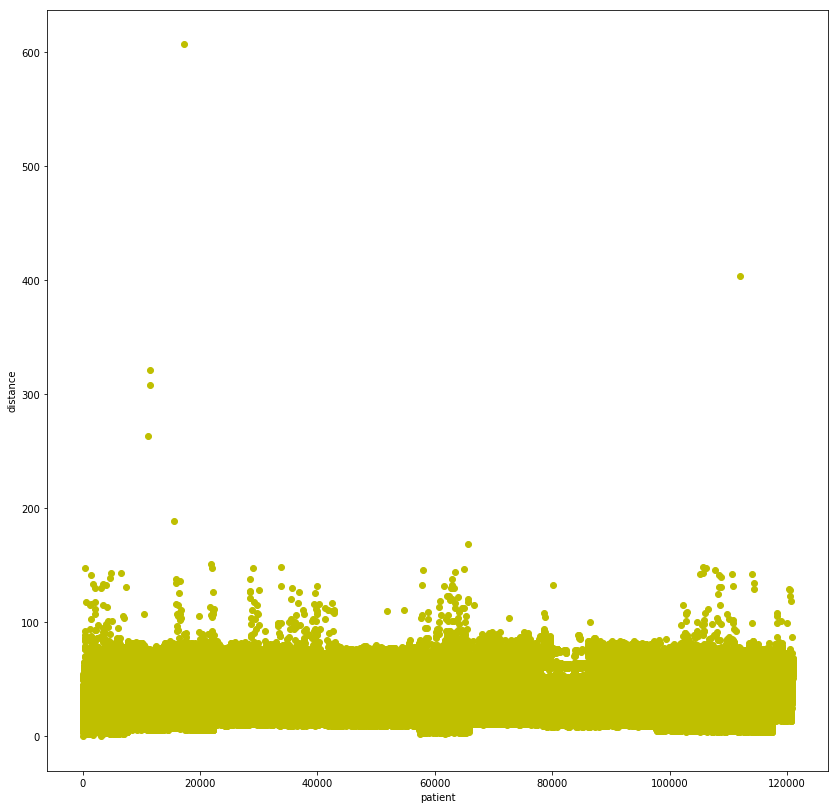

In [52]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
plt.plot(items_E,list_E_dist,'oy')
plt.xlabel("patient")
plt.ylabel("distance")
plt.show()

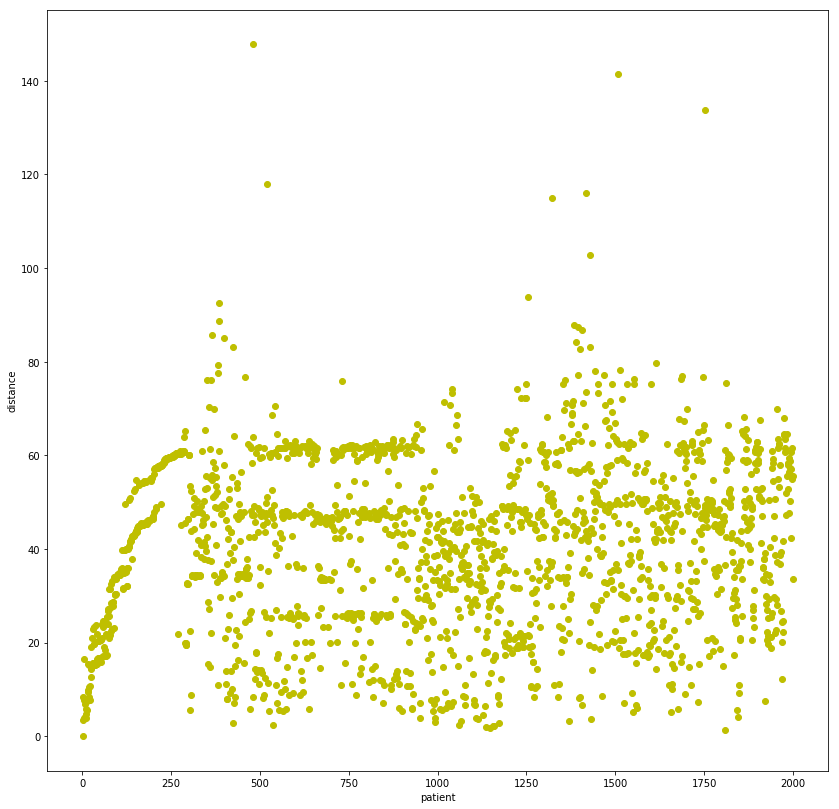

In [51]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
plt.plot(items_E[0:2000],list_E_dist[0:2000],'oy')
plt.xlabel("patient")
plt.ylabel("distance")
plt.show()

# manhattan distance

In [ ]:
manhatan=|x1-x2|+|y1-y|

In [7]:
def manhattan_distance(start, end):
    return sum(abs(e - s) for s,e in zip(start, end))


# Query for calculate similarity

In [8]:
query={
 'state_code':18.0,
 'record_code_iodine':3,
 'sex':1,
 'age':5.0,
 'weight_in_kg':5.0,
 'length_height_cm':59.200001,
 'haemoglobin_level':9.0,
 'first_breast_feeding':1.0,
 'is_cur_breast_feeding':1.0,
 'day_or_month_for_breast_feeding':5.0,
 'water_month':0.0,
 'ani_milk_month':0.0,
 'semisolid_month_or_day':0.0,
 'solid_month':0.0,
 'vegetables_month_or_day':0.0}
print(query.values())
print("*"*50)
print(query.keys())

dict_values([18.0, 3, 1, 5.0, 5.0, 59.200001, 9.0, 1.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0])
**************************************************
dict_keys(['state_code', 'record_code_iodine', 'sex', 'age', 'weight_in_kg', 'length_height_cm', 'haemoglobin_level', 'first_breast_feeding', 'is_cur_breast_feeding', 'day_or_month_for_breast_feeding', 'water_month', 'ani_milk_month', 'semisolid_month_or_day', 'solid_month', 'vegetables_month_or_day'])


# calculate manhattan distance  similarity between Query and dataset

In [11]:
from datetime import datetime
import numpy as np
start_time = datetime.now()
counter=0
list_M_dist,items_M=[],[]
for row in df_concat.rdd.collect():
    l=[row['state_code'],row["record_code_iodine"],row["sex"],row["age"],row["weight_in_kg"],row["length_height_cm"],row["haemoglobin_level"]
       ,row["first_breast_feeding"],row["is_cur_breast_feeding"]
       ,row["day_or_month_for_breast_feeding"],row["water_month"]
       ,row["ani_milk_month"],row["semisolid_month_or_day"]
        ,row["solid_month"],row["vegetables_month_or_day"]]
    dist=manhattan_distance(np.array(l),np.array(list(query.values())))
    counter+=1
    list_M_dist.append(dist)
    items_M.append(counter)
    print(dist)
print("Done!")
end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))    

    

0.0
20.699997
6.016663776190475
8.4000001
47.466667566666665
15.599999
6.199996949999999
15.9000001
3.9999968999999993
7.49999905
10.5999992
9.300001800000004
13.69999885
16.5437491
40.26666586666666
19.3000009
23.566666066666667
42.66666266666666
21.71666877619048
16.61666747619048
13.0999968
23.143746199999995
54.32215008722628
27.166668766666668
26.922152387226276
32.122152687226276
54.9999988
24.0999968
63.02214948722627
32.42214908722627
32.72214928722627
53.622152687226276
53.622152687226276
63.622155287226285
28.922154287226277
28.122152687226276
55.422150487226276
28.622150287226276
66.02214988722628
60.82214918722627
33.32214968722627
29.422149087226273
30.722149287226273
35.122148887226274
55.122148887226274
58.22214928722627
34.42214908722627
55.622152687226276
31.622152687226276
55.822152487226276
54.822152487226276
55.122152687226276
30.422151887226278
66.22214928722627
33.22214928722627
57.32214968722627
33.42215568722628
63.02215508722628
67.82215388722628
66.32215228722

82.49034559542145
82.99033899542144
82.99034559542145
82.99033899542144
50.0581833842839
84.09034459542144
94.8581896842839
79.89034519542145
107.79133882438785
24.966667566666665
130.79134082438785
67.62215428722628
105.39134042438786
106.09134122438786
107.29134122438786
81.09033939542144
88.49033939542143
90.19034439542143
90.09034539542144
43.16666476666666
88.59034439542144
111.69134182438786
66.62215028722628
110.29134082438786
88.09034539542144
67.82215428722628
65.12215428722628
68.42215528722627
110.09134082438786
110.09134082438786
94.99033939542143
105.45818458428391
64.5581885842839
112.29134182438786
66.62215528722629
68.72215528722629
88.32215388722628
110.39134082438787
66.82215428722628
112.39134182438787
25.116667476190475
90.19033939542145
67.82215428722628
66.12214928722628
99.89999900000001
108.89999599999999
110.39134082438787
68.72215528722629
38.12214928722627
16.016664476190474
67.82215428722628
111.69134082438785
102.09133822438785
102.79134322438786
84.5581833

79.2000019
105.99134382438785
89.89113490463065
89.89113490463065
107.599996
60.0581835842839
17.3437469
23.2624972
92.24813828380672
66.42215228722628
59.790344395421435
75.29134082438785
112.29134082438786
49.92999902
112.29134082438786
64.22214928722627
56.12215228722628
116.29134082438786
61.790344395421435
69.72215228722628
131.89999899999998
49.800001800000004
123.099999
80.0
57.690343395421436
131.49134182438786
54.699995799999996
82.79034539542145
124.49134082438786
63.390342395421435
63.49034439542144
78.09134082438786
88.8921894836572
115.29134082438786
68.06153794806869
113.29134082438786
62.922152287226275
6.99999905
77.02215228722628
95.59034439542143
131.29134082438787
143.05624899375
83.7581845842839
136.79034219542143
143.69034239542145
145.39034239542144
146.59034239542143
113.3000018
131.29134082438787
181.2
106.39034239542144
132.5999992
108.70000200000001
119.99133872438786
124.49033939542143
120.29134272438786
162.35624919375
114.79034439542144
113.79034239542143
1

94.999999
42.799999
81.3999956
71.0999959
86.100002
72.9999974
94.300002
69.3999956
79.0999992
78.200001
102.2000024
9.016668476190478
94.8581849842839
8.543751
95.5999992
18.999995999999996
24.729995919999997
33.0624988
60.222150687226275
96.3000014
106.8999994
92.999999
109.0999992
72.22215448722628
91.8581895842839
145.89999899999998
133.59134082438786
146.099999
147.89134082438787
113.3000018
119.79999699999999
121.100002
126.99999700000001
142.299999
137.199999
131.89133782438785
145.099999
108.599996
112.499996
133.999999
142.46178361584265
132.399999
101.39999900000001
121.89999900000001
108.699997
114.299999
93.8921894836572
99.8999994
111.599996
122.499999
100.30000100000001
49.799996199999995
114.299999
104.899999
69.92215048722628
76.799999
73.22214928722627
84.5581833842839
68.12215548722628
136.999999
132.60000200000002
139.099999
129.499999
138.499999
123.39999900000001
136.799996
141.899996
143.699999
133.899999
134.999999
136.49134082438786
117.0999992
121.999999
123.19

111.99033939542143
111.29034539542145
84.9581895842839
6.824998459090913
86.9581835842839
65.52215468722628
144.999999
125.40000180000001
126.69134062438786
111.09034039542145
152.65624899375
35.916663876190476
125.99133882438787
84.8581845842839
100.29034059542144
98.09133782438785
75.12215408722628
108.09034539542144
32.62214938722627
85.7581835842839
86.1581845842839
134.09133782438786
89.55818358428391
86.25818858428391
112.39034539542145
85.2581835842839
58.92214908722627
113.29033939542144
125.99134392438786
111.49033939542143
58.922149287226276
132.59134082438786
134.59134082438786
88.6581835842839
113.69034539542145
11.262955965969573
80.6581885842839
78.9581885842839
91.3581895842839
151.099999
64.22215538722628
67.42215568722628
86.9581885842839
111.49034039542144
64.02215508722628
68.72215208722628
60.72215448722628
111.49034039542144
100.19033939542143
63.52215418722628
79.1581889842839
129.79133782438785
112.49034439542145
108.29999699999999
27.92215028722628
132.991343824

154.6
113.59133982438786
120.19134082438785
77.299999
13.5999999
102.299999
122.39134082438785
96.100002
19.799999
93.49999700000001
105.39999599999999
21.0437491
104.199997
14.516663776190475
64.2999971
126.73377304179662
86.5000016
27.500002100000003
122.800002
141.399999
95.3999994
9.616663676190475
10.600001800000001
10.19999695
123.49134082438786
109.099996
120.099999
87.7000024
14.5999999
92.0581833842839
95.09034039542145
107.499996
132.099999
9.9999969
17.71666877619048
102.85818458428392
120.79134082438786
121.95818658428391
121.599996
150.499999
95.299999
18.61666747619048
9.9000008
92.699996
64.52215038722628
97.12215528722628
17.6999972
113.1581835842839
8.099997049999999
88.89034479542144
119.400002
48.16666266666666
30.7624972
34.462496099999996
12.9999969
87.999996
113.29999699999999
7.6999998
97.099996
104.69999899999999
115.900002
113.099999
124.59034239542144
120.33377304179663
131.79134082438787
84.2581845842839
119.899997
95.799996
100.89999900000001
110.599997
99.2

113.20000200000001
136.29034239542142
100.9581835842839
117.999996
8.084508253521115
88.69999899999999
95.9581885842839
64.72215538722628
97.1581845842839
117.462497
53.72214928722627
79.95818398428389
96.4581881842839
21.73589595128204
70.32801539083695
137.39999899999998
136.799999
131.499999
148.299999
144.099999
112.79999699999999
129.200001
112.400001
108.6000006
99.4999988
115.79999699999999
77.8581863842839
115.399997
111.199996
59.33181728181818
66.42215188722628
76.42214908722627
16.800003
79.62215268722628
100.29999699999999
95.8691648308985
70.02215028722628
87.2581883842839
62.299999
105.700001
62.5999968
77.5999964
20.61666747619048
11.4000008
119.89999599999999
115.14813828380672
109.70000200000001
107.400002
98.699997
75.799999
85.3999956
73.42215428722628
63.72215228722628
142.899999
148.299999
138.299999
141.599999
95.29999699999999
127.19999899999999
159.999999
151.8
141.999999
133.60000200000002
130.69134282438785
133.4999992
136.099999
99.0999968
128.699999
133.9999

111.5999992
155.49134082438786
155.699999
154.29034239542145
141.800002
137.099996
149.49034239542146
105.99034419542144
116.79133842438786
108.9000008
117.2999964
114.5000016
109.3999986
88.9581885842839
88.1581889842839
120.999996
122.5999992
163.39999799999998
2.5999967999999987
107.3999956
170.999999
146.899999
112.0999968
144.69034239542145
117.8000016
133.19034239542145
95.9000022
145.099999
105.099997
177.79999800000002
109.19033939542143
116.299999
168.69134082438785
123.79034539542145
95.5000016
134.299999
116.499999
111.0000012
17.0999999
103.99034039542144
150.09134082438786
12.70000125
166.599999
106.1999958
81.82215248722628
118.19034039542144
83.62215408722628
83.5581861842839
165.69134082438785
127.600002
157.999998
167.999999
140.29134082438787
142.79034339542144
91.0581833842839
82.52215228722628
102.900001
160.499999
78.7581897842839
15.599996149999996
5.1999998
166.6
89.3581849842839
10.3000009
117.6000011
132.599997
163.89133982438784
106.3581845842839
117.499997000

12.60000325
9.000002850000001
61.7999966
16.799999
74.6999958
74.3999956
99.8999956
52.7999971
70.39999900000001
58.6999972
63.199995799999996
13.44741781805249
72.600002
23.8000009
92.2999962
126.0999994
80.39999599999999
21.399997
9.5999968
64.7999971
45.299999
88.399997
65.899997
137.399999
152.399999
122.49134082438786
121.400002
101.29034059542144
99.29999860000001
116.599999
100.599996
122.79999860000001
119.599997
121.69999899999999
127.999999
109.200001
105.39999900000001
117.29999699999999
114.5
109.399999
119.799999
107.100002
119.39134282438786
108.29999699999999
106.29999699999999
114.69999899999999
122.69999899999999
105.300002
102.799999
101.499999
113.29034239542145
93.29999699999999
111.599997
97.69999899999999
98.3581849842839
108.400002
108.399997
103.399997
105.699997
85.8581845842839
121.399997
83.7581869842839
109.500002
108.19999899999999
111.899997
94.499999
100.199997
87.599999
102.99999700000001
101.599998
121.69999899999999
101.299999
108.099999
102.7999969999

122.08306395631169
115.1328724651411
109.2328728651411
121.8830639563117
109.72249252742859
14.1043488
110.52249252742857
122.299999
121.8830639563117
84.83195391091445
123.9830639563117
128.38306395631167
122.9830639563117
21.154166679166664
88.83287746514111
139.13175726329672
130.42249252742857
62.73287146514111
149.59999900000003
118.13287466514112
60.93287176514111
161.93287466514113
11.735295276470588
104.63287466514112
22.3043491
53.299999
98.3999989
73.1999958
123.08306395631169
140.23175726329669
108.32249252742858
128.42249252742857
118.3830639563117
120.03287466514112
112.6999986
121.9830639563117
97.3999989
101.4999969
15.0043501
125.9830649563117
87.8999989
121.18306395631168
112.199999
99.73287266514112
89.3999992
51.33287466514111
122.99306395631169
111.32249252742858
20.24166967916667
110.92249252742857
139.699999
112.4830639563117
53.0999992
114.5830619563117
103.42249252742857
103.299999
23.6999986
100.8999972
93.4999988
82.8999984
150.0999992
118.5
149.49999880000001

90.89999879999999
104.89999689999999
101.6999991
108.72249242742856
105.58306395631169
92.9830639563117
119.399999
107.0328716651411
89.2830639563117
98.8328727651411
100.099999
145.299999
62.72249242742857
89.2830639563117
45.7031266015625
51.170830246875
103.800002
73.499999
114.53287446514112
111.22249252742859
89.2830639563117
96.00061061299695
22.94166757916667
75.39999900000001
89.799996
128.8328746651411
109.09999880000001
65.72249242742856
95.63287766514111
93.7000019
87.40061061299694
105.92248952742858
159.299999
120.1499958
164.599999
125.000002
115.199999
103.49999899999999
103.8999989
102.39999879999999
166.0317572632967
133.9999989
90.22249052742856
103.799999
20.78421043157895
23.054167479166665
130.80000180000002
120.299999
108.0999992
122.29999889999999
118.0
106.599999
102.49999919999999
127.799999
15.004350800000001
136.39999899999998
144.499999
122.69999899999999
135.599999
132.5999988
97.999999
166.099999
20.054167479166665
102.82249472742858
129.1328776651411
168.

114.62249532742858
135.99999880000001
109.6999986
140.999999
100.39999900000001
118.199996
83.72249242742856
22.354167679166665
152.2999994
109.69999899999999
109.500001
71.38421153157896
92.299999
114.599996
73.0999992
51.90061251299694
35.31343014043564
114.89999739999999
89.099999
20.354167679166665
163.7999989
127.3999994
20.354167679166665
127.5999992
150.5999992
110.89999879999999
129.9317572632967
131.6999992
136.299999
83.0999992
129.0830609563117
73.4999993
98.82249472742858
90.4328745651411
73.1328748651411
134.1999971
100.70061261299693
34.31343014043564
130.8830671563117
132.4830669563117
18.6043488
78.5999992
127.12249552742858
122.28306095631169
79.80061261299694
152.5999992
135.1000012
117.2999962
105.19999920000001
111.6999972
123.59999909999999
88.799999
20.354167679166665
154.799999
102.499996
87.39999879999999
87.39999879999999
148.3317572632967
111.6999991
136.599999
84.83195391091445
131.0224945274286
124.9830619563117
123.18306095631169
72.1999991
113.9999962
130.

75.90060871299694
78.1000006
121.09999619999999
68.9000011
62.80060881299694
85.83195391091445
136.5999956
20.7999972
50.999995999999996
43.2999958
43.9999988
136.199996
69.00000200000001
106.899997
89.83195391091445
136.8999968
41.1999988
106.799996
35.5000012
153.99999880000001
47.600001
79.83195391091445
87.799996
156.59999879999998
105.4999972
152.0999986
14.335296076470591
19.6043488
18.6043488
18.554164679166668
155.9000029
55.970834246875
62.88253558730158
156.5999976
70.4999969
70.0031221015625
113.8202342038553
70.0031221015625
70.0031221015625
62.88253558730158
116.19999680000001
96.50000109999999
64.0999959
70.19999709999999
87.8202342038553
109.8202342038553
109.4000008
122.4999988
77.4999988
108.8202342038553
109.9999958
126.499999
75.50060761299693
110.699996
116.79999900000001
69.00060721299694
82.4000022
96.199996
130.08360142459196
100.7999992
87.100002
113.99999879999999
109.7000022
113.4999992
51.4000016
135.299999
49.299996199999995
109.7999992
64.5999971
125.399999

117.37936146836213
88.83195391091445
61.20060801299694
120.69999920000001
85.10060861299695
117.4830619563117
80.00060861299694
103.3000009
124.1000002
75.700001
118.2999968
81.50061261299695
110.8202342038553
65.98928671964286
135.900002
138.89999899999998
83.00060861299694
46.1999971
118.37936146836213
20.6767143260274
31.300001900000005
74.3000018
18.376710126027398
121.69629651205044
23.599999
138.89999899999998
112.4999988
88.83195391091445
26.970832346875
89.83195391091445
137.08360142459196
35.5000008
30.370829146874996
33.78253568730158
55.400001700000004
33.403122201562496
33.1999981
138.08360142459196
88.83195391091445
39.6031220015625
32.903120801562494
29.503125201562497
37.99999579999999
89.83195391091445
111.29999900000001
79.99999700000001
30.1000016
121.0999992
69.31343014043564
38.100002
39.48928291964286
112.02249252742857
87.83195391091445
107.8202342038553
140.2000002
36.403122201562496
117.37936146836213
109.72249452742858
117.37936146836213
36.0031268015625
35.403

105.33287166514111
110.500002
109.499996
97.8830669563117
73.32249452742857
11.404347099999999
12.5043489
105.1000022
13.154168579166667
20.58421253157895
81.00000220000001
81.40061341299695
82.9000022
18.441668479166673
13.235297176470588
19.34166957916667
114.7999992
72.0000024
19.441668479166673
18.441668479166673
108.7000019
22.235291476470586
82.7999962
15.454166879166666
108.400002
68.89999660000001
60.200001900000004
85.70000060000001
22.24166967916667
16.35416247916666
81.99999639999999
60.999997
19.335289976470584
65.1031220015625
20.135289676470585
74.7999972
56.1999967
16.85416247916666
109.39999700000001
18.935289876470584
61.700001900000004
115.9999991
56.4999988
65.999999
13.7043511
14.52646966862745
14.326471768627451
28.02647156862745
68.78928691964286
75.3000018
67.8031218015625
71.00060771299694
97.300002
106.999999
62.78928451964286
88.22249252742859
95.4999988
82.80061401299695
90.69999920000001
67.4031222015625
67.2031224015625
96.699996
35.78421113157895
96.099995

131.99999880000001
99.82249452742857
107.8202342038553
117.83195391091445
86.8202342038553
146.8202342038553
103.0830669563117
120.9317542632967
108.37936146836213
121.599999
168.299999
71.899997
71.10061041299694
139.99999880000001
68.50060861299694
73.10060761299694
86.40061341299695
164.199999
86.70060801299694
113.9999956
91.09999579999999
119.199997
87.299996
168.999998
87.90060781299694
78.30061401299695
76.3000018
108.59999579999999
68.50060861299694
114.199999
18.754167779166664
15.841663679166667
20.604345
11.354164579166666
13.341665779166666
13.404347099999999
14.754165879166665
12.8999977
10.004347
17.354167679166665
163.999998
15.8043491
14.741663679166665
24.635293476470586
18.680293894481984
25.935291276470586
20.35416247916666
20.154167879166664
15.600002000000003
14.841663679166667
17.85416247916666
100.83287166514111
159.29999800000002
127.2999962
95.4328764651411
165.599998
96.5328768651411
115.43287466514111
169.2
117.53287466514112
145.199999
146.699999
114.7328746

73.9000008
117.8202342038553
102.2328714651411
115.08306595631169
123.52249452742858
125.98306095631169
130.6830609563117
106.8202342038553
117.83195391091445
117.72248952742856
153.3000002
119.9999964
100.22249252742859
15.335293976470588
123.9000008
136.0830639563117
111.82249452742857
108.79774067642673
129.37936146836213
118.48306095631169
59.1999986
107.8202342038553
107.8202342038553
47.88421153157895
113.15249552742858
86.00060721299694
56.73529527647059
102.92249412742858
63.88421153157895
86.299999
28.28421163157895
47.22647136862745
103.8999989
112.72249242742856
131.8830659563117
125.32248952742857
133.32249092742856
107.83287166514111
124.08306595631169
65.7825412873016
120.3830659563117
101.4000008
138.4999992
133.299999
130.37936146836213
142.89999899999998
129.37936146836213
149.08360142459196
102.52249052742857
109.1999986
131.500002
99.42248992742857
117.69999899999999
106.8202342038553
130.37936146836213
107.8202342038553
136.59629751205046
135.92249152742858
119.9999

99.83195391091445
129.299999
135.9317572632967
100.8202342038553
114.399999
58.90061301299694
139.68306395631168
126.3328722651411
103.12249052742857
124.38306095631168
99.92248992742857
18.776709526027396
127.7830669563117
17.1043488
32.570834146875
88.0999992
151.499999
126.400002
126.400002
99.5999992
136.299999
125.2000024
152.7999992
103.53287776514111
128.7999952
108.08306415631169
69.4328745651411
17.876713226027398
151.499999
30.3999989
121.89999900000001
48.39932331226761
93.92249552742857
80.3328746651411
140.299999
68.90060781299694
68.00061381299695
25.570834146875
102.82249252742858
106.2830639563117
105.2830639563117
78.4999988
18.399997
115.59999900000001
82.72249242742856
136.39999899999998
105.2830639563117
112.799999
81.72249242742856
137.3999992
109.1999958
149.3999986
106.2830639563117
153.1999962
106.4328745651411
105.2830639563117
21.399323312267615
96.4328745651411
123.49999899999999
168.299999
105.2830639563117
114.62249252742858
20.176711526027397
126.3000014
9

107.7830639563117
13.535294976470588
67.40061061299694
128.9317572632967
112.72249242742856
18.74166777916667
112.72249242742856
106.70061081299694
130.37936146836213
129.83195391091445
69.88421153157896
139.8830639563117
128.92249252742857
105.92249052742858
122.82248952742857
107.52248952742858
132.6999992
120.999999
84.72249242742856
147.13175726329672
104.7999962
134.4830639563117
138.7328766651411
109.98306235631169
98.199999
121.9999988
129.500001
101.8202342038553
87.1999986
105.69999659999999
26.7999966
103.7999992
101.8202342038553
17.8043491
148.93287666514112
100.8202342038553
33.370833146875
102.89999599999999
26.070834146875
106.299999
102.80000079999999
52.200001
101.8202342038553
63.000001
76.40060761299694
84.83195391091445
135.699999
80.099999
68.31343014043564
101.12248952742857
104.1999988
88.000001
99.7328742651411
33.48928671964286
158.999999
78.799999
120.3000002
32.90060781299694
130.8999968
21.399323312267615
103.59999579999999
89.39999879999999
69.4328745651411

126.62249252742858
75.12249442742856
61.83287656514111
144.199999
106.8202342038553
62.83287656514111
98.9317591632967
61.83287656514111
146.93287426514112
131.83195391091445
75.12249442742856
88.28306585631168
75.12249442742856
99.9317591632967
98.9317591632967
138.12249442742856
149.08360142459196
92.8328765651411
107.8202342038553
76.12249442742856
156.8202342038553
149.08360142459196
109.69999619999999
94.0328716651411
169.42248752742856
100.5999987
139.5317602632967
99.9317591632967
111.98306095631169
76.12249442742856
111.63287766514111
81.40061301299694
61.10060761299694
103.100002
89.300002
80.52249052742857
87.8999992
76.40061261299695
96.7999962
106.8999994
167.58306395631172
93.7328714651411
87.9000022
91.4328712651411
80.02249452742858
120.83287746514111
46.026466368627446
81.43287786514111
89.83287266514111
152.52249212742856
87.8202342038553
130.49999880000001
84.799999
95.39999900000001
19.84166767916667
114.799996
96.5830609563117
107.5999989
113.79999860000001
112.5224

85.170832146875
121.83195391091445
156.3328718651411
13.6043488
139.5328716651411
108.38306195631169
22.654167879166664
21.44166757916667
35.370832446875
123.92249232742857
99.2830669563117
99.68306095631169
21.354167679166665
157.72248912742856
98.9830639563117
115.399999
21.84166767916667
125.5317572632967
102.8830669563117
149.63175726329672
99.68306195631169
90.72249552742858
100.5830669563117
119.13287486514112
95.7830667563117
125.3317572632967
98.52249592742858
103.4830619563117
100.68306095631169
94.98306095631169
112.79999860000001
130.82249252742858
84.12248972742857
87.599999
98.92249252742857
105.2830639563117
105.52248932742857
138.88306395631167
97.72249292742856
129.1830609563117
136.63175726329672
81.72249242742856
137.3830643563117
112.9830639563117
140.4830639563117
97.8328746651411
113.42248992742857
98.03287446514112
141.3830639563117
99.53287446514112
138.4830637563117
114.08306135631169
102.42249032742858
122.22248912742857
135.38306395631167
145.4830649563117
135

116.100002
130.6999992
86.13287466514112
163.999999
132.8000002
126.0999992
89.39999900000001
97.13287266514112
162.899999
68.18928181964286
140.52249232742858
117.62249232742857
135.69999919999998
119.5328716651411
126.62249352742857
124.13287446514111
115.32249232742858
136.0224925274286
116.82249252742858
47.5031240015625
135.82249252742858
138.63287466514112
116.52249292742857
118.92249252742857
75.13287166514111
117.22249242742858
67.68928651964286
121.999999
108.0328744651411
157.49999889999998
110.3999989
112.5328716651411
156.0999992
132.68306415631167
138.999999
121.52249232742858
120.399999
118.799999
134.72249252742859
150.799999
111.899997
28.082540587301587
129.4999972
163.299999
126.5999992
65.6999972
162.899999
111.92249552742858
32.28928691964286
142.5
134.999999
111.299999
130.299999
139.39999899999998
143.299999
119.89999879999999
23.48421143157895
119.899997
26.854167679166665
146.18306395631168
150.5999992
100.0
85.09999859999999
25.854167679166665
150.9999992
141.8

43.00061101299694
108.37936146836213
117.6317572632967
131.8317572632967
99.68306195631169
104.0830609563117
83.83195391091445
94.7328766651411
47.164644526708706
69.4328745651411
95.4328745651411
52.03287166514111
166.62249052742857
94.42249052742858
34.31343014043564
84.2830639563117
34.31343014043564
26.900612512996943
84.62249252742858
105.999999
96.83287266514111
13.8043491
93.7328742651411
95.22249552742858
84.2830639563117
60.72249242742857
107.58306395631169
93.42249552742858
93.90061061299694
75.50061101299694
24.32647366862745
40.00061101299694
70.30061261299694
105.2830639563117
82.53287666514112
115.68306195631169
140.5317552632967
109.50000059999999
152.3999989
130.4830609563117
128.9830609563117
105.82249052742858
82.92249552742857
82.92249552742857
137.2999978
28.48421143157895
137.39999899999998
99.399999
109.099999
103.92249252742857
134.0830629563117
82.50060861299694
77.40061061299694
93.13287466514112
101.49999919999999
119.499999
103.0328768651411
84.02249052742857

127.399999
111.600002
118.7999988
136.4317582632967
138.7000002
93.700001
109.3000012
115.72249252742859
115.100002
102.7000019
126.899999
140.499998
86.7999964
116.37936146836213
131.5830639563117
84.80000079999999
122.42249252742857
104.1999969
119.9830639563117
74.2000024
119.89999900000001
116.37936146836213
54.699996299999995
15.254169679166667
59.6000016
122.89999879999999
29.970830446875
14.254167779166666
118.6999988
123.39999900000001
115.6000006
115.1830669563117
114.3999968
11.704348
14.454169479166668
78.43287766514112
67.39999900000001
66.60061261299694
54.199996999999996
12.7043511
14.704343999999995
14.500002100000003
91.2000022
81.50060861299694
91.13287166514111
85.13287466514112
17.5000031
13.63529627647059
13.935295976470591
19.94166757916667
136.69999919999998
69.4999972
136.499999
92.93287666514112
84.9000021
114.700001
14.6999972
18.85416247916666
114.099998
38.800001800000004
129.099999
42.8000014
43.100002200000006
51.5999966
122.199999
48.6999966
20.899997
23.9

73.1999972
14.535295876470592
85.0000012
102.10000200000002
91.20061221299694
114.83287766514113
71.1000006
67.8000018
11.335295176470588
42.070829446874995
33.8128189274387
64.70061081299694
117.899998
92.1328748651411
107.10000099999999
116.99999700000001
108.699996
91.1328720651411
118.19999680000001
77.2999962
135.3999992
117.3999991
117.2999988
97.5999992
102.32249252742858
115.999999
112.32249472742858
105.599999
105.1000022
116.5999961
130.9999992
114.39999689999999
124.0000008
105.2000012
136.3999989
85.2999976
88.49999890000001
117.89999889999999
101.6000009
107.59999690000001
97.70000060000001
115.99999919999999
138.899999
69.7000005
41.2000005
105.72249252742857
23.03529587647059
24.68421363157895
115.9830629563117
126.8317572632967
63.300001800000004
33.3999968
115.199998
43.699995599999994
17.399996599999994
125.82248952742857
50.600001
114.4999991
75.3328746651411
12.204344899999999
87.9000022
114.7999991
107.19999920000001
9.954166879166667
70.6031272015625
114.399999000

76.80061261299694
95.8000012
81.6000024
64.3999959
30.1999967
92.73287266514112
93.70000200000001
91.93287766514112
80.00061381299695
90.13287766514111
122.02249052742857
83.3000012
72.49999700000001
73.40061341299695
74.40061301299694
138.6999989
144.1999988
98.10000099999999
138.1000009
150.30000080000002
117.1999958
159.7999989
141.4999989
151.10000100000002
79.9999993
142.5000009
141.8999958
78.70061221299694
78.80061401299695
140.8000011
160.6999991
79.60061371299695
81.4328750651411
84.4328764651411
129.8830669563117
108.93287666514112
107.5328768651411
116.9000022
88.3999956
138.299999
117.93287786514112
10.4043447
132.9999992
11.454164479166666
137.8999988
150.4999992
69.1999996
115.6328720651411
109.9328764651411
25.935289876470584
118.60000099999999
141.32249252742858
31.600002000000003
121.8999958
142.199999
64.8999956
26.100001
70.9000022
136.499999
12.999999299999999
133.38306395631167
124.1000022
135.2999962
87.5999978
129.37936146836213
141.19999719999998
124.300002
88.2

122.88306435631169
176.699999
138.9999992
128.099997
114.80000079999999
102.22249432742856
141.8830649563117
91.5328730651411
83.69999920000001
148.299999
101.7999976
144.6999988
124.399997
21.069613366615442
124.29999910000001
149.999998
147.93175426329668
119.0999994
89.89999639999999
103.800001
154.08360142459196
93.63287466514112
154.08360142459196
159.1999989
121.80000079999999
87.4328764651411
26.1999979
91.73287766514112
132.999997
147.099997
65.50061241299694
152.99999939999998
109.7000018
95.33287666514111
101.7000019
110.099999
101.93287666514112
86.099997
147.9999962
144.7830639563117
102.900001
125.3000016
101.69999899999999
115.81954199481672
19.435712107142855
127.00988547475593
100.1999972
18.608333483333332
117.7195389948167
116.81953899481671
119.51953899481671
85.39999900000001
145.199999
103.56406835204061
77.9999974
75.7999962
18.308330183333332
97.1000011
94.89999599999999
104.800002
96.16406335204061
55.12805385005415
112.45516135732518
75.67326206493586
81.322951

120.3999994
87.52295142556461
108.8640653520406
89.27517413423409
92.44374950227154
70.5999992
131.82295122556462
77.12805385005416
89.27517413423409
97.44374950227154
115.3640653520406
56.67326386493586
111.16406535204061
46.97326406493586
124.31953899481671
64.47326406493586
117.61954199481671
86.56406525204059
21.409350331707316
86.42295102556461
86.5229482255646
98.8640653520406
82.77326146493586
104.3229482255646
25.863158868421053
97.2640653520406
103.12805385005417
140.96406535204062
111.12805385005417
86.56406525204059
126.41953899481672
89.12295322556461
101.72295122556461
24.163159068421052
63.27400617436823
50.17400817436823
104.66406535204061
123.45516135732518
107.32295422556462
88.72295122556461
53.39237123373494
102.12805385005417
128.8195389948167
43.20934533170731
84.46406535204059
75.27326566493586
73.97326166493586
117.66406535204061
117.66406535204061
123.45516135732518
93.72295122556461
23.263158968421052
22.263158968421052
22.263158968421052
32.309350431707315
81.

106.499999
87.3999994
43.05207012337165
37.17400297436823
135.6640653520406
99.099999
117.96406835204061
96.17326626493586
138.31954099481672
105.7640653520406
135.9195359948167
98.62295322556461
149.50988747475594
81.57326446493586
99.62295082556462
117.56406735204061
125.7640673520406
108.76406835204061
61.77326096493586
80.82295112556461
143.50988947475594
28.108332283333333
109.81953899481671
74.82295112556461
134.2229512255646
134.00988747475594
80.37326416493586
151.40988747475592
157.6195379948167
126.26406235204061
124.51953899481671
145.3195389948167
139.96406535204062
122.5195359948167
97.27517413423409
127.7195369948167
81.12805385005416
118.7195369948167
154.50988747475594
104.56406535204061
22.67400507436823
85.56406525204059
120.92295102556461
65.55207102337165
85.56406525204059
98.6229512255646
115.8640673520406
105.32294922556461
85.97326406493586
25.608334183333334
113.9640653520406
108.81953899481671
90.24295122556461
135.6195419948167
107.6640683520406
141.9229512255

80.37326206493586
130.3195389948167
119.2640631520406
134.2195389948167
135.3195359948167
69.37326746493586
113.1640673520406
91.72295322556461
134.0195359948167
116.69999899999999
121.999996
113.900002
38.09236543373493
63.85555292307692
134.200002
78.37326746493586
12.500001923809524
138.9999989
118.49999700000001
32.594999845000004
78.77326146493586
80.47326686493587
80.37326226493586
116.099997
72.87326606493586
98.19999899999999
137.11953599481672
110.7999972
46.6000011
117.499996
72.67326106493586
17.299997823809523
141.499999
87.99999700000001
86.300002
68.6999958
138.899999
146.2195389948167
76.8000014
124.59999599999999
101.79999860000001
126.299999
87.3229482255646
117.000001
119.56406535204061
91.0229482255646
121.29999559999999
76.15555642307692
146.99999880000001
12.300002823809525
14.000001223809523
131.000002
102.42294822556461
76.77326606493585
38.27400427436823
18.735716107142856
136.700001
79.67326386493586
144.499999
73.1999972
119.100002
40.17326706493586
97.6999989

86.56406525204059
108.81953899481671
85.56406525204059
88.1999972
20.799999
29.408334383333333
39.6999991
58.799999
23.900000823809524
99.8999989
71.299999
85.799999
23.663159068421052
45.97400317436823
87.799999
24.500001223809523
92.49999940000001
129.69999860000001
105.3999989
169.89999899999998
94.99999940000001
95.4999988
23.409350331707316
110.82295122556461
70.95206832337165
127.31953899481671
120.81953899481671
69.77326426493586
81.25555492307691
38.509350731707315
45.15555642307692
110.52294822556462
147.10988447475592
107.19999899999999
103.1999972
103.1999972
102.9640653520406
72.97326686493587
126.91953899481672
29.495001145
137.00988747475594
23.600001123809523
88.3999994
136.299999
105.8999989
81.17326386493586
22.800000923809524
136.3195389948167
104.4640653520406
31.235715407142855
147.50988747475594
102.5999992
41.49236833373494
110.699999
91.22295122556461
78.47326406493586
38.15555642307692
87.32295302556462
55.12805385005415
51.8999989
128.799999
103.400001
132.3999

54.1999996
114.9999988
138.299999
90.299999
113.4999988
135.5999956
83.27326406493586
92.6999991
93.299999
70.899997
108.81953899481671
111.9999988
85.56406525204059
115.7999971
72.82295112556461
70.6999986
108.81953899481671
70.60000099999999
112.5999992
90.7999992
113.29999910000001
36.6000011
98.96406835204061
90.06406575204059
71.1999991
156.299999
25.935714007142856
91.900002
27.935715207142856
27.935715207142856
132.3999989
31.635716207142856
87.499999
87.499999
28.535713207142855
101.3640623520406
75.82295112556461
90.3999994
74.82295112556461
72.82295112556461
110.7000024
32.695000945000004
132.43562136250847
73.82295112556461
117.39999689999999
116.8999989
87.900001
27.335717207142856
86.56406525204059
85.0999992
28.935715207142856
141.1999988
112.29999860000001
115.1999989
69.5999989
29.935715207142856
138.99999880000001
119.199999
76.57326446493586
138.099999
58.695000945000004
142.099999
106.799999
53.299999
36.799999
83.22295402556462
109.5999964
112.16398729801357
19.3999

43.47326596493586
63.37326226493586
73.999999
93.5999959
41.299998
137.1999958
129.99999880000001
111.799999
65.8999994
108.799999
87.56406525204059
87.56406525204059
55.95555662307692
15.699998599999999
15.699998599999999
21.463158768421053
70.8999994
22.463158768421053
39.35206982337165
112.299999
127.3999994
115.19999899999999
42.37326086493586
104.20000200000001
132.8999994
95.499999
132.499999
70.8999994
140.499999
37.799999
109.8640633520406
113.900001
112.20000160000001
86.0999992
144.999999
128.3999994
85.799999
23.535713207142855
30.408334383333333
112.2000012
67.9000022
166.899999
133.499996
94.39999900000001
23.800000923809524
116.69999899999999
116.899999
81.69999899999999
94.19999899999999
129.5999994
78.32295442556462
118.299999
43.399999
77.999999
86.0999992
116.399999
125.599999
90.9999972
22.300000923809524
108.81953899481671
65.5999992
107.0999992
155.30988747475593
72.59999719999999
41.3000009
140.39999899999998
67.47326406493586
110.699997
39.3999988
133.61954199481

117.999999
16.821396197674417
85.56406525204059
18.809350431707315
140.499999
85.299999
21.960873218229246
89.25222150866949
69.67048453733568
72.07048443733568
157.99999880000001
134.7195389948167
137.01953699481672
30.45207092337165
118.3640623520406
140.9999989
121.9640633520406
70.67326106493586
154.799999
122.16406535204061
140.299999
115.49999890000001
36.1999986
105.099999
31.421391397674412
144.999999
112.299999
84.57326446493586
114.29999939999999
91.799999
94.399997
159.50988847475594
111.3640623520406
117.62295082556462
127.7195389948167
20.963158768421053
98.82294922556461
127.799999
115.5640623520406
109.36406495204061
147.40988747475592
119.66406535204061
136.5
102.02295142556461
135.4195409948167
114.9640623520406
121.5640623520406
123.66406535204061
138.099998
139.499999
126.099999
139.8999989
139.29999800000002
25.963158768421053
66.799999
65.799999
129.2640653520406
115.49999890000001
22.021395297674417
115.1999988
92.4999988
148.199999
89.27517413423409
146.699999
33

166.3999994
86.900002
135.1999994
95.6999986
102.199999
129.499999
105.26406835204061
103.7999966
48.33340324056438
98.59999859999999
100.89999900000001
112.0640633520406
140.499999
59.9999988
111.69999899999999
71.999997
63.9999994
105.599999
99.09999699999999
102.59999599999999
62.9999993
138.7195389948167
39.09999802380952
126.01953899481671
21.863156968421052
83.99999700000001
54.12805385005415
76.2999985
146.3999988
145.8999988
84.0999992
78.099999
61.699996
89.99999919999999
115.300001
41.6999967
102.999999
127.999999
132.699999
71.1000008
106.699996
129.499999
135.39999899999998
85.3999991
24.794998945
60.199995799999996
121.1999994
63.15555452307692
24.235715407142855
104.3999958
59.199999399999996
67.3999994
64.499999
112.99999700000001
110.59999900000001
100.6999969
58.499999
83.0999954
89.0999989
82.000001
105.79999600000001
99.099996
105.7000024
71.7000014
110.000002
109.99999940000001
76.0000016
25.235716107142856
135.6195389948167
93.600002
130.3999988
125.4999986
79.4000

84.17326386493586
88.82294922556461
102.5640619520406
78.67326246493586
56.47326596493586
87.87326606493586
102.62295082556462
72.37326606493586
100.92294822556461
134.31954099481672
88.56406525204059
74.77326616493586
77.27326616493586
95.67326406493586
27.708334583333333
28.435715207142856
108.06406835204061
126.11954199481671
93.57326206493586
94.32295162556461
86.56406525204059
87.22295122556461
116.82294922556461
132.1195419948167
92.42294962556461
86.56406525204059
127.39999900000001
40.5999992
108.81953899481671
88.82295302556462
143.8195389948167
108.16406335204061
39.15555642307692
134.5195419948167
37.309350431707315
102.2229492255646
110.100002
71.9999974
157.39999899999998
54.45555472307692
71.87326366493586
79.82295122556461
116.799999
130.699999
120.099999
110.299999
75.82295112556461
101.42295422556461
137.099999
129.800002
119.299999
112.799999
114.099999
109.26406835204061
113.39999900000001
133.51953699481672
151.9198874747559
87.56406525204059
110.799999
86.100002
14

90.22294822556461
32.35555152307692
64.3999975
90.2640653520406
38.57326516493586
112.71953599481671
71.97326206493585
37.96315686842105
89.52294862556461
101.12294922556461
125.51953899481671
113.2195369948167
100.62295322556461
60.67326246493586
132.1999994
158.8195389948167
56.07326396493586
145.0195389948167
80.999999
95.800002
141.299999
113.999999
99.299999
61.299999
120.299999
114.199997
154.699999
107.89999879999999
72.7999962
117.399999
119.299999
86.499996
87.56406525204059
116.699999
35.3999989
37.599999
88.4999988
70.100002
125.2640653520406
116.799999
70.77048443733568
110.69999899999999
123.9640653520406
118.399999
135.1195369948167
22.463158768421053
120.099999
92.4999988
95.799999
22.521394097674417
30.308837836040457
109.300002
75.67326666493587
112.299999
119.299999
128.5999992
89.5999973
66.600002
93.0999992
34.10833228333333
73.82295112556461
88.62294802556461
64.97326686493587
107.39999900000001
86.56406525204059
48.599999
19.8999994
127.4999988
138.999999
104.9999

27.55206772337165
102.999999
139.5999994
118.1999989
67.6999958
106.79999699999999
96.199996
26.108330383333332
79.4999998
49.3999989
102.799999
132.45516135732518
110.5000021
91.3999989
141.699999
31.595001045
67.7999957
95.89999900000001
31.3999989
41.2000022
55.6999972
86.97326126493586
114.4000021
57.1999986
97.9999988
68.799999
112.599999
43.3999989
26.035713207142855
108.69999899999999
32.32139619767442
85.92295102556461
124.0195419948167
68.97326596493586
92.02295142556461
36.65206812337165
65.25206992337165
109.46406735204062
97.82294922556461
109.76406335204061
46.852065123371645
106.97326406493586
100.52295122556461
20.499998823809523
90.77326566493586
91.02294902556461
40.909349631707315
130.6195409948167
131.45516135732518
57.694999945
74.67326106493586
130.6195389948167
93.72295422556462
158.50988747475594
65.97326686493587
124.7640653520406
49.95206902337165
115.76406335204061
122.8195369948167
156.20988747475593
31.494999945
88.92295322556461
75.97326686493587
137.519538

146.6098854747559
60.97326126493586
107.26406235204061
123.9640633520406
80.67326106493586
147.00989047475593
95.22294842556461
125.01953899481671
77.87326606493586
71.77326426493586
112.86406835204062
132.01953699481672
32.57400827436823
141.70988547475594
84.12294942556461
133.6195389948167
58.49236833373494
112.0640623520406
72.47326646493586
106.46406835204061
152.10988747475594
85.07326066493586
106.3640623520406
94.62295462556462
74.27326096493586
29.721393197674416
99.92295422556461
149.1098874747559
37.87400797436823
151.69591104823115
113.0640633520406
49.07400707436823
121.4640653520406
39.87400607436823
98.32295442556462
111.0640633520406
116.11953679481671
128.6999958
41.099996399999995
133.599999
19.635713107142855
104.8999989
105.2640653520406
73.0999987
81.72295122556461
113.99999890000001
103.799999
98.8999956
22.121395197674417
121.19999899999999
47.200001
131.9999989
113.1999989
90.9999988
72.799999
67.6000025
115.4999958
31.795000845
115.7999972
19.335714107142856
13

26.0999968
116.8999994
67.600002
123.7000006
21.999995499999997
24.6999981
61.8000009
63.52294862556461
42.3000009
16.26315706842105
76.7000024
111.0000016
80.27326146493586
19.599998
112.699999
135.199998
123.11953899481671
137.900002
78.499999
35.3000011
90.2999974
59.40000190000001
34.099997099999996
72.7000024
131.4000004
102.5999964
91.80000199999999
78.8000006
15.863156968421054
124.1999958
57.399996099999996
89.99999639999999
61.57326516493586
99.70000099999999
71.0999978
67.77326706493587
88.39999639999999
92.9000013
17.9000013
91.02294922556462
88.2999974
77.20000139999999
58.699995799999996
67.8999966
98.600001
65.22295422556462
24.3999998
94.69999899999999
66.20000160000001
118.39999739999999
76.69999899999999
32.79999782380952
66.8000028
114.60000099999999
96.50000059999999
64.200001
88.899997
95.29999889999999
73.07326106493585
121.19999899999999
114.8000009
75.100001
96.500001
76.02295142556461
26.509351631707318
24.595002945
77.2000024
23.708336483333333
35.3631550684210

89.09999719999999
26.009348331707315
73.69999659999999
29.295000145
98.199996
123.199996
83.299996
112.300001
76.9000022
71.7999962
87.900002
99.8999961
26.799999023809523
140.299996
108.900001
93.400001
90.79999559999999
70.599997
107.31954199481672
123.299999
85.199997
73.85555242307692
20.708333383333333
111.61953699481671
87.12805385005417
65.27517413423409
25.195002145
49.15206572337165
108.0999968
115.89999710000001
71.17326106493586
16.400000823809524
151.499999
86.799999
110.20000200000001
107.20000200000001
87.499997
124.00935353170732
100.32294922556461
87.09999599999999
90.16406335204061
118.3229482255646
76.399997
112.700001
125.199996
115.01953899481671
20.409348431707315
86.799999
83.20000100000001
110.29999910000001
106.499999
116.799996
139.099998
15.363157668421055
102.59999880000001
101.69999899999999
79.899997
106.7999962
78.400001
101.22295362556461
112.199996
113.39999700000001
91.99999919999999
20.463154068421048
90.7000012
72.0999992
97.09999719999999
107.7000020

136.3195389948167
139.0195389948167
132.6999988
52.4000013
138.4999968
111.899997
70.47326126493586
101.79999609999999
49.9999969
20.2000017
101.600002
27.795002045
114.76406335204061
133.8195369948167
85.47326406493586
105.66406335204061
68.57326206493586
68.57326116493586
99.00000109999999
42.521392197674416
76.37326086493586
80.67326386493586
48.95206782337165
72.92295382556462
89.57326106493585
41.074009174368236
77.8999961
97.300002
21.521395297674417
60.800001800000004
140.0999989
32.299999
100.2000008
66.8999956
99.8999989
133.1000021
114.89999739999999
69.4999988
69.299999
49.900001700000004
100.6000024
160.5999959
101.600002
33.822952325564614
93.1999988
64.0000012
112.799999
68.47326126493586
70.47326406493586
97.100002
96.02295122556461
78.3999989
85.5000021
90.42295102556461
132.9999964
94.9999956
49.95206592337165
26.100003023809524
118.8999992
95.72295122556461
67.89236653373493
132.0195389948167
67.44374950227154
123.5640633520406
110.8640653520406
39.794999945
33.094999

33.395000045
108.999999
64.2000012
115.59999900000001
102.299999
24.535713207142855
58.5999994
89.0000014
89.899996
93.42294822556461
105.699999
85.6000022
19.008333583333332
37.60934543170731
89.799999
58.899998999999994
99.800002
141.4000014
73.6999986
107.900001
89.79999600000001
111.09999900000001
107.800002
85.6999994
42.3000028
88.1999994
50.2999994
98.300001
78.12294802556461
85.59999900000001
113.7999971
85.100001
72.0000012
76.8999994
91.3999986
22.06315486842105
85.299997
86.2999964
84.2999966
23.0
99.5999954
110.6999994
73.1999996
54.35555242307692
91.0999994
115.09999900000001
115.99999900000002
89.1999972
114.9000011
87.8000018
50.30833328333333
106.22295122556461
72.999996
65.49236553373493
97.22294822556461
99.82295422556462
136.1195389948167
152.41953999481672
106.59999909999999
111.06406835204061
76.4000008
80.57326606493586
105.3999994
101.06406535204061
78.9000022
106.999996
74.27326146493586
91.52294922556462
158.8
196.22295122556463
170.699999
55.495001145
109.5640

74.07326606493586
130.5000024
89.1999959
102.400002
109.49999940000001
62.200001
86.3000018
56.3999969
62.0000007
105.26406835204061
144.69591104823115
90.6999996
94.8640653520406
43.473261064935855
74.17326386493586
73.2999962
93.0000014
82.57326606493586
157.4999989
134.5000018
98.900002
70.9999988
148.50988747475594
99.4000019
71.37326366493586
80.62295082556462
63.400001
147.8999994
147.00988747475594
144.80988747475593
64.67400437436822
152.00988747475594
69.0000007
155.999999
63.300001800000004
79.6999996
126.199999
150.3999994
144.69591104823115
125.45516135732518
145.69591104823115
93.62295082556462
47.36315366842105
106.6640673520406
111.42295122556462
139.1195389948167
106.72294822556461
92.02295122556461
77.67326406493586
78.27326706493587
38.12139169767441
95.32294922556461
96.82295422556462
154.19999860000001
154.09999900000003
90.44374950227154
126.45516135732518
131.7000012
91.44374950227154
123.89999879999999
114.79999889999999
110.5000019
58.195000945000004
99.5000021


43.32139739767442
69.44374950227154
88.999999
102.6999991
63.973266864935866
50.60833348333333
95.59999579999999
131.4999988
92.5000007
33.9999969
61.0000012
135.3999988
110.1999958
105.0999968
46.49999882380952
66.7999971
144.0000008
126.1000022
99.7999958
26.494998745
149.5999991
143.69591104823115
75.1000006
106.3000018
113.700002
103.12805385005417
23.63571640714286
100.80000079999999
109.1000011
145.699999
61.099995899999996
140.79999899999999
119.3000009
55.9000008
111.7000012
36.4000022
88.2229492255646
55.499995899999995
141.40988747475592
143.69591104823115
90.700001
124.71954099481671
67.700001
128.71953899481673
122.45516135732518
102.12805385005417
22.98326210788153
122.45516135732518
23.957586267045286
83.9000008
87.27517413423409
128.1280538500542
41.22139629767442
87.27517413423409
109.06406835204061
102.7999971
88.27517413423409
141.69591104823115
67.44374950227154
101.12805385005417
34.500209027655266
103.12295422556461
42.255556323076924
143.50988747475594
89.27517413

105.899997
86.5099968
119.39999689999999
48.9999988
88.9000008
137.2999989
121.1000014
98.99999700000001
68.7999992
68.79999939999999
103.7999969
179.999996
217.49999900000003
47.535711307142854
97.2999969
47.70934673170731
98.499999
133.0000022
112.8000004
125.40000140000001
17.063158668421053
82.42295382556462
133.31953899481672
87.699997
109.56406835204061
43.43571710714286
72.5999964
107.1999989
101.80000240000001
108.6000019
109.900001
81.7999957
48.26315896842105
115.29999939999999
128.2999969
103.600002
52.695000945000004
90.200001
54.5999987
76.0000009
111.6999964
26.535712007142855
115.999996
60.28000110000001
33.55206582337165
22.221392497674415
30.773261464935853
114.8000009
39.200001
131.0640673520406
96.8999956
116.70000089999999
68.44374950227154
104.12805385005417
44.52139649767442
77.5999973
116.8999989
38.721392497674415
46.33571720714286
100.86406495204061
101.5000009
118.699997
86.7999964
128.1229482255646
65.5999968
57.799999
135.299999
77.40000140000001
36.900001
1

67.899999
111.89999900000001
61.1000011
45.0999992
138.29999800000002
75.62295082556462
41.6000001
54.9999966
55.1999972
124.69999920000001
64.299999
130.21953899481673
66.67326606493586
104.79999609999999
24.963156868421052
59.510001
81.299999
60.373267464935864
100.199999
45.4999988
104.700001
78.05555152307693
109.4640633520406
76.67326406493586
102.8640653520406
48.57400637436823
113.7640653520406
103.56406735204061
129.91953799481672
117.45516135732518
71.44374950227154
88.27517413423409
95.0195359948167
72.27326426493586
17.321396197674417
117.61954199481671
124.81953899481671
77.77326426493586
137.3195389948167
62.973266864935866
83.12294822556461
52.97326406493586
123.92294962556461
126.2195389948167
52.309346631707314
93.92295122556462
102.1640623520406
55.07326396493586
22.535713207142855
82.92294822556461
44.609348731707314
89.42294922556461
109.31953899481671
84.22295122556461
123.91953699481671
115.01953699481672
51.59236823373494
63.47326406493586
117.31954099481672
21.72

83.1999986
117.49999940000001
52.0999992
89.299996
91.999999
65.4000024
190.09999879999998
94.0999992
52.8999989
115.3640623520406
95.7000012
107.12805385005417
117.19999680000001
97.00263239312363
92.1000011
102.49999919999999
107.12805385005417
154.8999999
143.5999979
146.49999880000001
100.62295082556462
100.27517413423409
57.89999822380952
109.92295422556461
74.44374950227154
119.6000009
82.799999
108.299999
121.9000006
86.39999689999999
146.49999889999998
54.3999972
35.635713107142855
127.45516135732518
73.47326406493586
46.4999988
122.499999
127.6999989
128.4000006
55.599995899999996
98.7999962
132.6999968
77.6000006
80.799999
98.299999
143.1195389948167
29.235713207142858
27.700001
102.7999988
134.399999
79.6999963
120.46406735204062
133.7999959
107.80000190000001
36.199996299999995
72.1999986
137.7999989
103.8999994
114.1000009
52.994995945
100.200001
139.199999
37.821394297674416
73.2999995
107.299999
99.27517413423409
129.8999989
101.4999988
46.5999992
21.908334383333333
112.

126.2000024
99.8999956
67.4999962
53.2999983
93.7999964
89.999999
26.300000923809524
137.89999899999998
111.8999959
67.65555732307692
102.77326106493585
64.87326606493586
129.1999988
87.6999988
94.22295422556462
64.17326246493586
78.67326206493586
128.59999879999998
96.1000021
67.77326106493585
63.97326166493586
69.07326206493586
134.8999988
82.72294842556461
122.60000099999999
92.37326226493586
84.9999998
38.535713207142855
41.0000007
107.0999994
13.063161068421055
86.2000024
46.963159668421056
139.5999994
124.5999994
131.700001
81.5999992
79.49999940000001
133.3999994
19.994996845
137.8999988
92.9999958
100.50000200000001
44.194999045
139.5999984
120.000001
54.399997
93.79999939999999
138.6999988
76.8999992
98.7999968
41.263159868421056
54.900001800000005
97.0000024
69.0999992
90.00000200000001
128.9000018
52.1999986
122.29999939999999
93.99999700000001
60.099999
138.8999988
129.4999958
121.00000200000001
70.299999
100.8000009
33.77400497436823
99.30000079999999
54.2000015
63.0000016

95.0000014
89.299999
53.9000008
136.199999
98.399996
29.4999981
79.8000014
134.98602257347522
67.5999974
82.07326406493586
100.66406755204059
134.199999
110.7999962
57.39236843373494
132.69591104823115
112.45516135732518
104.399997
21.799997823809523
127.099996
111.02294822556462
19.035713207142855
130.800001
93.099998
63.47400407436823
129.59999599999998
118.599997
75.099996
94.47326406493586
92.82295442556462
139.50988847475594
110.76406335204061
103.62294822556461
71.87326226493586
104.52294862556461
82.6640651520406
34.27400617436823
14.900000823809524
17.035715107142856
91.3999972
118.89999900000001
79.999996
98.6000006
96.0999992
78.4000006
113.45516135732518
42.47326166493586
18.835711007142855
62.69237003373494
132.69591104823115
104.2640653520406
112.45516135732518
128.09999679999999
109.1999988
74.600002
30.821395497674416
89.2999962
116.900002
41.300001800000004
113.45516135732518
71.600002
101.2640673520406
85.47326166493586
107.599999
135.60000200000002
12.563161068421055


104.69999899999999
87.32558461868824
121.80000100000001
18.678786794949495
20.341944663370548
93.9999988
106.02295422556462
54.12805385005415
69.81565823137461
91.30263259312363
114.90160069441023
69.7999966
98.22295122556461
124.199996
108.16406335204061
90.57254074111046
22.00157690825835
22.0393549956486
108.89999599999999
155.599999
110.999999
98.6229512255646
79.12294942556461
87.88892349631047
88.08892329631047
71.67326106493586
118.39999900000001
75.999996
119.199996
100.62558441868825
21.938816856578946
147.599998
78.4999988
139.14291555163172
31.300000923809524
104.52558461868824
73.44374950227154
81.2156584313746
23.10157680825835
146.0195389948167
103.02558461868824
97.32558461868824
143.20000199999998
111.8229482255646
115.6640623520406
114.62294922556461
99.92558461868825
72.92558461868825
86.42558461868825
114.12805385005417
80.1999972
133.8000019
113.12805385005417
134.45516135732518
60.0999992
109.69999659999999
68.6000011
135.45516135732518
77.37326206493586
95.2255848

78.100002
101.27517413423409
112.36406835204062
99.10000099999999
70.5999992
30.194999945
129.5999986
75.5999968
94.699996
121.200002
40.199995799999996
72.7999962
87.4999969
53.299996199999995
72.0999989
72.8000018
104.12805385005417
101.27517413423409
133.3999986
93.3999994
74.3999961
68.2000019
112.5999992
97.8000006
98.599996
144.69591104823115
118.1999986
64.0999968
109.1999964
104.7999966
111.1640683520406
126.30000079999999
125.45516135732518
101.27517413423409
45.500209027655266
82.9999988
99.9999956
33.195002845000005
94.700001
23.135715007142856
124.45516135732518
101.0000012
17.700001023809524
71.17326106493586
89.42295102556461
70.400001
138.80988747475593
141.099999
97.6640623520406
90.02295142556461
22.1000008
129.4999994
95.9999988
74.299999
94.7999962
52.12805385005415
133.000001
89.02295142556461
104.600002
26.308837836040457
116.300001
122.599999
77.0999959
125.99999700000001
81.4999974
144.49999860000003
112.6999988
75.6999986
106.000001
105.999996
127.499996
78.8999

103.27517413423409
96.10263279312363
83.12805385005417
103.27517413423409
79.4999956
87.999999
83.800002
82.80000240000001
83.12805385005417
104.45516135732518
72.2000024
83.12805385005417
104.45516135732518
84.12805385005417
114.19999899999999
30.899998
105.45516135732518
91.61953699481671
110.200001
107.799996
65.97326106493585
30.063156768421052
26.809347331707315
87.1229512255646
23.960873218229246
80.70000200000001
109.600002
75.5999966
98.50000080000001
92.82295442556462
106.9000022
83.300002
88.700001
105.45516135732518
85.900001
71.37326206493586
104.45516135732518
96.27517413423409
105.45516135732518
109.27517413423409
123.69591104823115
100.27517413423409
78.99999639999999
83.12805385005417
111.999999
73.77326426493586
75.89999900000001
111.60263259312363
98.27517413423409
91.27517413423409
79.76406835204061
104.45516135732518
100.599996
79.87326606493586
42.4999988
104.45516135732518
20.938816856578946
90.5000018
106.61954199481671
104.300002
64.5999968
114.599999
90.499996


136.45516135732518
146.400002
119.799999
76.1000011
146.099999
73.0000016
102.800001
151.59999900000003
143.000002
126.600002
102.100002
79.6999972
148.5999991
144.59999599999998
77.5999954
141.399999
124.9999958
75.7000012
128.2999988
103.4000008
66.99236833373493
136.1000009
133.399999
107.5000012
139.999997
96.4999988
127.70000200000001
128.6000006
124.3999984
97.27517413423409
128.000001
116.699996
122.300002
116.12805385005417
19.608332283333333
108.9000008
69.6000015
132.3000016
96.82295442556462
129.099999
133.100001
115.12805385005417
108.5000022
116.2999986
94.27517413423409
117.3999986
101.9999974
64.47326606493586
117.099999
68.299999
136.45516135732518
127.000002
52.7999971
93.599999
98.72295122556461
31.37326366493586
59.97326506493586
70.0999992
125.900002
117.499996
148.599999
102.699997
143.4999986
125.9000008
156.69591104823115
137.45516135732518
116.20000200000001
144.099999
136.900002
136.499996
84.87326106493586
144.0999986
86.200001
124.600002
99.27517413423409
137

15.763157768421054
28.495001845
67.57326606493586
99.2640673520406
102.96406835204061
152.10988847475593
79.57326066493586
146.40988547475592
108.52295422556462
18.76315706842105
105.3640623520406
106.2640683520406
66.55555532307693
131.5195389948167
15.435712107142857
96.6640651520406
126.61953699481671
81.97326166493586
152.20988747475593
106.2640631520406
121.0999992
128.200001
72.17326246493586
161.4999986
156.50988647475594
82.57326206493586
133.0195389948167
84.47326686493587
153.30988647475593
74.59236683373493
121.2640622520406
82.57326446493586
119.41953899481672
109.46406725204059
159.50988747475594
84.67326666493587
136.20988447475594
71.27326426493586
126.71953599481671
77.49237163373493
129.61953599481672
75.9999974
77.5999954
113.5999968
82.79999860000001
118.4640633520406
25.809347331707315
131.8195359948167
131.3195389948167
109.0640623520406
122.21954099481671
139.9098904747559
84.57326066493586
71.27326706493587
127.01953899481671
89.67326246493586
137.89999899999998


106.81953899481671
15.7000005
93.27517413423409
27.521392197674416
100.8229482255646
123.2640673520406
93.19999920000001
91.72295422556462
112.45516135732518
120.46406835204061
94.27517413423409
72.44374950227154
102.26406335204061
112.45516135732518
91.12805385005417
131.5640673520406
86.3000018
30.799999
101.69999920000001
91.12805385005417
120.01953899481671
122.16406535204061
72.27326426493586
21.721396297674417
109.11953899481671
113.00000220000001
127.06406535204061
93.12805385005417
109.099996
96.82295302556462
82.89999599999999
115.6999958
112.79999699999999
93.27517413423409
92.26406835204061
115.21954099481671
70.90000119999999
33.67400817436823
91.06406835204061
112.45516135732518
118.900001
90.27517413423409
58.57326586493586
91.12805385005417
115.01953899481671
81.82295302556462
91.59999599999999
102.200001
53.792365233734934
121.89999699999998
93.0999954
99.32295422556462
71.5000016
87.1000011
94.1640623520406
28.895000045
28.7000019
95.9999986
67.47326216493586
65.773266

104.6000025
155.7999986
119.29999699999999
91.6999986
127.89999660000001
76.47326646493586
143.2999988
51.25206992337165
92.900002
59.65206572337165
74.17326706493586
70.57326446493586
70.57326586493586
71.29999699999999
74.17326666493587
121.499999
86.37326606493586
156.69591104823115
114.1999986
20.299999023809523
142.6195369948167
70.8000018
129.7999988
143.3999986
94.0000016
94.3999956
83.899997
87.400001
72.7000019
94.12295422556461
102.199996
123.0640633520406
120.600002
142.4999986
115.0999992
108.9000022
120.09999599999999
69.39999900000001
36.1000018
39.374009374368235
126.0000018
101.5000016
15.200001023809524
128.900002
68.5999954
118.06406535204061
107.02295422556462
26.521396497674417
65.47326406493586
135.71954099481673
98.1000006
77.000002
94.90000180000001
44.5000021
145.99999880000001
143.3999956
118.39999599999999
138.800002
76.600002
143.300002
23.300000223809523
53.12805385005415
122.46406735204062
148.399999
90.1999974
56.452065023371645
108.500002
31.095001745
120

127.699997
106.29999699999999
19.400000823809524
101.899997
126.79999699999999
127.50000200000001
144.800002
79.4999988
92.32294922556461
138.45516135732518
109.299996
109.699997
107.62295422556461
139.45516135732518
116.900001
93.27517413423409
80.50000220000001
141.0195389948167
120.000001
100.29999699999999
139.45516135732518
109.29999699999999
97.099996
142.099996
121.0999958
126.0000016
149.499999
73.3999996
118.76406835204061
65.87326226493586
125.89999900000001
18.26315376842105
120.3999956
123.60000099999999
74.2999971
115.0999968
117.1999968
96.8000018
116.7999968
136.4000016
97.27517413423409
117.12805385005417
95.400002
88.899997
137.10000200000002
122.8999956
128.41953699481672
119.1000006
72.7999971
136.499999
119.7999966
140.999997
129.299996
113.6999958
146.999999
132.599997
86.42294922556461
69.89999739999999
84.5999974
120.4000022
90.7999971
142.799999
117.8999972
75.8999961
87.99999700000001
116.199997
15.435713307142857
98.8000009
129.7999966
103.2000024
96.275174134

74.17326196493586
126.39999710000001
88.5229532255646
67.37326296493586
101.8000022
107.9640629520406
121.19999700000001
85.07326206493586
135.429999
109.36406825204061
136.81954099481672
128.0999964
13.563159868421055
145.899996
98.92295422556461
69.67326386493586
58.67326706493586
99.27517413423409
122.8195361948167
145.2195389948167
105.999996
124.5195359948167
25.063158668421053
166.30988647475593
99.27517413423409
137.45516135732518
101.6229512255646
83.92294822556461
103.12294802556461
117.66406335204061
77.77326186493586
109.3640623520406
18.16315386842105
126.5195419948167
27.021394097674417
92.1999991
73.47326406493586
94.82294922556461
85.0000012
115.4999988
127.16406335204061
135.899995
121.16406535204061
130.6195369948167
82.62294942556461
99.4999974
133.41953699481672
143.199996
147.80988947475595
117.12805385005417
88.72295122556461
88.42294962556461
30.900002200000003
116.12805385005417
96.27517413423409
128.499999
83.29999860000001
33.8999989
71.39999879999999
138.45516

120.70000160000001
26.521392197674416
58.27326186493586
113.1999956
111.52294922556462
118.92295422556461
96.7999988
74.47326406493586
104.22295422556462
23.908335583333333
96.30000079999999
48.55206632337165
95.599999
127.799999
99.42295122556462
103.19999899999999
11.263158968421054
114.39999599999999
102.39999900000001
16.435715207142856
108.899997
70.67326386493586
94.66406335204061
98.01954099481671
72.1999991
120.60000200000002
25.221392497674415
83.67326196493586
109.000002
114.799999
100.92295322556461
97.499999
101.8640653520406
74.97326206493585
107.599999
103.62294822556461
82.69999899999999
118.299999
95.5999989
119.01953699481672
118.69999899999999
113.599999
26.908334383333333
104.900002
109.52295122556461
99.0000019
20.635715007142856
101.500002
109.599996
87.3000018
102.1999972
100.499999
13.463154968421053
119.6999989
97.2000019
99.39999599999999
100.100002
101.799996
114.700001
116.599997
95.399999
115.799999
17.535711307142854
134.69591104823115
116.99999700000001
11

35.70934533170731
104.6999956
56.12805385005415
98.92294822556461
55.12805385005415
106.29999699999999
114.9640623520406
60.77326546493586
104.700001
106.79999699999999
54.12805385005415
73.799999
77.1999958
66.37326486493586
81.67326706493586
110.59999719999999
122.49999700000001
117.1000018
53.12805385005415
55.12805385005415
109.12294922556461
30.594999845
118.62294822556461
74.37326226493586
74.7999966
98.62294822556461
53.12805385005415
121.81954099481672
114.26406335204061
53.12805385005415
109.12294922556461
112.16406335204061
117.26406235204061
96.72295422556462
122.8640623520406
21.409349631707315
104.8229482255646
122.4640623520406
102.199997
91.69999659999999
99.799999
27.821394297674416
100.499996
40.67400817436823
91.12294802556461
86.42294912556461
97.12295422556461
77.97326126493586
93.72295122556461
72.69236583373493
106.22294822556461
60.57400637436823
21.908335583333333
96.92295122556462
116.26406235204061
74.97326406493586
112.5640623520406
72.8999961
45.700002000000

62.05207202337165
98.99999700000001
20.908335583333333
103.800001
102.0000009
56.422951025564615
62.57326326493586
102.6999988
99.12805385005417
99.70000200000001
55.073267264935865
24.695002845
115.700001
105.46406735204062
124.9000009
107.199996
73.5000007
75.7000019
108.400001
103.00000109999999
84.500001
112.1000011
122.71954099481671
123.70000200000001
119.499999
75.7000018
70.5999959
96.29999699999999
106.099999
37.59362394655411
72.44374950227154
119.099997
107.9640623520406
121.400002
116.400001
74.62295022556461
101.9999971
19.46315496842105
102.8640633520406
109.1999959
107.800002
51.57326206493586
112.01954099481671
55.47326126493586
78.42294962556461
94.500001
65.37326226493586
96.46406735204062
97.70000200000001
65.27326186493586
76.52294922556462
115.3640623520406
52.473266064935856
98.12805385005417
76.44374950227154
113.20000200000001
64.4999964
90.9999966
79.82295422556462
108.799996
88.22294842556461
127.61953899481671
128.899999
53.35206602337165
101.46406735204062
1

35.39236843373494
83.02295142556461
127.8999994
104.46406815204061
89.77326406493586
66.07326396493586
124.31953899481671
68.67326386493586
129.2999988
82.02294902556461
128.299999
21.463158768421053
140.499999
30.375715307142855
65.299999
85.4999988
25.499999
111.3999956
52.96315876842105
115.09999900000001
19.199999599999998
106.799999
34.195000945000004
131.90000200000003
118.29999699999999
23.800000923809524
65.299999
39.39237033373494
87.32295442556462
31.295002745
104.9640653520406
85.22295402556462
19.321394297674416
181.00988747475594
35.87400417436823
142.9098904747559
131.3195359948167
86.77326406493586
130.4195419948167
45.97400317436823
132.31954199481672
52.97326126493586
154.8999994
34.195000945000004
110.5640633520406
147.10989047475593
56.073267264935865
111.3640653520406
111.3640623520406
111.299999
72.9999988
117.299999
24.563158668421053
112.4999988
120.199999
89.7999962
39.499999
128.8999994
129.49999880000001
134.400002
105.5999974
76.499999
21.663159068421052
136.

96.06406335204059
66.19999899999999
44.399997
116.799999
66.27326096493586
90.4999988
90.4999988
100.799999
56.12805385005415
128.8999989
106.8999989
121.1640683520406
22.3000009
67.5999992
30.908334383333333
94.299999
89.9000024
61.200001
167.299999
104.3999994
140.89999899999998
106.199999
36.199999
148.299998
103.5999992
70.299999
128.699999
65.4999988
74.82295112556461
117.299999
34.1999991
85.56406525204059
17.563158668421053
104.599997
86.299999
82.6999996
36.6999991
117.899999
144.0195389948167
94.20000200000001
85.56406525204059
130.0999992
37.1999991
16.5000007
112.599999
55.47326596493586
41.87400797436823
135.99999880000001
135.799999
85.56406525204059
81.89999900000001
88.3999992
102.4999988
106.49999700000001
107.299999
111.999999
64.299999
86.5999992
92.4999969
104.799999
72.1000016
97.62295322556461
22.563158668421053
26.408334383333333
104.299999
53.95555542307692
116.799999
101.7999966
84.0999992
67.299999
31.708334583333333
69.1999958
67.3000018
86.799999
28.209346731

116.2999988
108.8999985
86.28374791186441
113.9999988
113.52263083005285
94.49999940000001
89.6999996
83.9999988
69.0000016
146.5999992
134.5999992
142.29999859999998
85.2000019
156.099999
125.1999992
139.73927161697281
140.6999989
101.70000200000001
141.3999988
63.6999986
79.1999986
110.6999988
147.499999
145.99904208181817
125.299999
149.699999
130.099999
108.1999956
110.4999988
111.00000200000001
112.5392736169728
139.99999880000001
107.99999919999999
114.499996
97.9999962
143.0999992
91.32262783005285
85.800002
88.0999959
72.4999988
86.6999958
60.8000022
77.5000021
107.199996
49.2600011
113.6000022
63.2999992
50.19904418181818
63.6000009
73.4999988
81.7999976
104.00000080000001
63.500000299999996
95.999999
70.799999
166.09999900000003
107.7000012
153.999999
148.699999
151.89999899999998
133.0999992
158.2999978
116.90967964968749
132.89903908181816
140.4999986
120.69904008181818
138.09999900000003
112.8000014
106.40000119999999
106.33927161697281
106.599999
160.099999
148.899999
143

100.8000016
109.5999956
84.4999988
96.69999899999999
97.399997
104.93927361697281
97.6999956
107.53926961697282
116.199999
94.3999958
93.80000079999999
108.2999966
129.2000006
101.6000006
98.00000080000001
83.52262483005285
93.4000008
92.999996
98.499996
85.6999959
111.7999968
91.99999679999999
111.099997
88.0999959
69.6999972
70.9999955
75.12263023005283
114.29999860000001
63.19999609999999
65.2999966
54.6999986
61.399997
72.88374971186441
74.02262603005283
87.72262583005283
14.399045181818181
19.29904028181818
59.68163490971809
45.9000008
12.899999900000001
64.78374981186441
33.75713872142857
109.83927161697281
51.03599594399999
62.08374571186441
15.200003200000001
45.55714172142857
61.38374781186441
60.08374571186441
25.25
92.6999994
143.199999
121.6000009
118.8999996
113.59999859999999
130.900001
99.9999958
122.20000089999999
113.00000220000001
83.82262983005285
64.7000024
76.6999958
65.799999
49.1999986
66.8999989
17.839996839999998
79.0999968
58.799996199999995
78.3999994
60.9999

65.78375071186441
111.50000109999999
119.89999900000001
115.400001
106.599999
126.69999920000001
123.59999880000001
124.79999699999999
130.099999
112.199999
105.7999994
107.13926961697281
123.0999992
122.899999
101.8999958
100.499996
113.400001
114.33927461697282
119.199996
101.33927161697281
106.199996
90.90000140000001
88.1000009
76.79999939999999
114.69999899999999
86.2999962
89.4999986
87.1999986
97.299999
100.9999988
84.8999994
94.3999989
105.32262483005283
98.7000014
109.4999988
88.499996
102.299999
117.4999988
90.32262763005284
90.39999900000001
83.39999879999999
118.7392716169728
100.9999956
124.999999
93.9999988
70.29999939999999
70.5999954
64.4999988
28.799999
77.0000026
81.69999899999999
70.3999984
85.6999986
93.2999992
50.3000009
53.5999987
95.20000139999999
72.4999993
82.0999992
70.3000014
31.9999988
40.77500225
52.6000009
51.2500019
91.82262623005283
33.82464050869565
49.500001
72.0999982
71.5999992
70.9999988
88.799999
62.7999966
74.5000016
71.3999989
80.3999984
87.39999

21.05714172142857
77.9999981
60.299996199999995
59.38374781186441
71.4999974
66.0999992
56.28374981186441
61.3999994
54.1999991
48.9999988
56.6999986
75.3999962
86.099999
128.5990400818182
144.4999992
135.7990420818182
107.2999962
113.100002
82.1000024
113.79999699999999
102.1000008
91.9999962
104.600002
87.79999939999999
99.92263083005284
100.199996
96.02262483005285
102.000001
112.799999
70.2999966
86.6999986
117.000002
99.300002
110.000002
104.0999968
120.199997
164.300005
70.6000006
97.900001
84.500002
70.8000018
74.399997
88.6000016
120.099997
65.3999956
67.1000006
103.7000022
72.999996
34.9999988
29.9999988
88.1999986
52.3000014
66.3999956
74.0000018
89.499996
76.6999958
81.999996
78.8999984
71.2000024
66.7999962
130.68163490971813
106.4999988
109.73926861697281
71.8000018
111.29999900000001
82.99999919999999
14.974996149999996
74.1999986
65.0999992
35.859999099999996
13.8999992
39.07500215
55.88374451186441
16.7000001
45.89811215283019
23.057143621428573
57.01738822826087
30.424

80.2000008
79.19999619999999
94.12262483005284
86.62262483005284
21.95714272142857
81.1999959
120.69999899999999
60.38374451186441
84.569996
82.799996
96.199996
59.999997
82.8837445118644
139.1999988
163.1000002
121.59904408181818
128.5000018
135.39903808181816
137.9999972
134.9999972
132.3999968
139.2999991
101.12262483005283
128.1999989
89.6
114.699996
115.199997
127.199997
118.0000009
114.23927361697281
114.8999972
113.3999986
120.5999992
111.99999700000001
118.299999
98.5999992
94.59999619999999
84.1000006
90.8000012
99.72263083005285
91.52262483005285
122.6999959
128.3392706169728
87.3999961
95.3999992
89.6999988
96.0999992
92.89999689999999
87.3000014
87.52262603005283
97.1999958
97.499999
98.52262583005285
88.3999959
109.40000180000001
97.8999992
97.22262983005285
135.89904208181818
122.79999559999999
124.09999859999999
113.7999958
95.22262483005284
118.7392716169728
111.1000009
97.42262983005284
92.02263083005285
98.9000008
98.82262483005283
126.09999719999999
86.600002
126.999

120.19999920000001
113.7999962
137.68163490971813
112.9999988
116.6999986
129.5999992
123.70000200000001
116.43927161697282
108.1999988
113.5999992
98.49999700000001
109.5999992
197.5999992
113.2999992
117.099999
99.12263083005286
110.7000012
110.79904208181817
95.99999919999999
106.29999559999999
71.4999988
123.2999992
113.599996
70.64844947426022
91.92262983005284
58.1999962
74.799999
61.2999985
98.4000022
95.29999860000001
96.8999992
73.4999988
78.3999992
104.20000060000001
71.9999988
99.60000120000001
99.100002
106.799996
106.6999959
86.800002
116.3999992
90.6999956
93.1999969
95.38375071186441
123.4999986
119.0999956
117.699999
162.1999988
196.89999899999998
147.799999
133.7990400818182
139.49999880000001
123.59904208181818
120.8999989
122.69999680000001
122.199999
117.89999900000001
108.3999988
103.12262783005283
118.999999
86.7999992
118.0999992
117.6999958
135.39999799999998
117.6999986
116.93927161697282
120.63926961697281
119.69999920000001
126.999999
109.0999992
128.700001
1

105.2999958
121.49999589999999
119.3999959
65.200001
90.0999956
149.5999988
106.0999956
124.599999
116.59999690000001
143.19999919999998
144.3999986
105.73927501697281
71.64844947426022
164.75756000487806
146.15756000487806
129.3392686169728
122.6000008
149.95756000487805
149.8999986
147.3999992
62.6000011
139.90000220000002
221.7000022
92.30000100000001
59.5999968
131.9999986
80.5000012
103.2999968
84.48374531186441
151.2999988
58.8000009
127.93927161697282
130.7999992
104.63927461697281
107.62262783005283
138.099999
73.89999900000001
123.69999899999999
74.199999
155.89999899999998
56.399997
136.3392716169728
72.399997
37.535998744
77.1999986
259.699999
101.09999719999999
118.62262783005283
144.099999
152.499999
134.6392686169728
86.62262983005284
129.5990400818182
117.000002
172.45756000487808
52.3837477118644
149.2999962
150.89999699999998
150.59999919999998
137.39999699999998
132.1392716169728
160.3999982
65.48374771186441
93.39999900000001
138.6392716169728
129.699999
157.0999992


127.0999988
138.1999962
110.2999958
8.37500285
133.55755900487804
110.02262983005284
110.62263083005286
142.099999
76.02262783005284
21.639998239999997
138.0999992
8.19904228181818
127.39999879999999
108.399997
19.35714192142857
65.58374951186441
60.28374551186441
129.33107352866182
142.400002
23.899044881818185
68.48375051186441
130.33107352866182
74.1000006
129.33107352866182
141.83926961697279
60.98374531186441
104.19904408181817
104.69904208181818
86.22262983005285
85.900001
130.33107352866182
107.02262483005285
82.82262763005284
124.59999900000001
142.2392736169728
144.25756100487806
104.099999
7.574996949999999
59.38375111186441
110.59904008181819
60.68163490971809
135.4392716169728
119.5999972
107.99999860000001
27.739996939999997
99.39999739999999
32.5000021
144.799996
147.1392686169728
82.10000099999999
60.62463640869565
76.7999972
103.32262583005284
12.6500001
159.4000016
70.2837447118644
110.68163490971811
58.283745111864405
12.550002800000001
142.8392686169728
9.43999723999

64.33926861697282
35.0999973
76.90000119999999
118.9000008
90.39999599999999
52.999995999999996
31.1999986
86.8000021
120.499996
95.599996
102.1999958
94.0000018
138.8000008
101.499999
86.00000080000001
74.99999919999999
70.99904388181818
100.099999
113.499999
107.699996
54.1499984
78.3999959
81.1999964
125.099997
121.3999992
133.9000012
49.1999998
53.49911597986922
69.0000012
120.499999
103.5000016
95.4999958
51.63926901697281
91.30000100000001
81.5000019
72.7000024
67.1999986
83.550002
66.2999978
140.89999699999998
97.650001
77.6999972
6.475000149999999
91.2999966
10.47499895
130.29999700000002
87.0000016
112.9999992
140.500001
74.999996
93.199999
95.2499962
66.60000099999999
85.599999
99.199996
54.699999
50.399995999999994
90.89999900000001
15.150002
14.87499785
69.7392696169728
19.64000084
65.900002
20.535999944
90.400001
60.599996
30.422630630052844
53.300001
43.9000022
56.100001
75.29999699999999
38.739269816972815
72.6000016
115.799996
110.39999900000001
98.5999968
111.1999988
6

147.8000019
136.399996
147.299999
85.69054027117727
86.77972142738359
144.00000219999998
76.67972202738359
93.17972182738359
70.92000116
123.99054327117727
109.1999959
144.4999972
135.199999
85.8000018
87.4999988
82.7999966
153.399999
126.399999
142.5000019
132.99999689999999
82.62000096
147.17368098113664
137.199997
134.79999709999998
134.27368398113666
124.90000119999999
142.77367898113664
126.50000200000001
62.94929575774648
120.500001
140.100001
125.099996
118.39054027117727
125.10000099999999
103.4999958
27.22000086
124.89999599999999
78.5797244273836
138.6000022
122.0999992
135.59999679999999
137.2000012
130.999997
116.19054227117728
144.200002
69.89054027117727
65.67971962738359
106.000002
31.833963069811322
77.0000016
93.10000099999999
132.5999971
34.799996199999995
88.87971902738359
41.41034538448276
124.2000018
28.257144928571428
136.1999988
137.400002
85.87972422738359
141.999996
130.500001
109.69054327117728
144.999996
130.599997
152.8999988
157.49999880000001
148.0000006
1

92.799996
103.2999976
96.1999963
67.499996
100.59276978646096
44.9000008
87.99999700000001
20.557142028571427
96.199997
50.600002
96.39999599999999
93.4999971
99.19999619999999
116.299997
92.99999700000001
115.3999992
99.50000220000001
83.999999
108.59999579999999
19.118184754545453
93.6999958
111.0000018
97.69999609999999
82.0000019
17.8000001
92.9000016
88.6999989
67.6000004
81.7999962
119.40000180000001
66.2999957
107.999996
93.7999972
99.1000018
71.5000026
104.99999919999999
45.499995999999996
74.97971892738359
110.2173273393124
80.799999
32.15667007430939
37.899996099999996
90.99054187117727
108.6999972
92.4999962
85.2000012
28.1999986
57.7000018
115.0000019
117.5999992
75.499999
94.599999
128.99054027117728
101.77367798113664
92.9999965
104.69999899999999
106.39999879999999
88.3999992
93.49277178646096
85.39054287117727
101.999996
99.6999958
88.5999968
68.5999992
87.98284177453456
84.39276978646095
109.8999966
104.999999
101.19999920000001
108.19054027117727
76.899997
92.699999
1

111.8000023
45.8000009
110.200001
111.67368098113664
158.653283689781
111.49054327117727
175.653283689781
123.89277178646095
132.25328168978103
160.700001
124.100002
188.49999880000001
124.69277278646095
117.09276778646095
124.98284177453456
121.5999968
34.0999985
145.87367798113664
143.5000018
105.9000022
94.29053737117727
156.27368198113663
60.3000004
102.100002
148.5000008
139.37368398113665
131.4000014
87.59053917117727
123.69276978646096
162.80000139999999
118.89053827117726
40.450001860606065
110.89277178646095
92.0797198273836
136.27368098113664
123.19276978646096
88.77972382738359
160.35328368978102
124.79277278646096
170.1999996
117.59053727117727
173.3999992
143.57368298113664
127.89054227117727
157.17368098113664
118.5000024
108.51276958646095
132.1000014
46.9000008
148.099997
169.25328368978103
165.01176662191676
143.27368298113663
122.1999958
95.5000012
29.045451381818182
83.0000012
23.31818195454545
157.1999991
98.99054027117727
159.07368098113665
125.800001
74.4797238273

75.6797248273836
110.49999940000001
147.67367898113665
57.500001600000004
165.7999994
49.07972482738359
119.7999966
85.67972342738359
161.7000021
76.0999987
43.51818295454545
63.24929665774648
30.849995860606057
143.90000129999999
172.653283689781
133.500001
107.99053827117727
140.57367798113665
97.07367798113664
147.1999958
113.899997
111.09276678646094
122.099996
67.54545638181818
163.2999988
113.699996
170.95328368978102
146.6999994
111.89054027117727
117.99999940000001
146.05328068978102
129.3999988
109.39276778646095
51.2000024
91.09999619999999
67.100002
68.99053727117727
114.79053727117726
97.0999994
28.249296657746477
125.59276678646094
139.67367798113665
48.245457381818184
64.79054027117726
183.0999994
123.000001
188.35328368978105
95.47368398113665
181.6999994
116.99276778646094
66.09054327117727
127.799996
28.879719027383587
96.39999599999999
129.8999968
54.15714572857143
125.19276778646096
73.99583494305557
106.79999939999999
103.79054327117727
69.29053727117726
79.63395806

126.60000099999999
86.3999994
110.900002
42.84893475
95.50000080000001
96.1999963
78.2000015
101.59053827117727
49.085748427518425
47.999995999999996
21.2999971
124.69999899999999
104.699996
95.3999958
110.40000180000001
76.100002
85.6999958
74.700001
103.1000014
112.39999739999999
138.9
102.2999962
132.79999909999998
96.059997
101.73999900000001
106.500001
83.5000012
119.10000099999999
100.5999959
134.99999939999998
154.800001
100.49053727117726
40.47972102738359
137.2999988
99.50000200000001
145.199999
96.39999639999999
135.099997
20.466669833333334
104.59053827117727
116.799999
116.89999639999999
126.20000110000001
82.8000023
135.3999994
119.3999994
103.79277138646096
33.54929685774648
123.59999900000001
115.7999988
107.5000007
59.67972392738359
41.05714482857143
107.000001
82.8000018
108.8999956
112.39999639999999
93.19999899999999
69.5000018
115.09999690000001
40.8000009
52.699996299999995
124.199997
134.499999
32.699996299999995
99.6999958
118.5999961
113.2999958
127.700001100000

88.47972172738359
95.69054217117727
28.359240919036793
128.19276678646094
160.953285689781
166.6999989
139.9000008
108.0999968
91.7999966
146.79100932044906
26.359240919036793
103.69053787117727
50.995857631957996
165.56958408699612
122.59277278646096
121.59277278646096
139.17368098113664
24.01817985454545
38.8999984
63.13396326981132
125.59277278646096
139.17368098113664
24.01817985454545
31.550000860606062
168.35328368978102
165.56958408699612
164.56958408699612
99.39054027117727
67.71034558448275
148.27367898113664
85.87971782738359
166.05328368978104
71.5797218273836
37.25000096060606
142.57368098113665
141.87367798113664
78.07972022738359
33.399997
164.56958408699612
159.699999
80.47972482738359
109.39053727117727
162.05328168978102
155.65328568978103
79.2999971
73.11034378448275
169.75328368978103
133.60000200000002
30.75000116060606
167.56958408699612
112.99137161587126
26.259960176273967
59.196929828002204
62.37971942738359
54.79583514305556
152.37367998113666
124.6999968000000

100.77971862738359
100.99137161587126
80.97971842738359
62.44972392738359
39.999995999999996
111.59053727117727
74.87971902738359
81.89054247117727
101.69277178646095
89.79276778646096
120.79100932044905
82.6000018
101.98284177453456
68.77972262738359
143.59276998646095
64.9797250273836
71.71034298448276
100.4999969
117.200003
97.39054027117727
121.69277178646095
130.29276978646095
58.57972282738359
99.69053827117726
120.98284177453456
60.69054267117727
76.1999963
104.59054227117727
98.89277178646095
75.17972392738359
53.57971882738359
130.499997
98.39999639999999
115.57368298113664
115.89999700000001
112.39053827117728
99.09276778646095
117.77368398113666
145.07368098113665
117.69053747117727
110.49053767117726
103.7999972
47.991371615871245
95.29276778646096
62.97971892738359
79.1969298280022
132.07368098113665
97.59277178646096
122.57368298113664
93.79276678646096
107.59053847117727
94.49053767117726
26.25714562857143
98.39053827117726
85.99999700000001
124.60000099999999
122.473678

92.000002
101.4999958
82.599998
82.29999939999999
97.2999972
67.93395966981132
81.3999972
87.39999599999999
35.94999906060606
46.39583554305556
87.6999972
69.899997
130.6999986
110.2999992
15.949298857746479
23.245456681818183
96.50000200000001
126.8999975
114.899996
73.4000008
22.32000196
67.2999978
28.050002760606063
29.04999896060606
118.9999986
102.19053827117726
84.39054247117727
105.099997
84.8000014
123.59999880000001
128.39999899999998
37.599998
94.000002
21.918177854545448
108.600002
35.999998
96.2999966
100.800002
118.699999
83.8000014
21.61817905454545
96.8000023
79.4999972
99.89999900000001
113.99999700000001
93.5999964
70.9999964
21.95714472857143
80.70000200000001
31.818184054545455
77.29054347117727
117.099998
102.8000006
154.999999
86.1000006
88.200001
89.00000059999999
21.42000306
125.19054027117727
100.39054007117727
97.9000006
90.3000012
96.199997
67.27972002738359
99.99999700000001
92.98284177453456
29.44999976060606
18.52205348272226
86.09277178646096
47.9913716158

18.218184654545453
128.500001
107.099997
88.099996
124.2999992
146.8999992
92.899997
37.84999796060606
140.25328368978103
119.69999899999999
101.4999969
103.3000012
100.99137161587126
136.6999968
95.49999919999999
93.30000100000001
60.800002000000006
47.43396036981132
108.0999992
69.33395836981131
19.049295657746477
117.0999984
134.199999
106.6999992
124.19054027117726
129.499999
28.957139728571427
133.09999899999997
98.2000024
28.045451381818182
108.100002
69.89582944305556
129.57368098113665
110.29054027117728
110.0000014
128.39054027117726
48.24893815
47.24893815
91.29277278646096
102.99137161587126
115.39054007117727
108.599996
87.100002
72.80000240000001
15.518179854545453
91.4000016
84.1969298280022
91.899997
70.57971882738359
95.500001
78.3000022
118.800002
109.09054327117728
27.745453581818182
56.17972202738359
138.89999899999998
93.89277278646097
121.59999699999999
108.2000018
47.15667007430939
80.9999961
124.6999994
99.8999971
142.699999
105.33000100000001
134.199999
78.49999

109.79277278646096
20.045453781818182
104.98284177453456
78.6999974
109.39999660000001
106.9999974
21.117278086021088
126.200001
105.98284177453456
106.98284177453456
80.1969298280022
104.98284177453456
98.89276678646095
101.19054307117727
100.99137161587126
101.99137161587126
51.548933149999996
167.15328368978106
130.4999992
19.91818305454545
118.27367798113664
122.07367798113664
100.39276678646095
116.07367898113665
124.79100932044905
100.19054227117726
80.49054167117727
17.077192600475072
104.99277178646096
110.19054227117728
100.99137161587126
101.99137161587126
117.69053727117726
118.99053827117727
124.79100932044905
137.399999
22.62000286
143.56958408699612
116.2999974
25.049296857746477
125.79100932044905
107.0999971
107.3999968
131.97368098113662
112.77368398113666
151.85328368978102
127.67368298113664
98.89276798646095
89.6999958
96.50000080000001
106.39999639999999
82.6999969
138.6999988
106.10000199999999
19.166666533333334
110.79276778646096
80.57972402738359
65.9999969
126

33.200002000000005
133.5999988
102.30000079999999
144.79100932044906
49.991371615871245
160.199999
160.699999
84.8999994
123.98284177453456
100.4000008
143.4000024
114.2999974
124.0000024
91.2999976
93.1999989
123.299995
89.8999989
107.399997
100.0000014
131.499995
98.1000019
103.5999968
148.70000199999998
98.3999956
122.99999940000001
85.3999989
128.999999
77.3999956
92.3999992
101.9999998
113.1999986
96.59999719999999
112.1999963
48.991371615871245
133.1999971
125.5000018
109.8999974
110.70000200000001
100.79999699999999
121.4999958
28.800003
141.89999899999998
83.09999900000001
173.899999
116.3000014
105.099996
125.30000100000001
114.899999
147.499999
132.799996
73.9000008
131.800001
94.800002
149.59999599999998
160.699999
82.69999920000001
170.3999988
104.9999974
160.199999
144.799999
84.49999679999999
125.099997
171.499999
128.999999
80.19999599999998
151.2999934
114.099997
26.6999991
91.9000024
122.499999
158.599999
107.699996
138.2000014
98.0999968
109.6000018
127.599997
99.7999

124.65328568978103
131.6000022
18.566666633333334
125.7999988
18.466665533333334
100.4000022
20.6000011
84.79276998646095
76.399997
122.35328668978103
82.9000013
68.0000021
113.3999956
99.79276718646095
17.545455681818183
21.24545168181818
84.37971942738359
147.3999972
130.999999
46.14893735
115.299999
130.199997
23.285748227518425
88.98284177453456
75.77971862738359
81.7000014
52.78972162738359
76.67971922738359
75.0999987
110.59053727117727
86.49276978646095
53.17972392738359
115.29053827117727
84.29999860000001
100.5999992
111.699997
120.0999959
108.1999986
65.37972422738359
94.69054327117728
22.359240919036793
69.94938208345995
135.9999966
94.79999889999999
48.6999972
107.49999919999999
100.5999959
75.5999968
61.07972162738359
81.37971942738359
101.5000016
106.5000016
77.8999994
49.991371615871245
80.1969298280022
118.599997
41.4999969
96.49053807117727
63.079724927383594
60.799996199999995
71.200001
90.69054027117727
100.500001
41.8000014
137.8999989
99.09999900000001
93.0999968
8

122.5999968
75.999996
95.99137161587126
101.19054027117727
120.0999986
30.649295557746477
128.799999
75.1969298280022
96.99137161587126
81.3000018
137.900002
100.39053727117727
80.6797248273836
41.3999962
150.653281689781
102.099997
72.4000017
95.99137161587126
18.066665433333334
96.99137161587126
139.10000200000002
41.259960176273964
139.47368398113665
103.799996
78.6999967
135.699997
21.11817765454545
19.218178054545447
139.79100932044906
118.98284177453456
74.2000019
49.991371615871245
132.69276978646096
92.199996
120.98284177453456
118.98284177453456
87.27971882738359
73.2000019
129.099997
141.79100932044906
152.999999
147.67368098113664
118.98284177453456
141.79100932044906
113.79276758646095
135.07368398113664
120.98284177453456
96.99137161587126
95.99137161587126
116.300002
143.999997
141.79100932044906
142.79100932044906
120.98284177453456
121.98284177453456
76.1969298280022
118.98284177453456
118.600001
35.899997
75.1969298280022
122.69276678646095
124.39277278646097
142.09999

30.590911950000002
24.97058824705882
57.2100030075
68.4999988
61.399997
76.1999986
60.999995999999996
61.3000014
76.9999988
75.84920300985527
78.300003
73.2000018
73.94920430985528
38.999995899999995
77.24920400985528
47.14319401775148
75.89999739999999
73.6000019
88.0
84.5000028
88.999996
78.000002
76.1000011
81.0000019
69.7999971
73.799999
73.94920620985528
22.099995899999996
82.69999680000001
23.1999991
69.3000018
77.7000019
75.9000008
76.200001
69.1000006
71.200001
78.9000012
74.200001
74.3000018
76.54920940985528
83.4000022
74.74920920985528
81.74921040985527
58.6999972
61.6999986
48.6999986
49.4000008
78.20000089999999
85.100002
72.94920860985528
73.5000007
69.4999988
75.4000013
74.4999974
74.0000016
74.1999972
74.5999959
69.4000008
74.6000011
60.5999973
76.84920440985528
73.0000016
79.899997
49.3999994
73.5999968
75.9000022
76.1999996
64.69999659999999
76.5999968
73.499999
78.1999967
78.5999992
74.99999919999999
57.30591314260354
109.8999962
105.59999719999999
118.5999956
103.89

116.89999900000001
140.0999989
141.2999959
124.59999599999999
121.76802365266487
112.19999659999999
103.4999988
125.16802265266486
122.26802065266486
53.163215177011494
68.64920840985528
101.49891598256781
122.56801765266485
120.86802065266485
95.2000008
52.0
63.0000007
60.0999954
51.7999976
23.160226307954545
78.9000022
72.44920340985527
106.49999589999999
102.4999958
122.700001
89.1999958
94.59891198256781
78.14920840985528
79.900002
102.199997
69.9000008
73.0999992
108.599996
123.7000018
101.29891198256782
100.199996
73.0999992
73.899997
79.5000016
96.900002
81.2000024
106.6999958
98.2999972
51.999999
58.3999982
17.499995999999996
61.800001900000005
102.59891698256781
95.09891158256781
85.09891398256781
72.999996
76.70000160000001
124.000002
160.39999899999998
75.54920420985528
55.77058724705882
100.09891398256781
140.399996
97.99891598256781
140.1323941337647
142.199996
123.699996
148.199996
58.77058914705882
58.46993742269939
84.63611764082012
99.63611764082012
121.60000099999999


167.03719481112398
164.837194811124
144.6323881337647
166.93719581112398
162.837194811124
166.0999994
167.4
164.5999981
148.500002
164.937194811124
163.499999
165.137193811124
166.0999986
165.999999
167.5
165.59999879999998
165.399999
167.79999899999999
23.84319431775148
23.469934622699384
25.390910950000002
35.82000098615384
24.9999976
14.9099990075
26.700001999999998
28.7100020075
28.819999086153842
70.79091105
13.460225307954545
28.819999086153842
66.47059014705883
19.769937622699388
44.199995799999996
24.505919042603555
28.0000009
43.8999989
55.799999
59.94920430985527
84.4999988
81.2999992
42.9000022
13.1999984
50.400001700000004
80.299999
28.169937722699387
76.2999988
30.069935422699388
84.299999
86.72592509925926
60.74920830985527
79.04920420985528
44.00591814260355
79.64920980985528
77.69999680000001
50.52592289925926
41.66994052269939
54.84319711775149
38.605914242603546
49.84319621775148
74.74920640985528
57.30591314260354
62.24319201775148
47.04319221775148
23.60591894260355

93.599997
109.299999
108.59999880000001
112.0999987
111.1999991
115.0999982
114.5999954
111.999996
107.6989143825678
116.69999920000001
83.89999900000001
114.8999984
106.3000018
107.0999964
60.7999952
62.799996199999995
111.40000180000001
60.099995799999995
58.300001800000004
111.69999680000001
59.4999974
60.4000008
115.699996
115.699996
112.70000100000001
125.29999900000001
60.0000012
59.8000004
112.0999956
119.00000080000001
114.59999599999999
121.599996
118.799996
113.100002
111.69999619999999
120.9999958
121.89999900000001
114.599997
120.8999972
114.300002
116.499996
112.2999958
116.69999680000001
120.099997
119.50000220000001
114.39999599999999
114.6000022
118.1000018
114.00000059999999
113.60000120000001
119.39999599999999
114.199997
114.199997
115.499996
116.3000018
61.99999579999999
119.099996
119.70000060000001
119.69999920000001
114.2999962
119.49999600000001
115.2999966
114.099996
118.300002
118.599997
59.7999957
66.0999952
57.099996399999995
114.299996
118.9999991
114.99999

79.299999
89.799999
112.46802265266487
115.40000119999999
115.8999986
114.299999
136.0999992
113.86802265266486
136.8999956
117.50000080000001
136.499996
137.2999959
138.3000012
40.399996099999996
98.0000016
135.8999988
137.099997
109.6000004
115.20000200000001
114.8000012
113.56802065266487
142.399996
136.499997
135.2323931337647
136.2999988
79.34920300985527
104.89786852867059
117.8000011
114.39999599999999
104.0999964
113.46802065266486
140.5000018
138.499999
138.7999988
135.5323931337647
138.29999899999999
135.93239313376472
117.399997
136.2999968
28.105913342603547
35.80591924260355
50.3999994
74.79999889999999
65.2000014
105.2999958
107.2000014
76.6999986
115.5999964
115.3999958
116.00000080000001
116.100001
116.2999964
113.89999900000001
117.1000009
89.7999962
111.86802065266485
115.16801765266486
113.3999956
113.70000089999999
137.099997
116.80000190000001
135.4999962
135.3999972
138.4999989
135.3323891337647
135.60000200000002
99.39999660000001
78.39891178256781
137.2999994
13

148.600002
146.2323941337647
144.9323891337647
146.2323911337647
141.0323911337647
146.699999
142.43239313376472
143.2323881337647
144.1323881337647
148.3000021
133.500002
146.000001
145.9999986
148.10000200000002
146.7323941337647
145.80000180000002
146.2323881337647
142.7323911337647
146.9999959
145.699997
148.099997
144.0999966
131.299999
141.3999992
140.900001
142.0000008
144.399996
144.7323911337647
133.5999992
145.2000022
143.999997
132.900002
146.70000190000002
144.5000018
146.1000022
146.799996
144.500002
141.799999
142.499997
149.39999699999998
152.29999899999999
142.1999958
144.699996
144.8000019
143.300002
149.900002
146.300002
146.39999699999998
134.4999972
134.699997
131.300001
131.4999992
131.799997
149.599999
147.79999899999999
137.699999
145.3323911337647
141.7999986
143.499999
142.999999
144.499996
130.6000008
142.7000012
133.0000019
129.9000018
143.8999992
145.0999988
130.60000200000002
144.8323941337647
146.299999
150.10000200000002
142.5999972
144.700001
142.499997


119.9000022
133.3323881337647
114.76801865266486
31.820000986153843
133.5323941337647
89.19891718256781
81.64920460985527
30.720001086153843
116.600002
86.999996
24.87058714705882
135.3999958
18.600002
93.9000022
110.599996
89.8999968
44.4000013
27.670591147058822
115.16801765266486
101.5989111825678
117.6000022
113.3000022
130.9323881337647
134.5999966
113.6999959
104.2999962
96.6000006
104.63611764082012
83.4989109825678
50.125921899259254
115.8000021
84.2989109825678
114.1000019
134.8000022
20.67058924705882
86.3000014
111.2989109825678
135.499996
109.1999972
85.5000021
15.5000019
23.099998
116.099999
23.060225307954546
99.2999957
111.1999972
82.4000022
105.700001
117.30000199999999
58.59891398256781
86.63611764082012
81.5000007
111.06802365266486
111.7999972
134.099996
132.3999958
129.6999992
44.3000009
111.9999962
81.9000008
131.69999719999998
113.5999959
135.0323911337647
108.499996
109.19352516308973
109.76802365266487
109.300002
110.9999962
130.90000220000002
112.0999956
134.89

104.5999971
68.299999
70.799999
78.79999939999999
64.64920840985528
78.7999985
79.399997
74.6999958
77.8999965
76.299999
73.9999988
98.49999639999999
75.70000139999999
73.299999
103.6999986
84.899997
76.8999984
73.6999972
75.9000008
76.9999988
75.9000017
99.5999968
72.34920440985528
77.6999986
73.2999962
73.5999954
77.34920680985527
75.04920420985528
76.4999988
78.5000007
98.1999958
75.9999988
73.49999589999999
75.9000021
75.84920820985528
77.6999986
113.0000009
74.4999988
110.099997
76.0999987
108.1999972
76.4000022
107.599997
76.64920320985527
78.34920680985527
101.7989109825678
99.8999956
82.799999
102.1000006
83.299999
100.9999962
75.8999989
102.29891378256781
77.74920360985527
113.9999961
75.9999969
68.34920630985528
103.9999974
96.7989123825678
127.06802065266487
100.2989123825678
135.399999
121.5000016
109.8999994
109.79999939999999
126.69999920000001
106.1999986
118.59999599999999
103.19999920000001
90.89891698256781
94.7989109825678
77.5999959
87.1999967
85.6999958
100.799999


142.799996
127.59999909999999
107.79891618256781
142.9323881337647
123.76802065266486
144.199996
108.1989105825678
23.360228307954547
128.2999988
125.36802065266485
129.09999599999998
124.26802065266486
145.000001
142.3323941337647
142.3323941337647
108.499996
123.36802065266485
79.4999969
99.29891198256782
124.69999899999999
124.26802065266486
126.39999879999999
77.700001
110.89891098256781
124.6999956
135.26802065266486
124.39999599999999
83.99091105
144.699996
123.96801765266486
125.06801765266485
58.799996199999995
76.69999899999999
125.26802265266485
59.89891098256781
143.6323911337647
124.49999919999999
141.99999880000001
141.49999880000001
141.3323881337647
144.2323911337647
104.89891558256781
124.49999919999999
74.499996
110.10000099999999
73.89999599999999
144.9323911337647
146.899996
147.1999966
149.399996
146.3323931337647
147.0323941337647
47.5999987
111.0999964
113.700001
123.86802065266485
116.0999974
146.93239413376472
106.39999900000001
124.99999919999999
145.2323891337

115.80000100000001
95.19891198256781
120.2999962
160.23719481112397
144.400001
160.137194811124
122.300002
144.8000022
147.599997
74.1000015
122.000001
78.4999988
64.2999962
77.4999988
141.43239413376472
119.4000016
159.69999919999998
77.6999991
141.7999972
160.4999986
107.3999962
119.16801865266487
164.099999
80.39999879999999
62.685578877884616
108.5999956
141.4000018
121.7999972
145.299999
76.24920640985528
98.700001
72.56993452269938
144.4999986
150.299996
111.0999992
97.80000290000001
63.0000007
144.4999959
105.9999993
97.9
160.3999986
103.899997
143.700002
145.1999969
99.8999994
106.59891398256781
56.36022640795454
103.39891198256781
109.9000016
142.3323891337647
109.69891198256781
102.89891098256781
142.0000022
95.46802365266487
121.199996
119.86801765266486
94.86802065266485
163.73719481112397
163.73719481112397
68.4999964
158.937194811124
162.837194811124
104.90000180000001
121.10000200000002
164.799999
122.199996
163.29999859999998
161.53719481112398
57.299996199999995
145.80

98.29891198256782
118.36801765266486
148.0999958
144.9000018
126.600001
147.70000100000001
18.1100021075
20.699999
16.6100009075
48.9999989
79.600002
62.5999999
91.4989107825678
103.49891698256782
71.0
123.099999
123.39999599999999
122.3000018
132.5000008
124.099997
125.8999959
146.6999988
147.299997
146.8000022
149.200001
160.8999992
161.699999
69.84920820985528
76.74920640985528
98.89891598256781
103.199997
123.26802365266487
124.700001
20.010000007499997
147.6999992
69.79090915
70.34920440985528
69.999996
78.64920930985528
105.8999956
98.900002
125.49999890000001
94.10000099999999
123.86801865266486
123.56801765266485
124.70000160000001
126.30000100000001
129.16802065266486
125.4999972
130.899996
146.3323911337647
124.26802365266487
147.3999986
141.8323891337647
163.1999992
163.0999986
100.9999969
97.89891098256781
100.400002
125.86802265266486
125.79999860000001
126.7999969
126.19999619999999
30.07059124705882
51.46994072269939
26.9000001
61.80591594260355
35.12592469925926
33.1431

113.799999
103.599997
65.04920850985528
133.899999
111.19891398256782
167.5
147.60000200000002
33.799999
123.799999
86.3999994
84.1989143825678
144.2323911337647
25.59091005
125.799999
86.6999986
144.8323921337647
39.00591574260355
43.44319701775149
101.26801805266486
129.899999
81.29891378256781
39.8000009
133.299999
114.6323877337647
30.44319231775148
116.02550351042487
88.599999
109.999996
128.299999
36.1999991
107.299999
48.88557587788462
103.299999
21.899999
153.799999
91.500001
116.299999
84.299999
82.299999
107.5000012
36.0999992
139.200001
108.099999
98.9999988
39.5999992
103.299999
84.799999
122.299999
86.799999
118.700001
95.76802085266486
24.09091005
68.23832148638782
103.799999
116.299999
103.299999
85.1989105825678
84.09891638256781
106.799999
50.64920600985527
29.41968940366047
24.27058914705882
79.8000014
81.3989113825678
107.600002
124.100002
83.299999
84.2989109825678
97.699997
49.30591404260355
110.799999
93.99999700000001
127.19999899999999
105.699997
127.299999
129.

136.299999
105.299999
83.6999986
112.299999
24.210000807500002
128.499999
155.499999
89.69891098256781
109.0323911337647
110.0323911337647
99.799999
104.299999
112.799999
160.637194811124
129.9999994
63.349203509855265
136.799999
22.44319541775148
107.96802065266486
36.24920920985527
100.799999
135.299999
65.0999992
126.799999
113.499999
156.299999
113.499996
62.299999
108.49999700000001
24.1100009075
140.499999
111.799999
85.56802055266486
81.79891378256781
102.799999
129.8323931337647
107.299999
86.56802055266486
122.899997
157.6999988
86.56802055266486
149.799999
116.099997
101.46801825266486
90.3999989
138.96802065266485
85.56802055266486
86.56802055266486
133.137194811124
145.89999699999998
103.4999988
132.0323911337647
59.41968940366048
164.73719481112397
148.3323901337647
139.7323911337647
159.2999989
112.86802265266486
106.66801765266486
126.299999
129.299999
39.8000009
146.7323911337647
87.69891718256781
148.5323911337647
91.8989113825678
28.320000986153843
133.137194811124
13

138.96802065266485
78.39999900000001
73.69891388256781
102.56802065266487
121.799999
111.799999
112.96802065266486
109.299999
20.960228207954547
30.41968940366047
82.56801725266486
44.549203809855264
107.36802405266486
34.74920450985527
112.33239313376471
92.9323893337647
79.36802405266486
94.799999
114.79891378256781
58.68557607788461
94.76802065266486
136.399999
106.1999986
138.299999
84.56802055266486
82.1999986
117.76801805266486
62.299999
127.3323901337647
37.0999992
56.74920450985527
97.299999
23.1100009075
110.299999
83.44920620985528
146.837195811124
88.299999
86.299999
97.799999
51.92592489925926
88.3999994
108.799999
108.799999
105.86802065266485
24.210000807500002
111.1999986
97.799999
122.3323901337647
126.1323911337647
108.799999
109.799999
84.799999
77.799999
142.799999
106.56802065266487
96.799999
111.96802065266486
24.1100009075
96.799999
108.299999
105.16802065266486
116.4323911337647
108.19999899999999
120.4323911337647
111.26801965266486
107.9999986
88.16802065266486

134.6323911337647
65.64319401775148
99.69891388256781
62.30591594260355
139.96802065266485
43.06022810795454
135.999999
115.19891398256782
73.22592509925926
36.06022810795454
133.799999
98.799999
158.199999
61.5999992
110.799999
100.49891358256781
30.320000986153843
73.72592509925926
84.8999989
104.299999
104.5323891337647
80.09891398256781
50.32592689925926
27.17058924705882
36.8999994
31.5000012
119.299999
87.4999988
73.2000024
74.6999991
82.799999
83.299999
78.29891378256781
96.09999880000001
84.9989107825678
62.499995999999996
85.500001
105.899999
27.17058924705882
97.099999
112.59999599999999
54.18557887788462
125.19999899999999
68.84920680985527
103.999999
76.799999
109.5999994
103.6999986
97.29999860000001
27.69090995
89.63611764082012
92.000001
91.199996
93.700001
87.86802065266485
83.26802365266487
85.799996
106.59999880000001
106.799999
28.37058904705882
106.39999660000001
133.299999
79.6875288962431
81.4855762778846
82.4855762778846
104.799999
37.82000098615384
118.499999
11

112.099999
39.700001
109.799999
88.89999900000001
88.6999958
29.59091005
39.700001
37.5999992
52.798910982567804
140.39999899999998
103.700001
116.46801765266486
135.36802065266485
44.52592669925926
163.799999
135.899999
134.799999
155.299999
87.0999968
85.799999
85.799999
16.3000009
15.3000009
74.99999890000001
90.500001
16.400000900000002
59.99891738256781
41.3000009
135.299999
76.3999989
92.099999
104.799999
103.299999
154.699999
94.70000200000001
111.39999900000001
41.463217277011495
98.06802065266486
89.299999
108.799999
89.89999900000001
73.99999890000001
50.08557427788461
43.4061671813329
116.26801865266486
127.299999
37.200001
37.5999992
135.099999
155.599999
123.39999900000001
73.299999
168.39999899999998
101.56802065266487
89.09891398256781
113.19999899999999
76.24920640985528
57.54920940985527
74.799999
70.799999
105.46802265266487
38.78557787788462
153.60895011370047
21.208005035444113
145.9323911337647
131.899996
89.59999880000001
90.39891178256781
106.999996
83.5989169825

64.06022810795454
29.41968940366047
87.299999
52.70591414260355
87.0000012
106.79999699999999
112.8323911337647
70.0999992
146.799999
105.16801865266487
119.799999
122.899997
63.443196117751484
110.299999
34.5632204770115
44.04319411775148
80.84920820985528
108.76801845266486
162.499999
158.499999
80.14920600985528
34.34319621775148
19.4099999075
81.04920800985528
101.2989109825678
24.210000807500002
102.299999
28.419689403660477
125.10000099999999
126.799999
101.39999900000001
101.799999
74.34920960985528
122.799999
117.799999
76.799999
108.899999
102.49999700000001
158.299999
106.09891638256781
119.5999992
49.74920640985527
146.299999
117.999997
51.04319411775148
94.10000099999999
49.299999
145.39999899999998
108.499999
158.39999899999998
123.79999699999999
84.799999
132.799999
117.299999
133.36802065266485
59.2632207770115
92.799999
125.73239113376471
132.499999
114.0323891337647
80.64920460985527
146.599999
20.660228507954546
94.799999
94.799999
135.39999899999998
78.74920920985528

42.98557387788462
30.41968940366047
104.10000099999999
57.41968940366048
29.419689403660477
155.39999799999998
60.8000009
93.70000200000001
131.900001
106.299999
71.5999992
134.39999699999998
130.9323891337647
88.6989143825678
132.137194811124
85.56802055266486
90.49891398256781
88.19891198256781
20.169937722699387
128.4323881337647
99.499996
64.54920660985528
102.9000008
133.93239413376472
107.2989109825678
29.41968940366047
110.299999
135.937194811124
38.04920660985527
153.60895011370047
113.500002
29.39091025
154.799999
133.7323941337647
131.98924069288404
103.69999899999999
155.599999
112.60000099999999
141.53719481112398
102.26802365266487
127.3323891337647
119.7323881337647
46.54319221775148
127.69999899999999
46.343193817751484
153.799999
110.299999
128.699997
134.999997
131.98924069288404
89.59891158256781
92.69891598256781
132.099996
127.39999900000001
154.599999
37.799999
85.8999956
110.19352516308973
107.400002
160.299999
127.299999
107.900001
38.0999992
130.499996
87.299999

93.299999
113.799999
114.000001
110.89999900000001
41.3000009
133.799999
115.100002
49.0999992
111.799999
107.899997
35.42592679925926
93.0323911337647
137.799999
109.799999
38.3999994
85.299999
143.637194811124
114.1999972
114.5999992
64.5999992
103.299999
70.8000009
115.4000022
90.4999988
139.799999
109.599999
80.9999974
83.4999988
140.799999
100.2000012
60.8000009
39.3000009
122.19999920000001
98.39999879999999
76.68557747788462
95.66802065266486
58.3000009
119.799999
113.399997
51.8000009
131.937196811124
85.5999992
111.1999986
85.56802055266486
109.299999
50.3999994
22.0100022075
138.89999899999998
95.0323911337647
29.67058924705882
60.6999991
87.9999988
128.3999989
89.999999
137.49999889999998
120.66802065266486
140.6323911337647
119.2323921337647
144.937197811124
117.199999
155.837194811124
152.23239113376468
133.399999
137.49999889999998
133.799999
149.23719481112397
129.400001
108.29999699999999
125.099999
110.46802365266487
131.900001
104.6999958
127.59999579999999
157.199999

100.5999966
47.49999579999999
105.299996
37.119999028
109.89999899999998
72.25294008529411
116.59999900000001
17.700002400000002
13.0000012
101.8999998
91.3000018
107.0999992
32.499995999999996
101.7999992
72.6000016
99.09999599999999
12.495241010714286
77.09999719999999
24.4000001
86.7000019
101.8000014
26.499996199999995
93.9999966
99.9999998
52.1000018
105.75757520970328
37.2999988
34.1999988
36.49999579999999
9.599999799999999
12.4999968
19.694805251948054
26.251351272972972
96.7999969
18.600003
87.799999
34.2999968
105.3999989
45.1000018
100.8000022
78.699996
23.26767366969697
91.9000022
73.7999966
24.567672969696964
97.199997
25.499995999999996
106.199996
42.5000031
101.30678435746606
88.89999660000001
56.25245502950819
105.800002
88.00678935746606
92.8000018
82.89999879999999
23.251347272972968
88.9000022
19.0000019
33.219999028
87.900002
90.80678335746606
22.500002200000004
78.500001
13.3000009
103.2999992
98.55757520970329
93.90678635746607
113.3999992
93.39999879999999
99.099

83.2000024
88.8999992
42.199995799999996
34.899997
86.099999
9.995235310714286
20.887500887500003
97.80678635746607
83.96584606456071
105.60678635746606
104.39999900000001
93.20678335746607
25.25379028853288
16.153791288532883
14.494808051948054
15.594807251948053
112.65757720970329
82.6658400645607
76.7999992
102.79999899999999
83.86584106456071
31.853791088532883
57.000001600000004
81.96584006456071
30.200002400000002
93.45757920970328
86.4658430645607
21.620002228000004
59.44819536851762
17.094805351948054
76.3658460645607
100.15757720970328
97.50678935746606
105.05757720970328
102.8999994
103.45757720970329
25.153796488532887
86.299996
13.651348272972971
13.46767896969697
51.157578009703286
80.6658410645607
97.89999599999999
25.9000032
96.10678635746606
18.500002600000002
102.60678335746607
106.1999994
81.799996
31.000002600000002
25.200002400000002
16.69524031071429
108.299999
65.4999964
100.9414350580413
106.099999
105.95757720970329
104.15757720970328
83.199999
123.6999992
98.44

61.099995799999995
85.4999958
86.2999968
117.1999992
100.79999900000001
100.000001
107.30000100000001
94.1999986
89.00678635746607
28.799998199999997
53.75379638853289
133.9575772097033
59.3524609295082
100.39999739999999
76.6999986
70.45379428853289
14.494803051948052
61.85379538853289
21.887498987500003
96.600002
15.500002100000003
113.3999968
119.20000200000001
72.95379148853289
138.099999
127.9999986
80.600002
61.45246042950819
99.7999992
107.79999699999999
122.799999
79.1999989
120.7999958
76.1999986
107.999996
98.6000014
87.85379108853289
130.39999899999998
137.05757720970328
143.19999860000001
114.70000200000001
97.2999962
144.09999900000003
116.9999962
118.8999956
100.500001
122.499999
135.4575772097033
117.89999599999999
75.45379338853289
139.2575772097033
102.70678835746607
115.50000080000001
99.89999900000001
133.7575772097033
130.0575802097033
136.9575772097033
71.75379308853289
107.06584606456072
26.453796488532884
84.3000018
75.35379348853289
85.4999988
138.9999962
122.99

89.00678435746607
100.15757420970328
37.3524560295082
103.9414350580413
123.999999
134.599999
123.599999
109.55757720970328
64.95379668853289
104.9414350580413
103.4999962
113.599999
116.90678635746606
100.44819536851762
118.14878202088904
103.499999
104.9414350580413
107.5999989
97.599997
116.199996
107.8999992
115.3
104.500002
119.70678635746607
98.59999619999999
93.1000008
91.29999699999999
32.9999988
84.14878202088904
99.20678355746605
80.7999971
85.14878202088904
90.69999619999999
112.999999
108.6999988
106.7999988
93.0999989
104.49999600000001
94.80000100000001
114.999999
99.40678895746606
100.40000140000001
90.0000024
120.49999799999999
87.29999699999999
106.7999988
101.499997
119.46584006456071
101.999995
103.500002
63.75379028853288
83.40000180000001
90.899997
88.99999919999999
95.500001
82.6999986
78.6999986
107.199996
109.999999
87.09999579999999
29.17904663904762
115.099999
67.25379548853289
75.30678295746605
112.5000018
98.02678335746606
113.45757720970329
74.6658450645607

154.099999
132.1658430645607
119.749996
142.499999
84.10678595746606
143.85757720970327
96.30678835746608
98.899997
141.0575752097033
84.4999974
140.100002
32.0999968
76.75379548853289
135.60000200000002
138.100001
118.4000022
85.8999961
52.4999998
139.8999986
47.7999971
11.251351272972972
138.2000022
24.152457829508194
114.59999619999999
14.100001200000001
124.5000021
130.4999972
82.5999964
131.0999986
83.70678635746606
120.8658430645607
117.3999958
92.1000006
74.35379728853289
93.70678355746605
23.37585811551724
138.9575752097033
138.9575752097033
139.000001
133.199999
119.199996
147.7999988
16.151348772972973
104.299996
78.0999964
112.599996
137.4999986
89.499999
131.3658430645607
141.999998
144.099996
84.6999986
84.70678635746606
140.9414350580413
79.09999719999999
17.2999999
139.300001
91.4658432645607
94.90000119999999
115.35757420970327
123.699996
100.2999964
109.199997
130.500001
85.19999619999999
125.40000099999999
82.15379648853289
145.7575772097033
113.70678635746606
141.400

135.19999919999998
108.600001
108.60000160000001
23.000001
23.8000009
119.19999920000001
136.4999992
115.29999900000001
112.3999992
132.2999992
19.400003
84.4999988
12.600001800000001
138.9999989
120.3999992
120.7999992
26.3
141.8999976
15.6999998
136.4999992
157.89999799999998
121.999999
9.5999992
62.0999992
122.8999992
131.29999859999998
120.4999988
104.8999962
137.9999986
137.89999899999998
108.39999599999999
96.2658460645607
12.0999987
72.5999954
104.69999680000001
79.1299957
99.89999660000001
21.575865015517245
48.4999988
83.5000012
127.299996
19.400003
97.60000099999999
93.44819536851762
75.85379068853288
18.3999999
104.14878202088904
107.599997
121.49999899999999
95.39999639999999
158.29999899999999
129.59757720970327
117.2575792097033
75.3099958
15.951353472972972
123.79999899999999
128.9575772097033
108.29999699999999
112.40678635746606
132.499999
105.50678635746607
96.60678935746607
102.099997
113.900002
134.399999
106.7999959
20.3000001
10.8000014
8.9000001
102.5829381563283

97.4999986
124.19999899999999
115.49999899999999
98.59999619999999
26.851353772972978
102.09999880000001
83.1999996
116.5999976
86.70000160000001
140.15379228853288
111.7999988
114.7999988
87.800002
75.15379648853289
88.2999966
109.69999920000001
83.999999
60.55379328853289
76.8999989
93.90678435746607
135.99999880000001
115.0999986
84.400002
125.59999900000001
94.5999988
111.49999919999999
110.599999
119.69999899999999
95.2999986
105.1999976
81.7999962
126.999999
133.2000038
76.09999880000001
56.95379288853289
89.999999
74.35379628853289
22.57904863904762
93.9999986
114.6999988
98.29999559999999
72.55379608853289
71.69999920000001
100.7999988
131.3999992
93.3000022
105.79999889999999
102.199997
113.599999
74.3999994
116.3999992
110.5000012
116.5999968
65.79999860000001
103.5000016
69.999999
107.5999988
105.9999986
90.300002
136.8999994
95.89999689999999
113.70678825746606
18.7999997
15.56767886969697
30.353795388532884
51.25245582950819
14.5000031
23.351347172972968
110.2999988
21.451

114.60000099999999
101.699997
122.299996
101.400001
168.10000200000002
100.799996
98.3999994
104.100002
94.999996
123.19999899999999
9.449999
83.3000018
92.099996
70.4999988
74.299999
26.232924183673468
69.1000011
112.8999956
101.599996
56.1999991
83.5000016
55.0999968
70.3000014
78.9817016432554
142.2000018
127.999999
120.3999992
128.26192969148514
131.36192969148516
133.299999
124.799999
131.099999
97.999999
97.999999
87.899997
19.6200028
73.89999900000001
70.0999968
69.4000022
79.6999986
100.2999958
16.7499979
49.099995899999996
14.4199992
99.49999700000001
73.1999986
88.50000080000001
91.6000006
116.89999900000001
29.3000012
77.1000011
71.299996
62.20839584427481
11.950000900000001
88.800002
69.5000012
81.0999992
60.5999968
52.3999989
71.2999971
86.09999880000001
20.1200021
91.4817006432554
79.1000018
73.4000013
71.6000008
85.999996
64.31028363825679
102.8999972
80.6000022
17.55995337961943
55.0000012
70.8999994
142.999999
124.60000099999999
123.70000200000001
128.399996
108.300001

19.6200028
59.61027863825679
76.08169584325539
55.11028293825679
74.8817007432554
12.5499989
106.100002
94.7000024
102.60000099999999
109.499999
107.16192969148514
109.70000200000001
82.39999900000001
82.899999
89.900001
84.30000100000001
74.31360006407607
93.2999962
17.923808625170068
49.800001800000004
21.849999099999998
59.500001600000004
60.800001800000004
101.40779918348625
44.9999969
90.5999992
80.5999964
94.99999700000001
110.299999
29.181697843255392
36.08169674325539
54.31028363825679
60.9999956
36.423805325170065
99.99999599999998
107.7999991
119.399999
110.199996
71.099999
108.999996
93.09999579999999
105.199996
76.0000012
88.1999958
100.31359666407604
13.099996999999998
91.09999579999999
26.500001900000004
52.6000006
105.8000004
55.400001
51.7000012
67.5999994
78.0999968
101.4000022
58.399996099999996
80.1817016432554
93.2999962
83.799999
109.46192969148515
120.399999
109.099996
109.30000100000001
102.900002
112.199999
97.500002
104.89999900000001
105.99999700000001
84.7000

83.0817014432554
34.53706162647059
142.199999
114.06193169148514
123.56192669148514
131.199999
124.699996
131.799999
121.300002
124.199999
122.10000099999999
121.86193169148515
123.06192969148515
115.000002
105.099999
101.100002
112.099996
100.01359666407606
103.71360166407607
111.30000100000001
104.099997
120.299999
100.51359766407606
106.31359966407607
58.5000012
84.899997
78.200001
89.69999899999999
68.6999991
52.8999989
73.01028063825679
80.90999719999999
84.599999
80.1817004432554
75.1817004432554
87.900002
52.300001
126.299996
83.48169544325539
11.656309713592245
12.500002200000003
8.199997
86.0816986432554
95.8000014
38.41028073825679
19.6200009
48.10839784427481
124.99050540080773
10.9999979
21.2999988
70.81028363825679
124.900002
129.39999899999998
122.80000100000001
113.600002
121.70000200000001
123.999996
122.89999599999999
120.499999
117.36192969148514
114.66192969148514
117.69999899999999
119.199996
119.799996
118.199996
117.100002
123.20000200000001
141.699999
135.499999


109.499999
91.3816964432554
126.89999900000001
96.299999
100.200001
68.6999991
32.3999989
94.39999879999999
87.199999
84.2999968
72.6999986
79.599999
24.3416389916
68.5000018
10.699999400000001
75.6999986
105.5000016
85.1817018432554
18.04702809594596
17.2999988
16.14702799594596
14.6999988
13.500001900000004
74.90000180000001
60.900002400000005
73.200001
15.0999971
160.3
46.100002
30.537055926470586
87.7000024
51.0000012
26.42381052517007
67.700001
63.99050540080774
88.1817006432554
18.099999
62.4000008
213.899999
114.26192969148514
102.799999
90.01359966407605
115.499999
105.70000200000001
112.000001
125.499999
116.66192969148514
106.299996
100.1999986
89.31360166407606
101.30000100000001
121.499996
127.6999972
29.169556105586594
29.269554105586593
87.500001
9.2999969
82.61027783825678
132.099999
123.69999899999999
17.100001800000005
46.499995999999996
101.799999
97.10000099999999
111.99999919999999
129.7
112.3999956
120.56192969148515
136.699999
110.400002
112.89999599999999
82.3135

147.799999
146.099999
133.800002
139.1999968
161.999998
224.5999892
119.399997
126.0000012
122.799996
123.900001
114.90000180000001
154.79999899999999
138.499996
149.899999
146.7999988
100.199996
107.999999
120.299997
123.7000008
136.8999968
127.800002
104.299999
113.7000018
150.999996
103.599999
130.500002
136.89999699999998
122.86362626030353
122.600001
62.46193169148515
112.5999992
38.50000180000001
74.999996
7.800000000000001
11.250003000000001
77.400001
87.810003
81.8999984
141.499997
30.6000006
46.2999966
77.7000019
43.899997
204.8999992
28.63292618367347
61.8999972
49.8999994
10.350002900000002
94.3999962
92.900002
26.500001800000003
18.05
53.899999
80.79999699999999
59.6000006
19.9000011
68.0999994
81.3999984
138.3999958
61.99050540080774
44.5000012
86.2999968
19.400002000000004
124.800002
140.76192769148514
141.36192669148514
146.66192969148514
143.46192969148515
141.86192669148514
142.99050540080773
121.11359666407606
132.91360066407606
156.56193069148514
128.81359966407607
1

28.02381042517007
32.050002
99.600001
99.699996
108.999999
101.29999699999999
114.900001
87.58169564325539
90.899997
96.2816966432554
147.12411667470587
71.9000008
51.299996199999995
60.1999991
62.699996
60.3999989
43.399997
88.51027783825678
86.3999994
39.0999968
119.89999900000001
112.400001
136.59999899999997
49.049998891129036
127.06193069148514
127.499999
107.51359966407605
104.31359966407607
92.9999974
95.90000099999999
110.39999700000001
101.79999900000001
101.199999
101.099999
109.29999900000001
129.36192969148516
105.71359666407605
110.30000199999999
107.0816986432554
108.1817016432554
99.399999
17.55
92.61028103825679
95.19999899999999
70.41028383825679
78.51028063825679
62.99050540080774
74.4999986
122.000001
124.36192969148514
122.499999
118.300001
97.69999899999999
116.999999
100.899999
118.999999
103.800001
23.6999989
59.600001
42.5999968
108.98169864325538
123.96192969148515
103.91359766407606
93.699999
117.11359966407605
135.899999
145.39999799999998
109.79461976764287


86.4000008
62.0000008
28.999997099999998
123.399999
44.800002000000006
27.7999988
114.8999958
73.700001
67.8999984
120.399996
73.6999972
60.5999968
44.200001900000004
83.1999988
88.199997
101.5000018
73.31027843825679
82.7999968
104.6999974
88.4000022
112.299999
107.16192969148514
108.699999
111.36192969148514
63.113601664076064
104.900001
121.59999699999999
83.11359666407606
111.300002
113.099997
109.999996
175.6000044
99.599999
104.999999
97.76193169148515
108.3999994
86.5999964
37.8999994
63.6999972
23.299996900000004
17.8499978
67.8000014
18.1200009
76.9999998
83.600002
44.4000022
73.0999974
53.999996499999995
17.599996199999996
72.81028363825679
73.399997
144.69998900000002
118.299999
112.59999900000001
102.799997
104.56193269148514
103.199999
75.6816986432554
121.599998
113.66192969148514
92.899999
91.31359666407604
115.41359966407606
78.699999
108.699996
106.95175844666383
79.099999
103.000002
113.68169664325539
101.3999992
101.0817016432554
94.1999986
80.5000002
94.081698643255

120.06193069148514
19.223806425170068
108.5816986432554
104.46193169148515
124.299999
42.50839274427481
107.58169584325539
102.19999899999999
130.08169864325538
131.36192869148516
86.51360166407605
20.62381032517007
117.06193069148514
82.81360266407606
81.21360206407607
114.46193069148515
121.2
68.1999958
69.89999599999999
98.74571293056549
73.900002
105.48169564325539
101.70000200000001
89.70000200000001
69.699997
100.900001
65.51028303825679
63.1000006
91.8999992
106.99050540080773
85.45002559622748
60.8000014
22.437059826470588
19.72380952517007
15.100000900000003
15.199998900000002
80.2999974
119.399996
94.3999984
97.4000008
95.2000024
15.100000900000003
124.399998
33.14717071383648
90.799996
27.600002
27.000002000000002
131.2241166747059
90.41360166407605
11.7999969
118.19999899999999
107.99999700000001
94.400001
102.799999
16.0499989
92.31359946407608
45.510279238256786
93.48169564325539
61.710278838256784
39.33741994645162
99.31359866407607
17.050001
100.21359966407607
105.11359

96.799999
92.74571293056549
20.4000008
86.999996
82.499999
106.299999
18.0999992
22.32
68.9000008
30.399995599999997
73.0000012
16.4500008
123.86362626030353
28.899999
101.199996
34.899997
96.599999
61.000001600000004
65.499999
56.5000012
88.86362626030353
18.2499979
88.0999964
59.1999992
89.099999
118.19999899999999
48.799999
80.0000021
94.599996
107.400002
95.099997
128.74265316096051
109.599999
109.999996
99.999999
63.6999991
90.799999
13.8999968
82.499996
98.999996
90.99999700000001
42.799996199999995
54.999995999999996
63.8000014
62.9999974
113.10000099999999
91.000001
11.800001900000002
76.4999974
21.619999
15.250002900000002
79.6000006
36.999995999999996
79.30000100000001
16.250003
14.950000900000001
79.999996
76.0999964
20.900002
65.8999961
81.100001
15.300001900000002
71.1999986
82.4999988
20.3000028
85.700001
72.299999
93.3999956
69.9999974
105.500002
85.099997
100.71359966407604
15.5499981
73.7999966
86.99999700000001
89.86362626030353
66.6999958
62.6999991
110.9905054008077

151.39999899999998
102.19999899999999
12.150003000000002
82.5000014
140.699999
149.6999988
78.9000024
85.100002
166.09999900000003
98.399996
144.32411667470586
153.299999
73.699997
130.399999
105.1999974
112.40000200000001
17.0499988
66.1999991
105.1999974
133.2999968
96.2000022
116.86362626030353
125.7999968
106.6999958
53.89999639999999
34.9999969
115.86362626030353
61.99050540080774
98.8999994
115.86362626030353
88.4000008
40.937056026470586
60.44717091383648
85.4000008
128.199996
9.899999900000003
108.999996
25.5199991
73.500001
66.7999962
123.09999880000001
38.3000009
106.8999994
14.1499992
83.5999968
9.7500018
13.8999992
142.20000090000002
94.89999900000001
66.41028283825679
92.60000099999999
136.199996
72.999999
22.199997099999997
68.1999986
16.500001900000008
117.29999900000001
10.9999988
59.100002
92.8816956432554
128.2999968
84.2999962
144.2999988
147.699997
136.99050540080773
133.300002
93.499996
89.499996
54.4999969
128.799996
69.3000018
138.799999
116.899996
61.700001
99.0

101.11359666407606
60.7100012
123.30000100000001
128.89999899999998
105.10000199999999
141.099998
84.3999992
98.600002
79.7999966
100.41359966407606
118.3999986
122.299996
37.1999991
80.0999964
102.69999899999999
33.4999988
82.8000018
98.099999
64.69999899999999
66.10000120000001
84.799999
45.399996099999996
127.29999899999999
104.0000012
100.099999
127.699999
19.32
130.199999
54.499995999999996
100.299999
103.599999
61.599995899999996
60.9000008
70.31027843825679
78.5000016
15.3200012
14.599998
12.9999991
15.623806525170068
121.599996
55.099996399999995
121.699996
103.699997
94.29999699999999
62.4999974
108.099997
14.900002200000003
133.899999
119.5999966
76.5999982
86.1999986
88.2999962
86.599997
110.91360266407605
85.199997
80.8999989
117.900002
14.7500011
137.60000200000002
19.999999800000005
105.30000100000001
83.08169584325539
130.0999988
15.723808325170069
104.7999962
119.7999968
87.74571293056549
121.26192969148514
78.7000014
105.01359966407605
84.7999966
99.699999
144.74265316

76.0999992
75.9000022
13.8499991
87.6999958
80.3999956
41.9000022
6.2999969
13.3000009
61.5999968
113.399999
95.20000200000001
96.1000006
84.999996
88.399997
81.3999956
85.899997
11.0999971
91.600002
32.4999988
88.699997
85.099999
61.700001900000004
104.099997
21.7200032
88.7817012432554
85.199996
82.900001
75.8000018
75.9999988
68.200001
68.399997
106.100002
86.0999968
93.100002
91.86362626030353
40.7999971
108.599999
19.900002200000003
109.49999700000001
94.200001
98.39999900000001
41.8000014
124.00000200000001
67.200001
84.19999899999999
119.299996
69.7999962
99.000001
17.0500019
125.099999
80.499996
86.5999968
90.699996
87.8000018
98.99999700000001
90.799999
99.99999700000001
87.299999
38.4999969
69.6000011
104.899997
88.099997
13.6499981
105.199996
19.7199989
35.600002100000005
115.39999900000001
77.7000024
38.899997
42.5999992
37.5000021
51.3000009
92.86362626030353
137.999999
68.2000019
37.799999
96.799996
35.0999992
113.99050540080773
114.299999
20.7499991
88.7999964
103.199996

24.037055926470586
141.399999
62.9999988
136.699996
127.799999
112.099997
142.999999
66.0999964
157.16192969148514
137.29999899999999
82.5999992
68.299999
140.499999
65.31028083825679
94.69999899999999
41.3999994
68.300002
98.89999900000001
123.799996
123.49999700000001
127.999999
99.500002
65.8999989
138.4285747093226
122.599997
70.09999880000001
120.29999899999999
73.2999958
135.999999
139.39999899999998
138.399999
95.499996
98.699996
65.1999991
117.900002
139.199999
72.499999
81.59999880000001
80.799999
128.799999
116.95002559622748
105.900001
71.599999
117.86362626030353
99.599996
126.399999
70.9999988
138.799999
77.099999
82.900001
135.39999899999998
100.29999699999999
137.299997
101.8000014
73.3999961
67.0000012
98.799999
108.799999
53.899997
65.8999994
113.999999
73.2000019
121.100002
10.350001
119.999996
112.11360266407607
112.31359766407607
42.94716661383648
89.0816986432554
108.999996
95.5816986432554
105.11360166407607
105.799999
68.6999986
109.299999
39.799999
86.5816986432

114.32468092519083
113.199997
117.099999
131.400002
76.500002
91.32660844549356
72.43368305661375
106.10000099999999
110.92468092519083
103.19999899999999
119.10000099999999
107.299999
112.799999
96.53368505661376
96.83368805661377
78.02660844549357
113.22467892519084
128.399999
116.699997
122.099999
113.32468092519083
127.599999
126.45107723580247
104.000002
119.69999899999999
125.99999679999999
141.29999700000002
126.299999
108.799999
106.93368505661375
131.299999
102.20000200000001
117.69999920000001
98.89999900000001
124.99999890000001
130.89999899999998
110.5000009
96.599997
132.2999992
135.599999
140.05107623580247
149.9333323
111.79999699999999
101.79999699999999
114.42468092519083
118.10000099999999
89.0999992
111.299999
120.799999
109.43368505661375
103.299999
119.799999
105.89999900000001
117.39999900000001
116.12468092519084
122.999999
122.39999900000001
134.85107623580245
101.7999992
92.199996
114.499999
128.55108223580248
141.3333323
111.099999
121.099999
137.699997
138.89

145.799999
128.800001
129.599997
119.299996
115.80000100000001
81.22661144549357
120.99999700000001
91.69999899999999
148.05107723580247
149.25108223580247
133.02467792519082
127.300002
130.42468292519084
116.82467792519084
125.09999859999999
131.2999952
122.399997
117.39999599999999
135.999997
69.72660624549357
132.200001
108.6999958
136.9999948
136.60000200000002
133.900002
68.8999961
133.099996
54.700002000000005
133.89999699999998
125.900001
118.8000026
149.05107903580247
147.55108223580248
144.2999986
69.9999974
119.89999900000001
131.099996
155.55107923580246
132.900001
123.200002
107.5000009
113.799999
116.9999991
149.95107723580247
173.4999991
125.79999910000001
131.72467792519083
131.73468392519084
149.95107723580247
119.099997
148.0
141.599997
99.3999994
130.4172645109051
100.02467992519084
149.35107723580248
116.799999
155.099999
183.499999
164.199998
132.699997
126.92467792519084
107.13368725661375
127.62468392519084
126.92468292519084
164.75107923580245
141.299999
79.39999

136.65108223580248
111.03368705661376
89.72660864549357
101.83368305661375
106.699996
108.32468292519083
128.15107923580248
146.13368505661376
133.53368705661376
132.45107923580247
90.43368805661376
116.65108223580248
114.33368505661375
22.500001225
78.92660844549357
141.15107923580248
116.32468292519083
65.12661104549358
29.126925176923077
117.72468092519084
46.4999988
112.49611291643002
21.22661244549356
81.52660504549357
134.55107723580247
98.42468292519084
95.12660824549357
143.999999
26.62661064549356
120.23368505661375
119.83368805661377
88.92660844549357
117.22467792519083
103.43368505661375
25.82661044549356
137.15107923580246
133.73368305661376
137.35107923580247
82.92660844549357
20.42660844549356
119.83368325661375
143.65107923580246
136.699999
118.93368505661375
81.82660854549357
38.9999988
142.999999
67.52660834549357
113.70000200000001
139.15107923580246
114.19999899999999
84.39999900000001
136.799999
132.199999
31.999998825
73.12661154549357
138.85107923580247
112.924680

68.52660884549357
74.7999966
71.62661064549357
77.0999992
62.82660854549356
37.6999986
111.39999900000001
71.3999989
81.82661044549357
81.699996
74.299999
114.93368225661375
87.13368205661375
71.0999992
78.4999974
106.3999994
81.5999959
76.999996
100.39999900000001
81.299999
81.62660844549356
70.92660654549357
104.099999
62.72660864549356
84.08406487159306
40.726610545493564
85.22660864549357
101.33368515661375
68.4999969
90.82660804549357
116.53368805661376
81.999996
100.22660844549355
69.8999994
74.72660864549357
76.8000014
137.23368505661375
79.299999
75.42660844549357
80.92660844549357
69.8999989
92.83368515661375
123.93368505661375
104.5999987
104.200001
111.43368705661376
76.799999
132.89999899999998
81.03368545661375
101.63368485661375
131.43368305661375
153.200001
120.799999
114.03368545661375
101.79999699999999
67.89999900000001
95.23368525661375
112.53368685661376
99.9999988
124.099999
92.5999992
108.499996
86.400001
149.999997
109.999999
124.099997
85.52660844549357
104.2999

In [149]:
assert len(list_dist)==len(items)

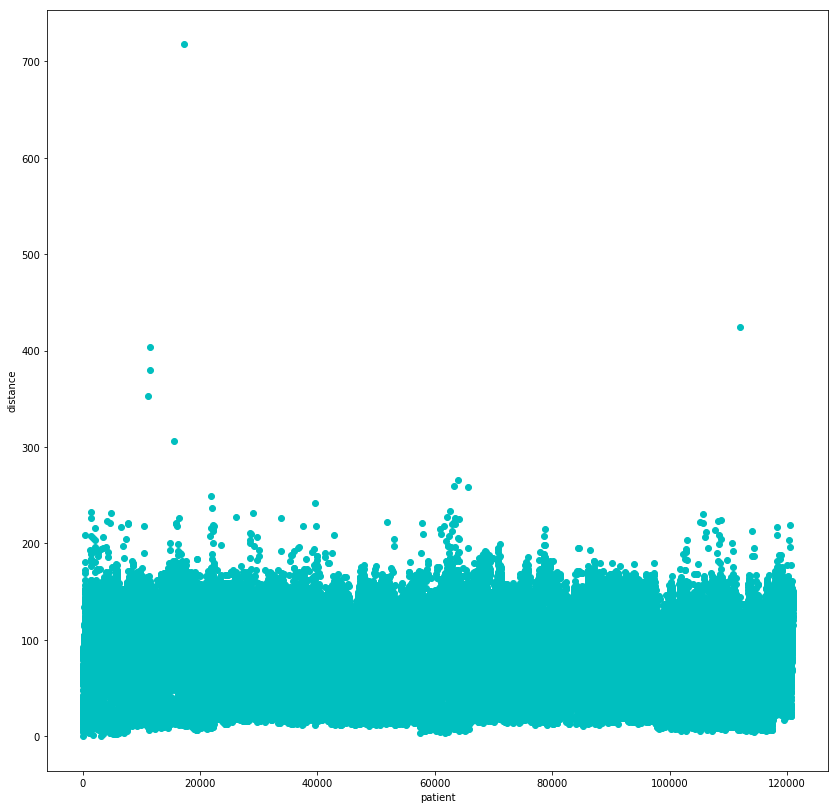

In [49]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
x = [1,2,3]
plt.plot(items_M,list_M_dist,'oc')
plt.xlabel("patient")
plt.ylabel("distance")
plt.show()

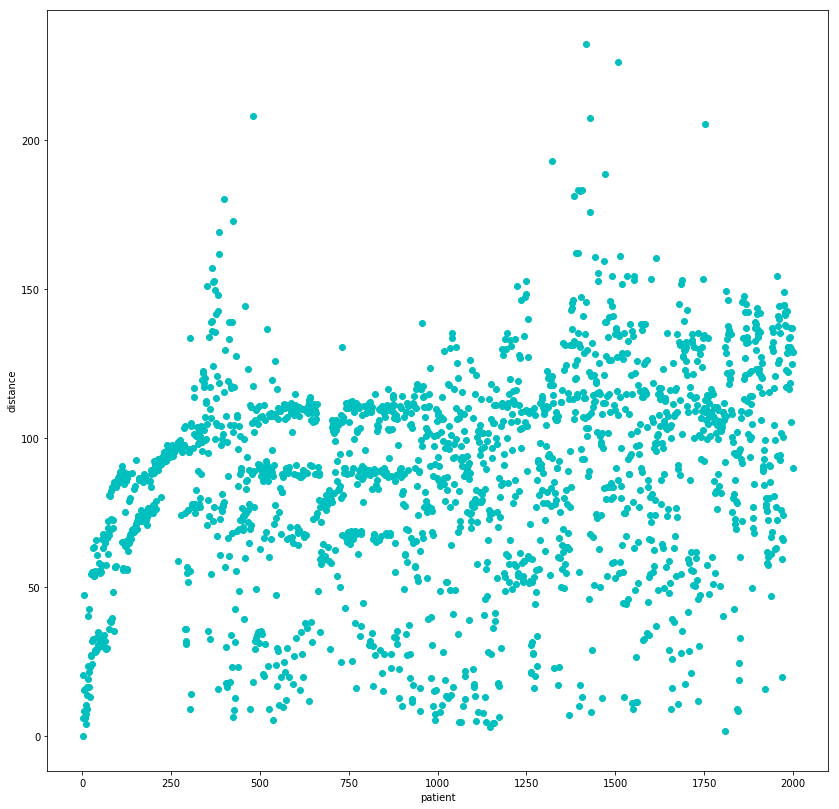

In [50]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
plt.plot(items_M[0:2000],list_M_dist[0:2000],'oc')
plt.xlabel("patient")
plt.ylabel("distance")
plt.show()

main_ram=4
main_cpu=5core
hdd=120GB